We are interested in identifying consistent patterns in OHLC (Open, High, Low, Close) financial charts that precede a specific price move.
Example of price move: a bar with a 5% positive change in price. 
We propose to analyze raw data without using specific technical indicators for a given timeframe. 
The process involves creating a function to identify the desired price move, selecting historical data based on the user-specified timeframe, exploring patterns before the move, using visualizations.
We will then be exploring machine learning models for automation, backtesting, and fine-tuning the approach for better results.

In [1]:
import pandas as pd
import requests
import json
import datetime

def fetch_ohlcv(symbol, interval, start_time, end_time):
    start_time = int(start_time.timestamp() * 1000) # Convert to milliseconds
    end_time = int(end_time.timestamp() * 1000) # Convert to milliseconds

    url = f"https://api.binance.com/api/v3/klines?symbol={symbol}&interval={interval}&startTime={start_time}&endTime={end_time}&limit=1000"

    raw_data = requests.get(url).text
    data = json.loads(raw_data)
    df = pd.DataFrame(data, columns=['open_time', 'open', 'high', 'low', 'close', 'volume', 'close_time', 'quote_asset_volume', 'trades', 'taker_buy_base', 'taker_buy_quote', 'ignored'])

    # Convert times to more readable format
    df['open_time'] = pd.to_datetime(df['open_time'], unit='ms')
    df['close_time'] = pd.to_datetime(df['close_time'], unit='ms')

        # Convert prices and volume to float
    df[['open', 'high', 'low', 'close', 'volume']] = df[['open', 'high', 'low', 'close', 'volume']].astype(float)

    df = df[['open_time', 'open', 'high', 'low', 'close', 'volume', 'close_time']]  # Keep only OHLCV data

    return df

In [2]:
start_time = datetime.datetime(2020, 1, 1, 00, 00, 00)  # January 1 2021 15:30:45
end_time = datetime.datetime(2023, 12, 31, 23, 59, 59)  # December 31 2021 23:59:59

# Loop to fetch data in the required range
full_data = pd.DataFrame()
while start_time < end_time:
    new_data = fetch_ohlcv('BTCUSDT', '4h', start_time, end_time)
    if not new_data.empty:
        full_data = pd.concat([full_data, new_data])
        # Set the start time for the next batch to be the close time of the last bar
        start_time = new_data.iloc[-1]['close_time'] 
    else:
        print(f"No data returned for time range {start_time} to {end_time}")
        break

#save raw data to data/raw folder

In [2]:
import json
import os

def fetch_ohlcv_multi(symbol_list, interval_list, start_time, end_time, save_folder='data/raw'):
    # Create a directory for storing data files
    os.makedirs(save_folder, exist_ok=True)

    for symbol in symbol_list:
        for interval in interval_list:
            current_save_path = os.path.join(save_folder, f'{symbol}_{interval}.json')

            # Check if data already exists for this pair and timeframe
            if os.path.exists(current_save_path):
                print(f"Data already exists for {symbol} - {interval}. Skipping...")
                continue

            # Initialize start time for each pair and interval
            current_start_time = start_time

            # Initialize an empty DataFrame for the current pair and interval
            full_data = pd.DataFrame()

            # Loop to fetch data in the required range
            while current_start_time < end_time:
                new_data = fetch_ohlcv(symbol, interval, current_start_time, end_time)
                
                if not new_data.empty:
                    full_data = pd.concat([full_data, new_data])
                    current_start_time = new_data.iloc[-1]['close_time']
                else:
                    print(f"No data returned for {symbol} - {interval} in the time range {current_start_time} to {end_time}")
                    break

            # Save the data to a JSON file
            full_data.to_json(current_save_path, orient='records', date_format='iso')
            print(f"Data saved for {symbol} - {interval} at {current_save_path}")

In [3]:
import os
import pandas as pd

def load_ohlcv_data(symbol_list, interval_list, load_folder='data/raw'):
    loaded_data = {}

    for symbol in symbol_list:
        for interval in interval_list:
            current_load_path = os.path.join(load_folder, f'{symbol}_{interval}.json')

            # Check if the file exists
            if os.path.exists(current_load_path):
                # Load the data from the JSON file
                loaded_data[f'{symbol}_{interval}'] = pd.read_json(current_load_path)
                print(f"Data loaded for {symbol} - {interval} from {current_load_path}")
            else:
                print(f"No data file found for {symbol} - {interval} at {current_load_path}")

    return loaded_data

In [20]:
# scrap and save data to json files
# Example Usage:
symbol_list = ['BTCUSDT', 'ETHBTC']
interval_list = ['5m']#,'1h', '4h', '1d']

start_time = datetime.datetime(2020, 1, 1, 0, 0, 0)
end_time = datetime.datetime(2023, 12, 31, 23, 59, 59)

fetch_ohlcv_multi(symbol_list, interval_list, start_time, end_time)

No data returned for BTCUSDT - 5m in the time range 2023-12-31 22:59:59.999000 to 2023-12-31 23:59:59
Data saved for BTCUSDT - 5m at data/raw\BTCUSDT_5m.json
No data returned for ETHBTC - 5m in the time range 2023-12-31 22:59:59.999000 to 2023-12-31 23:59:59
Data saved for ETHBTC - 5m at data/raw\ETHBTC_5m.json


In [4]:
# load data from json files
# Example Usage:
symbol_list = ['BTCUSDT', 'ETHBTC']
interval_list = ['5m','1h', '4h', '1d']

loaded_data = load_ohlcv_data(symbol_list, interval_list)

Data loaded for BTCUSDT - 5m from data/raw\BTCUSDT_5m.json
Data loaded for BTCUSDT - 1h from data/raw\BTCUSDT_1h.json
Data loaded for BTCUSDT - 4h from data/raw\BTCUSDT_4h.json
Data loaded for BTCUSDT - 1d from data/raw\BTCUSDT_1d.json
Data loaded for ETHBTC - 5m from data/raw\ETHBTC_5m.json
Data loaded for ETHBTC - 1h from data/raw\ETHBTC_1h.json
Data loaded for ETHBTC - 4h from data/raw\ETHBTC_4h.json
Data loaded for ETHBTC - 1d from data/raw\ETHBTC_1d.json


In [4]:
loaded_data

{'BTCUSDT_1h':                 open_time      open      high       low     close  \
 0     2019-12-31 23:00:00   7200.52   7206.29   7185.76   7195.23   
 1     2020-01-01 00:00:00   7195.24   7196.25   7175.46   7177.02   
 2     2020-01-01 01:00:00   7176.47   7230.00   7175.71   7216.27   
 3     2020-01-01 02:00:00   7215.52   7244.87   7211.41   7242.85   
 4     2020-01-01 03:00:00   7242.66   7245.00   7220.00   7225.01   
 ...                   ...       ...       ...       ...       ...   
 35027 2023-12-31 18:00:00  42616.24  42719.80  42538.37  42656.70   
 35028 2023-12-31 19:00:00  42656.69  42695.44  42586.91  42619.04   
 35029 2023-12-31 20:00:00  42619.04  42680.36  42504.56  42558.01   
 35030 2023-12-31 21:00:00  42558.02  42670.44  42520.72  42520.72   
 35031 2023-12-31 22:00:00  42520.73  42591.10  42056.00  42257.88   
 
             volume              close_time  
 0       521.978397 2019-12-31 23:59:59.999  
 1       511.814901 2020-01-01 00:59:59.999  
 2    

In [5]:
import mplfinance as mpf
import matplotlib.pyplot as plt


def plot_candlestick(data, symbol, interval):

    df = pd.DataFrame(data)
    df['open_time'] = pd.to_datetime(df['open_time'])
    df.set_index('open_time', inplace=True)

    # Plotting candlestick chart with volume
    mpf.plot(df, type='candle', style='charles', volume=True, title=f'Candlestick Chart with Volume - {symbol} - {interval}')
    
    plt.show()

c:\Projects\22-CryptoGPT\venv\Lib\site-packages\mplfinance\_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


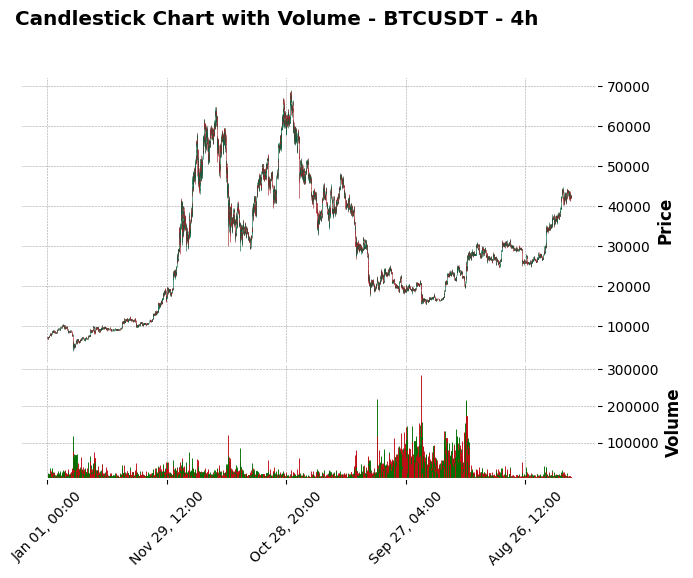

In [6]:
# Example Usage:
# Assuming loaded_data is a dictionary containing DataFrames for each pair and interval
selected_symbol = 'BTCUSDT'
selected_interval = '4h'

selected_data = loaded_data.get(f'{selected_symbol}_{selected_interval}')

if selected_data is not None:
    plot_candlestick(selected_data, selected_symbol, selected_interval)
else:
    print(f"No data found for {selected_symbol} - {selected_interval}")

In [7]:
selected_data

,open_time,open,high,low,close,volume,close_time
0,2020-01-01 00:00:00,7195.24,7245.00,7175.46,7225.01,2833.749180,2020-01-01 03:59:59.999
1,2020-01-01 04:00:00,7225.00,7236.27,7199.11,7209.83,2061.295051,2020-01-01 07:59:59.999
2,2020-01-01 08:00:00,7209.83,7237.73,7180.00,7197.20,3166.654361,2020-01-01 11:59:59.999
3,2020-01-01 12:00:00,7197.20,7255.00,7196.15,7234.19,3492.537459,2020-01-01 15:59:59.999
4,2020-01-01 16:00:00,7234.20,7249.99,7214.00,7229.48,2980.583291,2020-01-01 19:59:59.999
...,...,...,...,...,...,...,...
8760,2023-12-31 04:00:00,42175.99,42693.00,42156.09,42537.10,3915.107280,2023-12-31 07:59:59.999
8761,2023-12-31 08:00:00,42537.10,42899.00,42369.15,42518.36,4626.120980,2023-12-31 11:59:59.999
8762,2023-12-31 12:00:00,42518.36,42646.27,42352.76,42457.17,3403.651760,2023-12-31 15:59:59.999
8763,2023-12-31 16:00:00,42457.17,42719.80,42436.47,42619.04,3036.191660,2023-12-31 19:59:59.999


In [7]:
import pandas as pd
import mplfinance as mpf
import matplotlib.pyplot as plt

class OccurrenceFinder:
    def __init__(self, df):
        self.df = df
        self.samples=[]

    def _positive_percentage_change(self):
        return self.df[self.df['close'].pct_change() > 0].index

    def _custom_criteria(self, threshold=0.05):
        return self.df[self.df['close'] > self.df['open'] * (1 + threshold)].index
    
    def _three_consecutive_increasing_returns(self):
        # Calculate percentage change for each bar
        percentage_change = self.df['close'].pct_change()

        # Find indices where three consecutive bars have increasing returns
        occurrences = []
        for i in range(2, len(percentage_change)):
            if percentage_change[i-1] > percentage_change[i - 2] and percentage_change[i] > percentage_change[i - 1] and percentage_change[i - 2] > 0:
                occurrences.append(self.df.index[i])

        return occurrences

    def available_moves(self):
        return ['positive_percentage_change', 'custom_criteria', 'three_consecutive_increasing_returns']

    def find_occurrences(self, move_type, **kwargs):
        if move_type == 'positive_percentage_change':
            return self._positive_percentage_change()

        elif move_type == 'custom_criteria':
            threshold = kwargs.get('threshold', 0.05)
            return self._custom_criteria(threshold)
        
        elif move_type == 'three_consecutive_increasing_returns':
            return self._three_consecutive_increasing_returns()

        else:
            raise ValueError(f"Unsupported move type: {move_type}")

    def plot_occurrence_bars(self, move_type, max_window=10, **kwargs):
        """
        Extracts and plots the previous bars for each identified occurrence.

        Parameters:
        - move_type (str): The type of move to search for.
        - max_window (int): Number of previous bars to extract.
        - **kwargs: Additional parameters for move criteria.

        Returns:
        - None
        """
        occurrence_indices = self.find_occurrences(move_type, **kwargs)
        print(f"Occurrences for {move_type} at indices: {occurrence_indices}")


        for idx in occurrence_indices:
            start_idx = max(0, idx - max_window)
            selected_bars = self.df.iloc[start_idx:idx + 1]
            self.generate_samples(selected_bars)

            # Plot the selected bars
            self._plot_selected_bars(selected_bars, move_type, idx)

    def _plot_selected_bars(self, selected_bars, move_type, occurrence_idx):
        selected_bars['open_time'] = pd.to_datetime(selected_bars['open_time'])
        selected_bars.set_index('open_time', inplace=True)

        # Plotting candlestick chart with volume
        mpf.plot(selected_bars, type='candle', style='charles', volume=True, title=f'Candlestick Chart for Occurrence - {move_type} - Index: {occurrence_idx}',
                 ylabel='Price', ylabel_lower='Volume', figsize=(8, 8))

        plt.show()

    def generate_samples(self,df):
        # Normalize the prices
        max_price = df[['open', 'high', 'low', 'close']].max().max()
        min_price = df[['open', 'high', 'low', 'close']].min().min()

        for column in ['open', 'high', 'low', 'close']:
            #df[column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
            df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)


        # Normalize Volume
        df['volume_norm'] = (df['volume'] - df['volume'].min()) / (df['volume'].max() - df['volume'].min())
        
        self.samples.append(df)

    


Available Move Types: ['positive_percentage_change', 'custom_criteria', 'three_consecutive_increasing_returns']
Occurrences for three_consecutive_increasing_returns at indices: [24, 69, 97, 108, 141, 148, 249, 287, 445, 470, 471, 513, 514, 539, 554, 573, 640, 650, 713, 714, 715, 716, 717, 727, 777, 805, 947, 1042, 1083, 1084, 1212, 1227, 1239, 1278, 1304, 1455, 1456, 1543, 1544, 1604, 1616, 1645, 1706, 1766, 1801, 1844, 1856, 1928, 1929, 1994, 2039, 2040, 2097, 2102, 2152, 2176, 2183, 2361, 2362, 2444, 2492, 2563, 2576, 2577, 2597, 2614, 2801, 2843, 2942, 2954, 3162, 3257, 3270, 3271, 3318, 3402, 3431, 3460, 3540, 3599, 3682, 3732, 3740, 3796, 3859, 3909, 3921, 4027, 4060, 4061, 4155, 4163, 4178, 4325, 4335, 4375, 4568, 4569, 4713, 4734, 4744, 4778, 4827, 4839, 4963, 4983, 5031, 5124, 5249, 5302, 5324, 5340, 5404, 5506, 5511, 5568, 5700, 5714, 5729, 5736, 5798, 5955, 5971, 6008, 6038, 6039, 6074, 6117, 6152, 6215, 6414, 6435, 6446, 6460, 6464, 6539, 6582, 6633, 6653, 6693, 6694, 6848, 

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

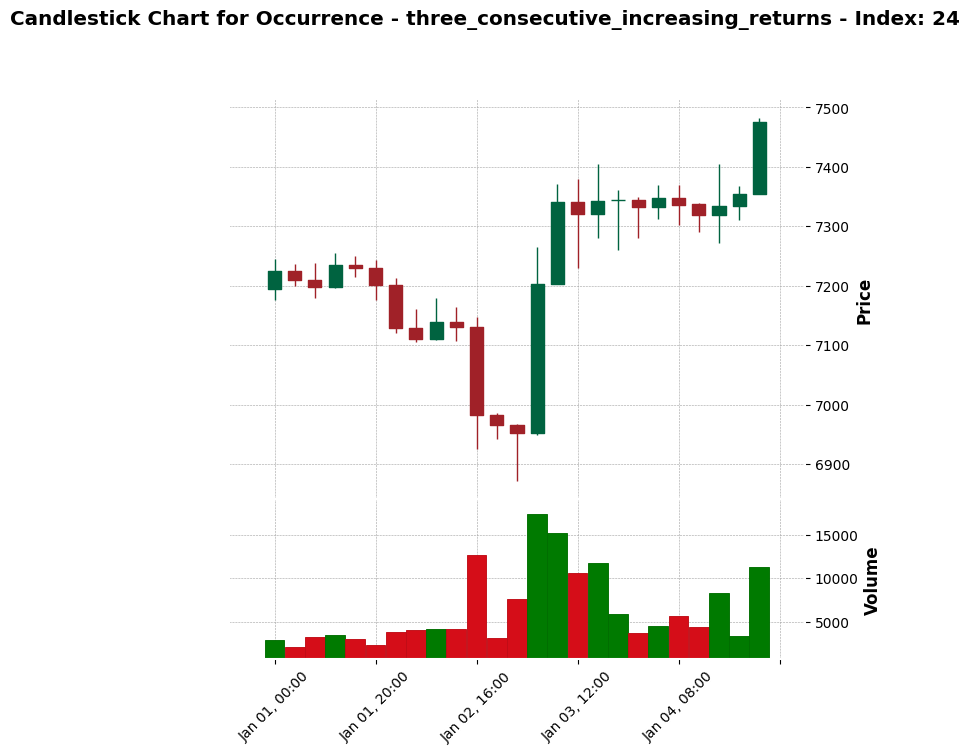

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

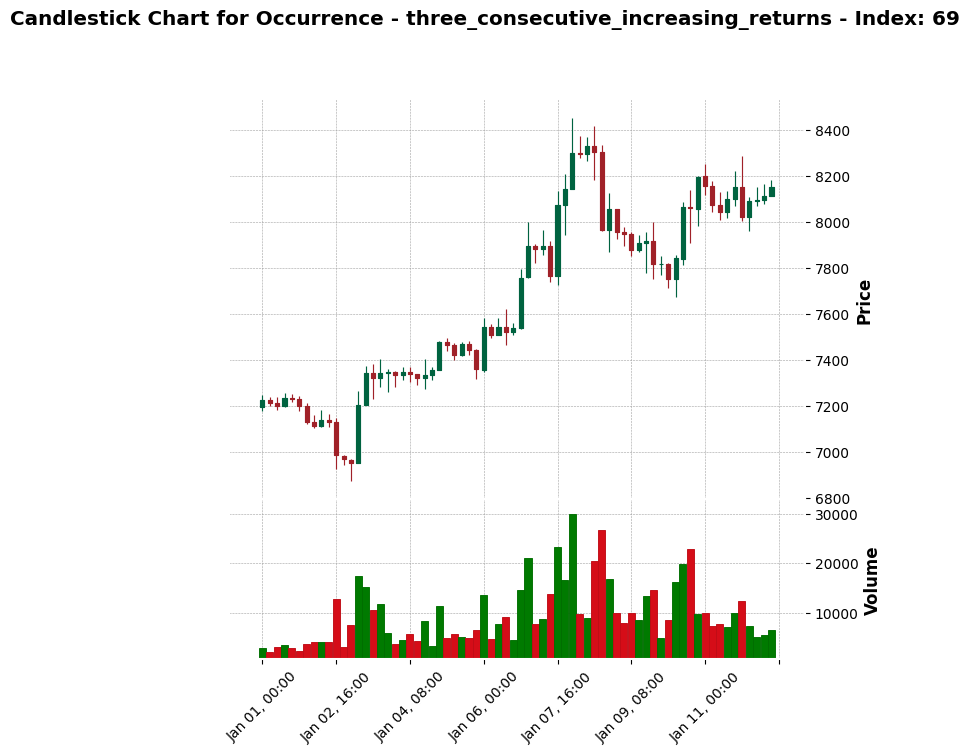

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

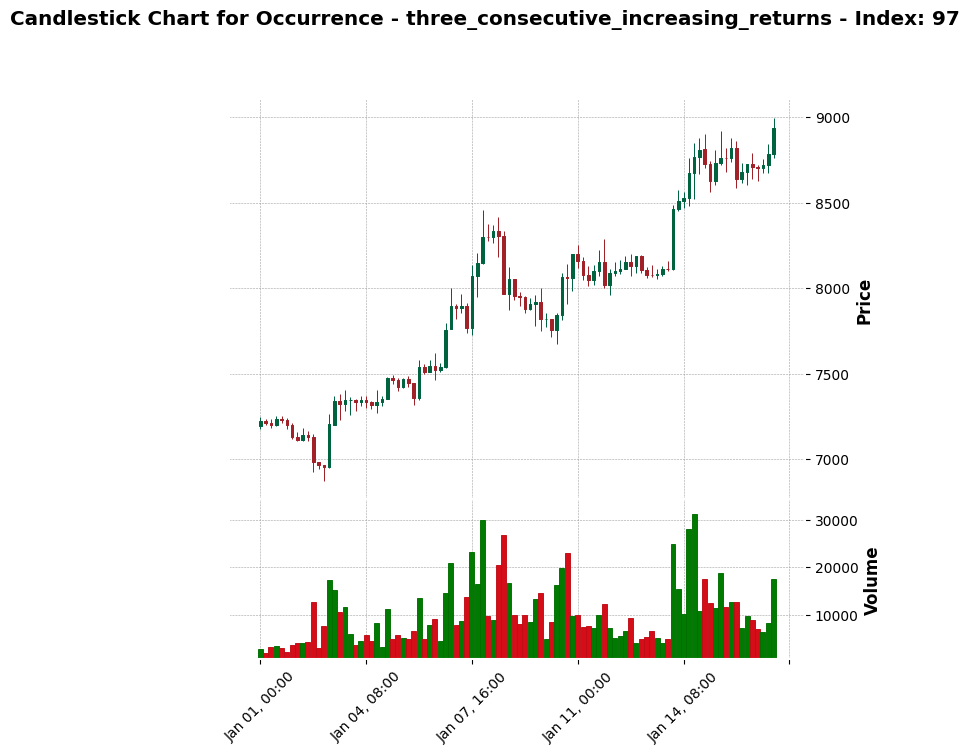

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

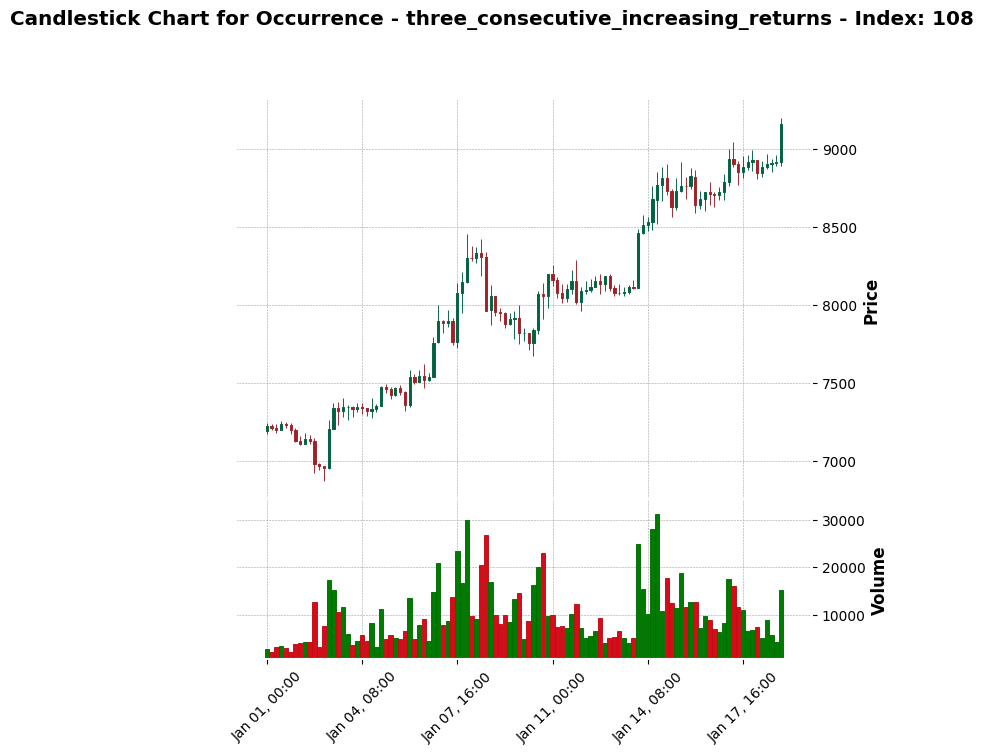

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

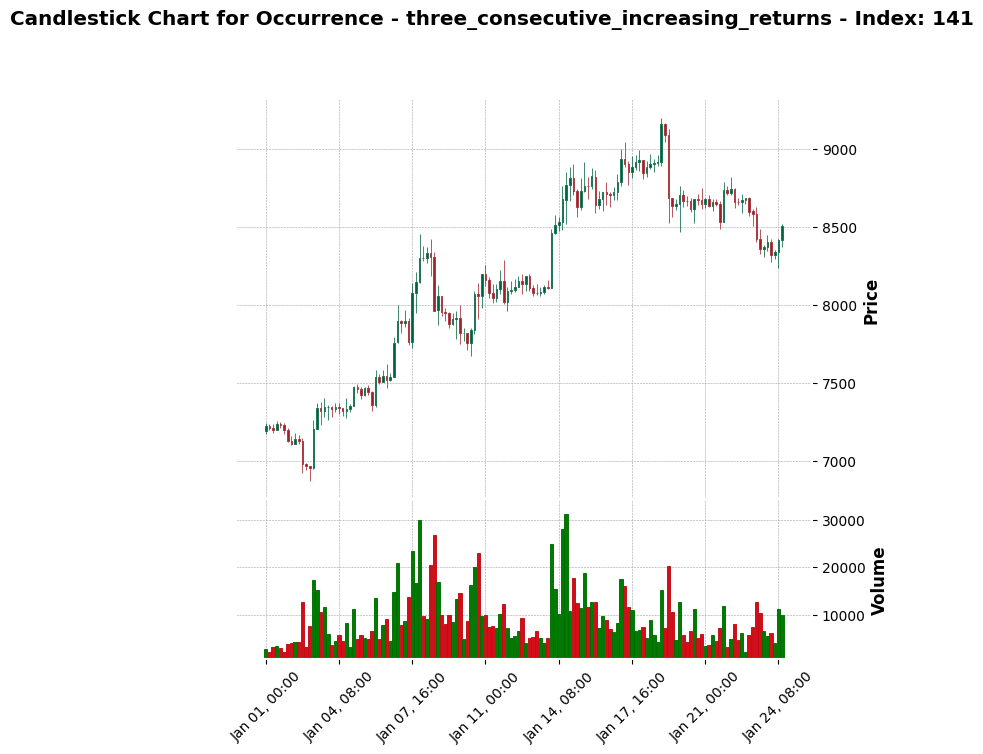

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

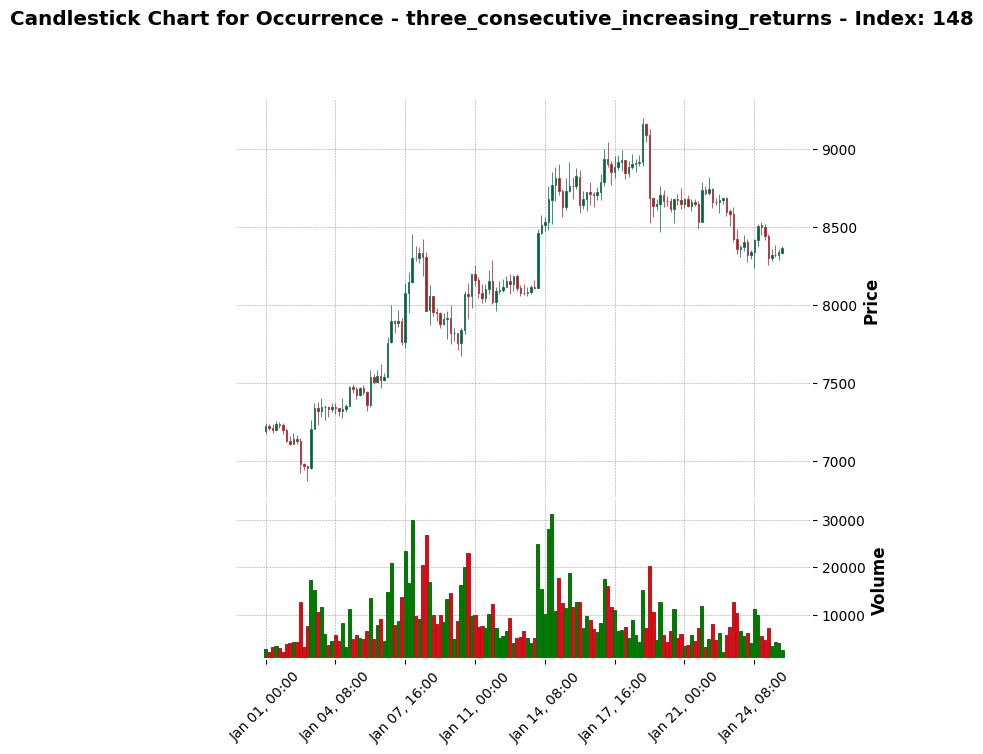

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

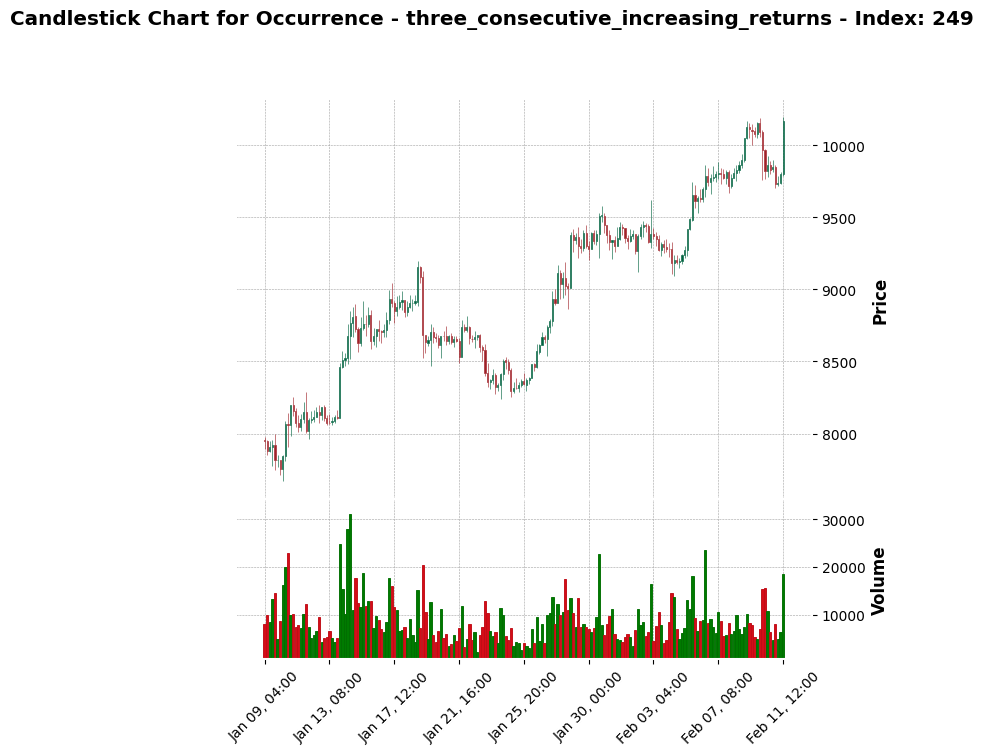

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

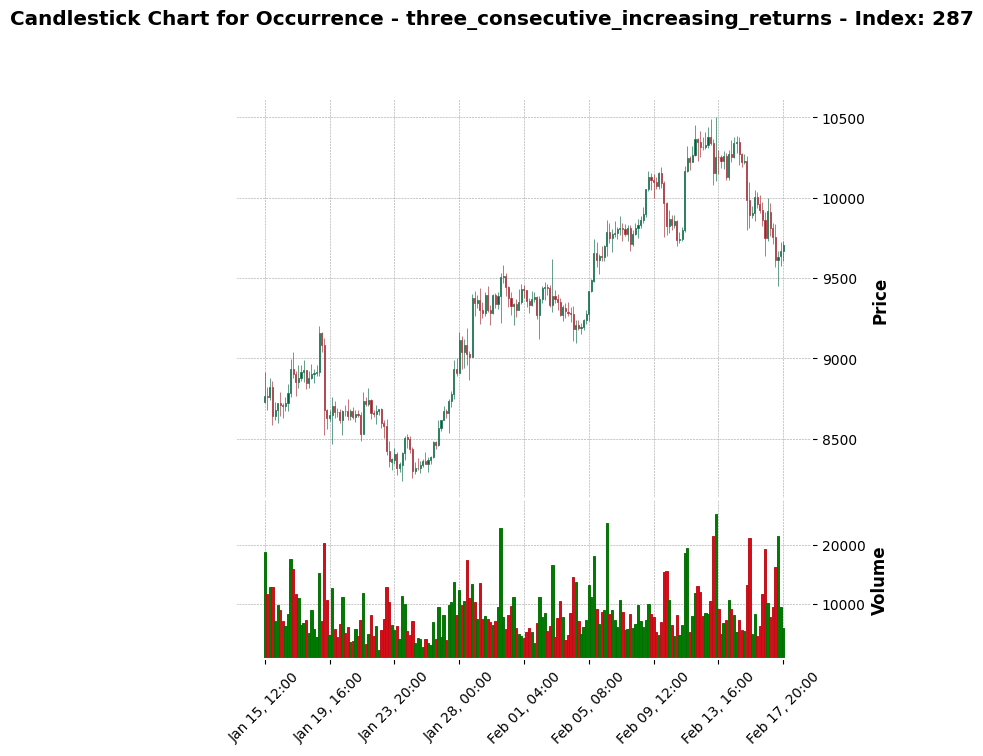

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

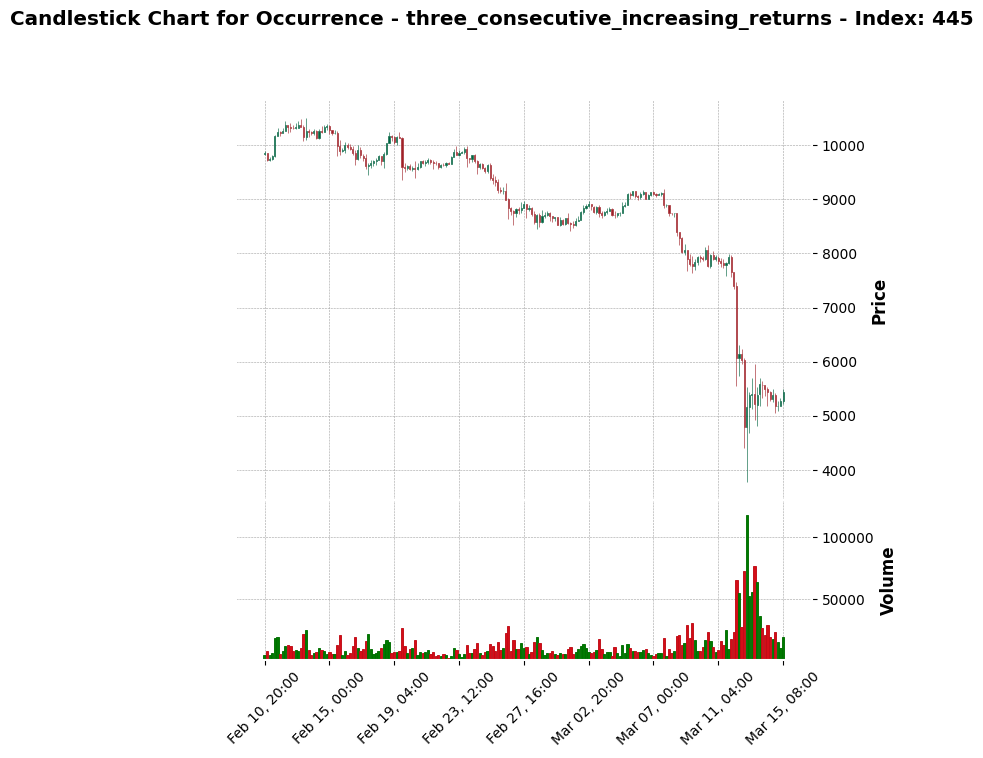

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

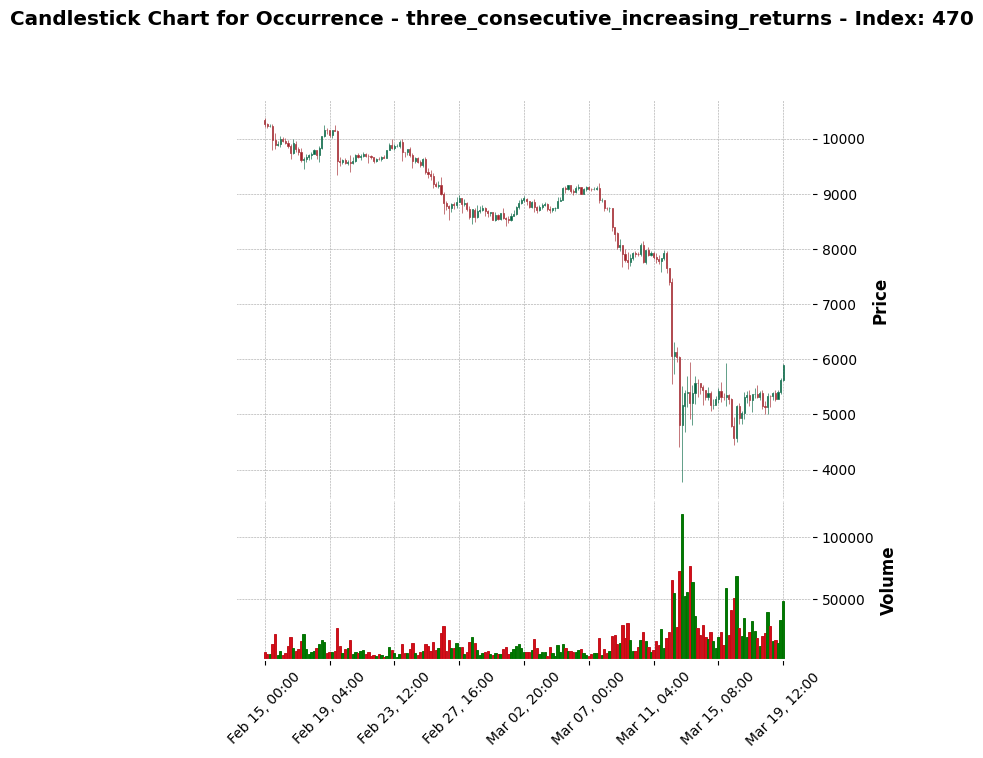

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

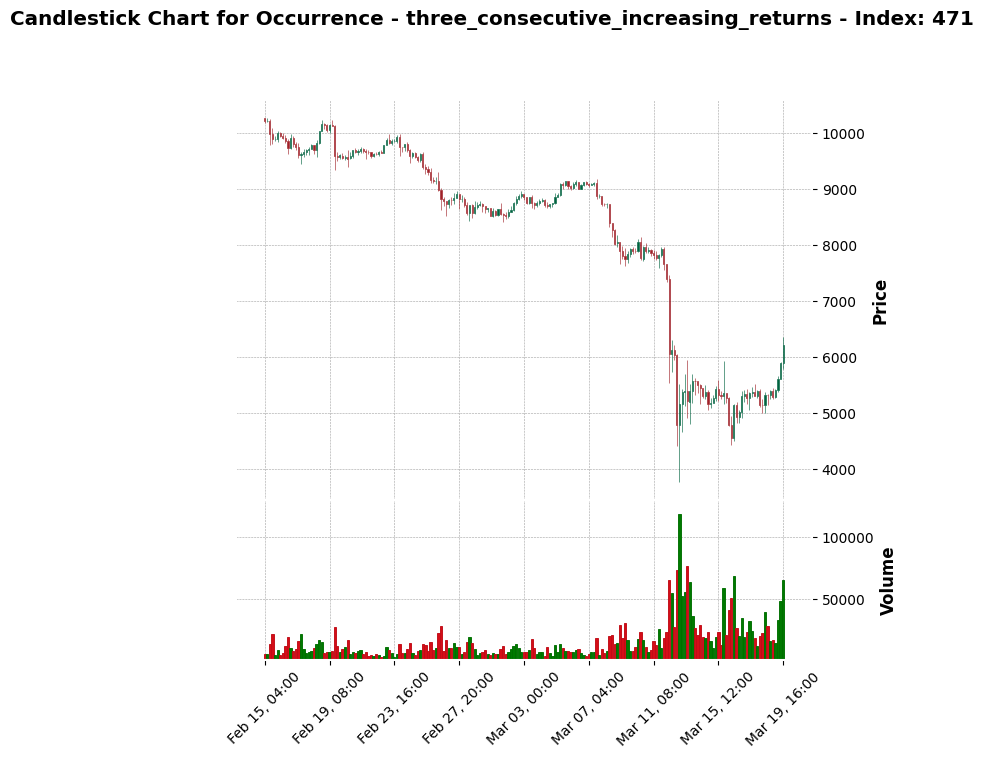

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

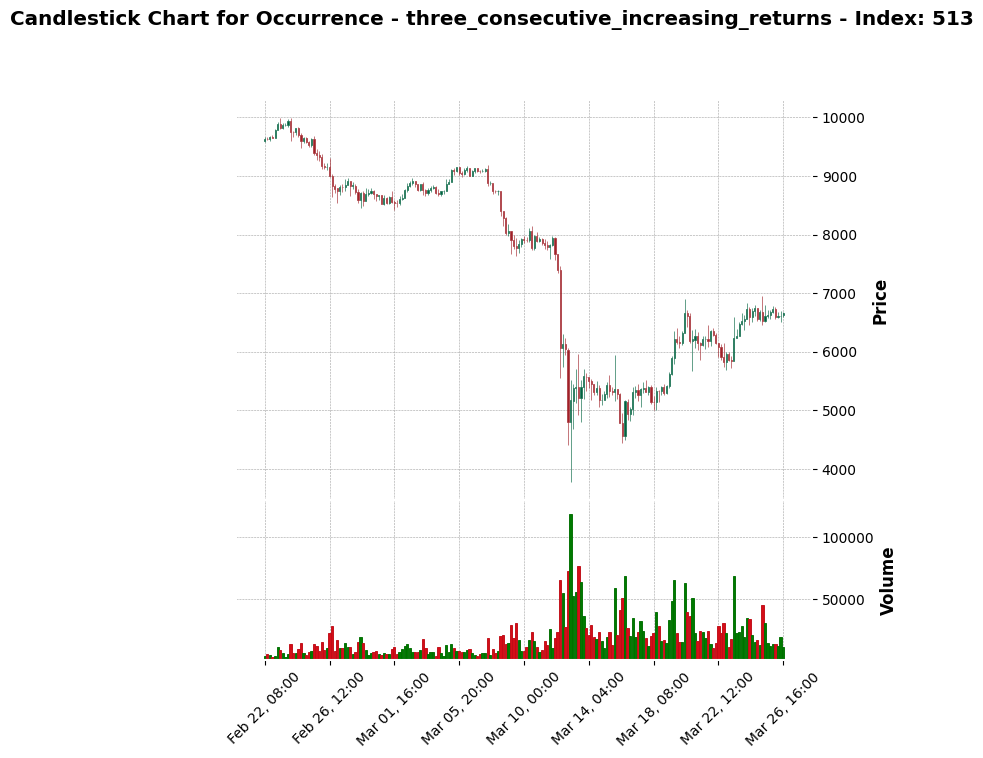

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

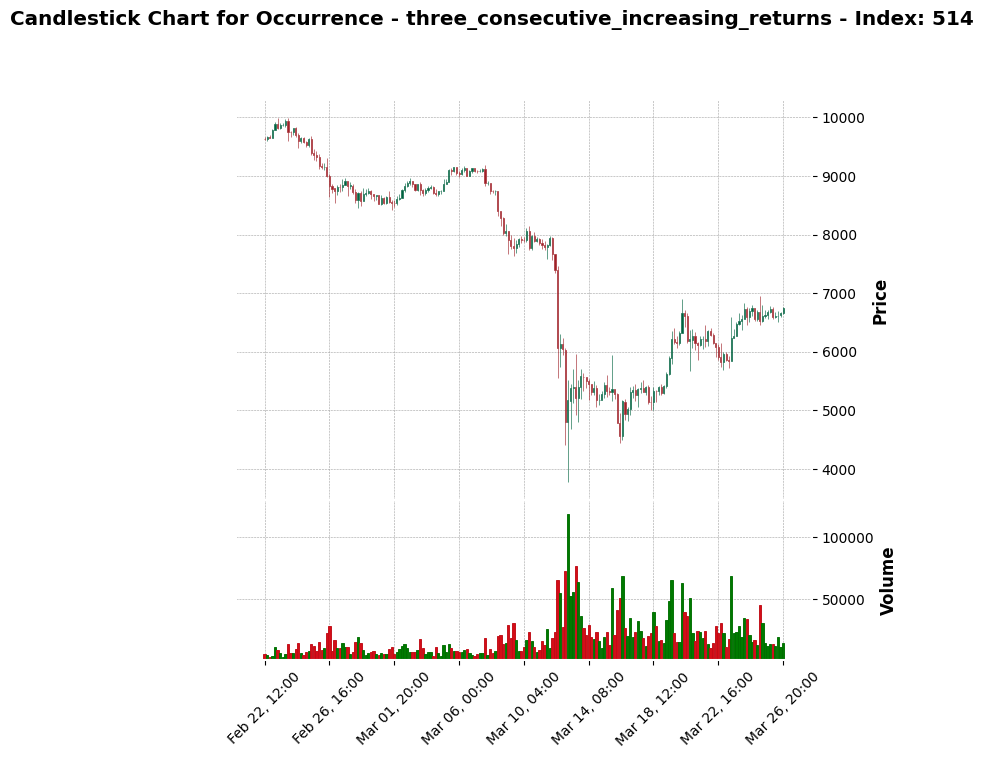

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

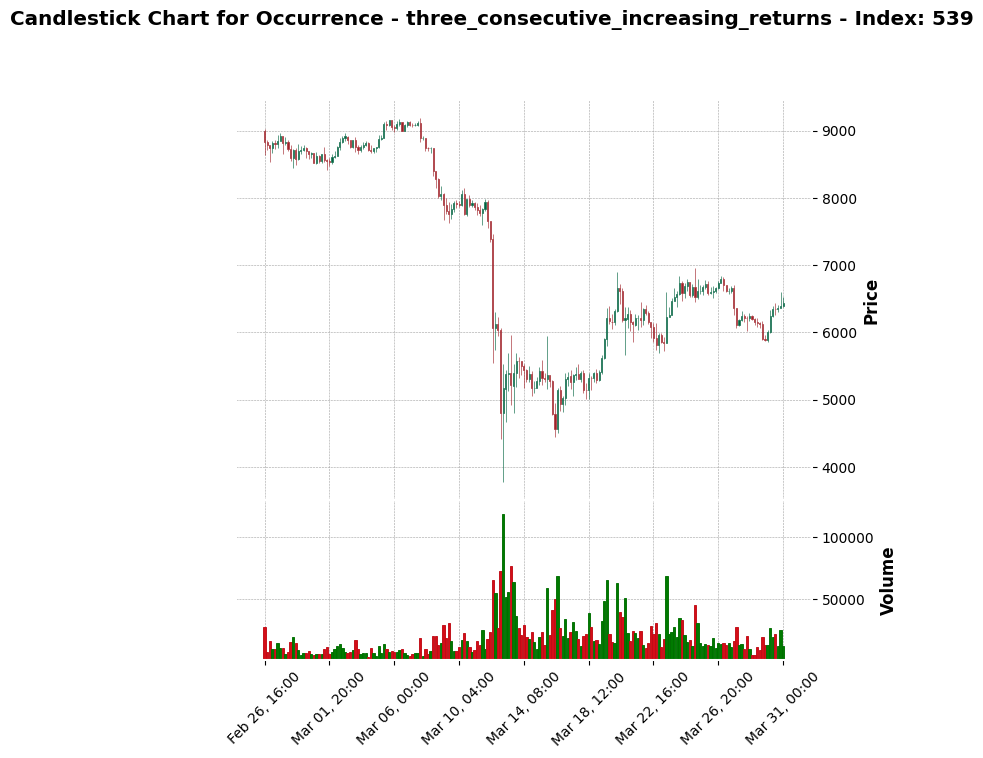

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

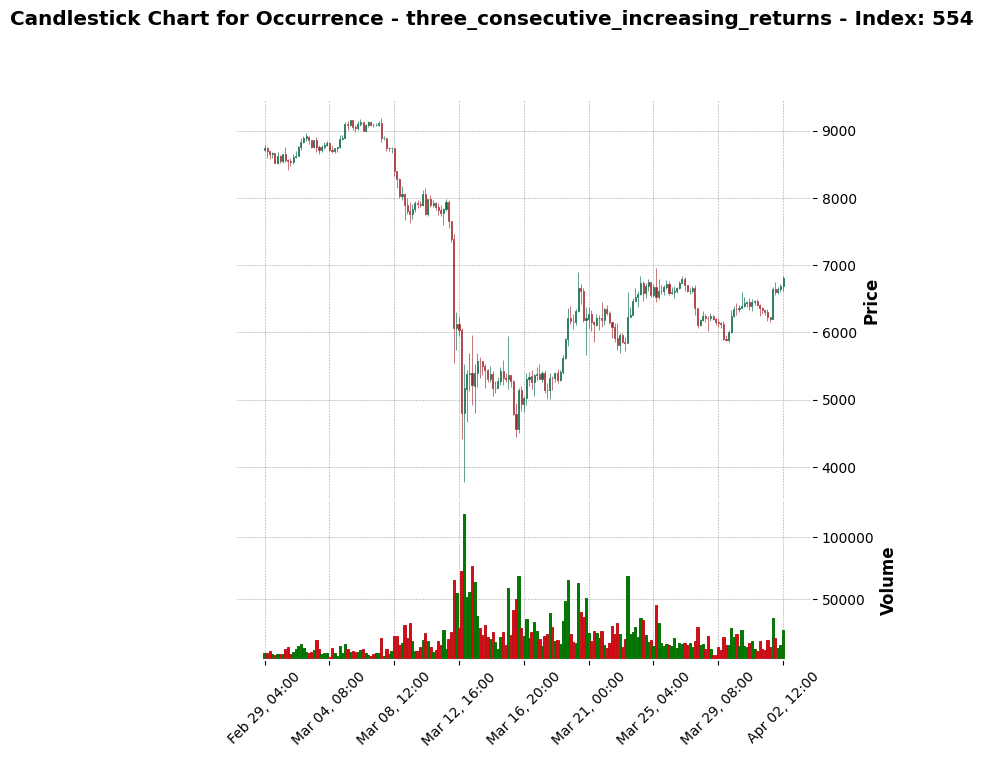

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

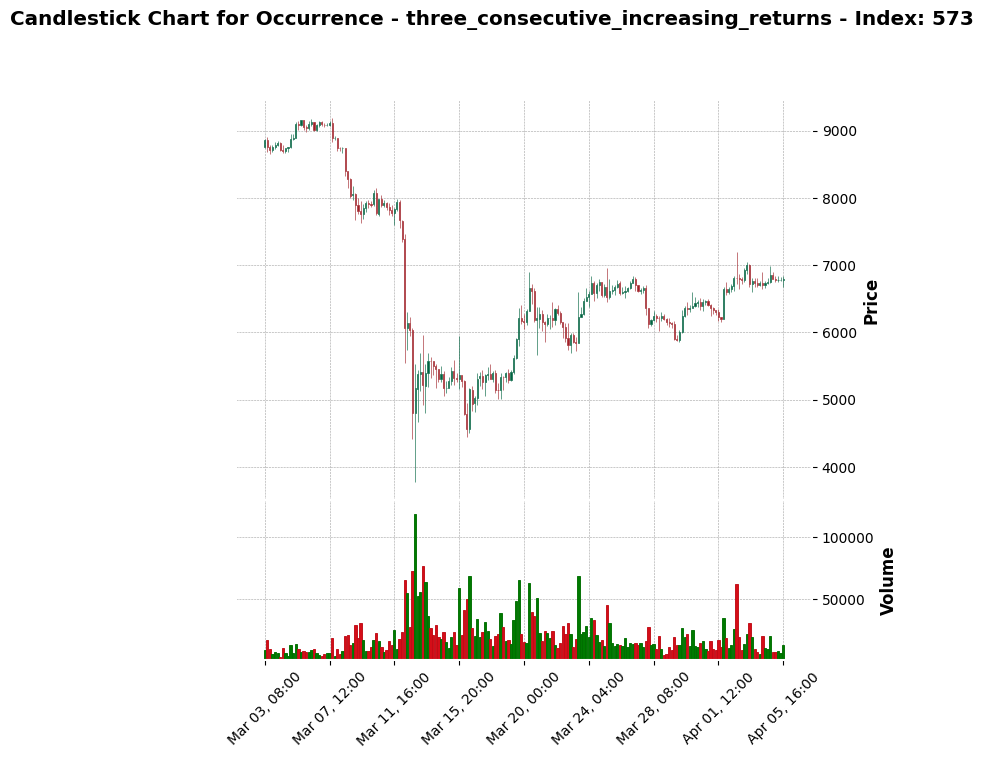

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

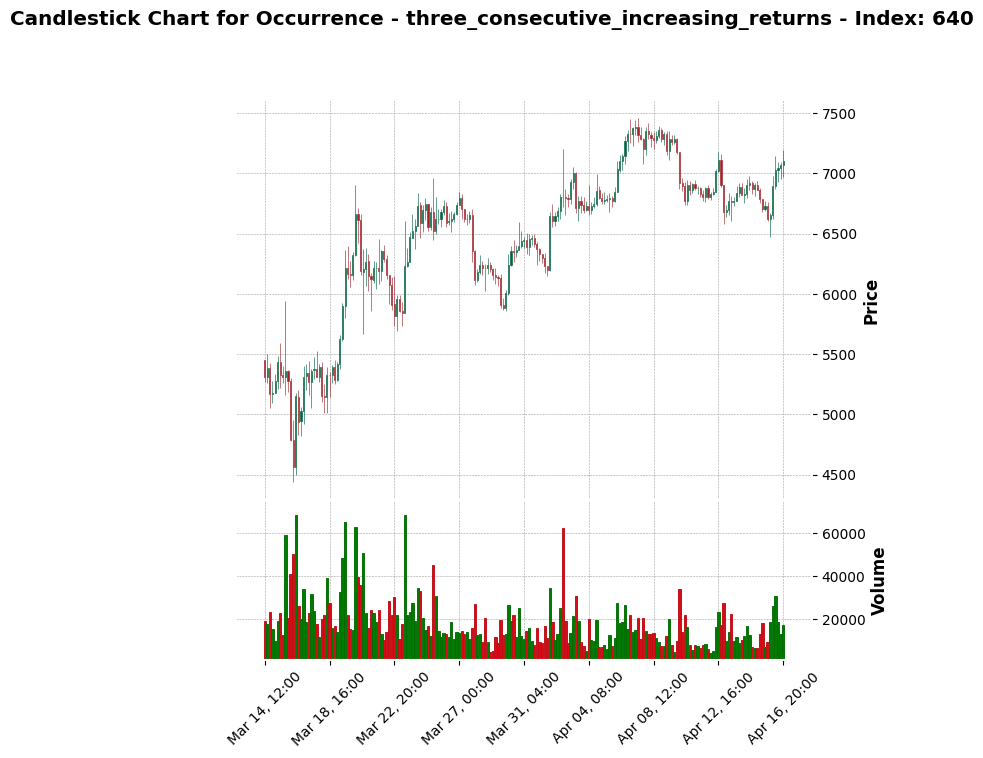

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

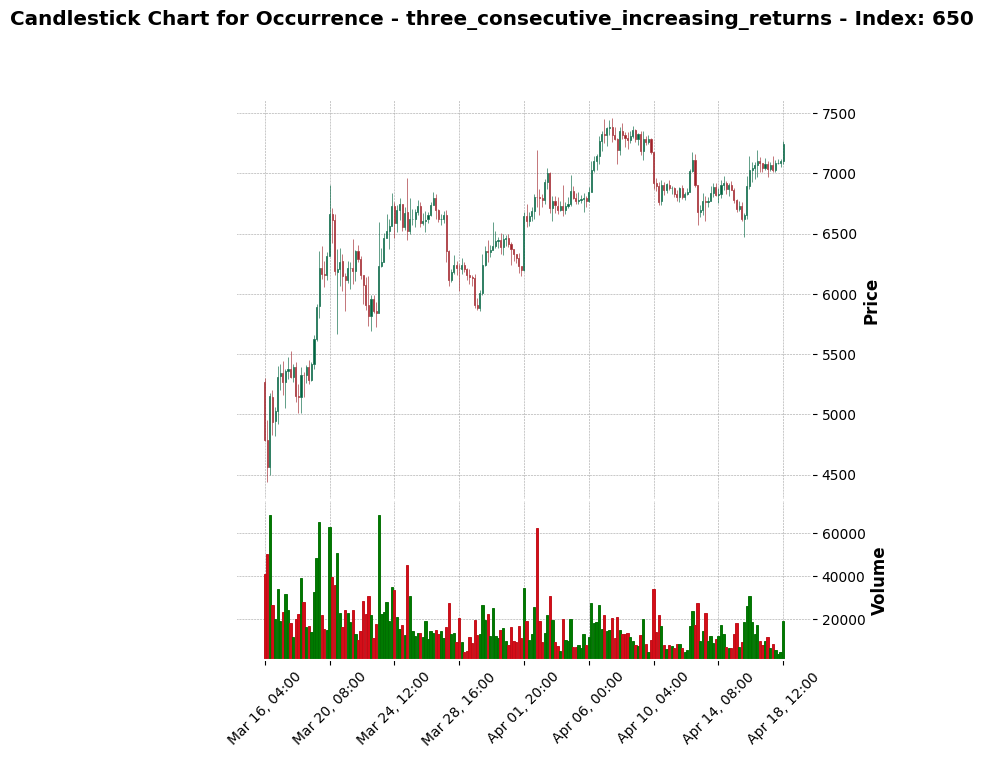

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

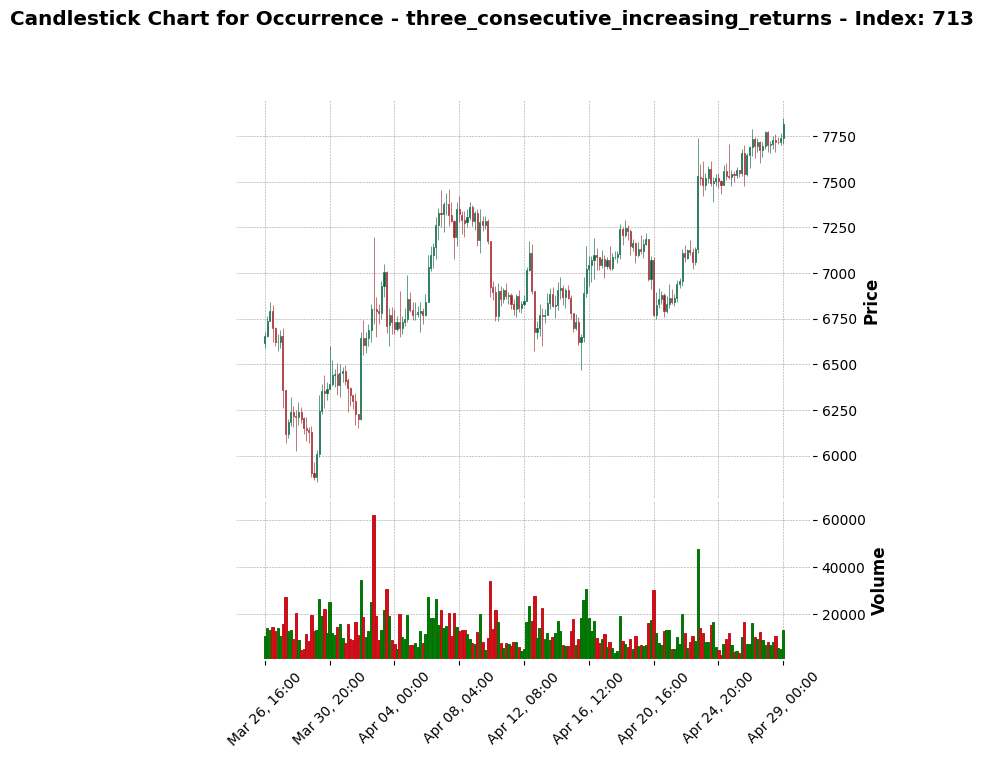

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

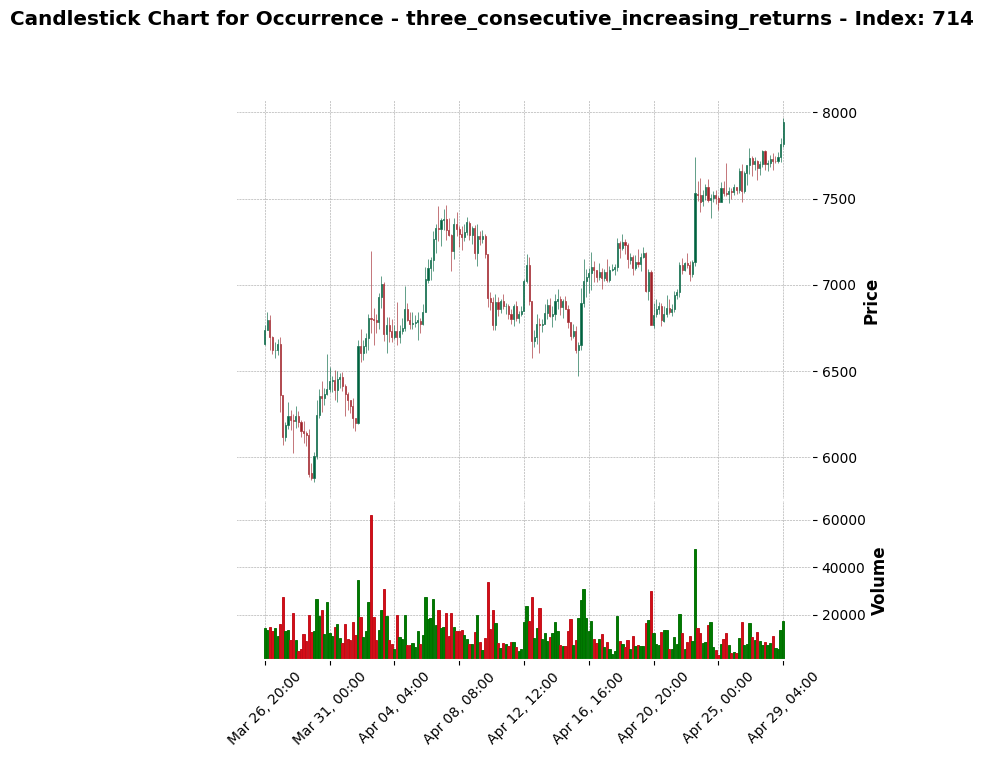

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

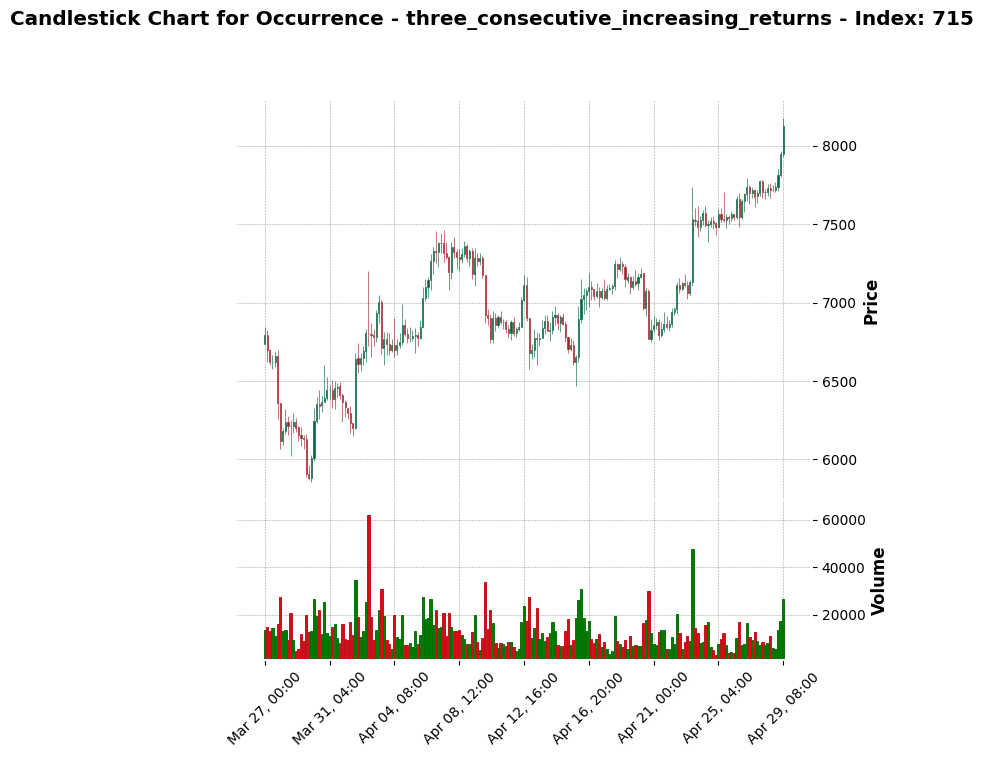

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

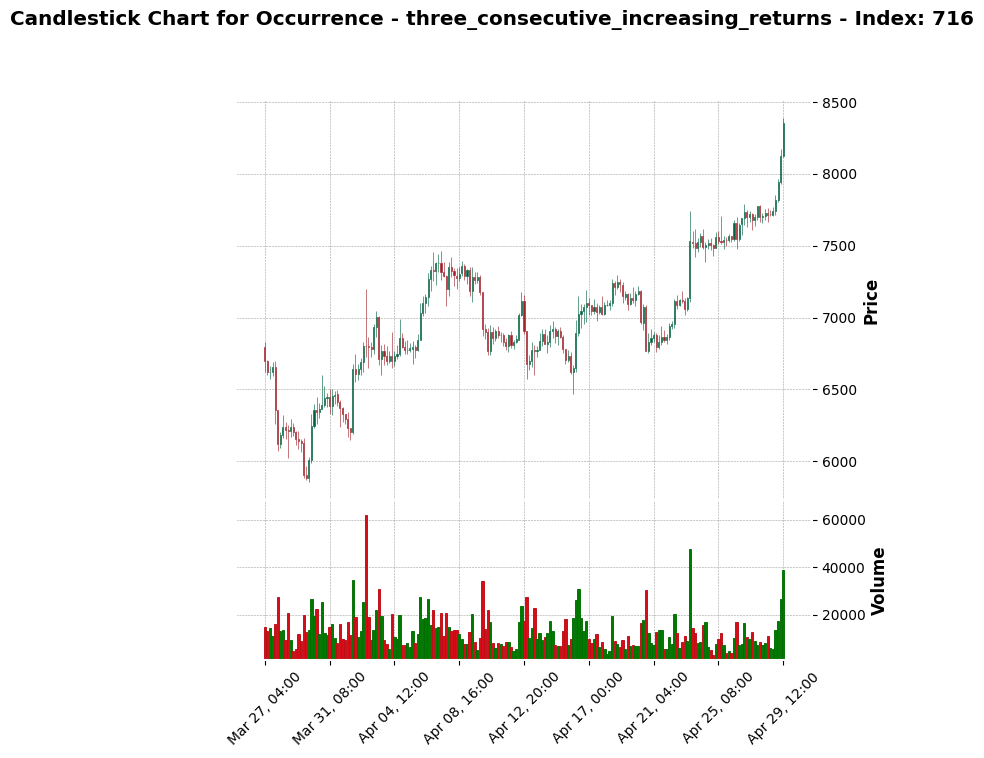

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

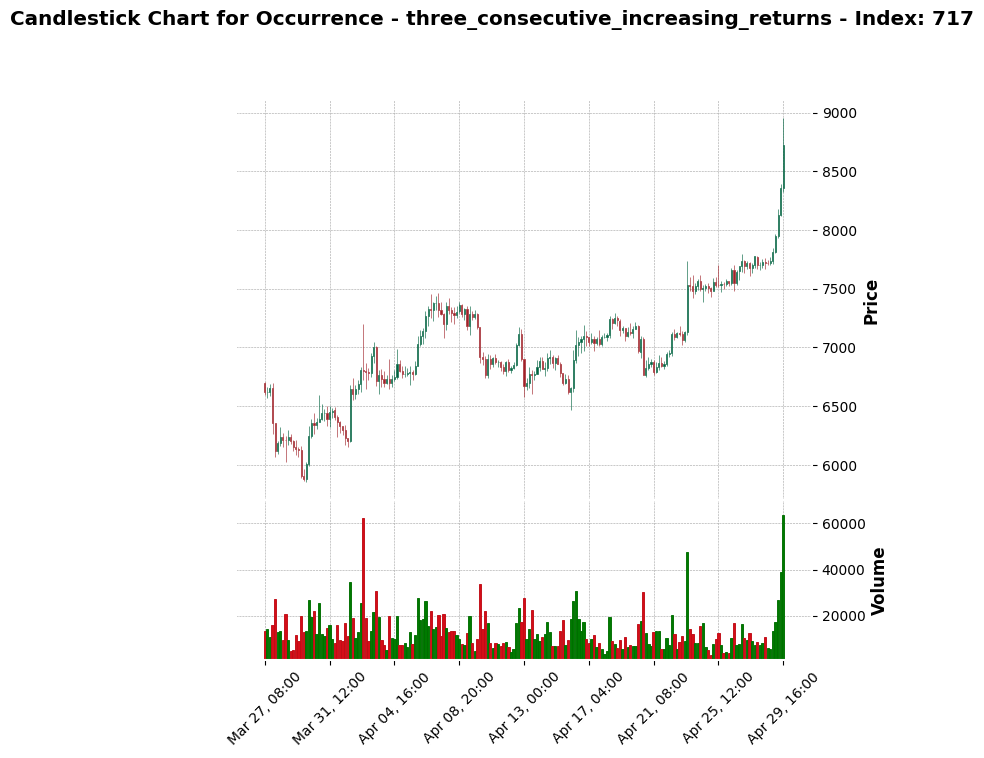

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

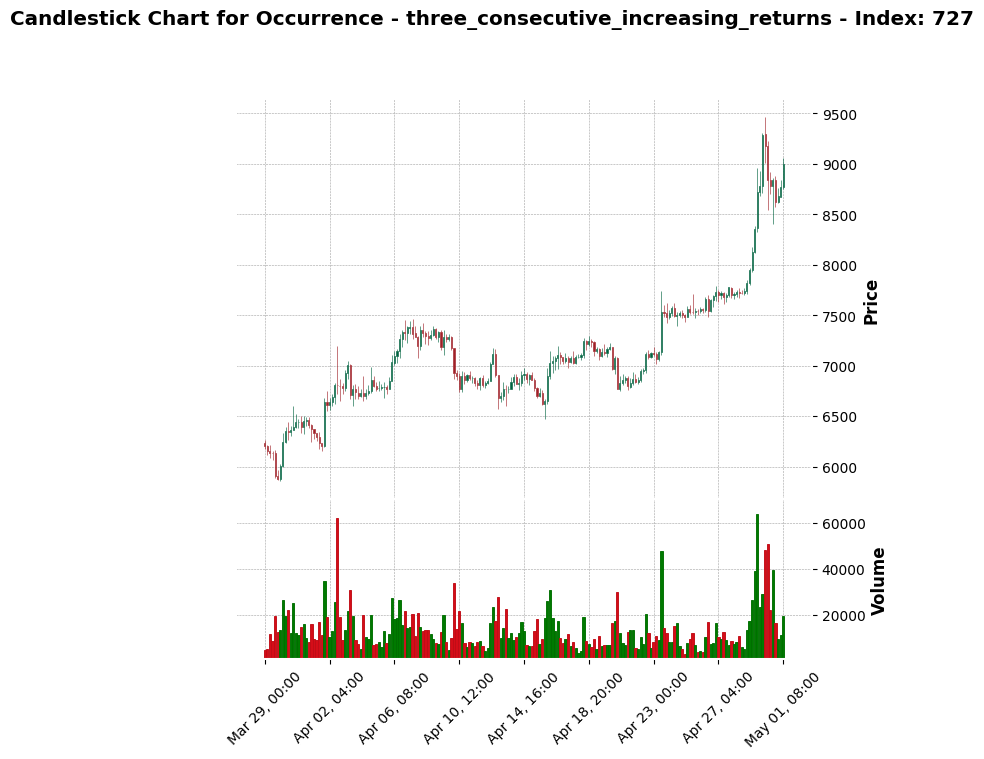

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

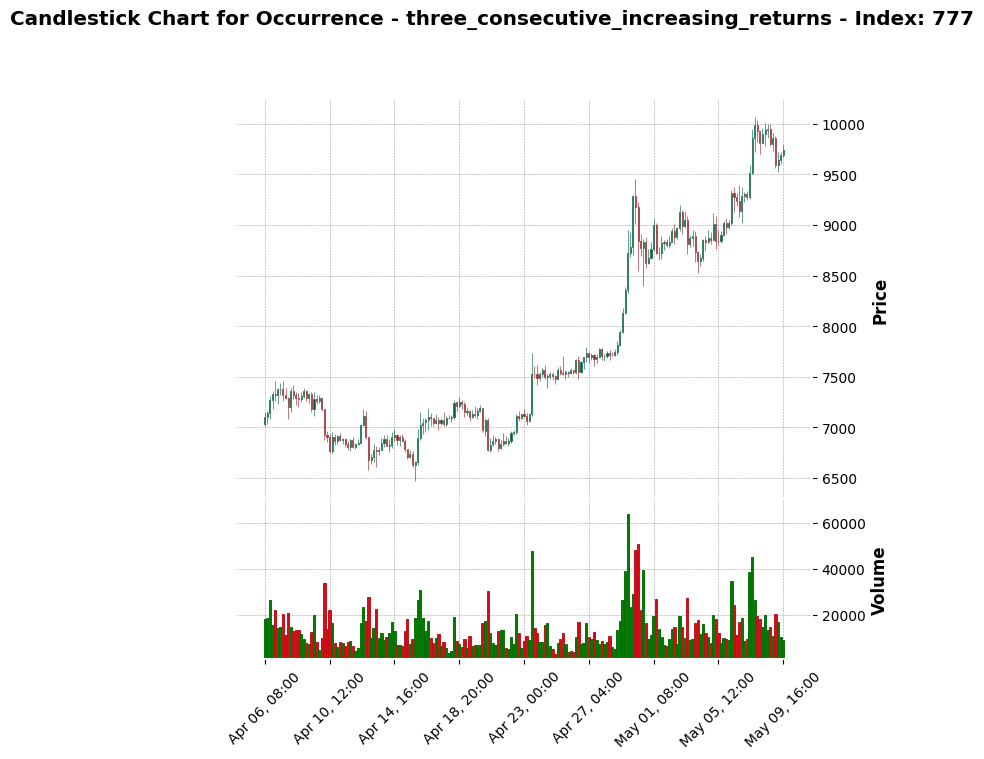

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

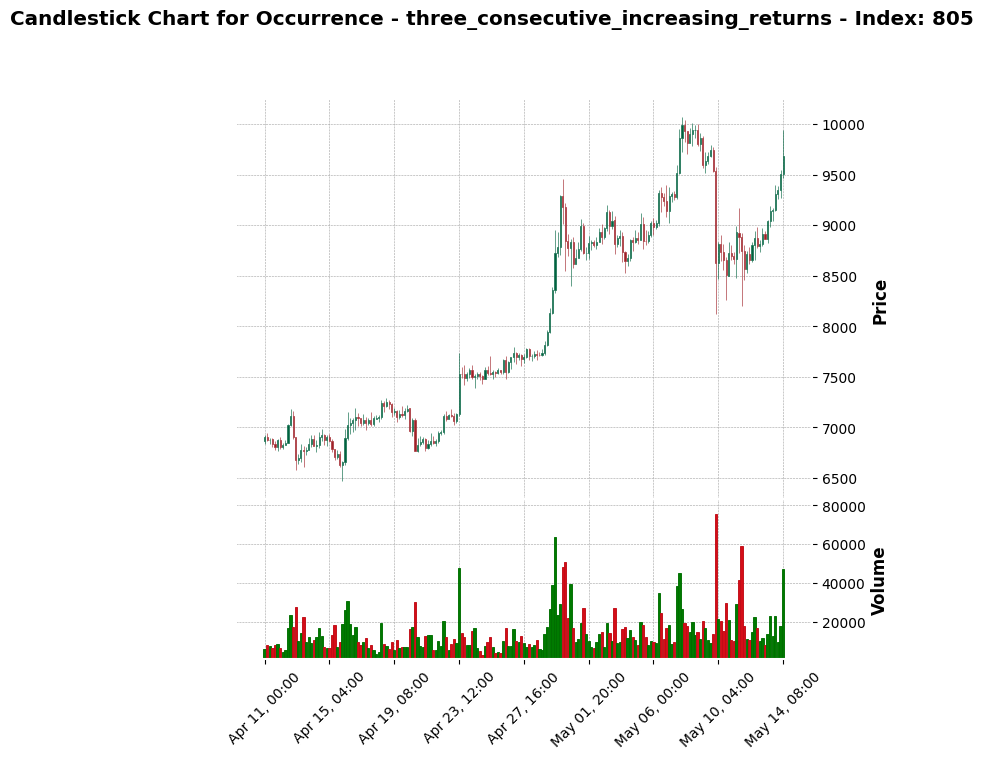

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

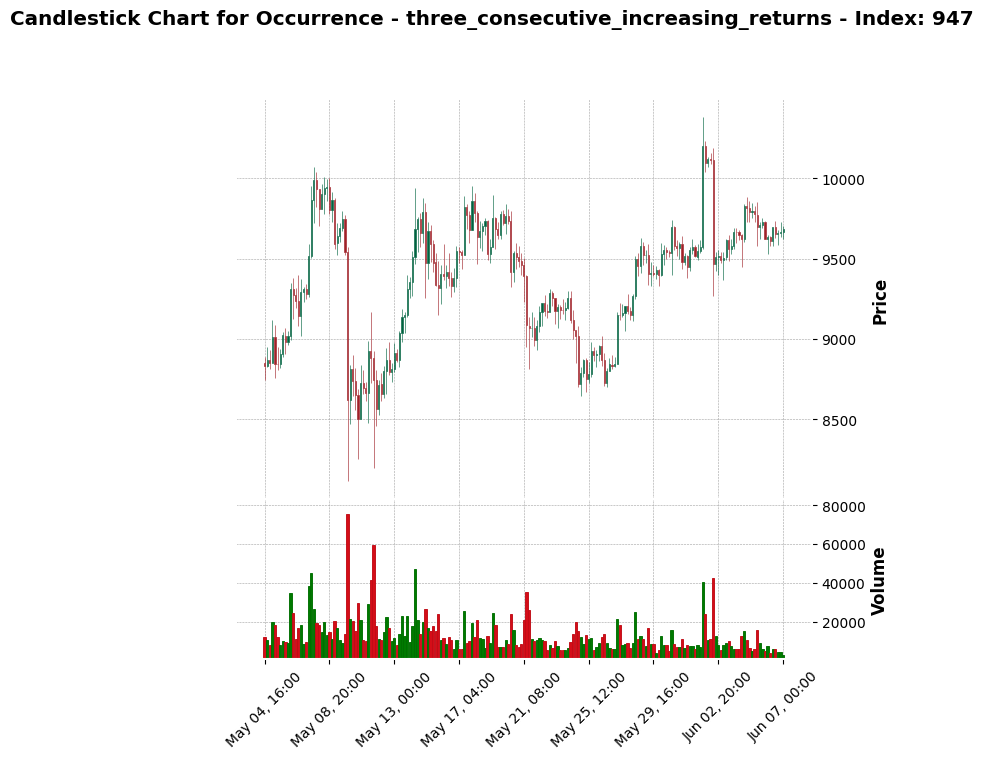

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

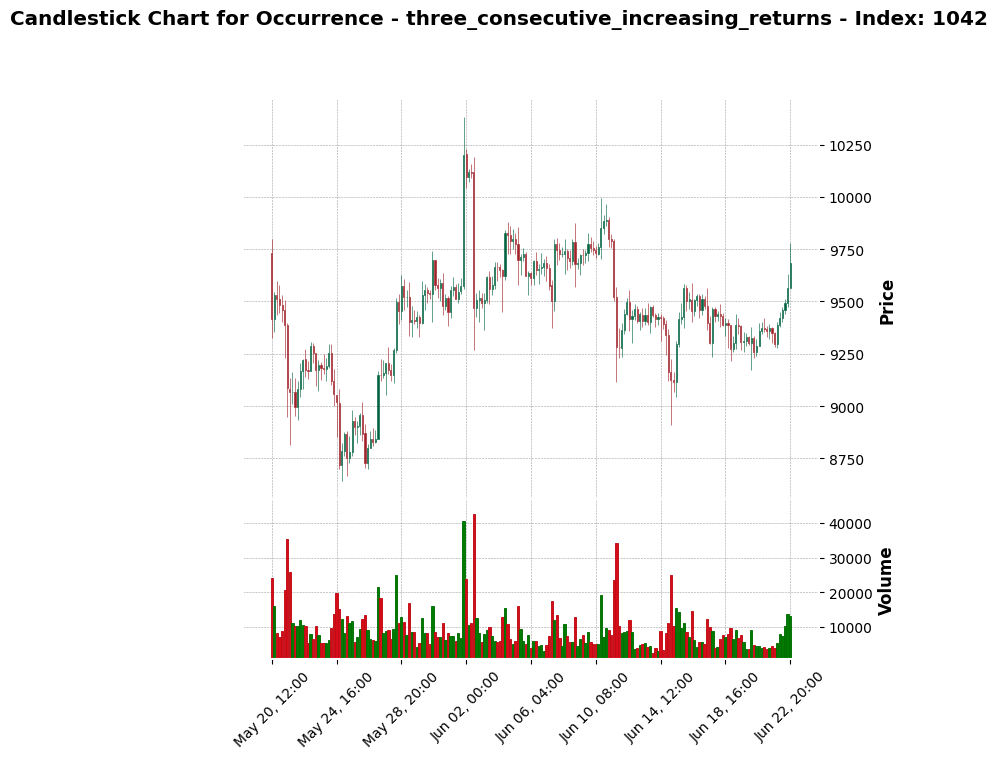

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

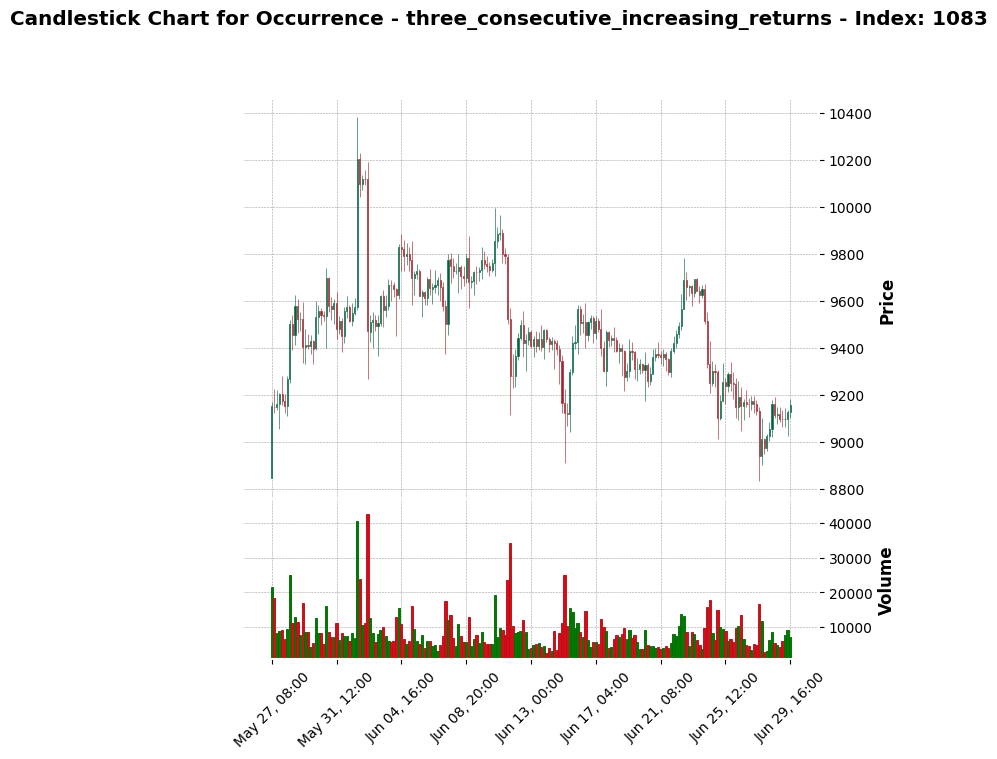

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

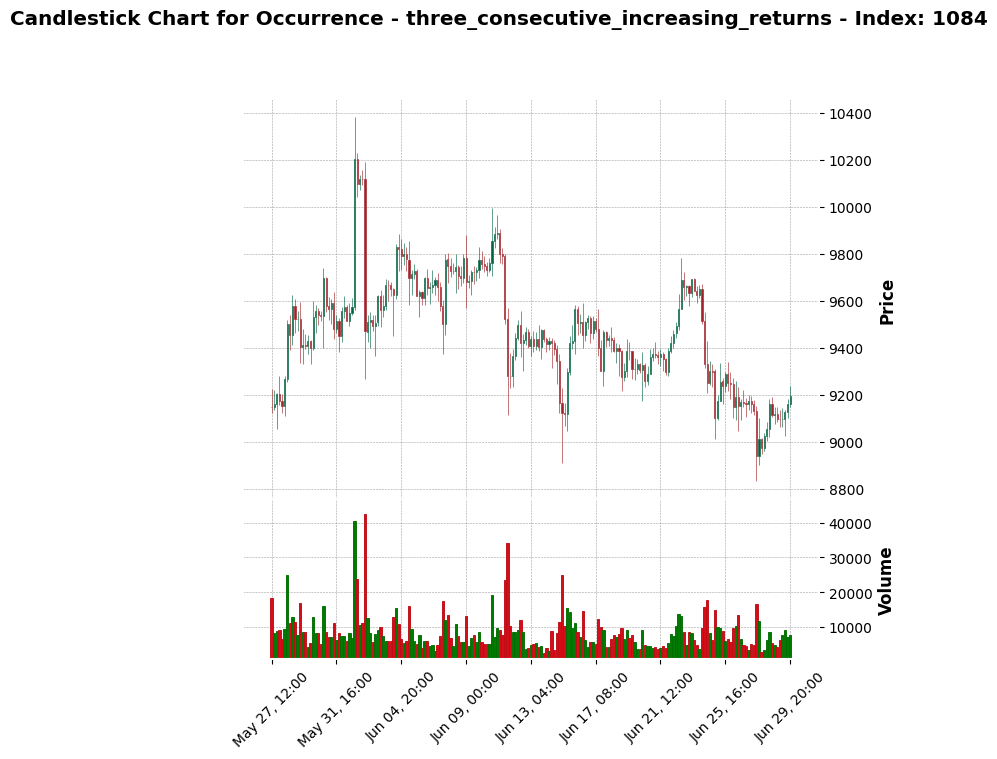

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

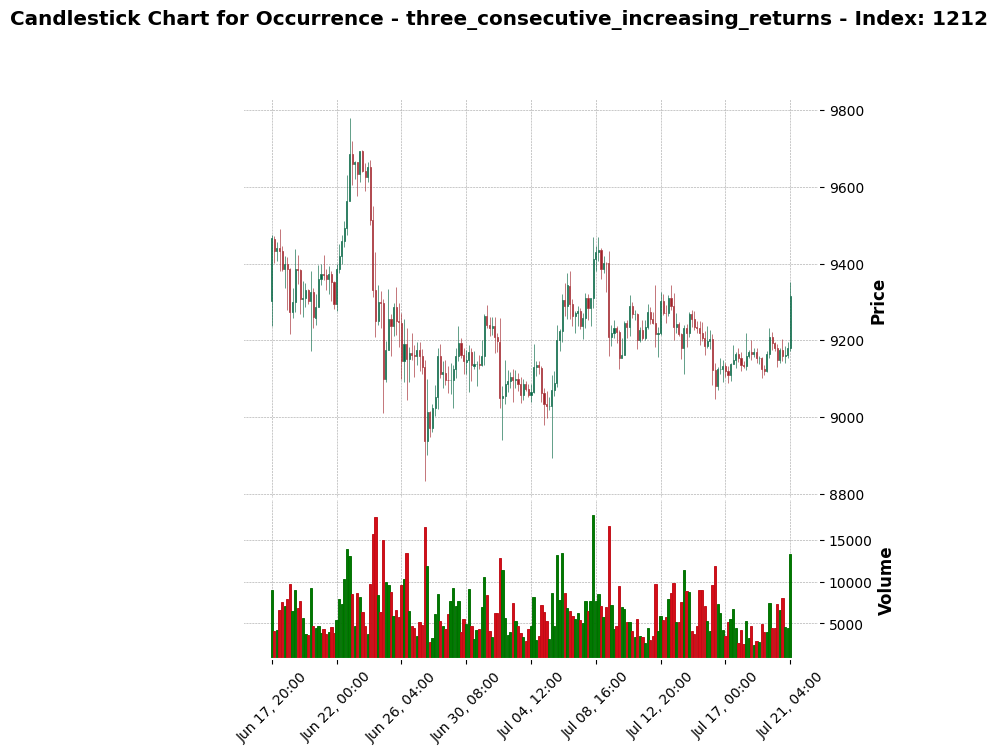

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

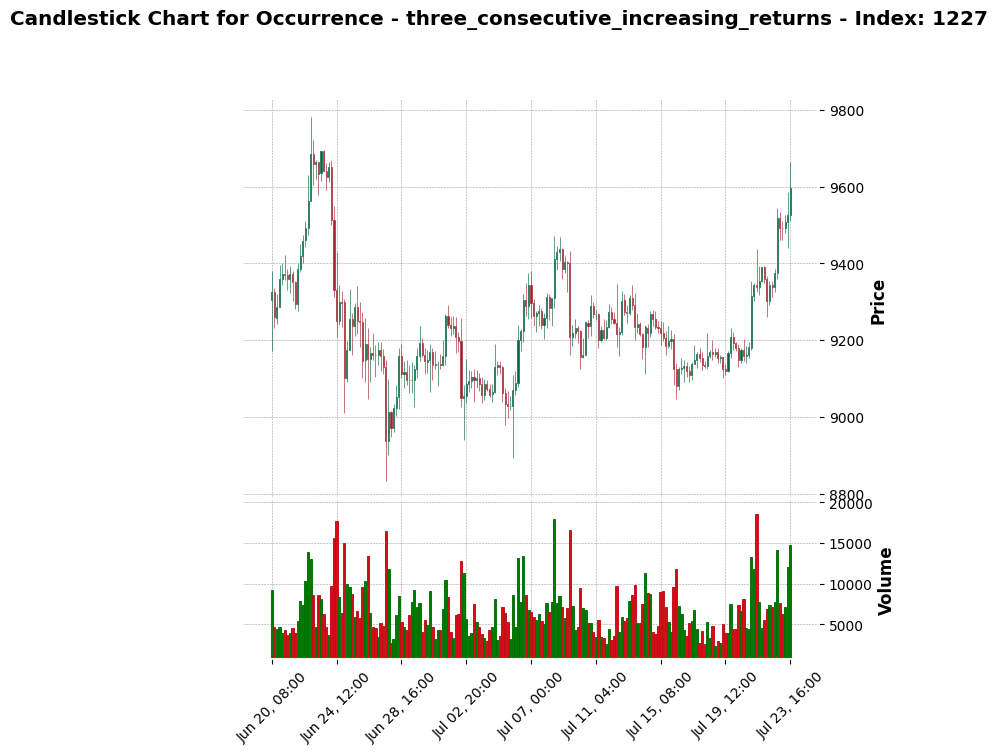

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

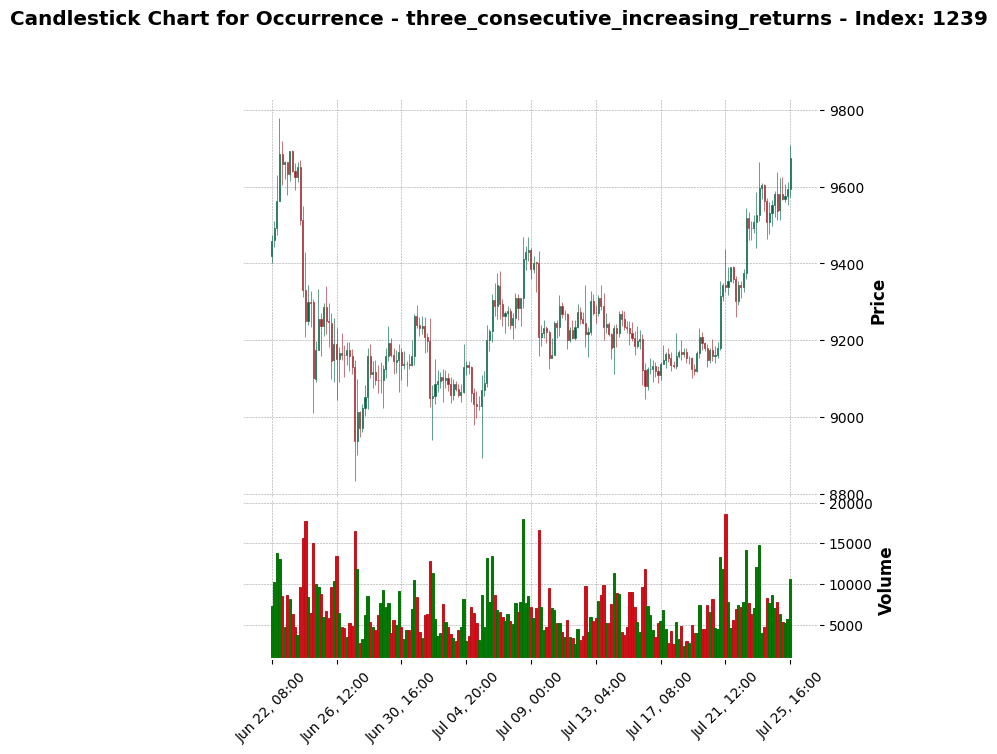

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

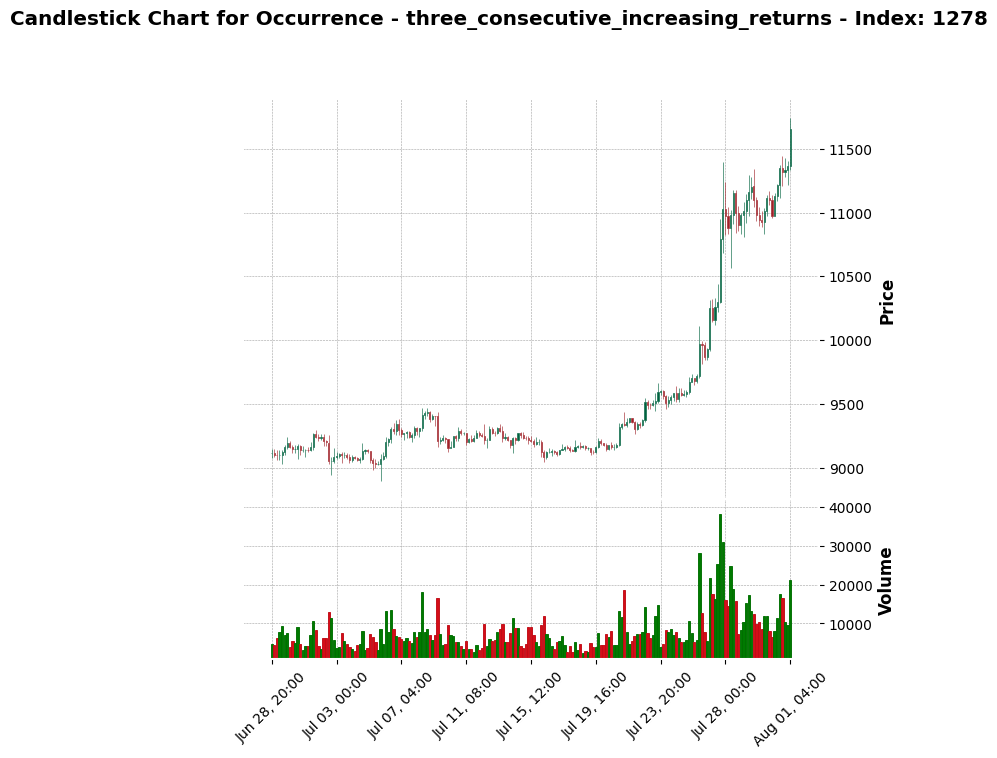

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

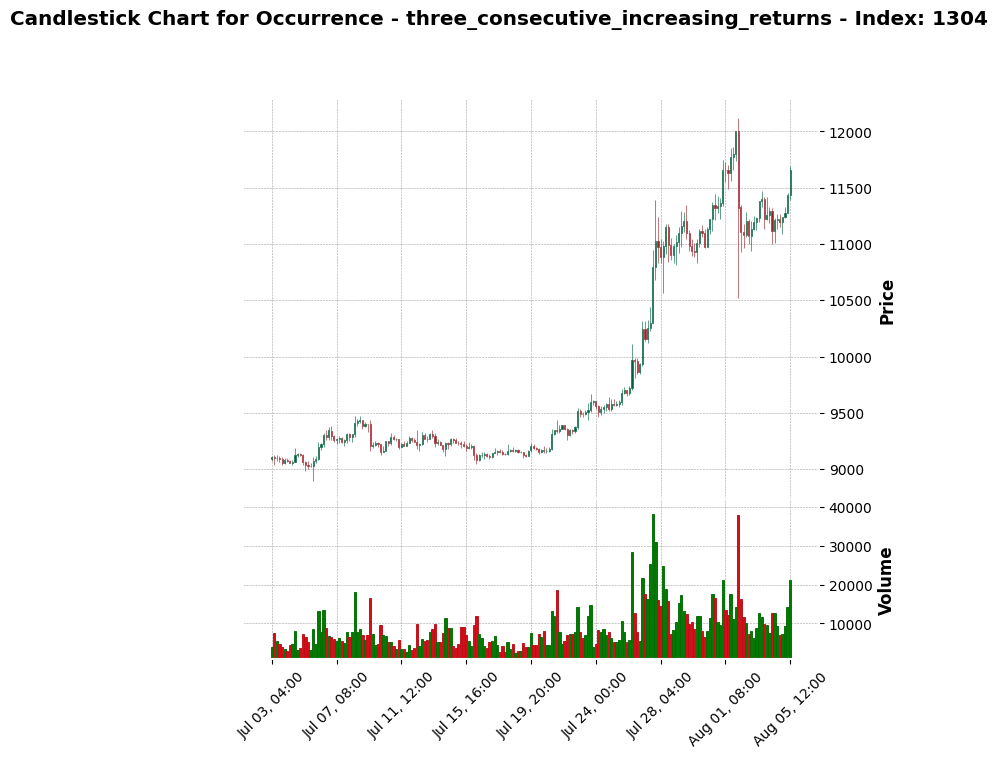

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

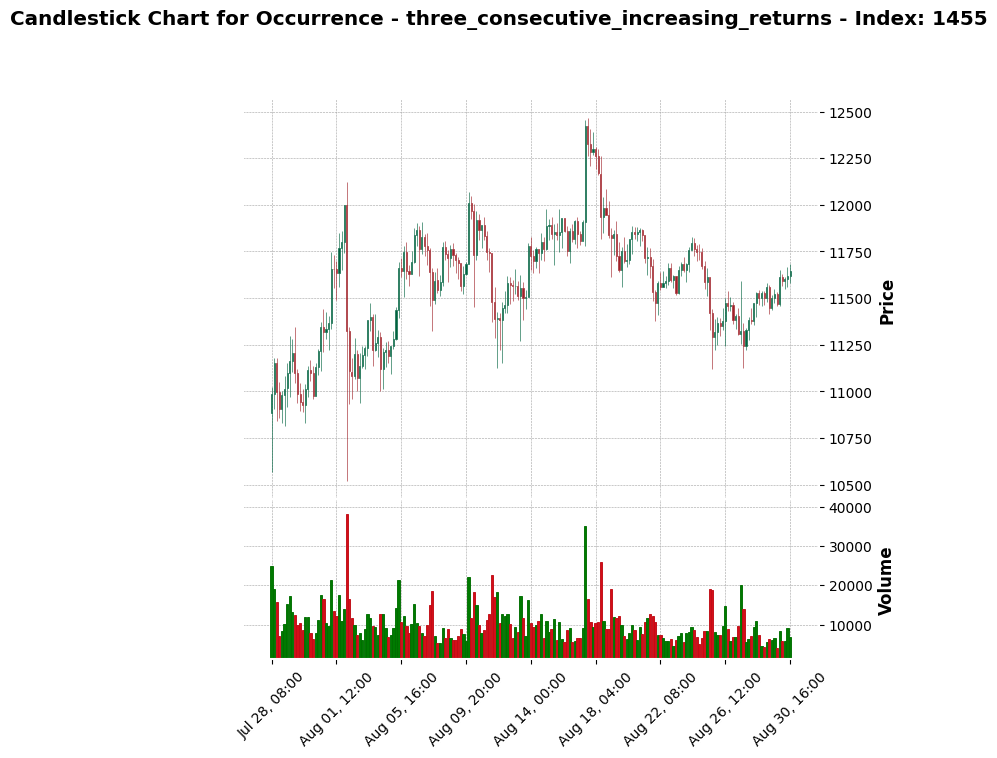

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

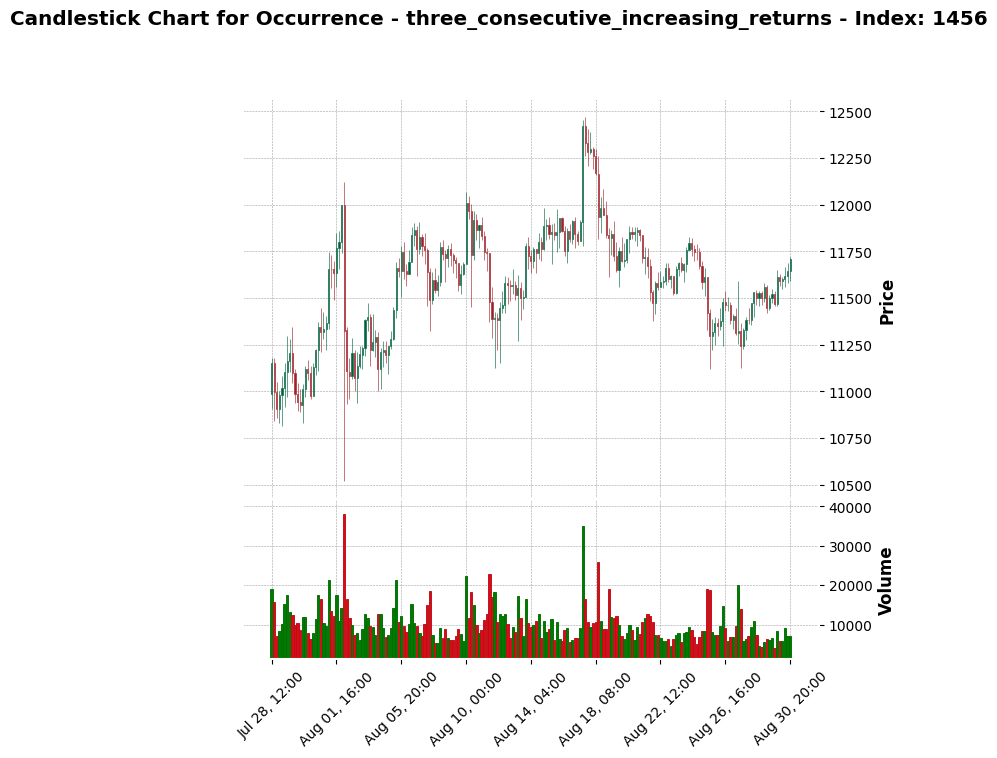

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

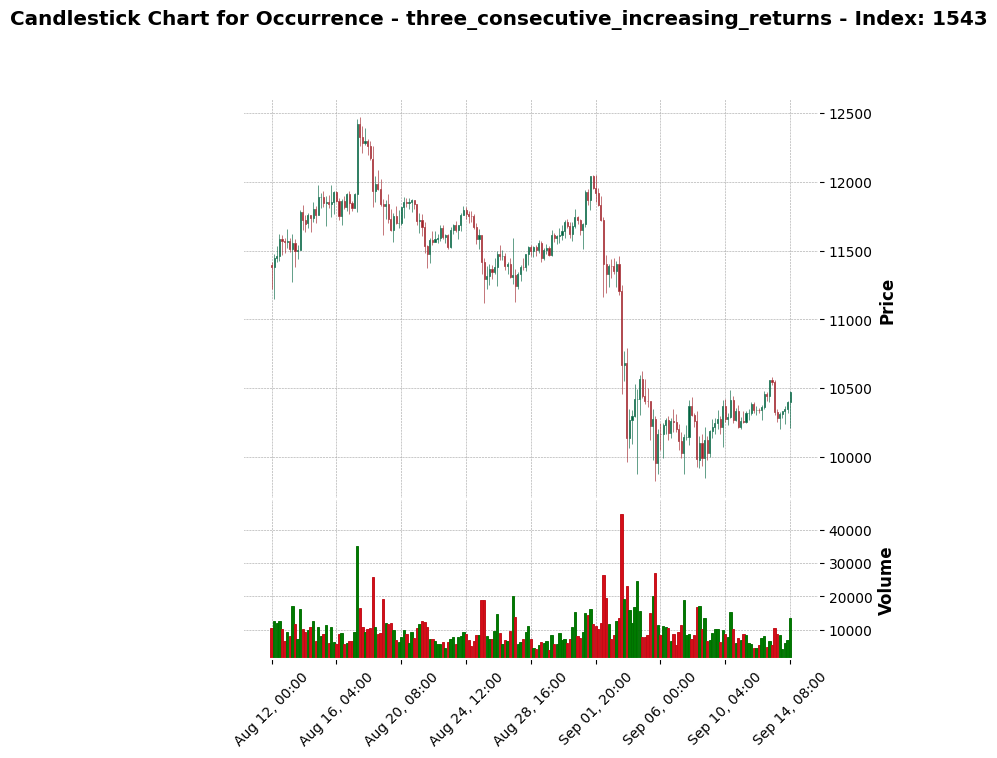

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

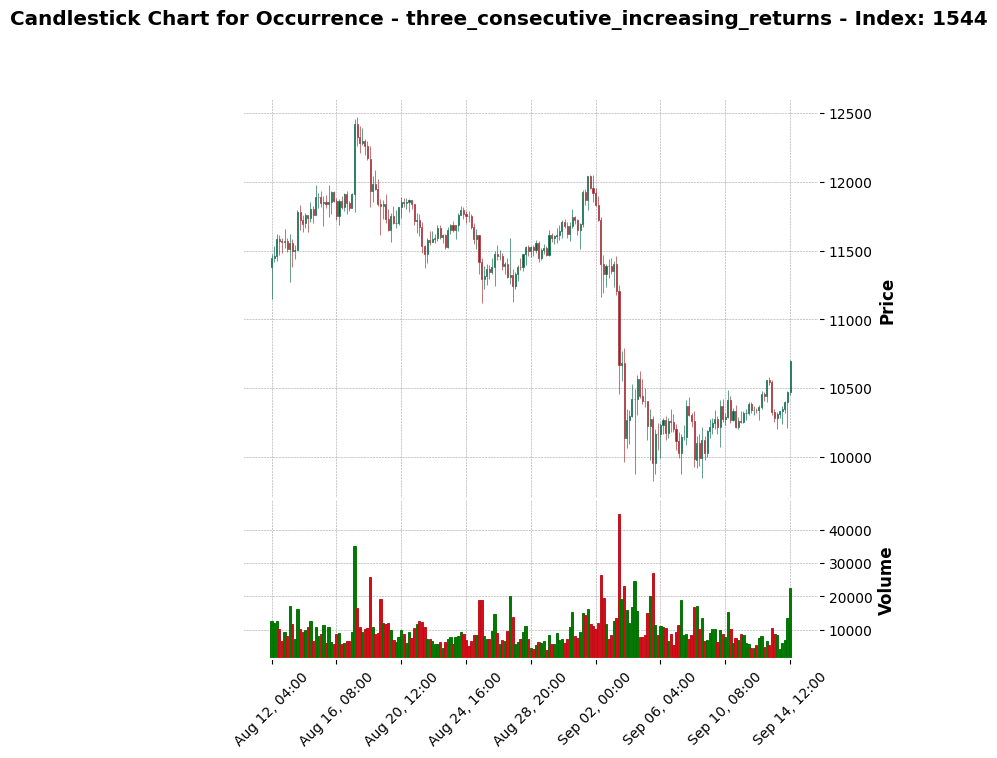

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

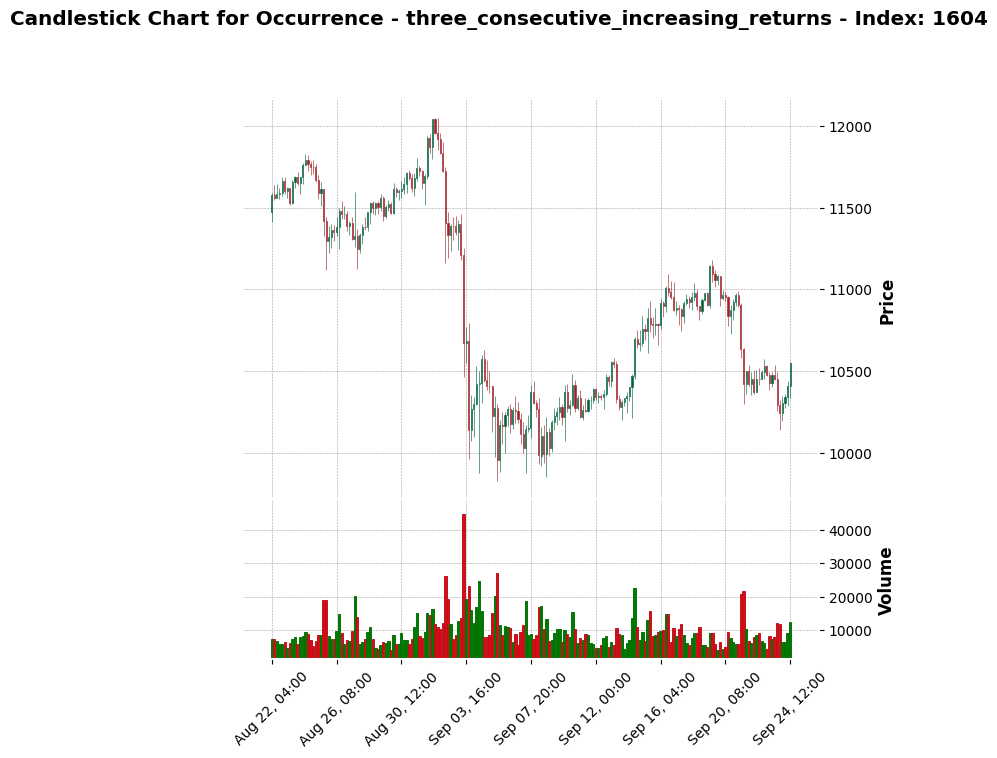

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

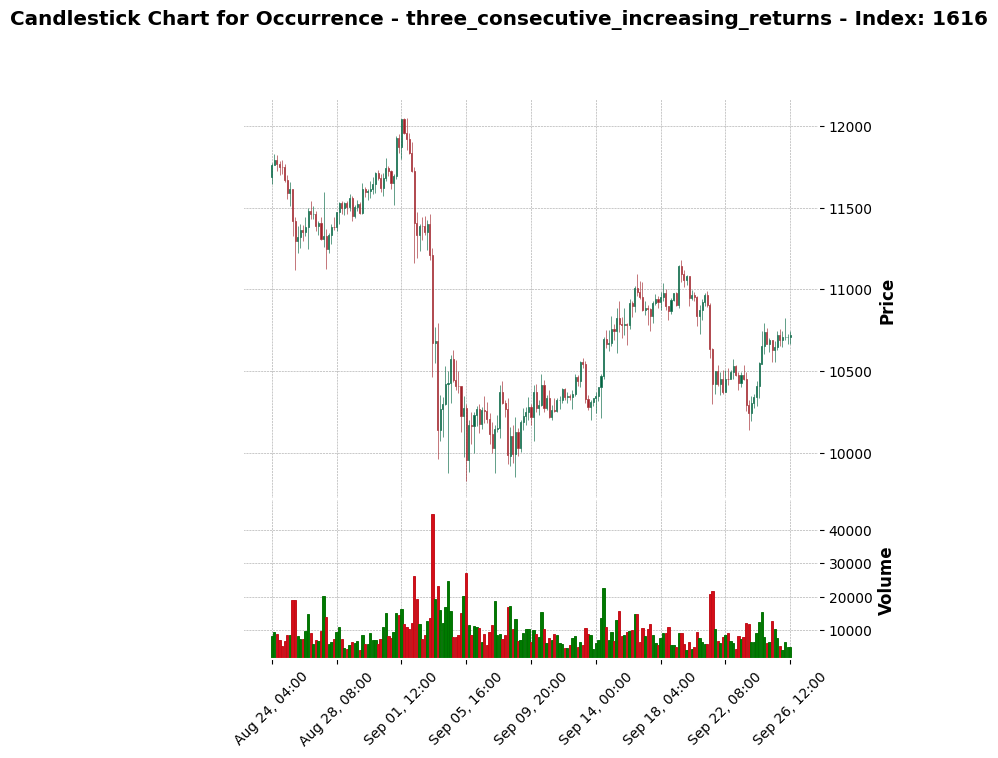

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

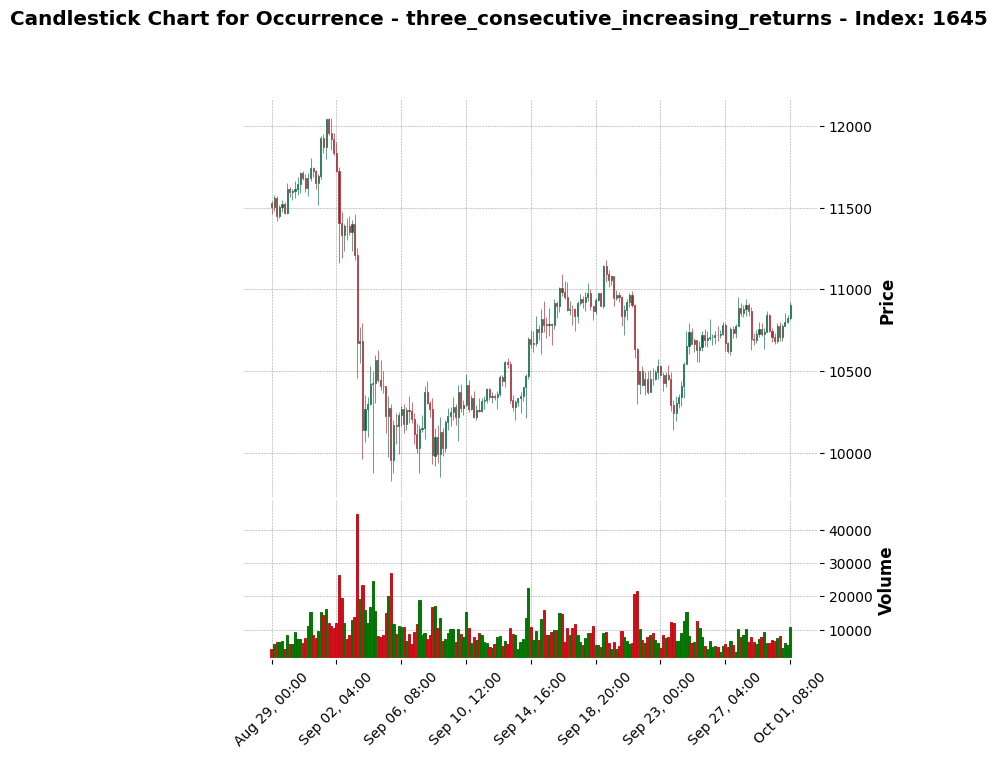

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

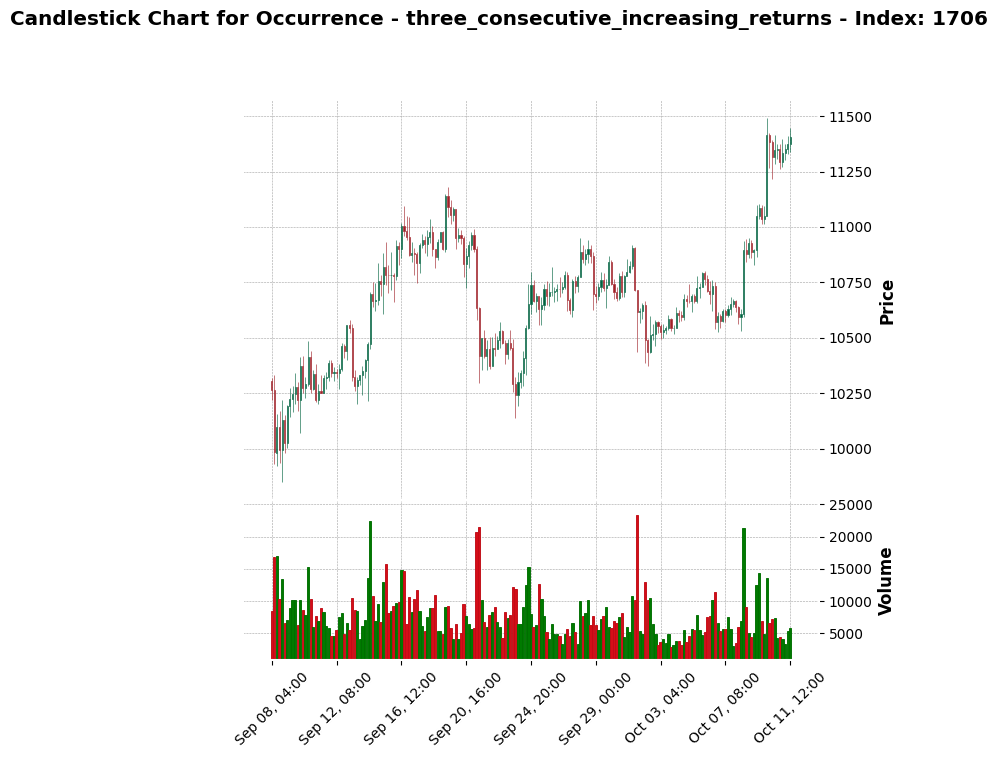

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

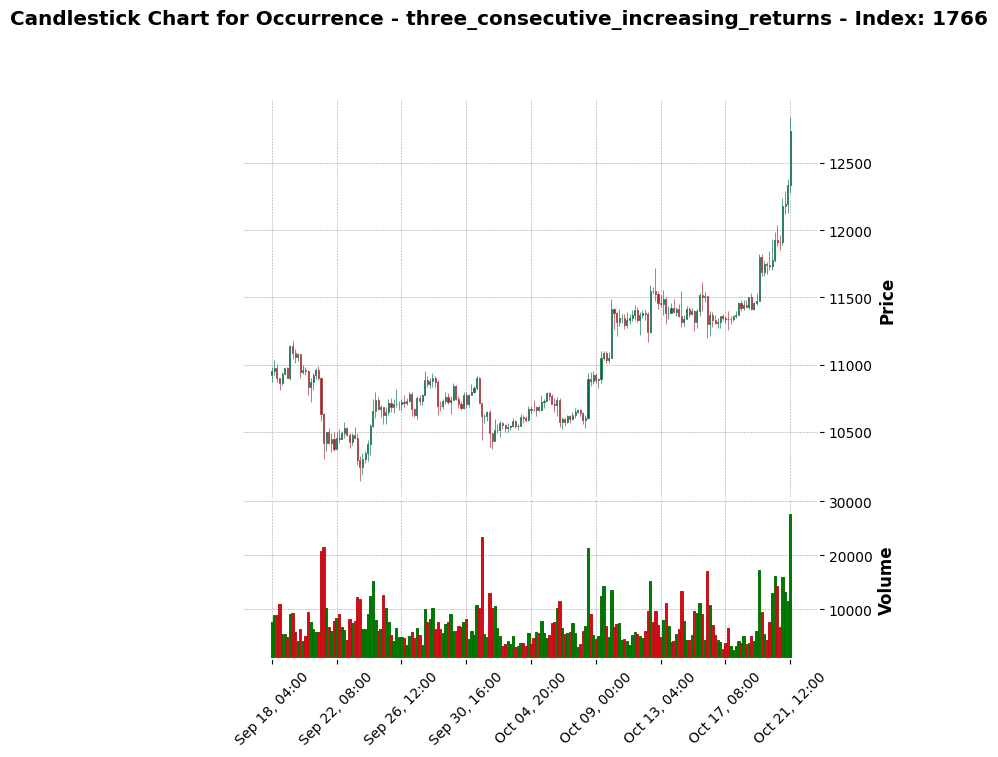

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

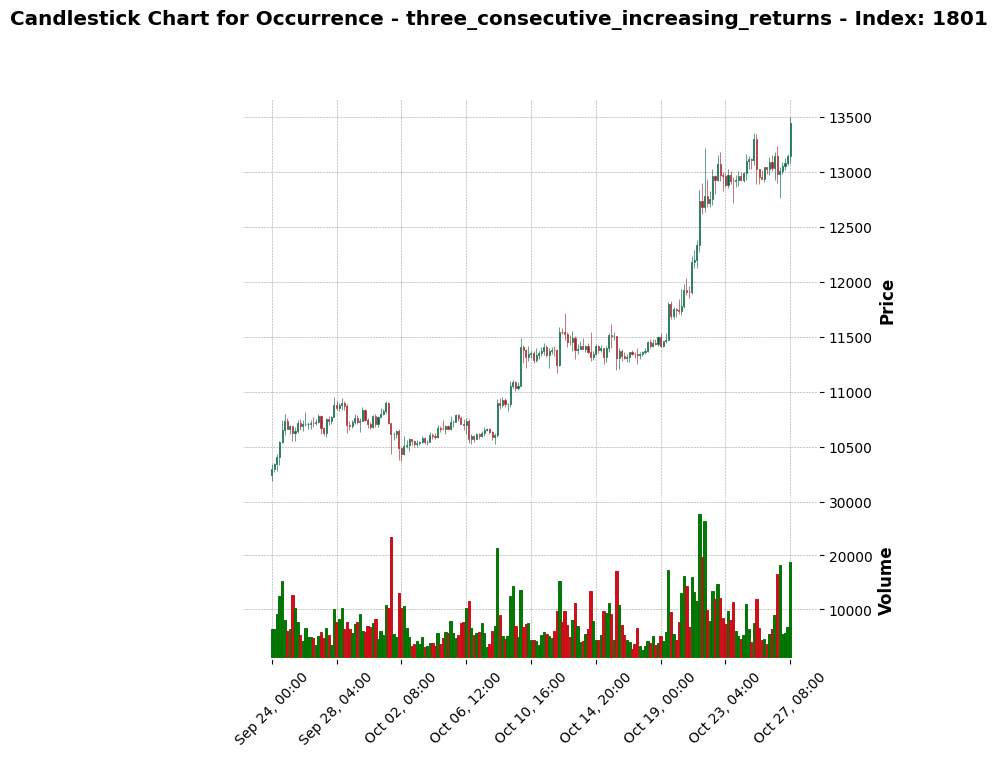

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

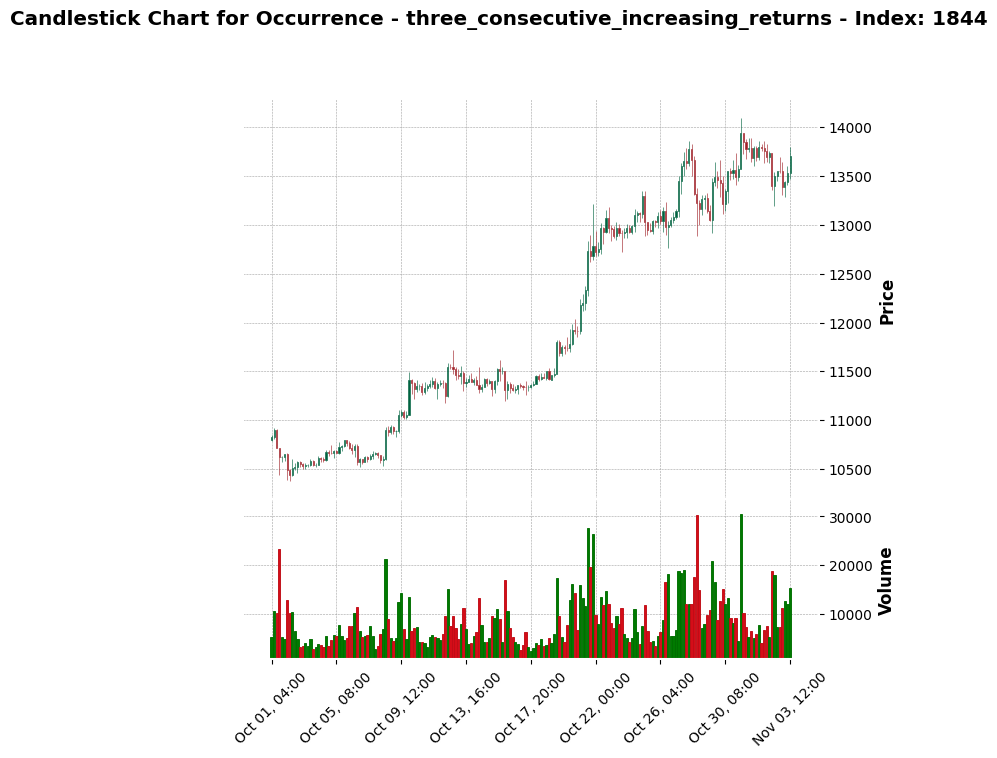

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

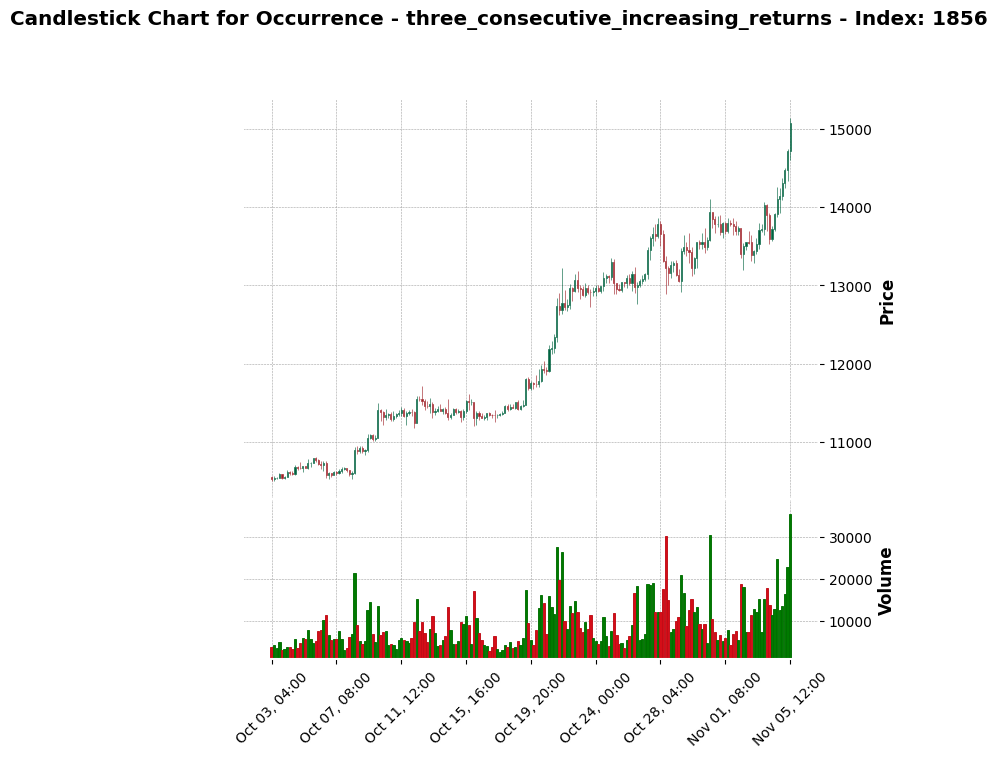

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

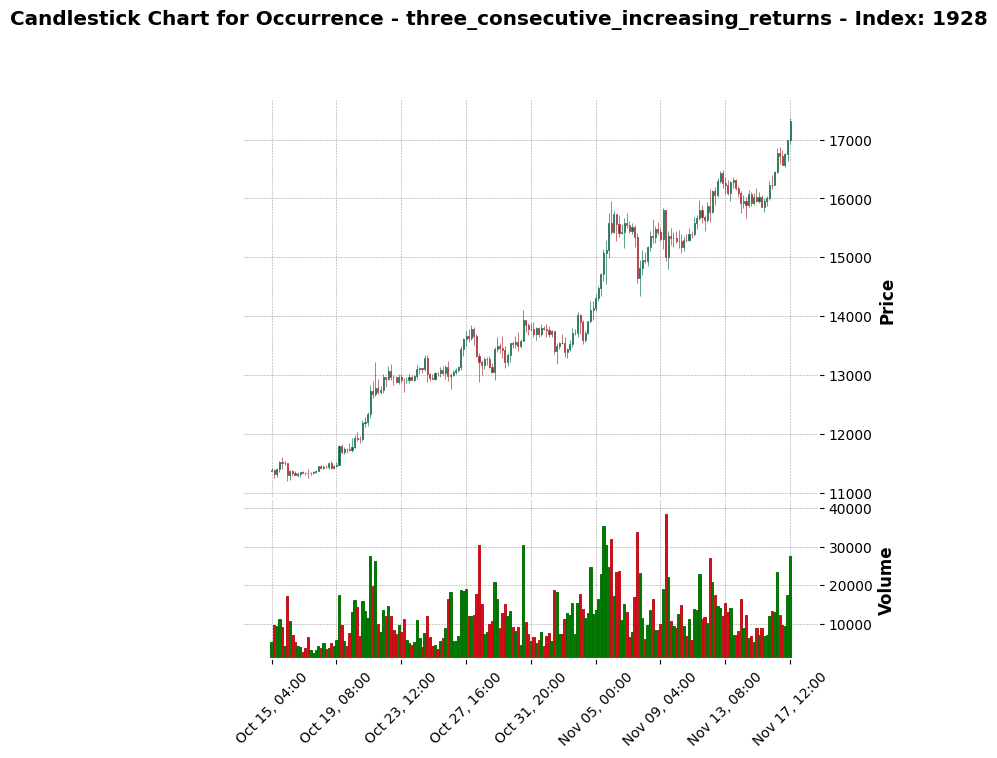

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

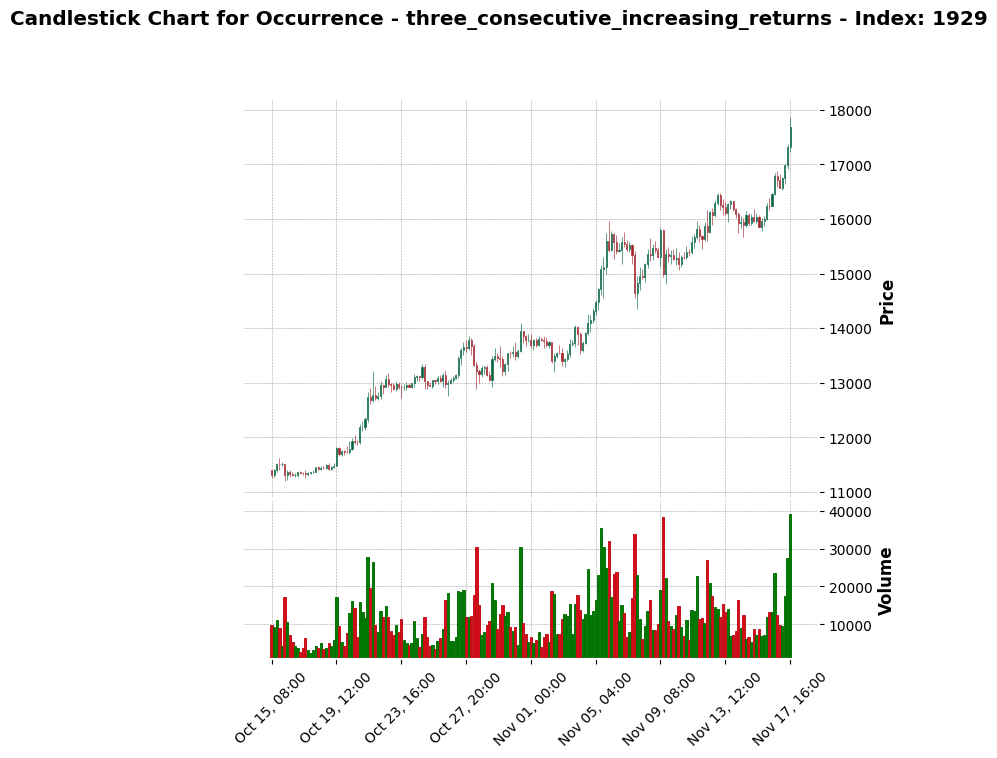

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

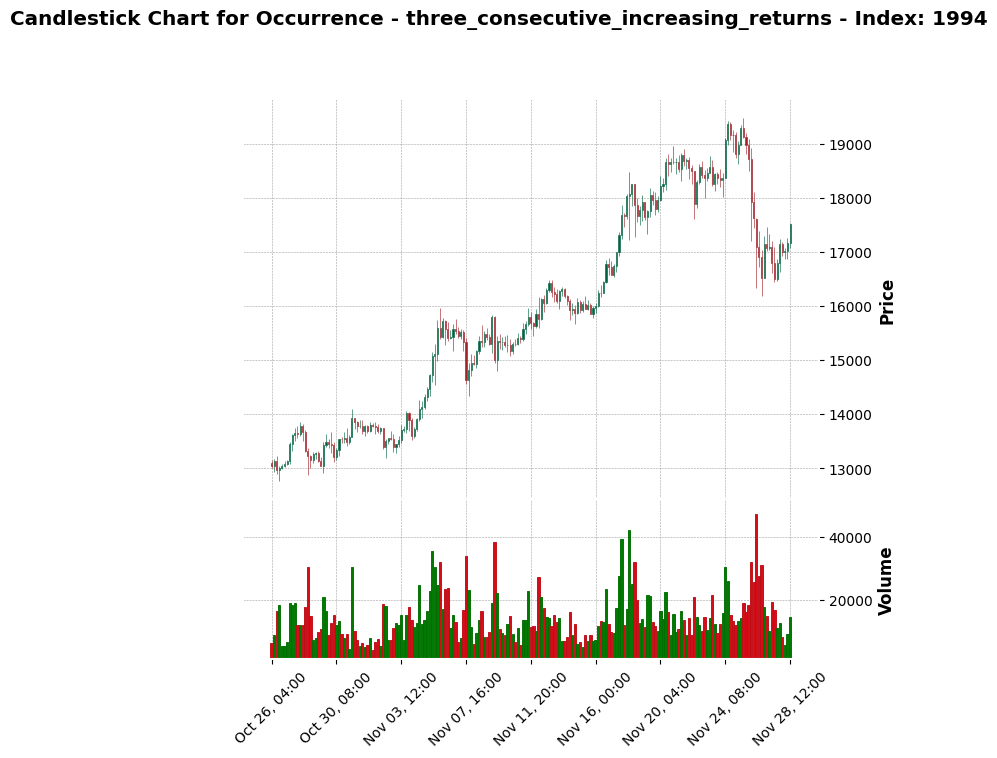

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

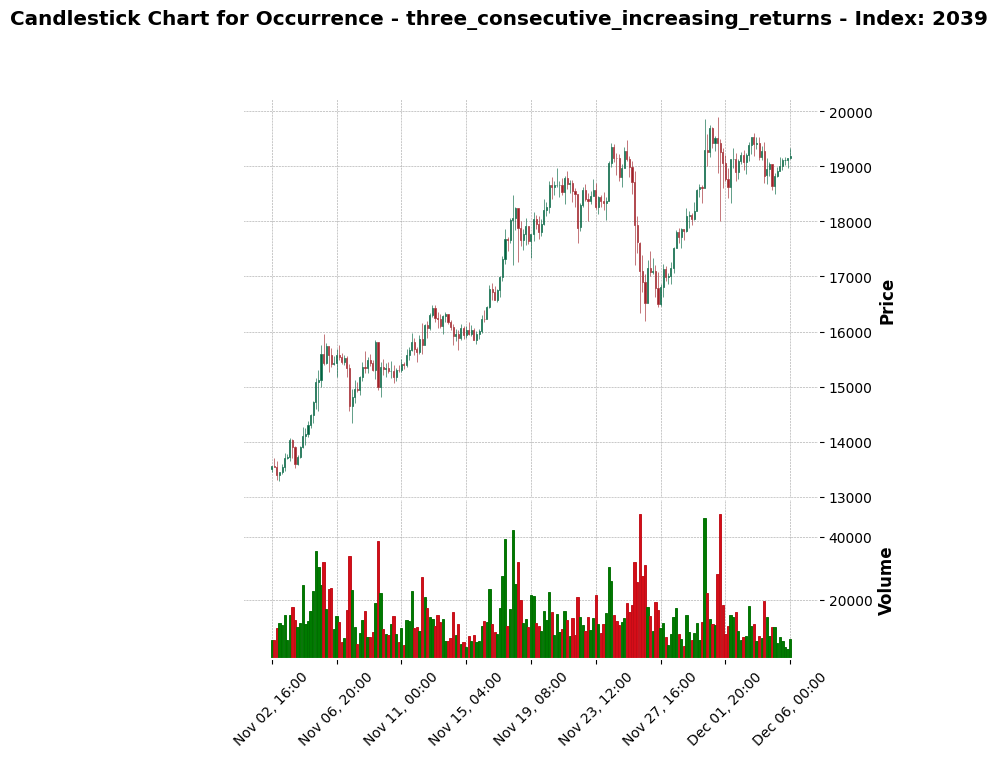

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

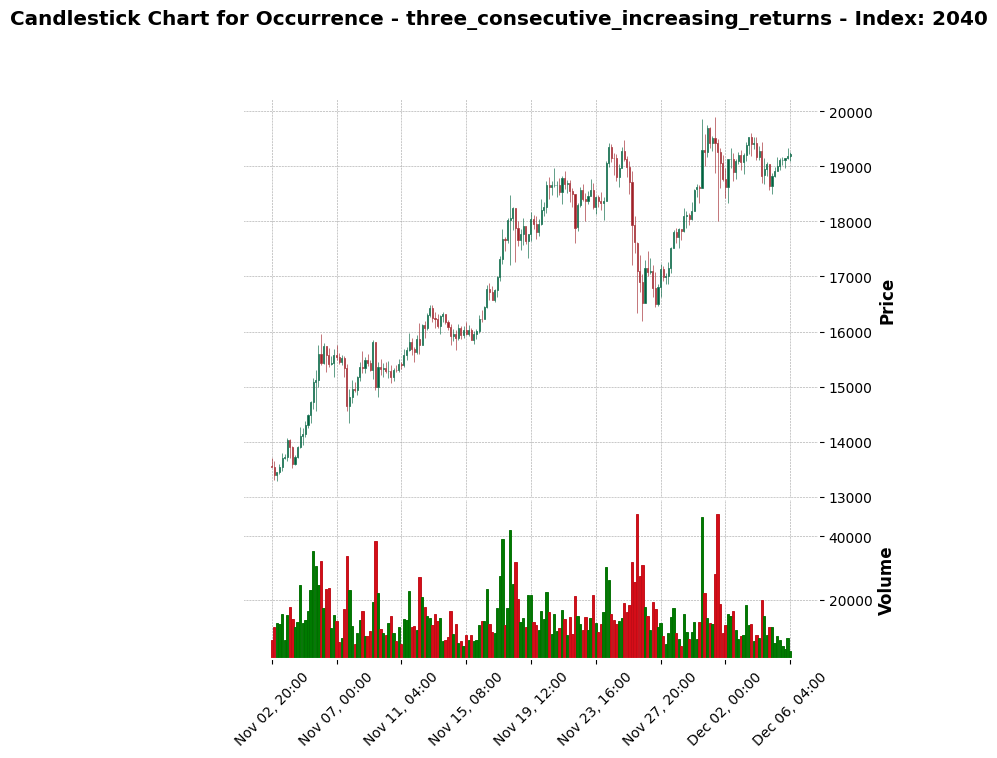

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

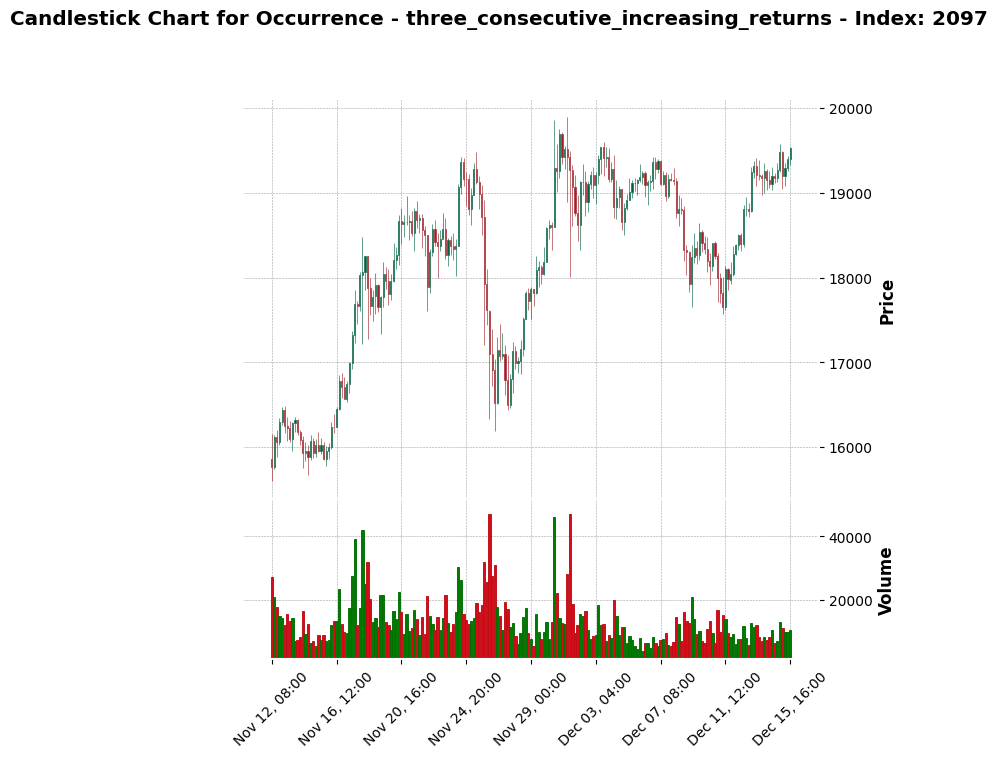

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

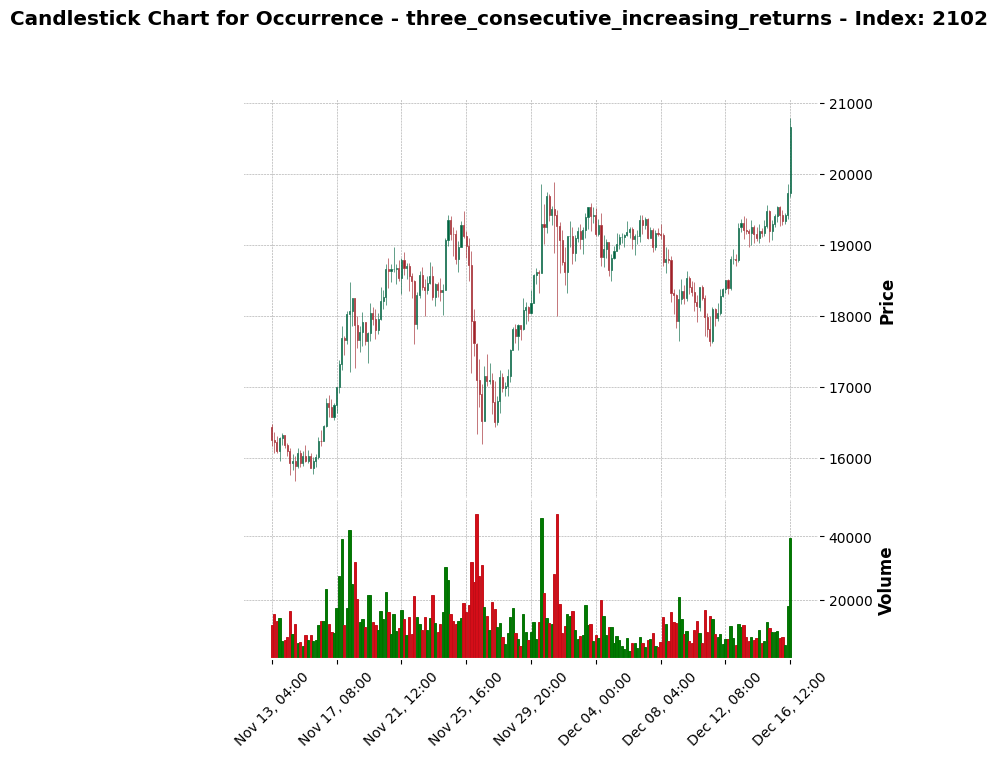

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

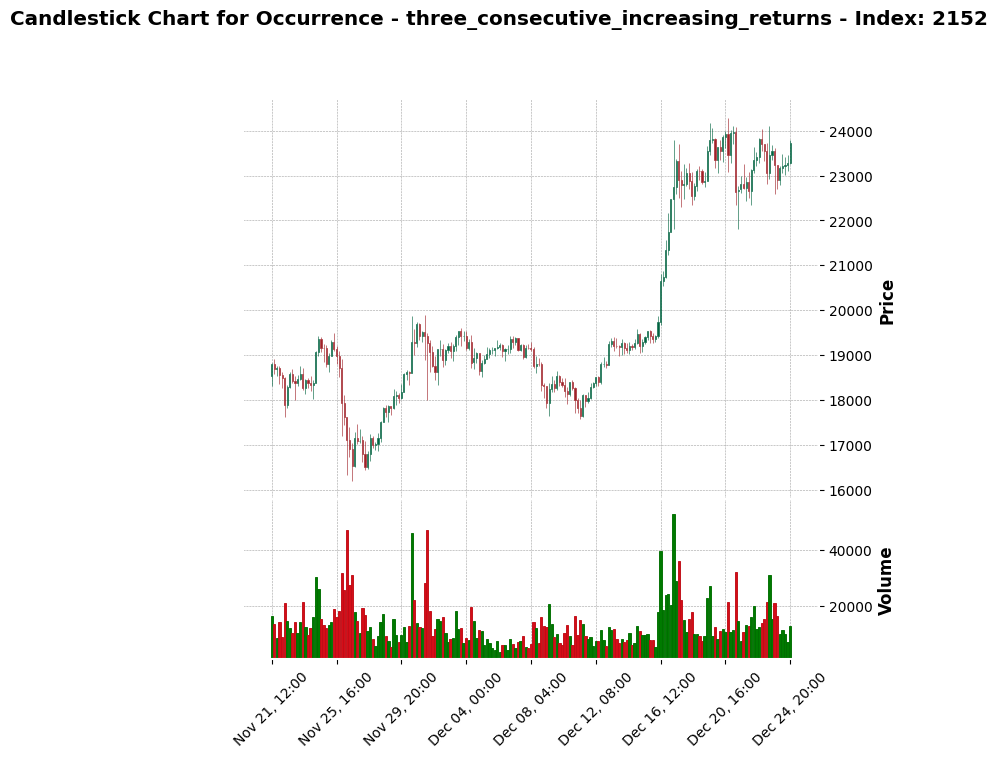

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

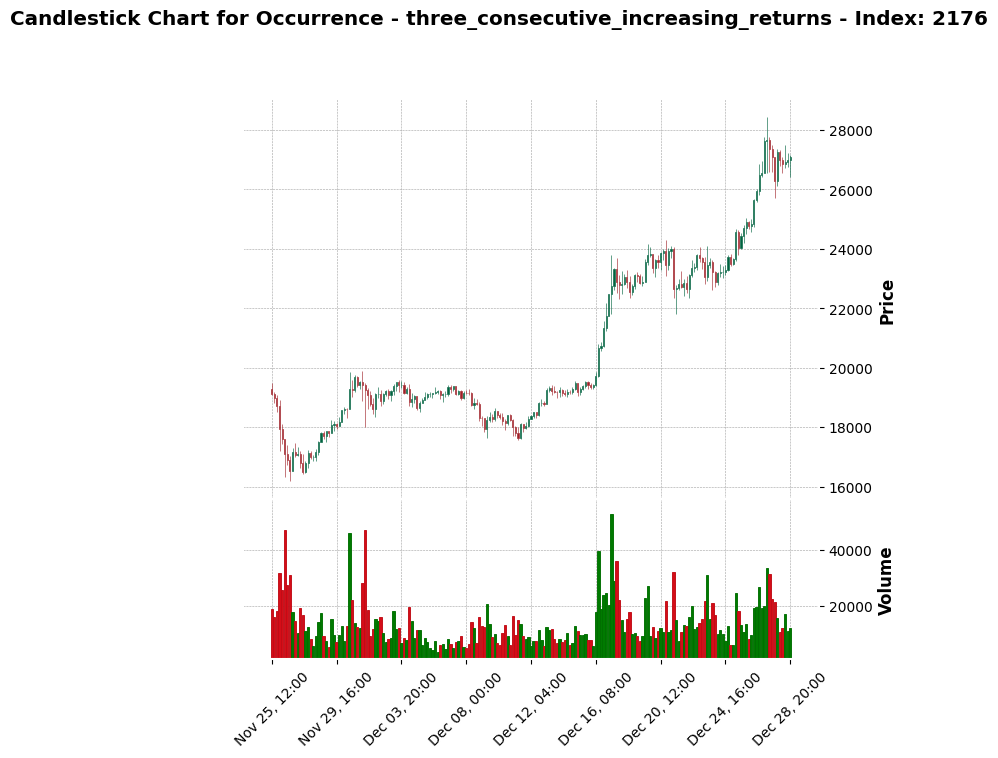

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

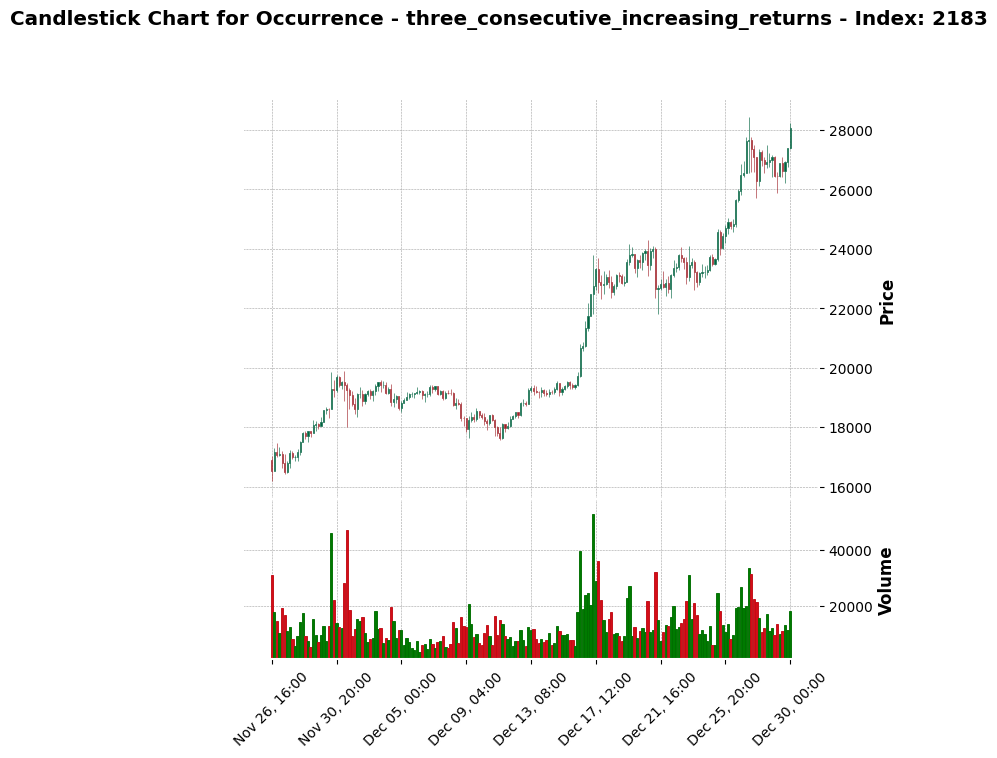

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

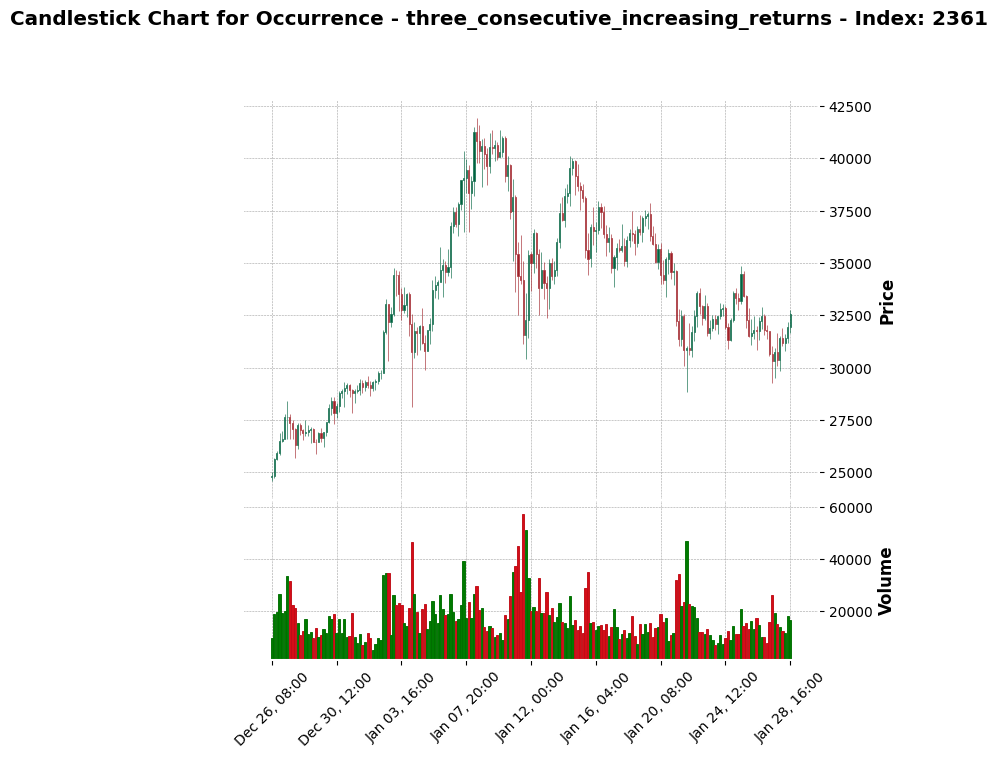

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

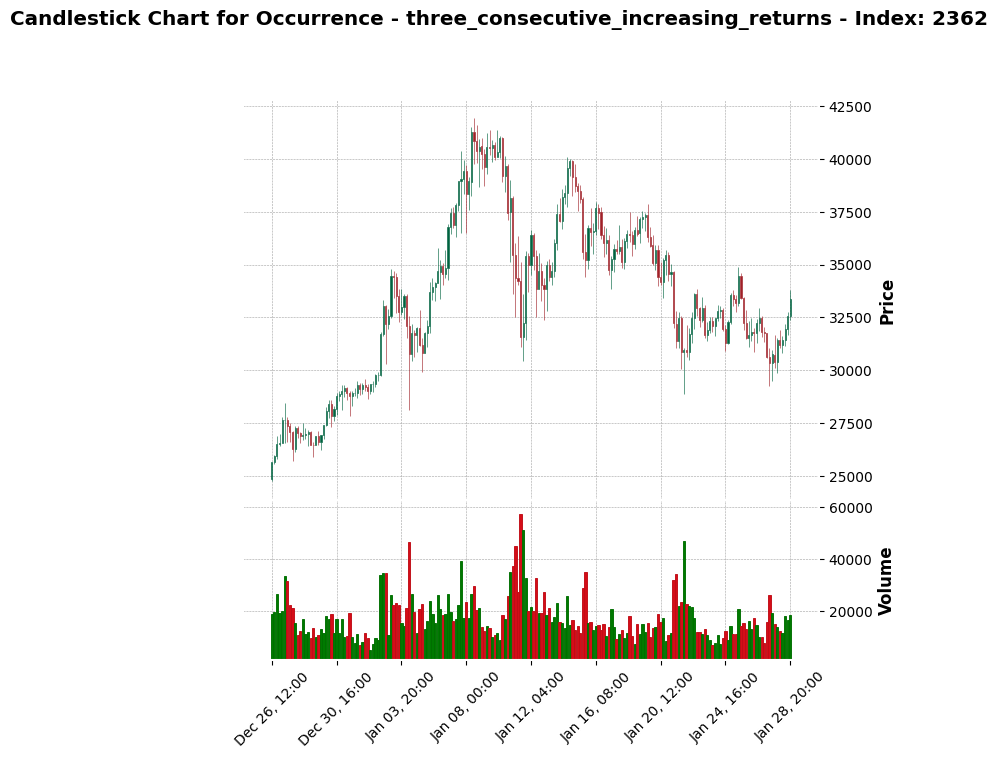

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

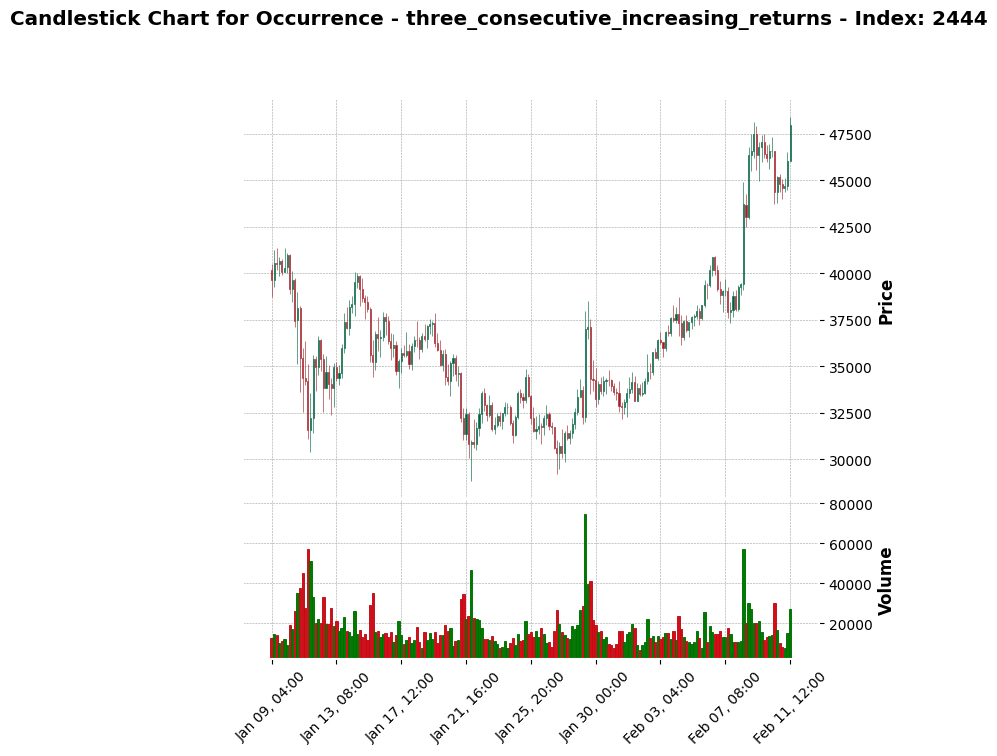

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

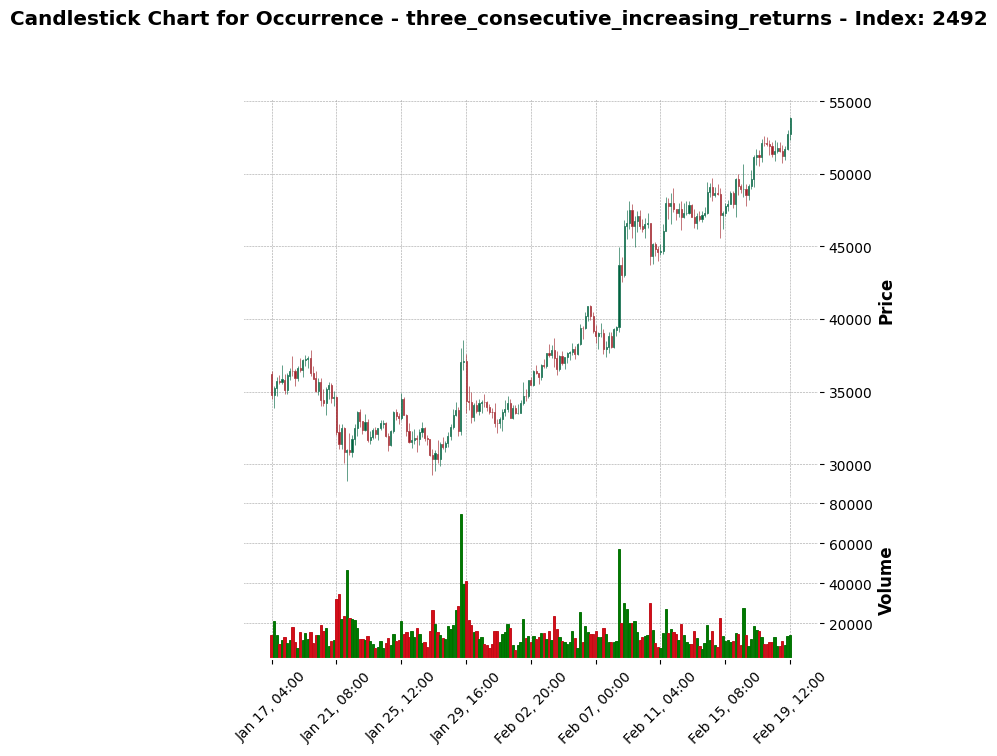

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

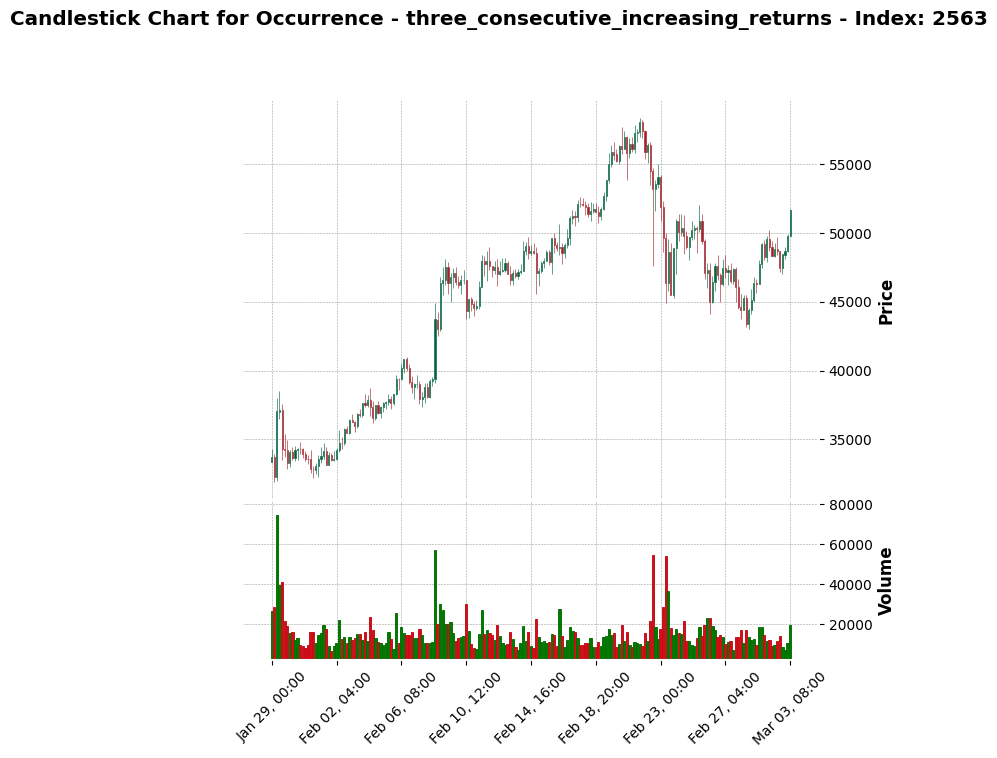

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

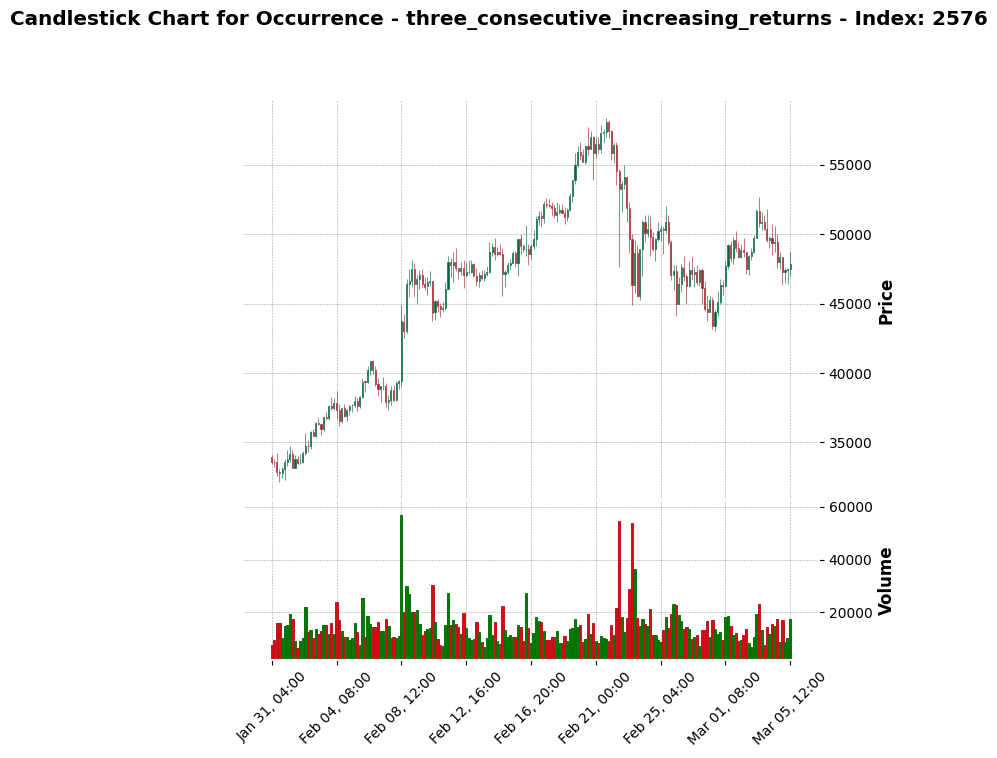

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

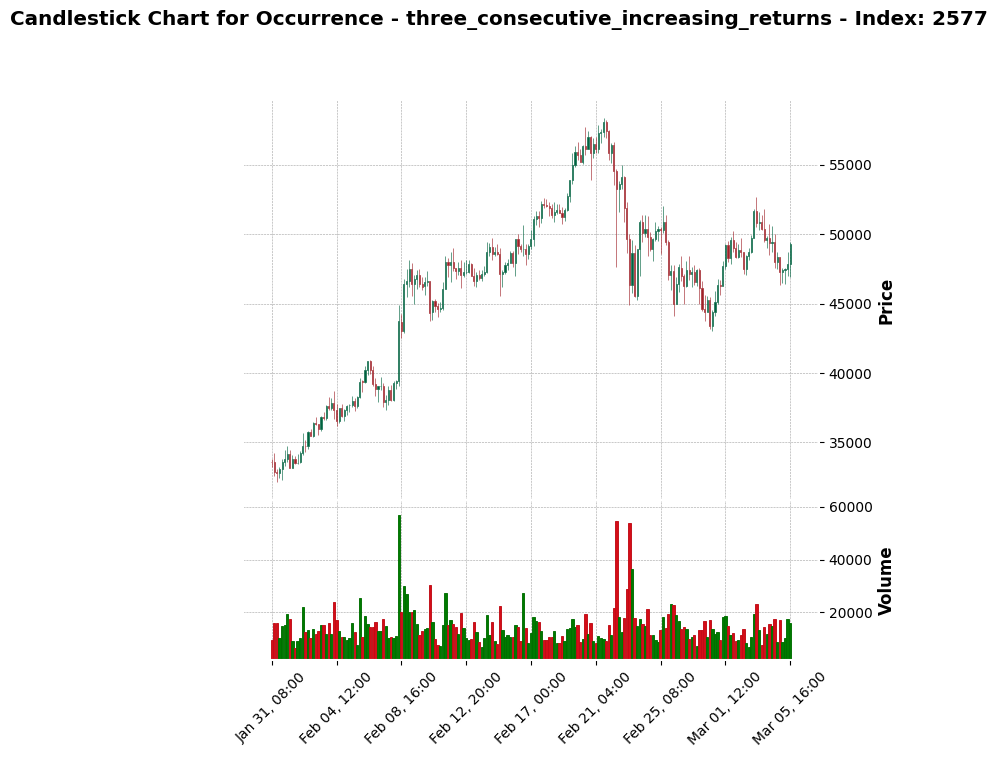

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

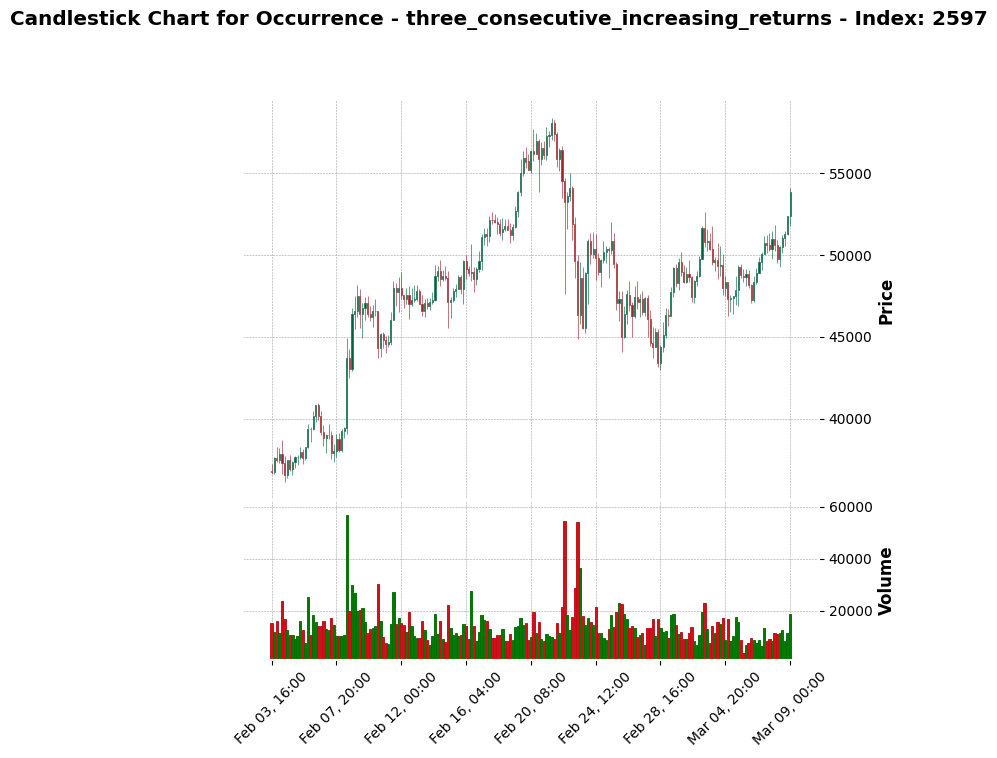

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

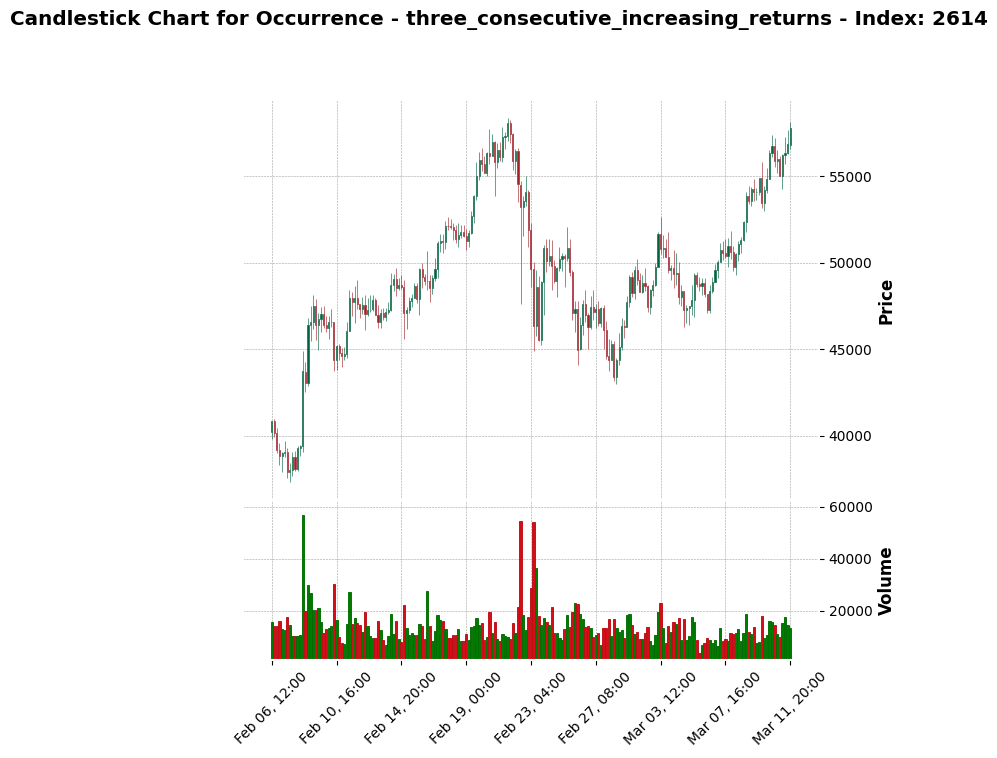

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

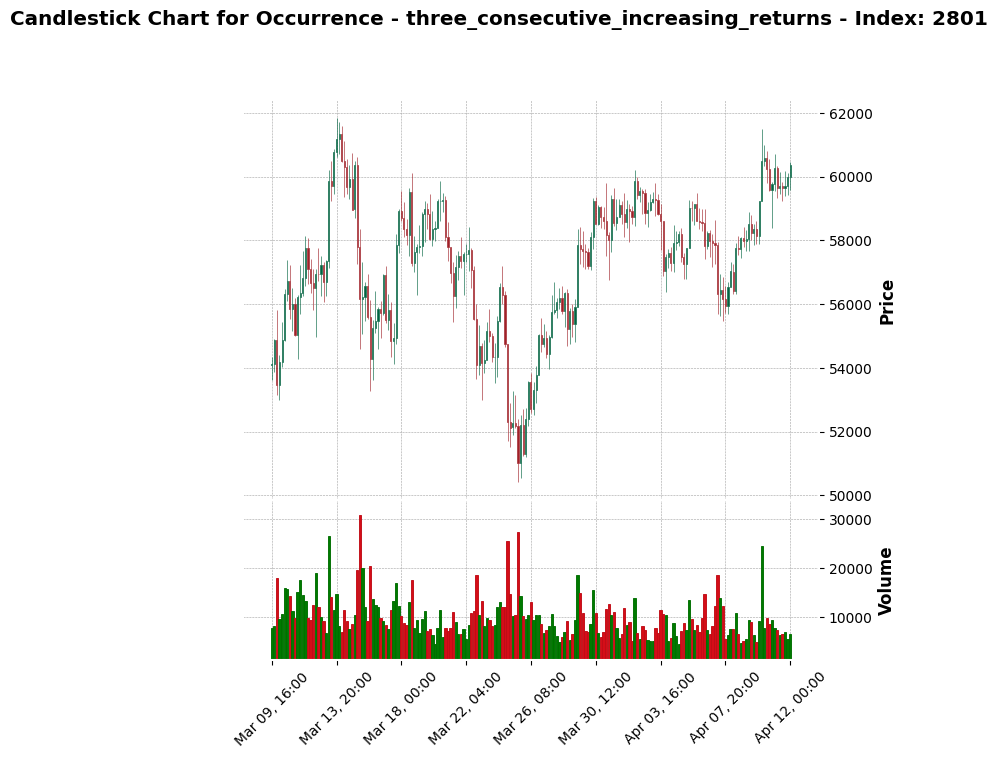

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

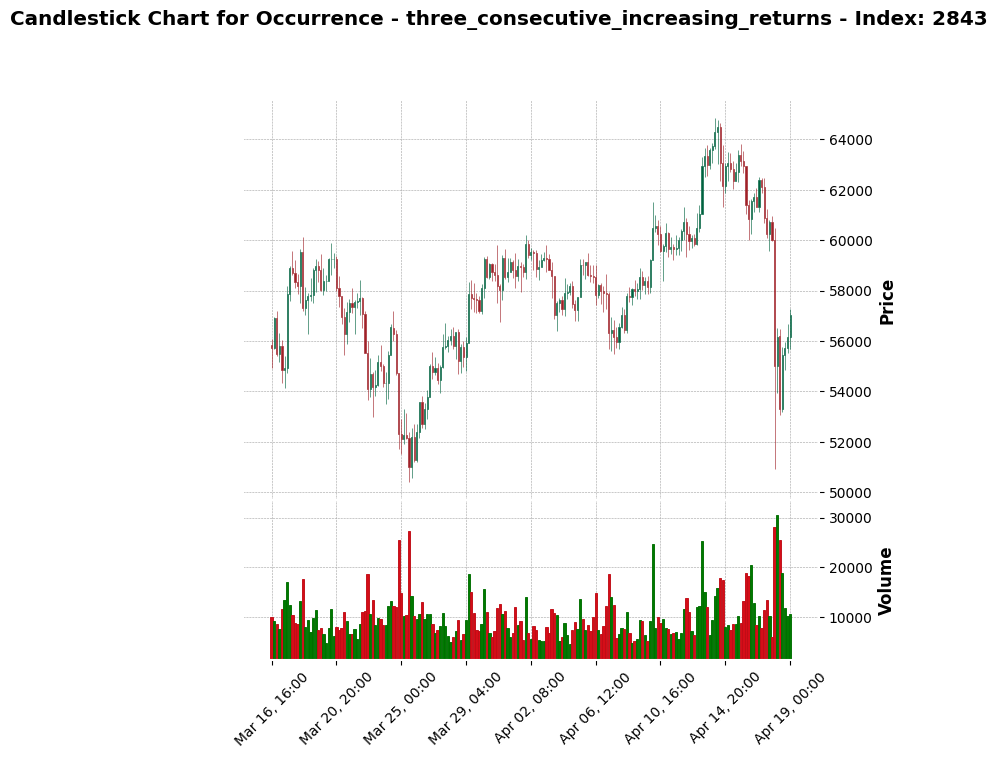

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

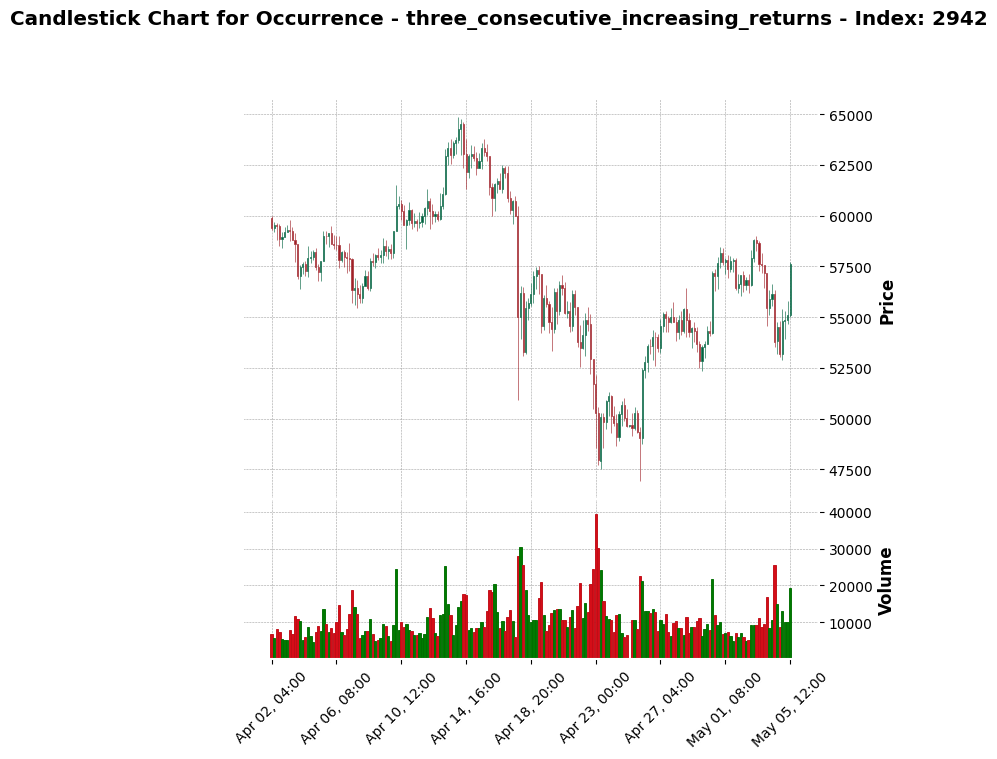

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

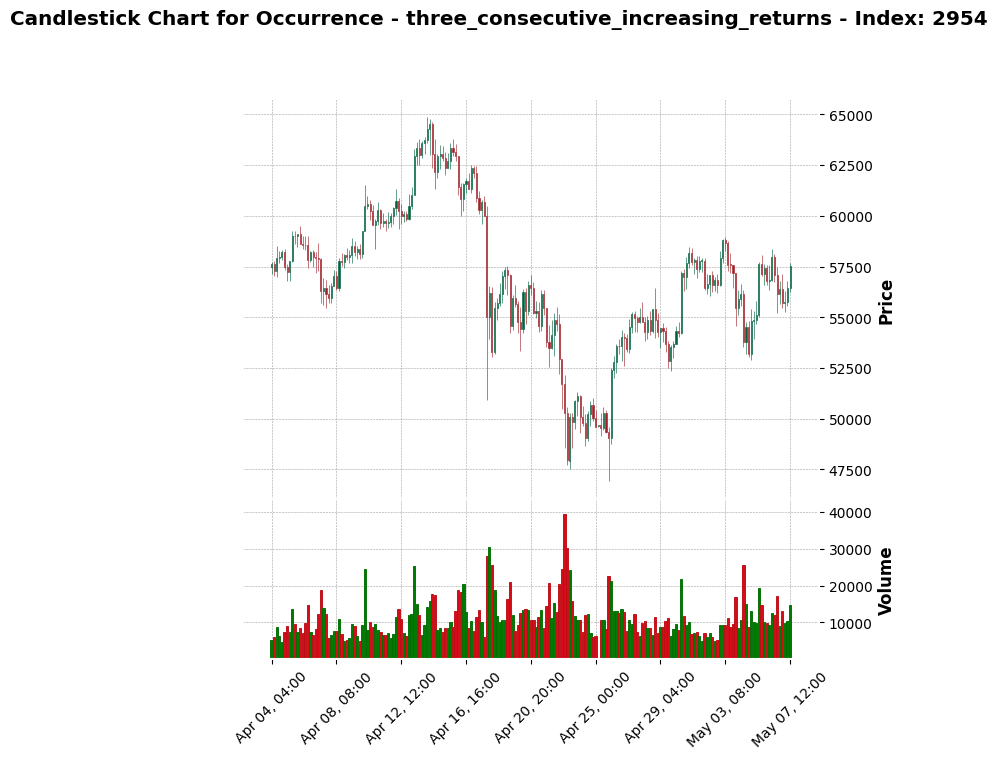

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

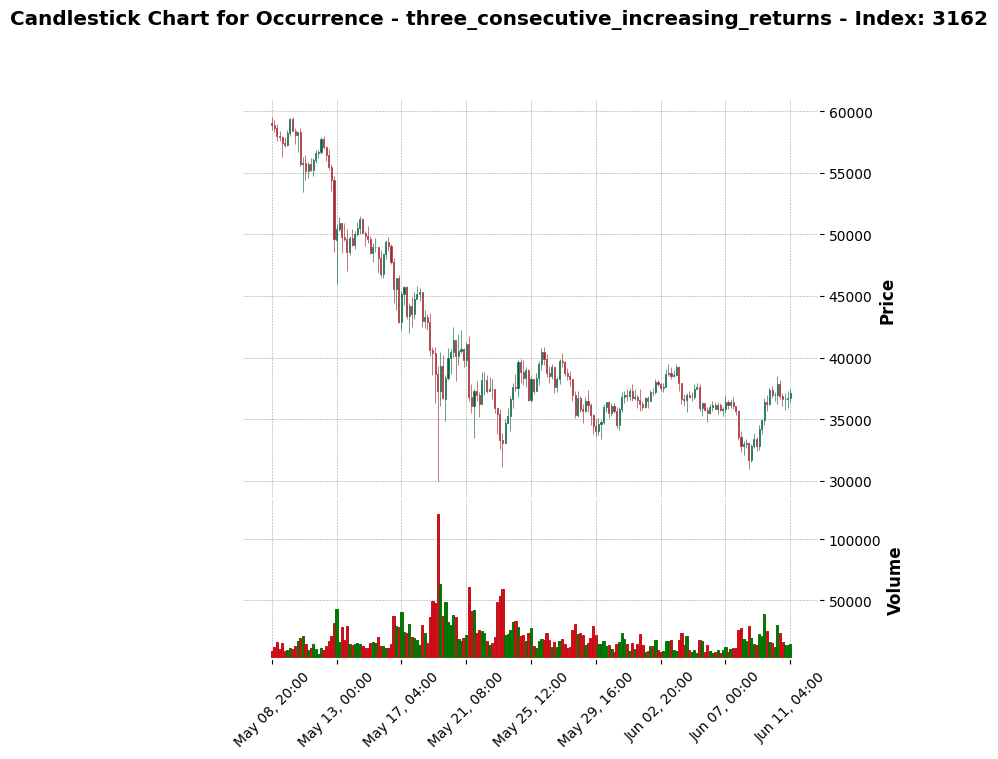

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

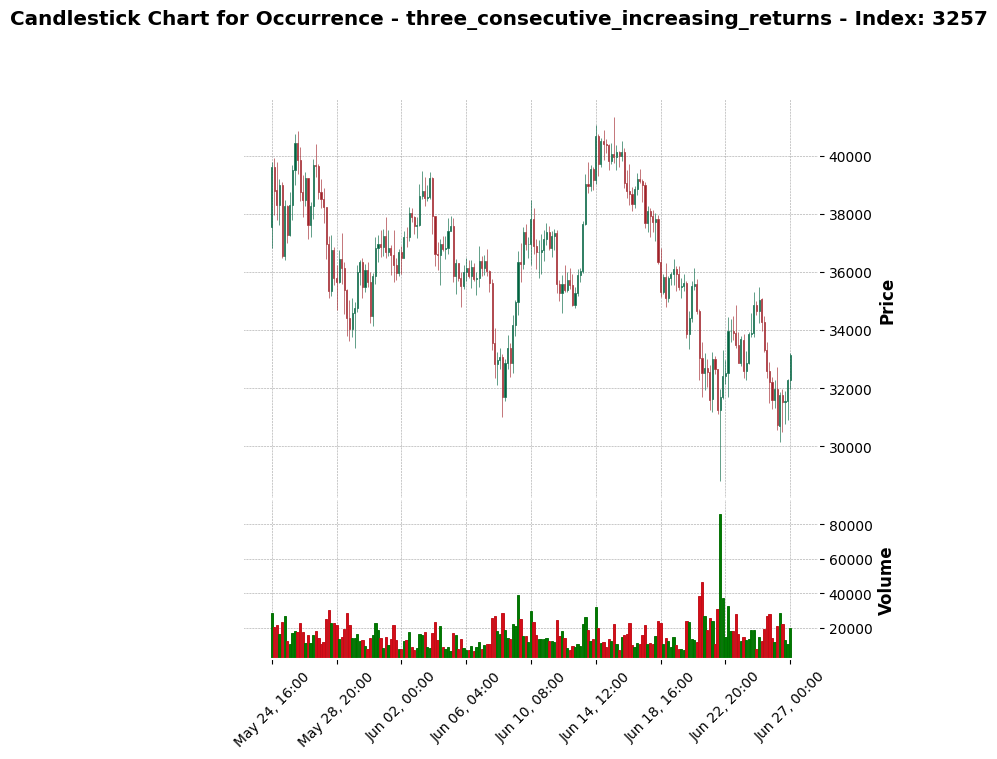

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

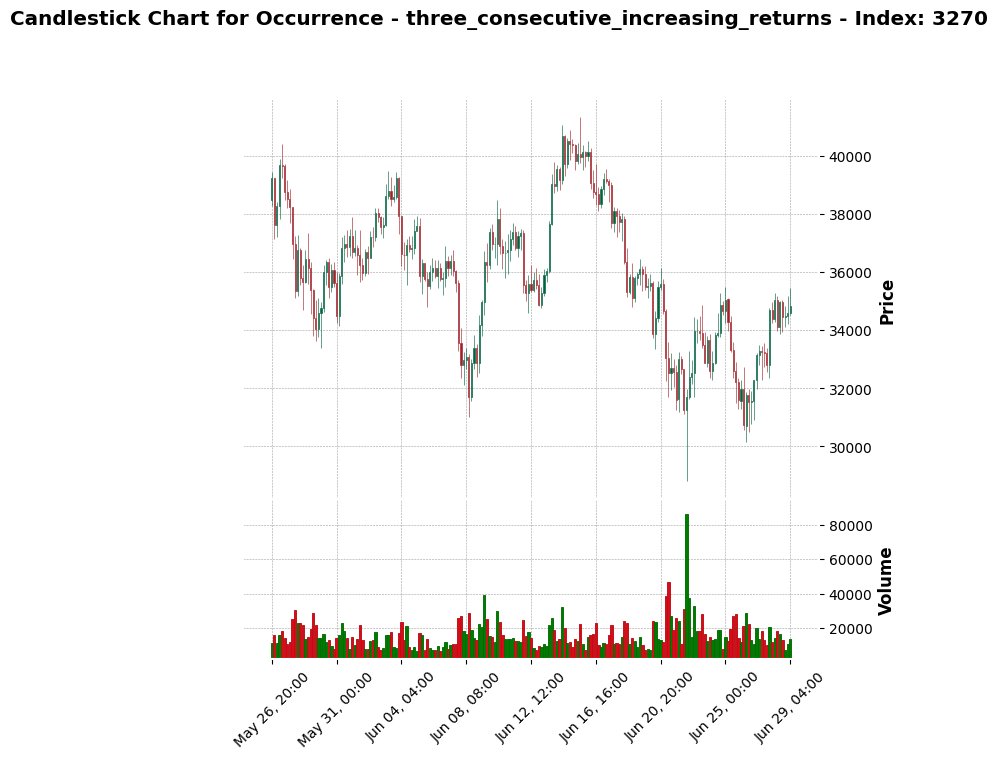

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

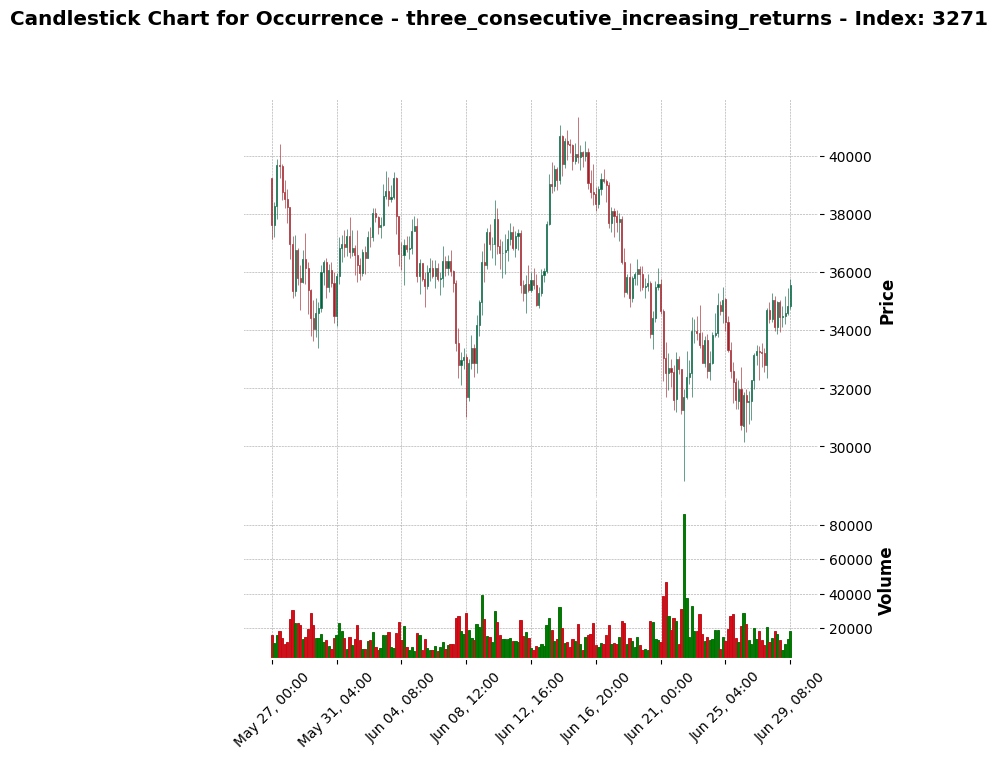

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

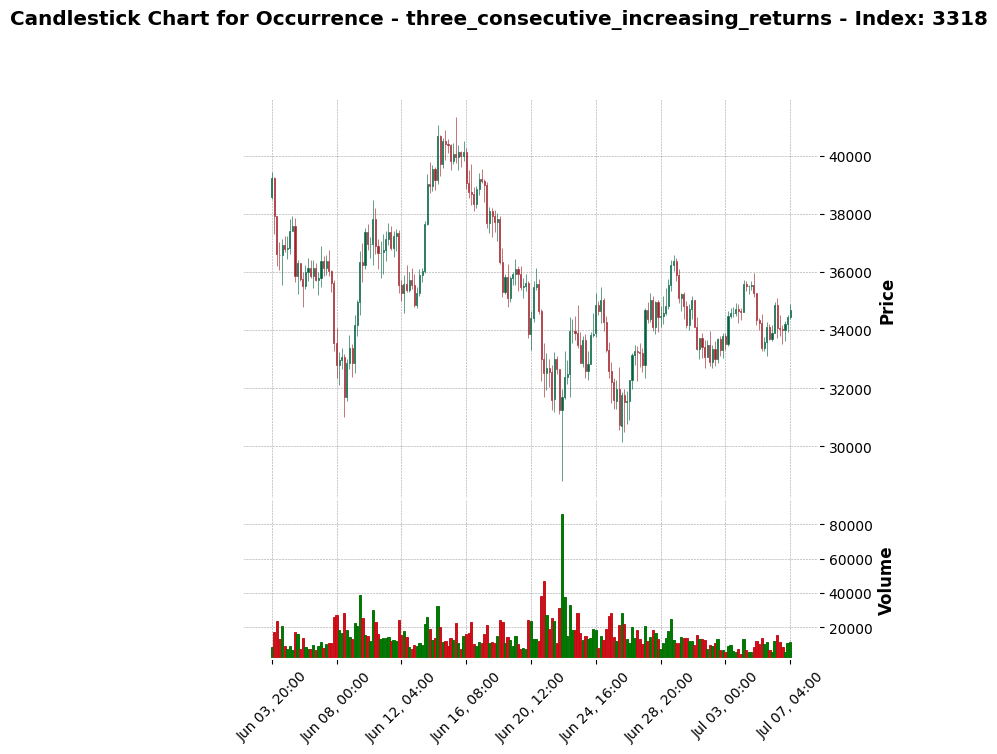

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

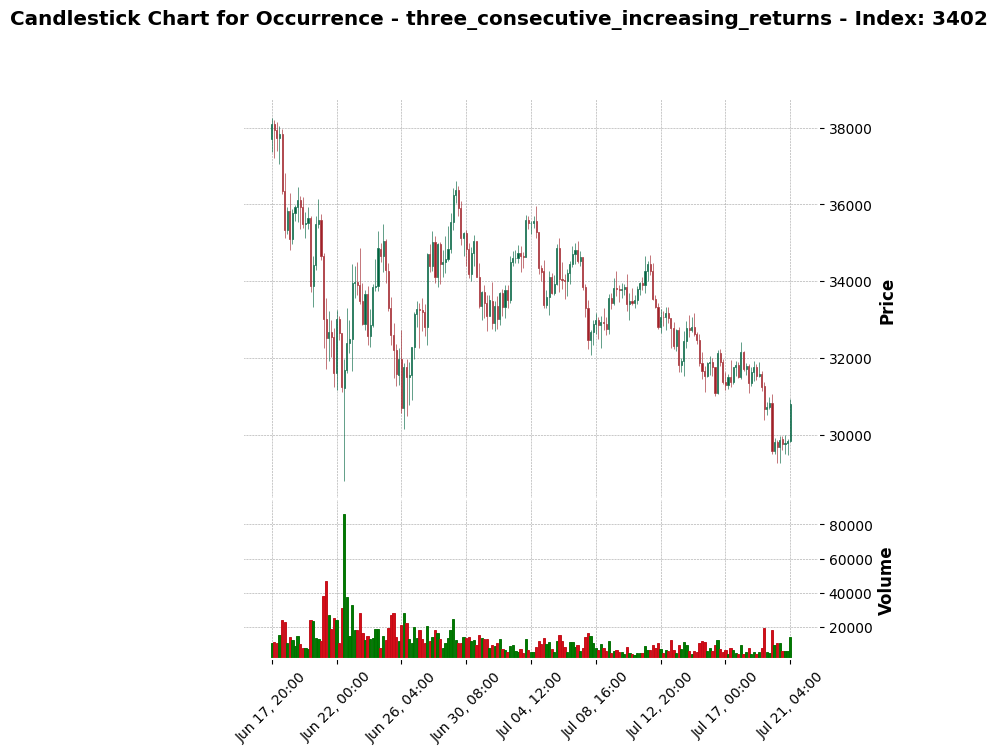

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

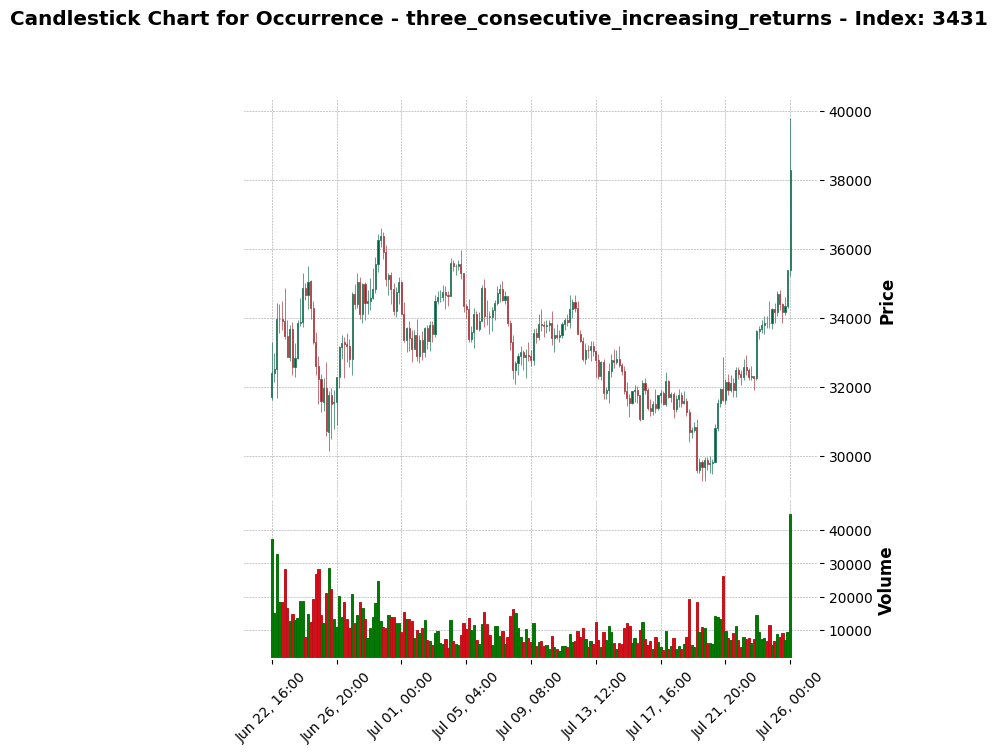

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

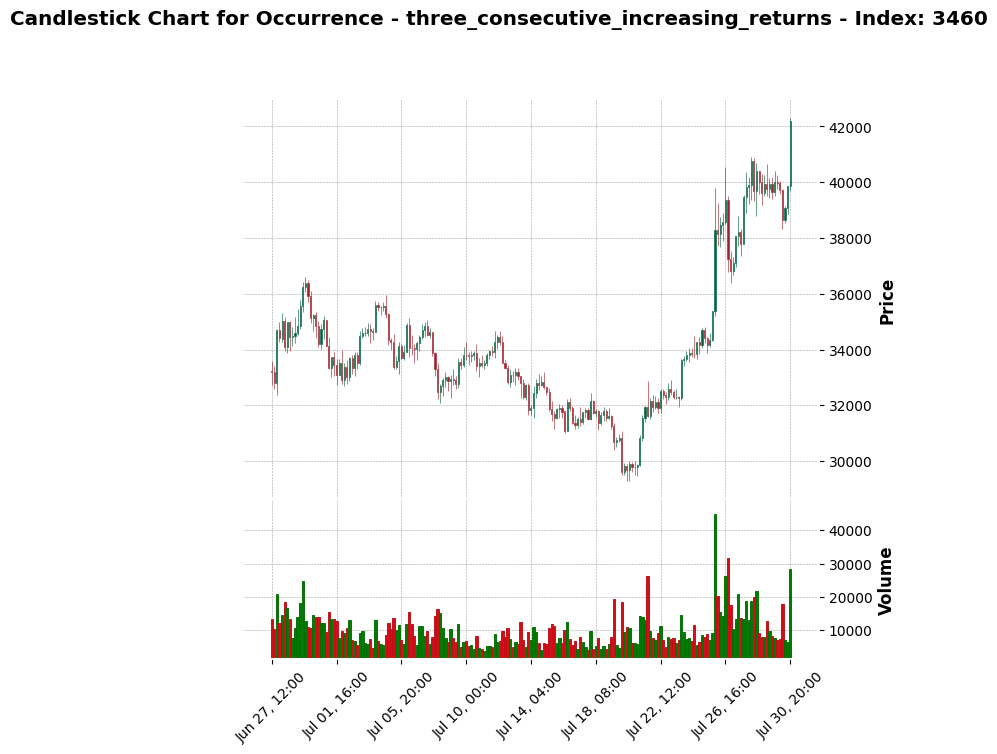

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

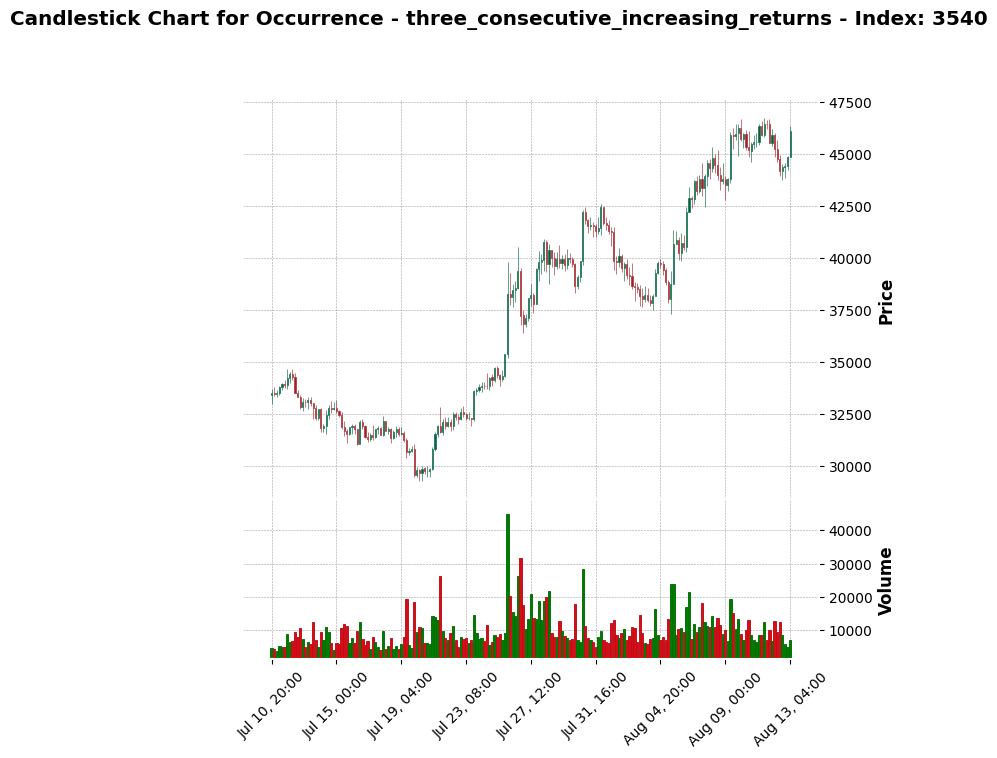

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

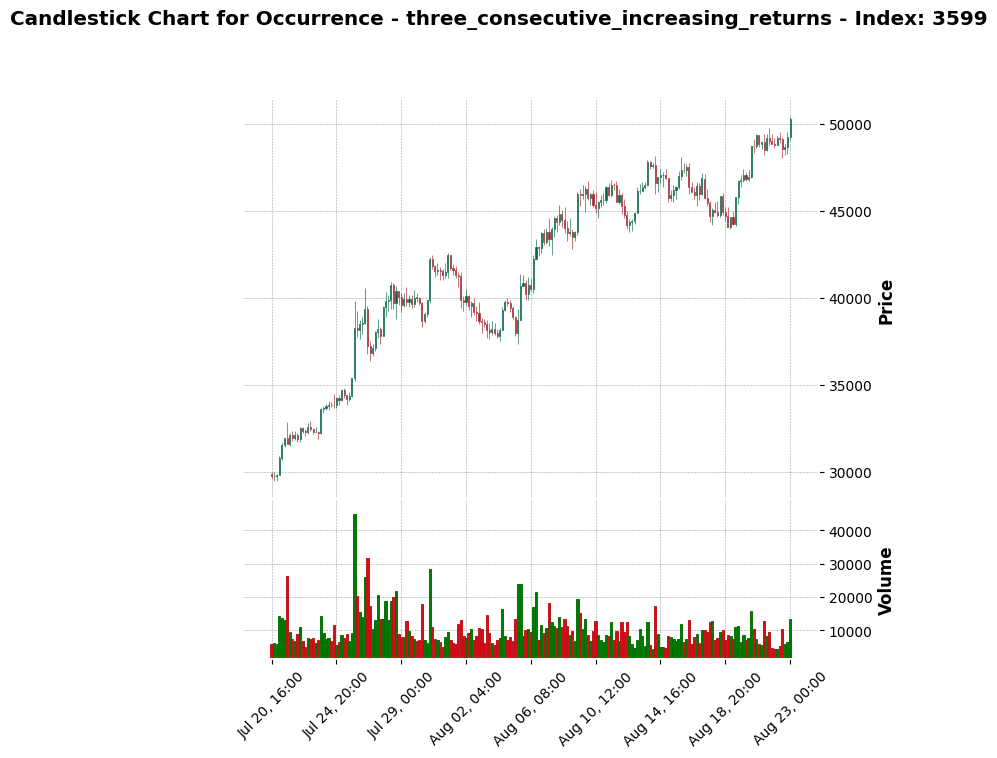

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

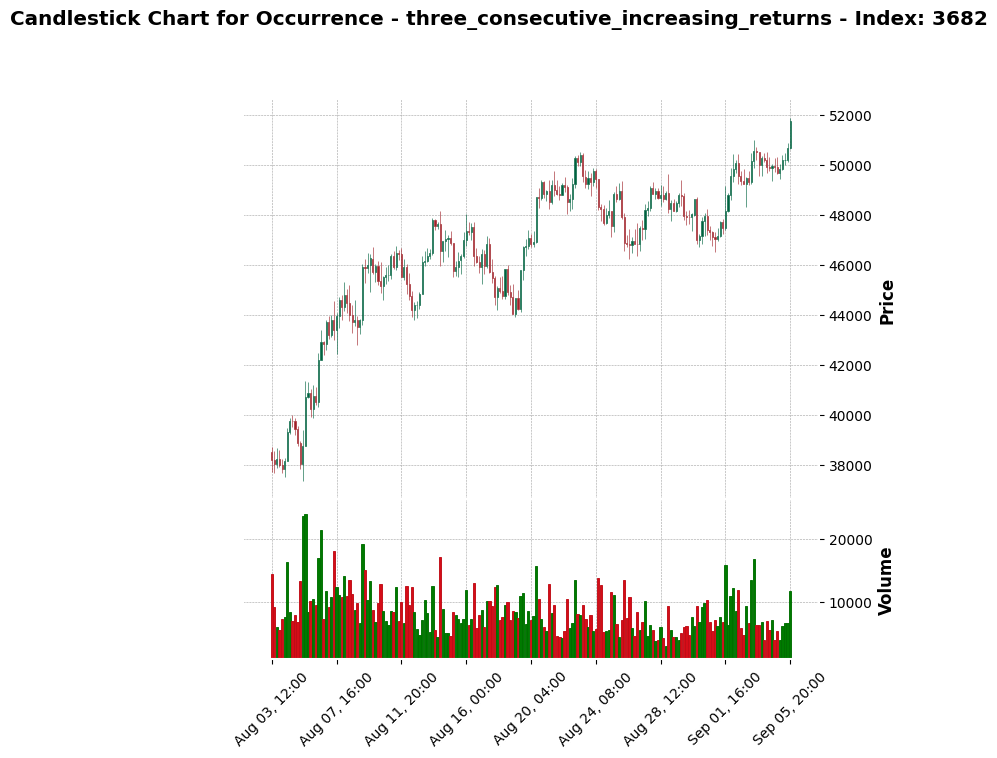

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

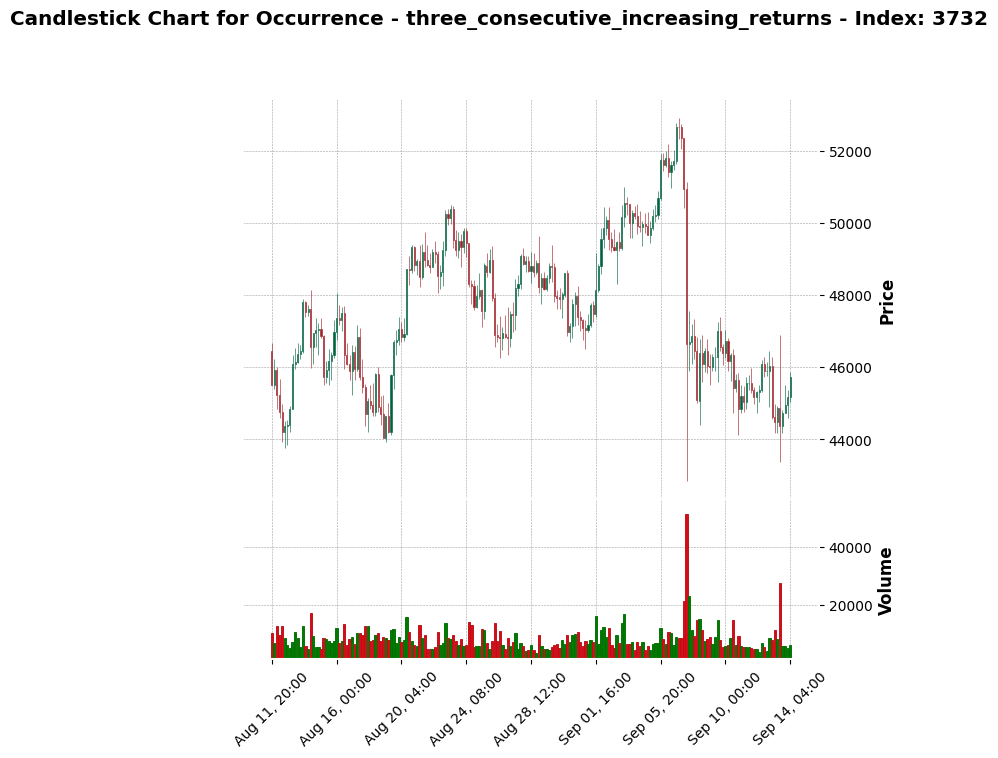

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

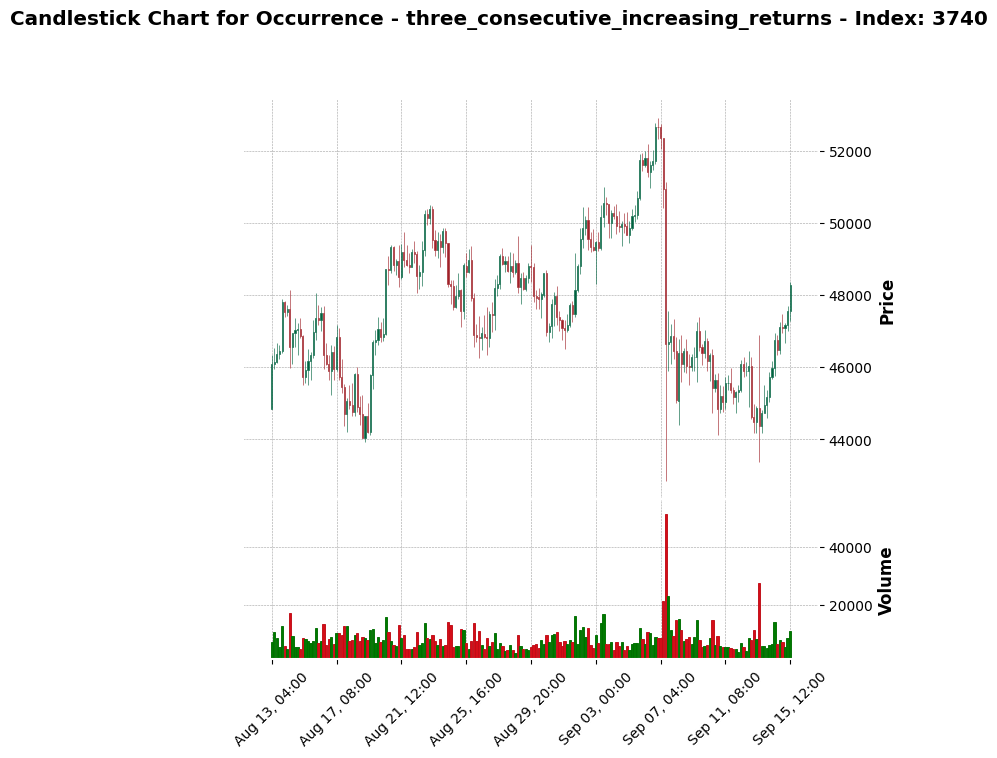

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

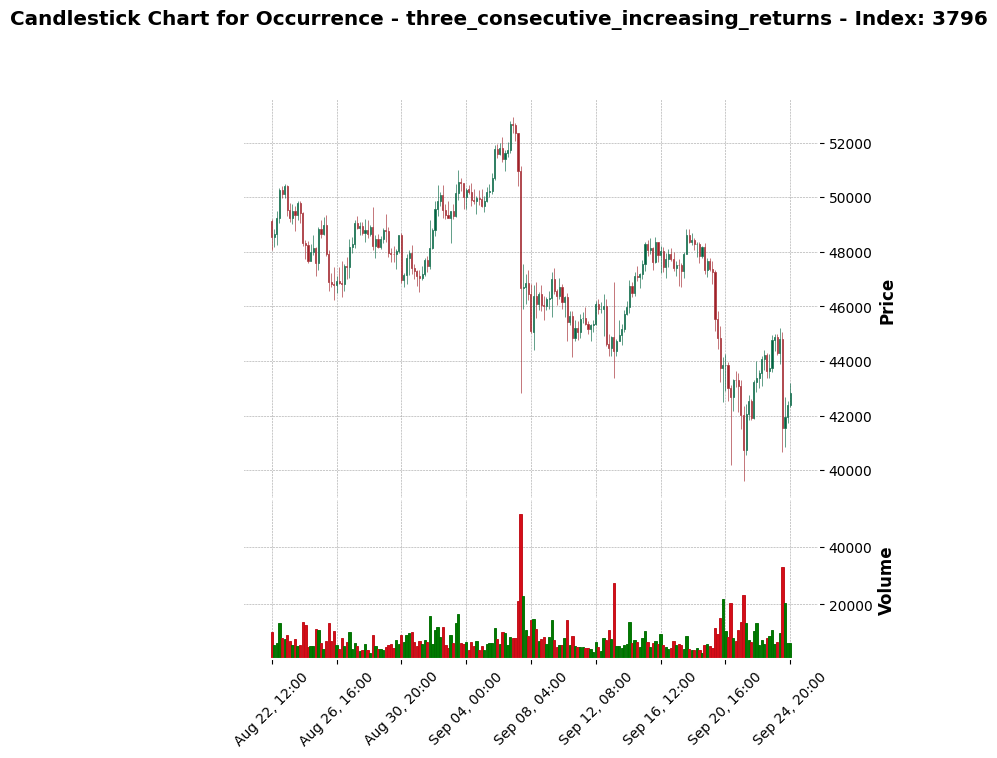

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

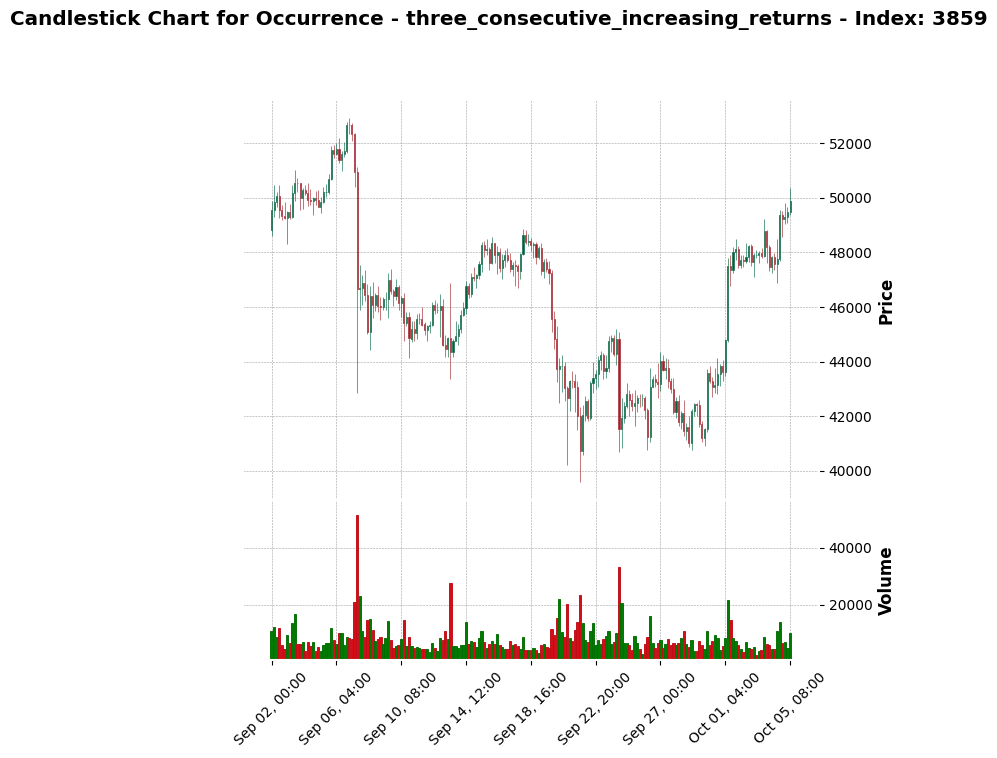

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

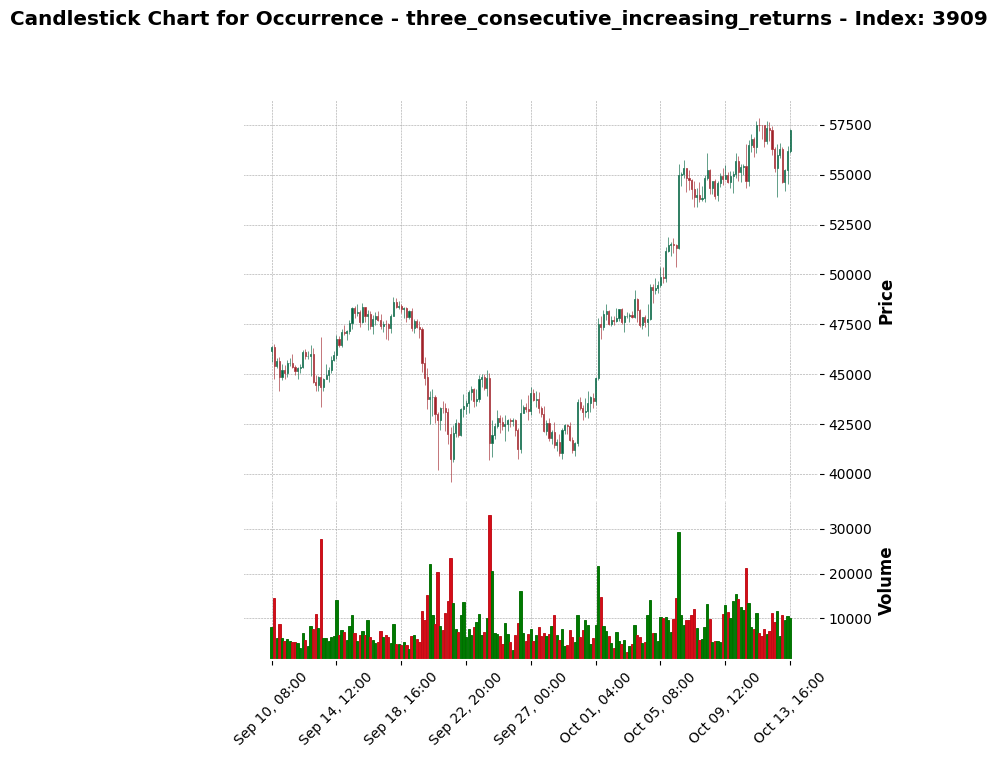

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

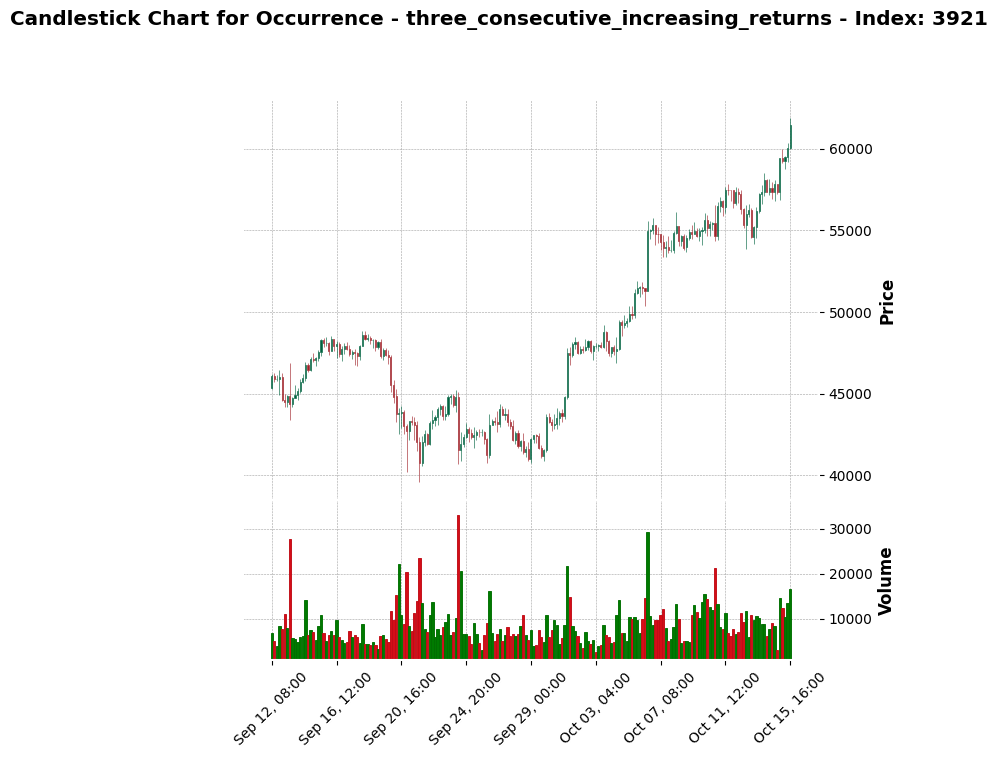

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

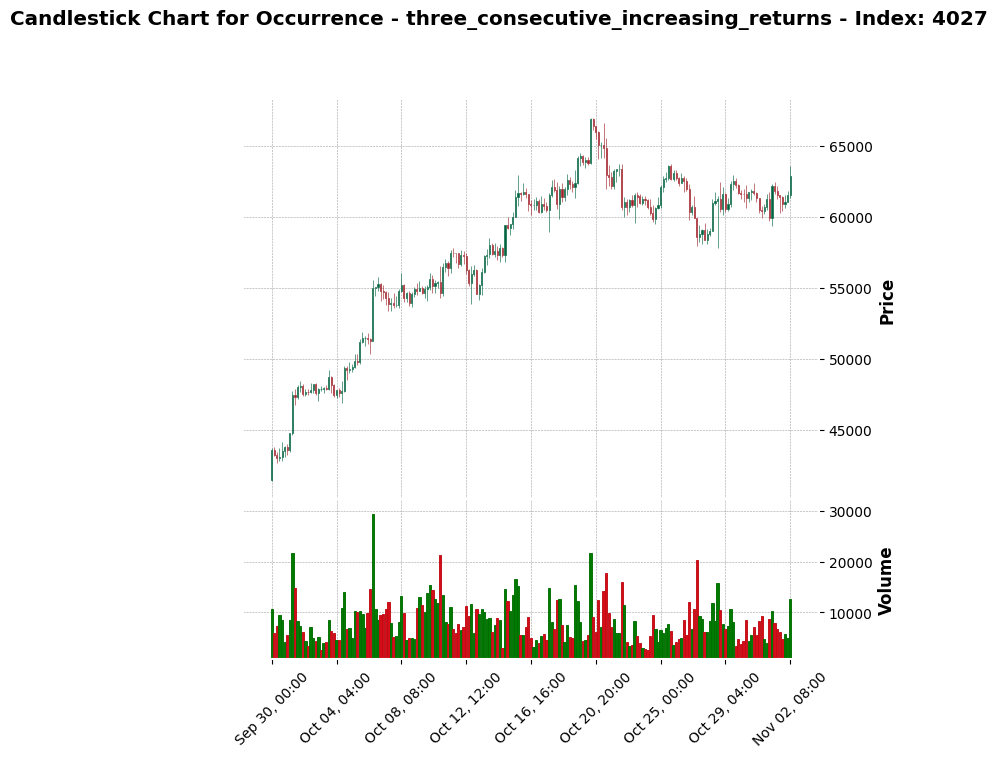

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

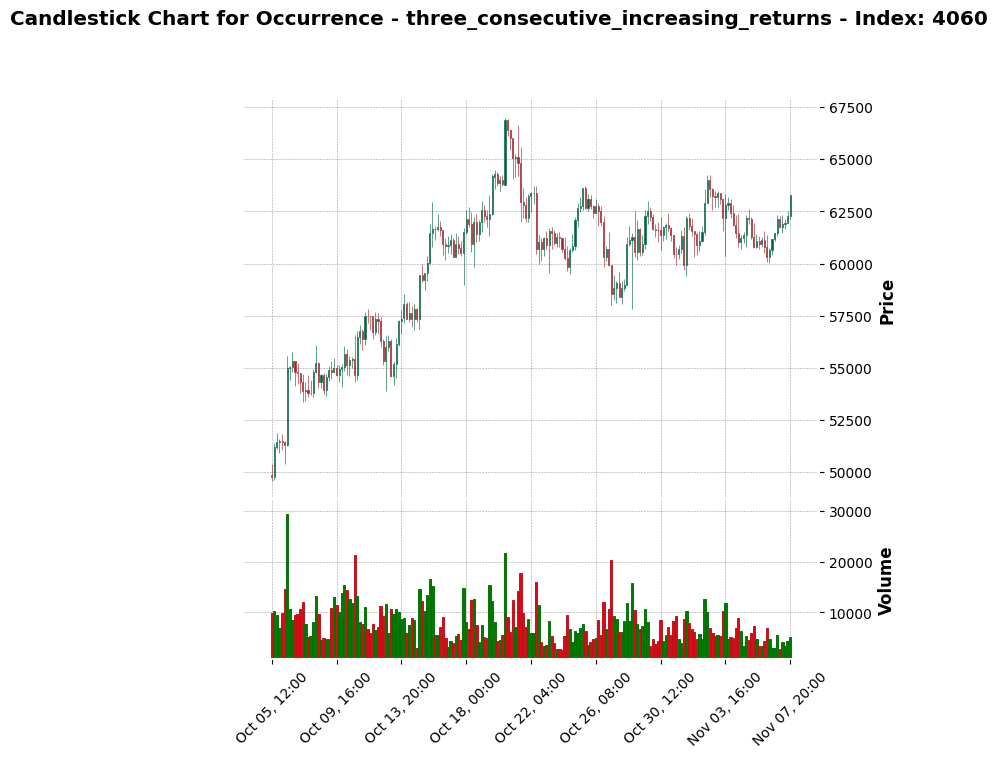

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

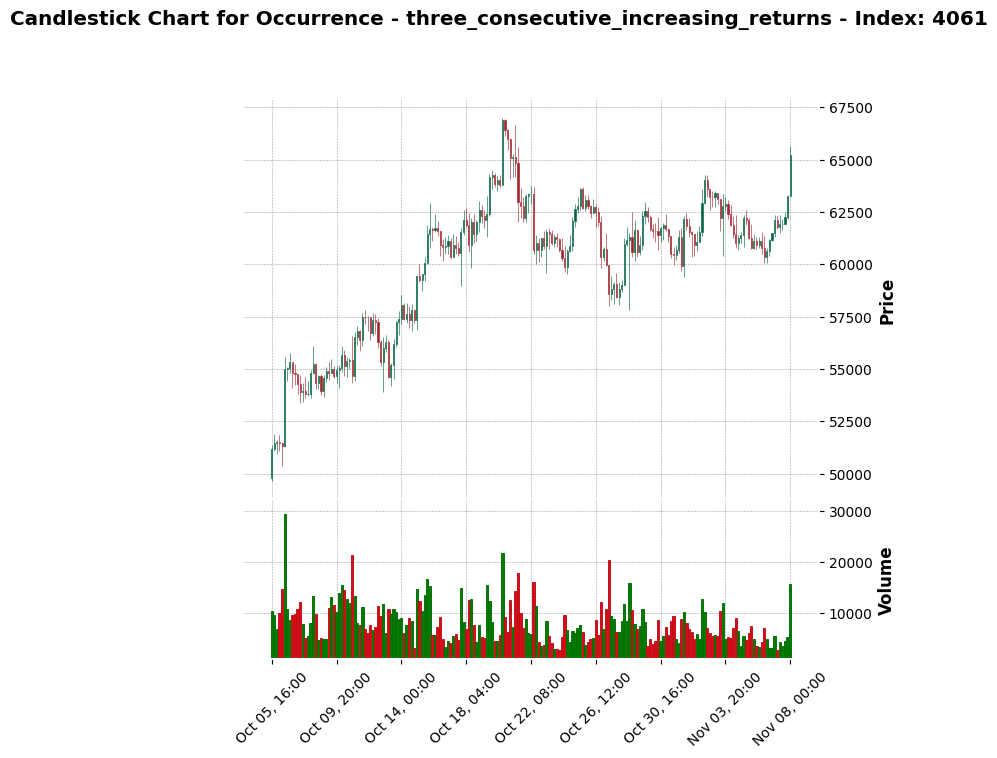

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

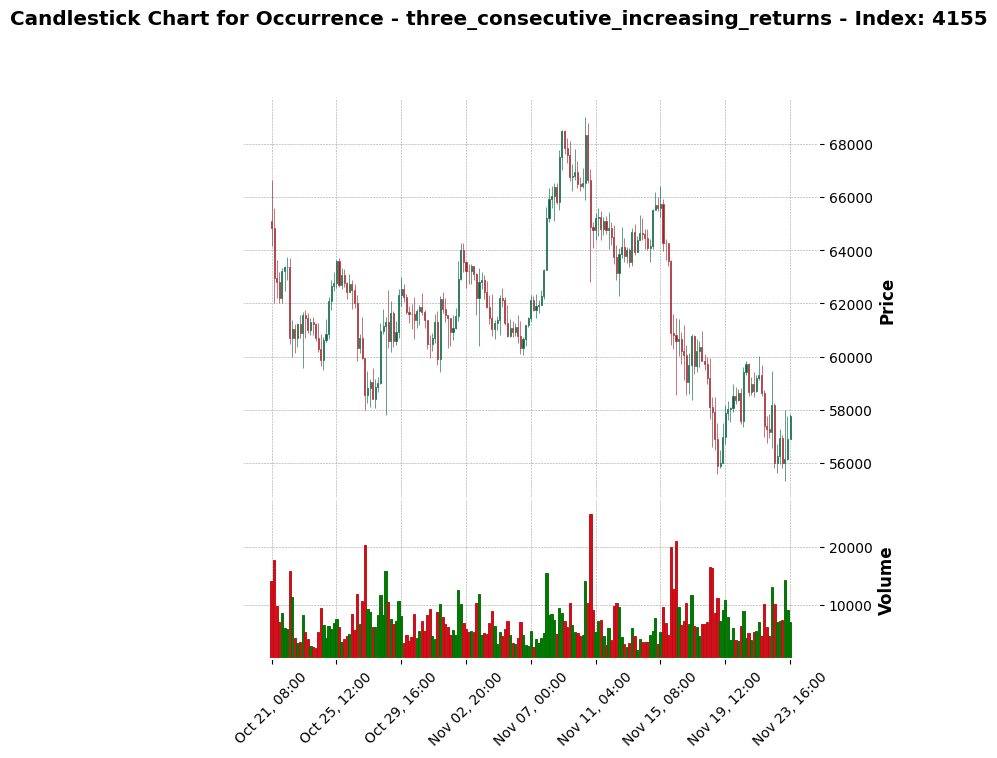

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

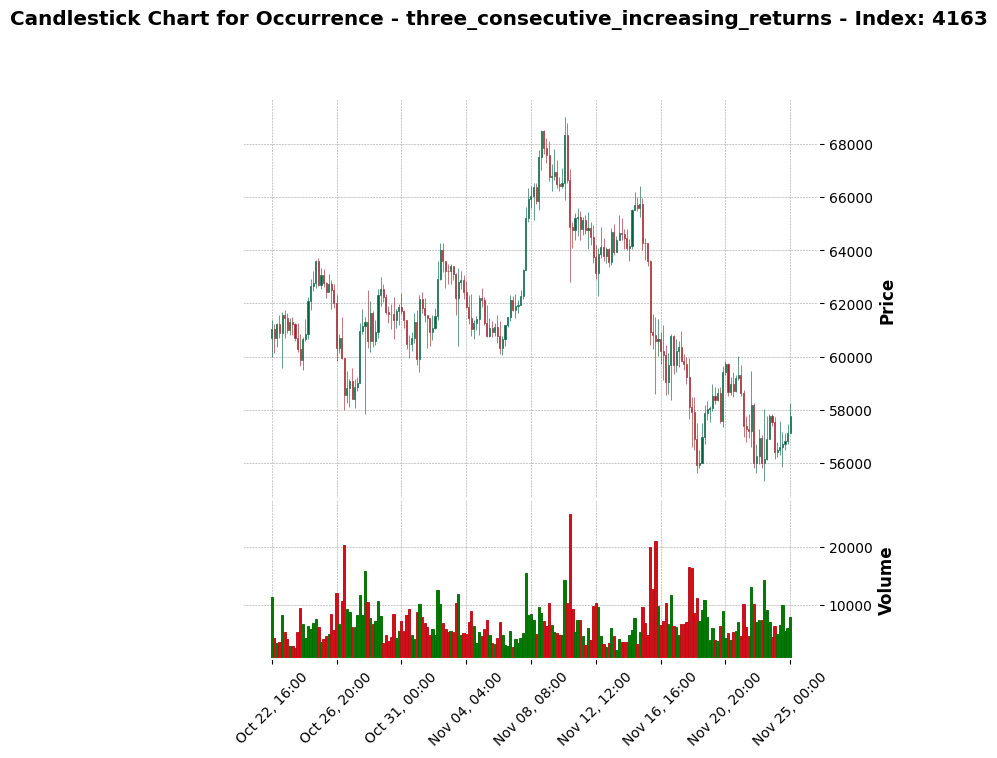

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

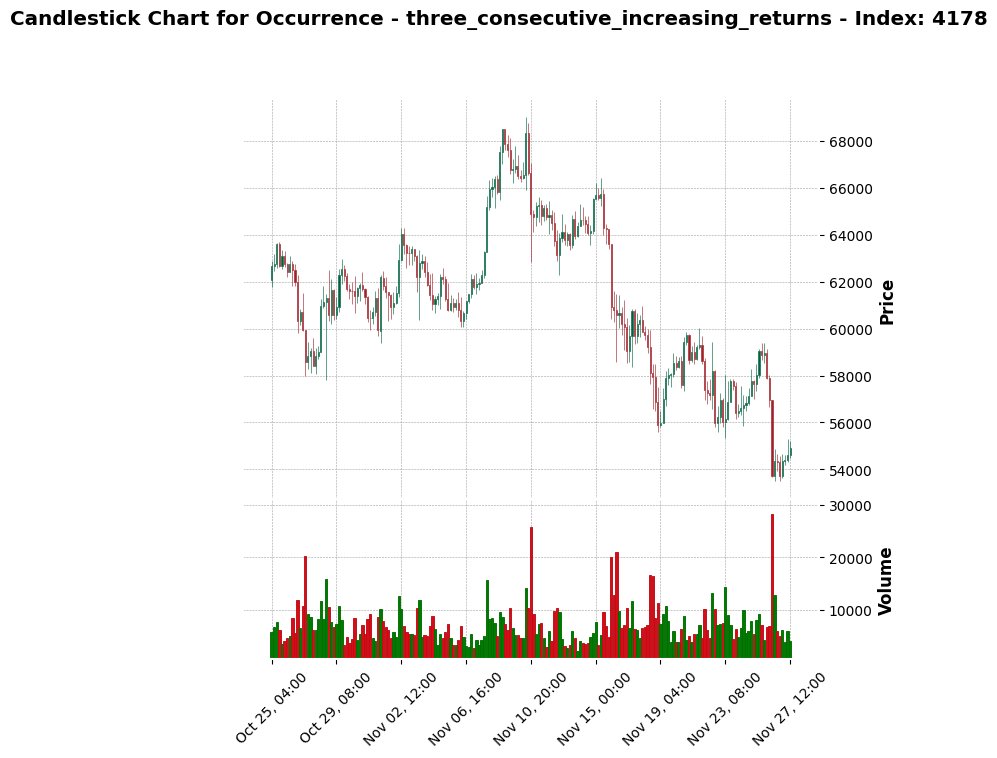

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

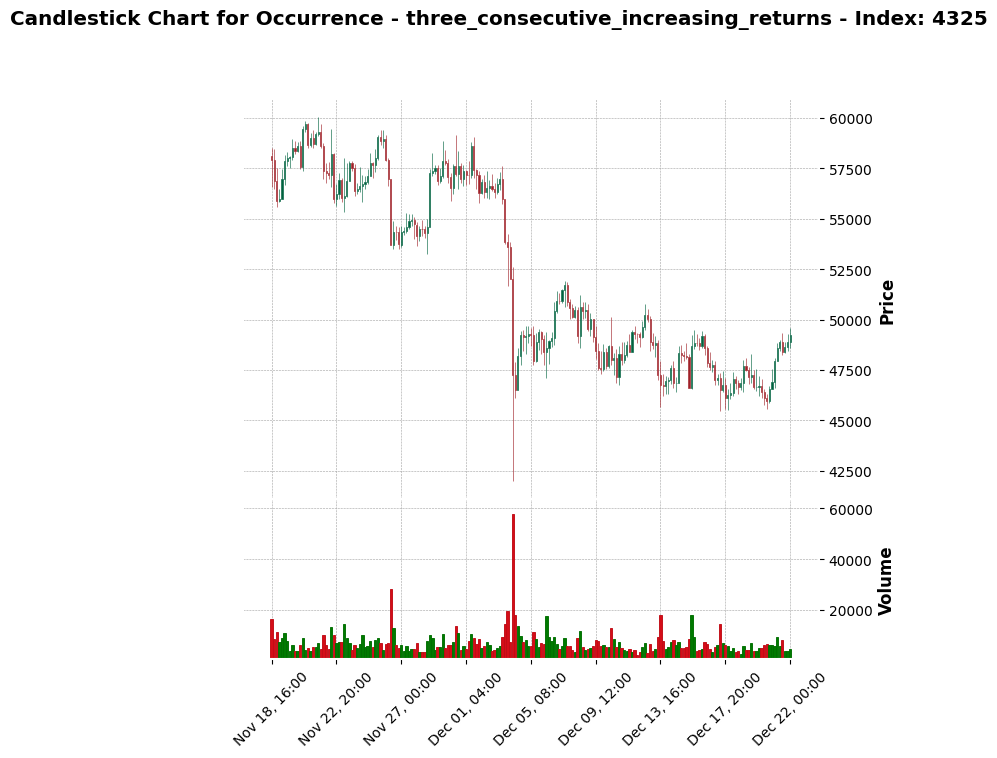

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

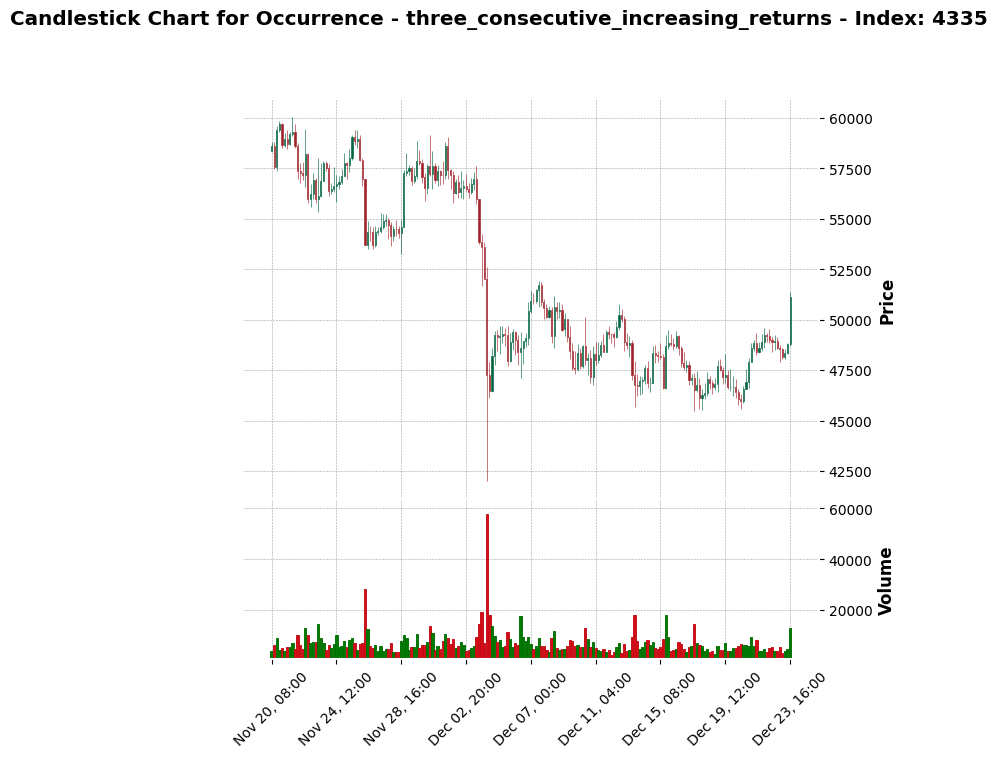

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

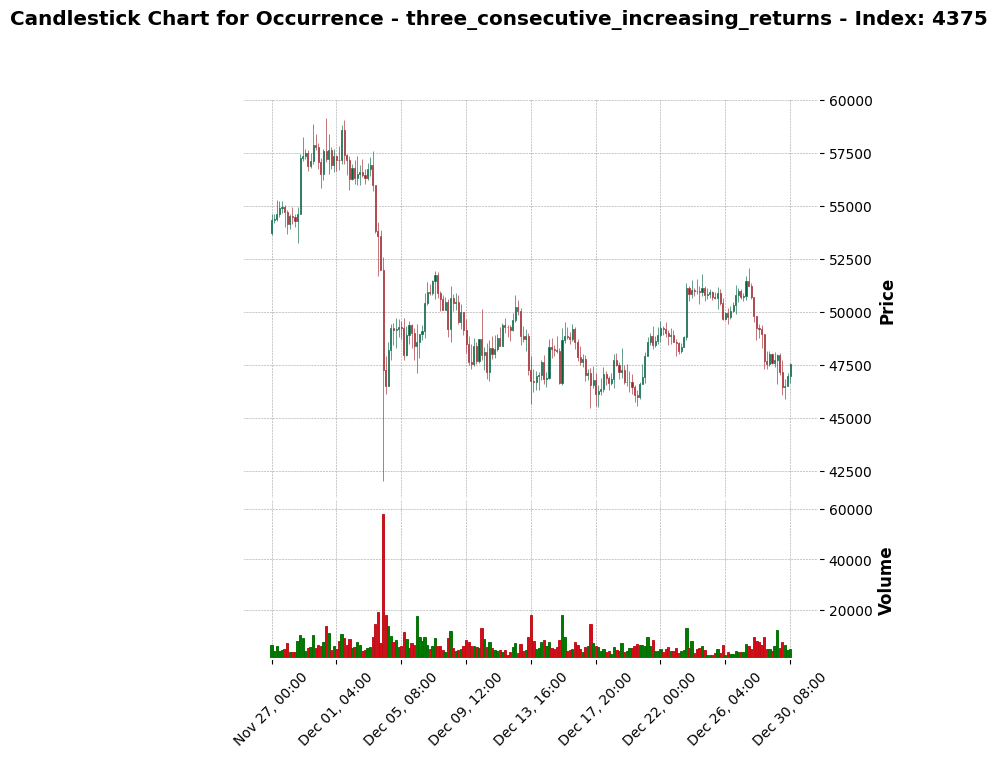

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

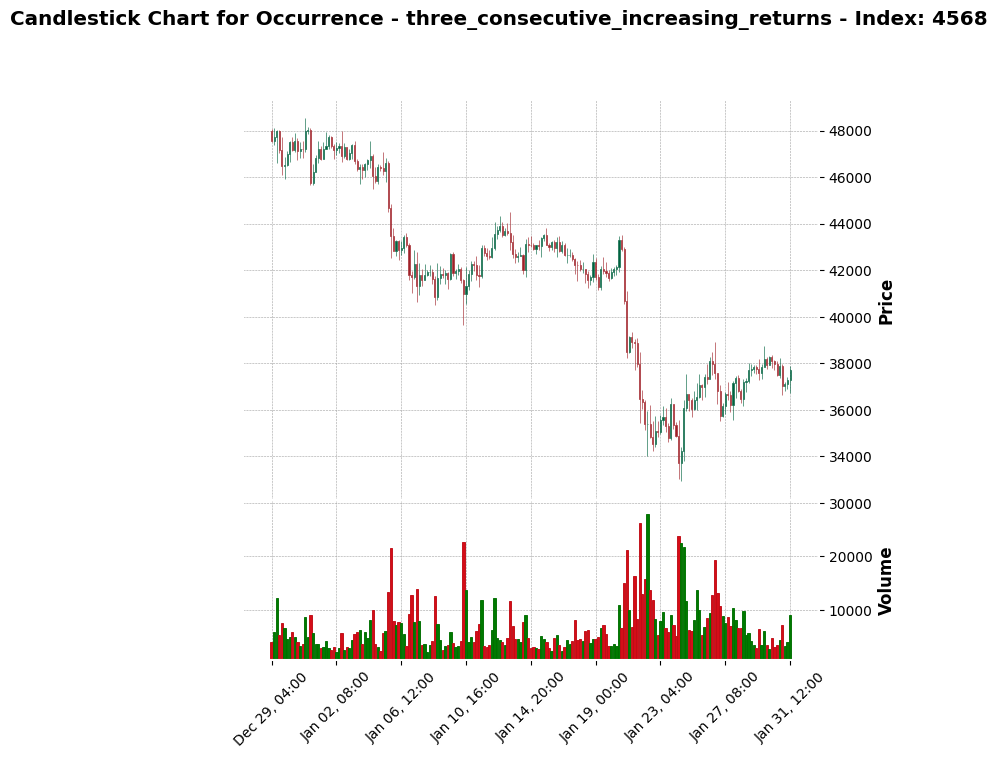

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

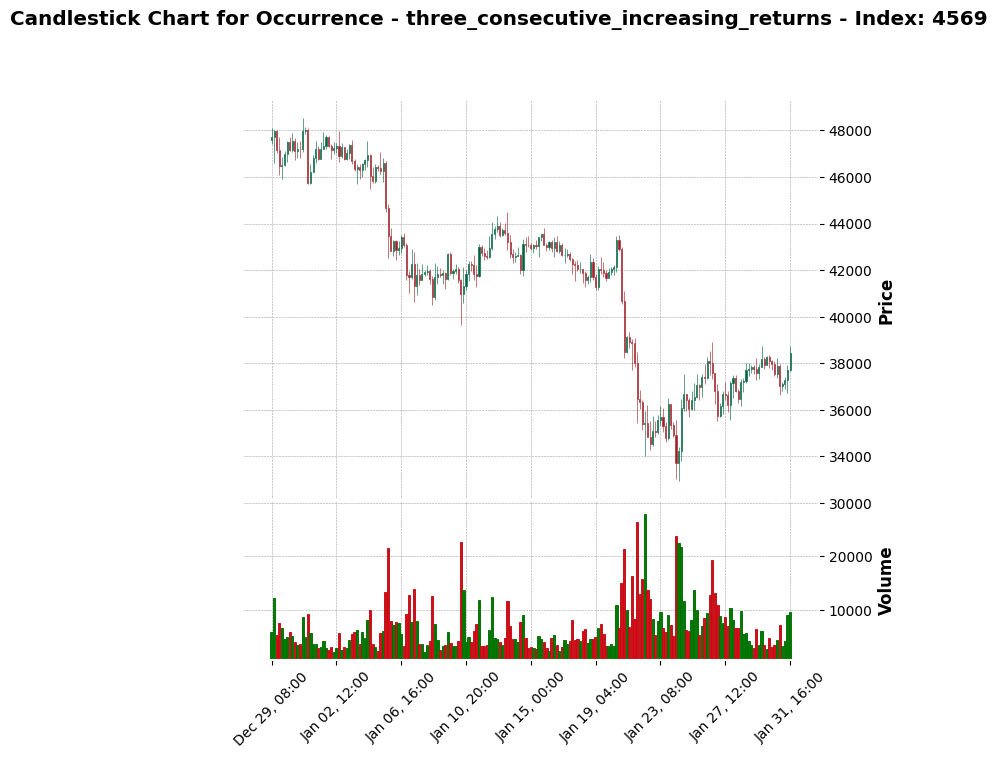

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

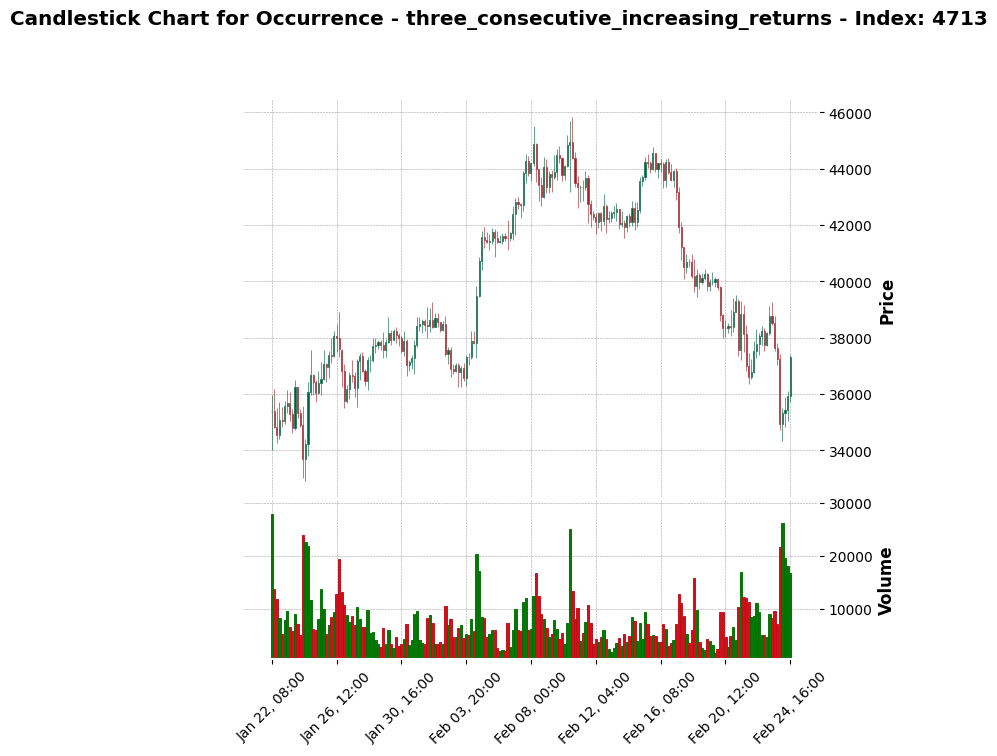

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

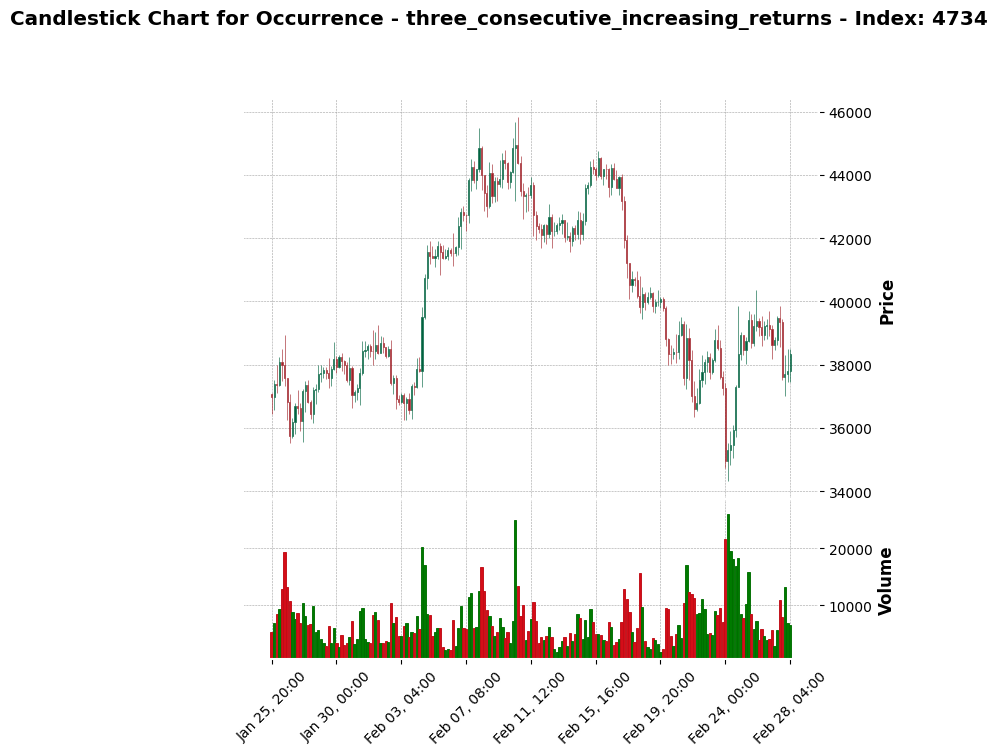

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

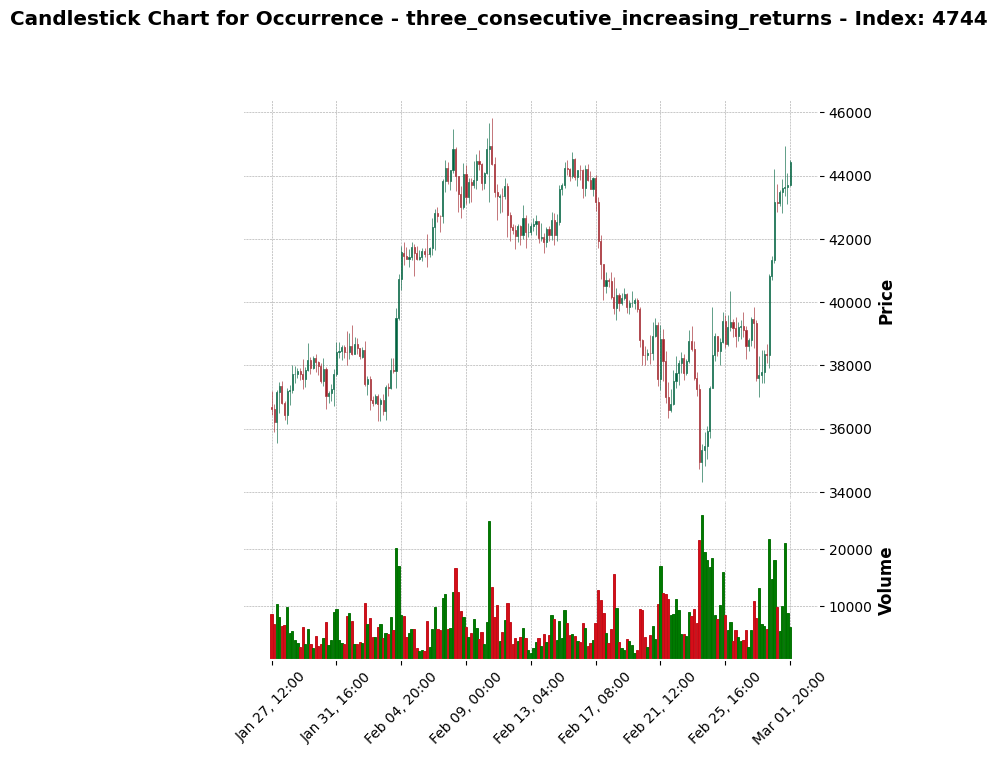

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

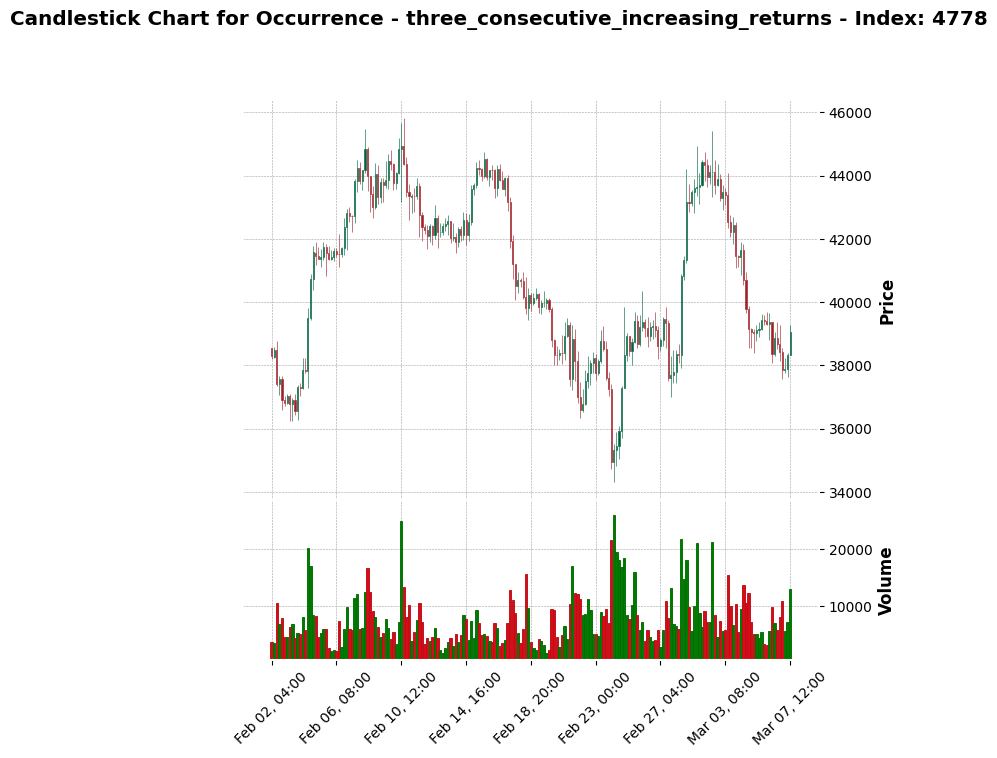

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

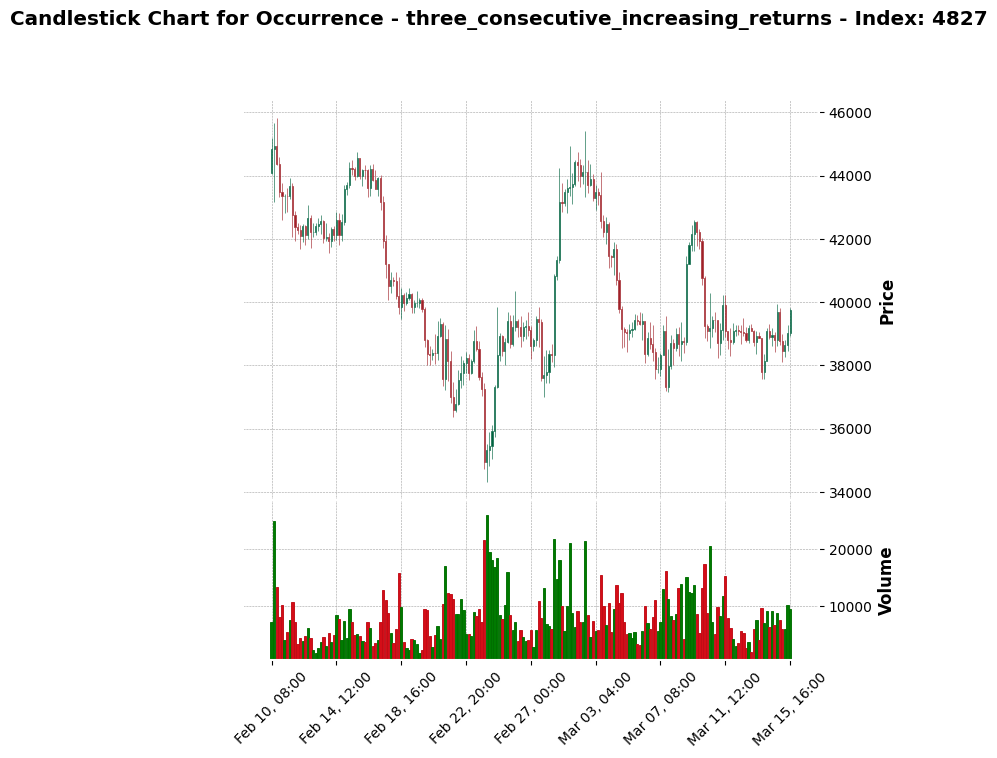

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

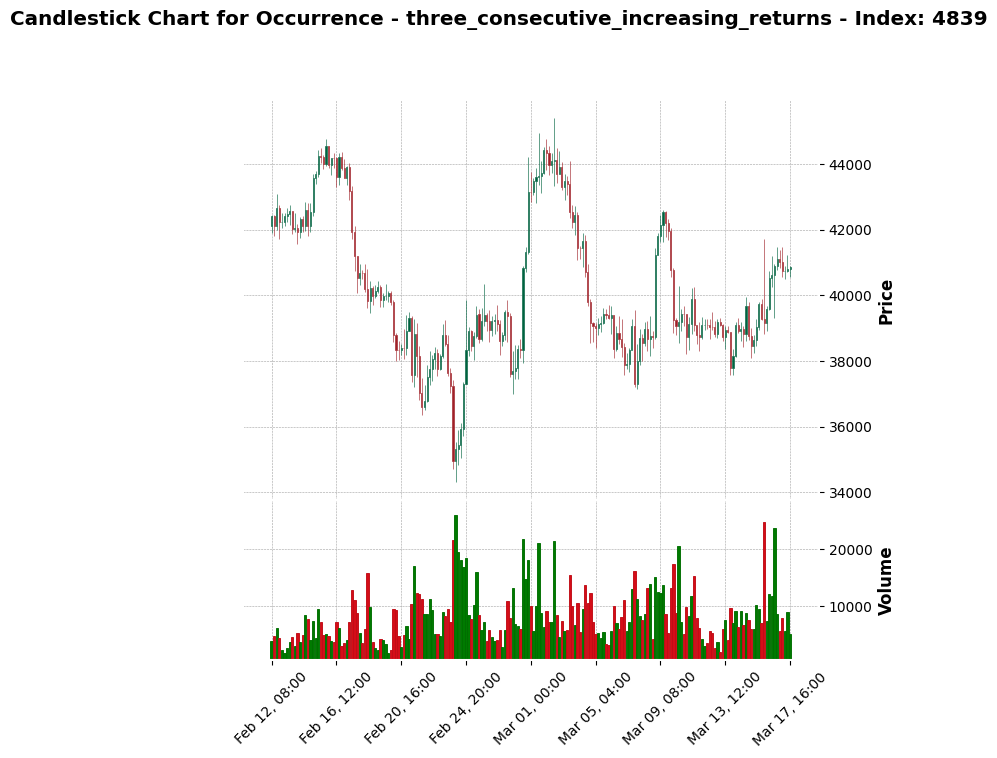

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

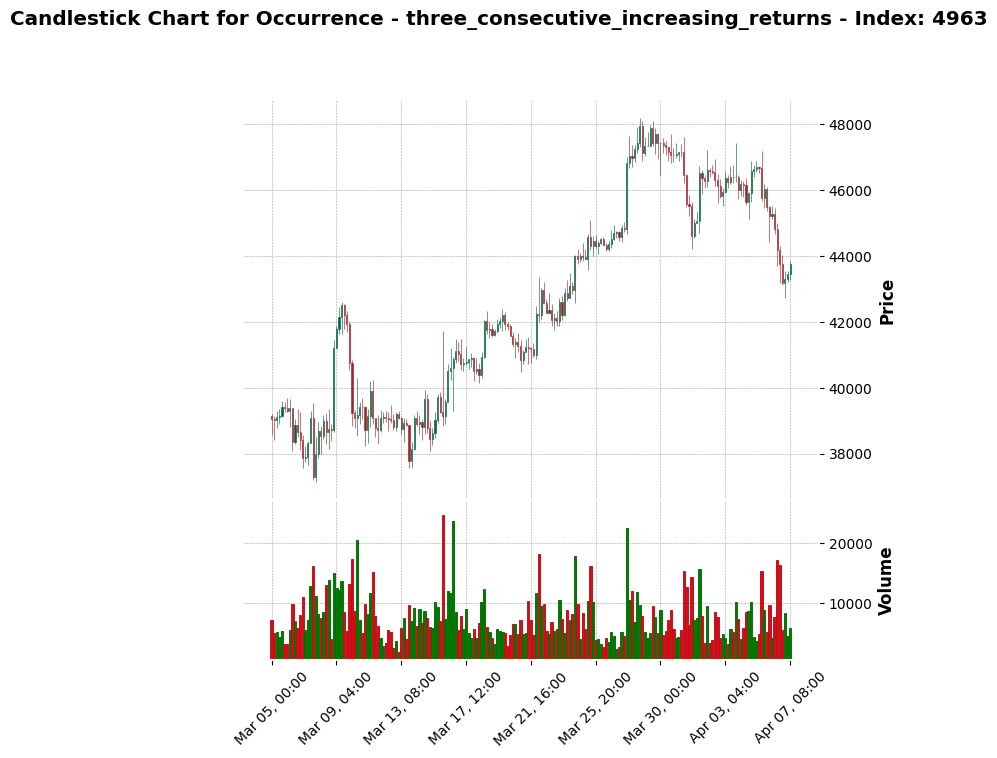

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

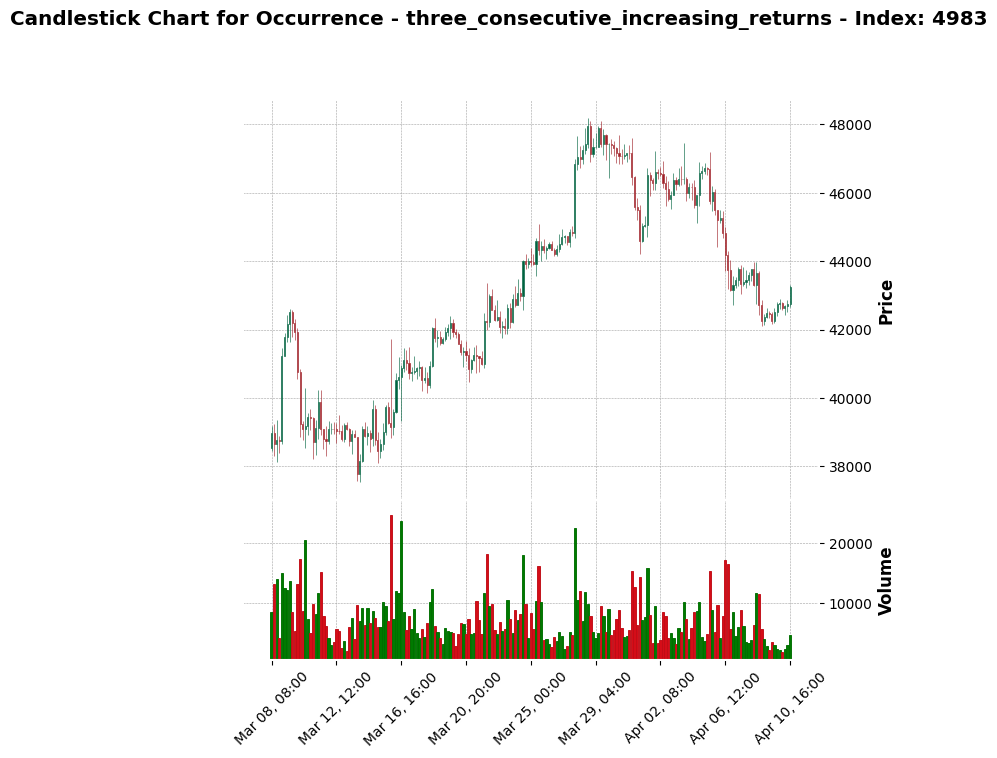

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

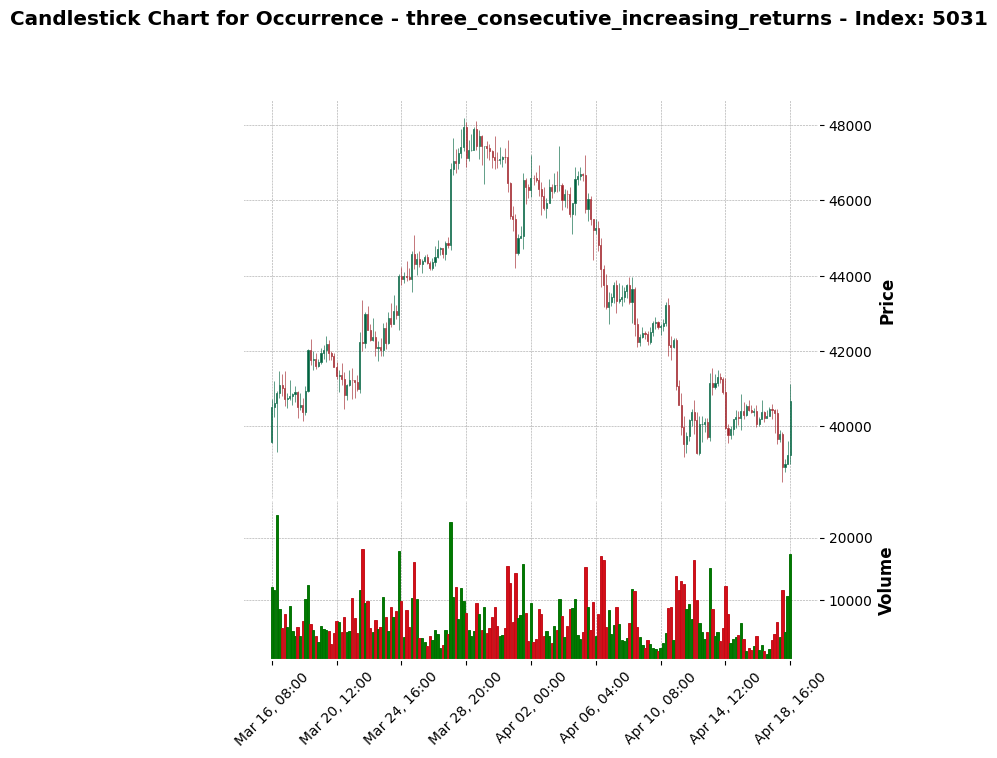

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

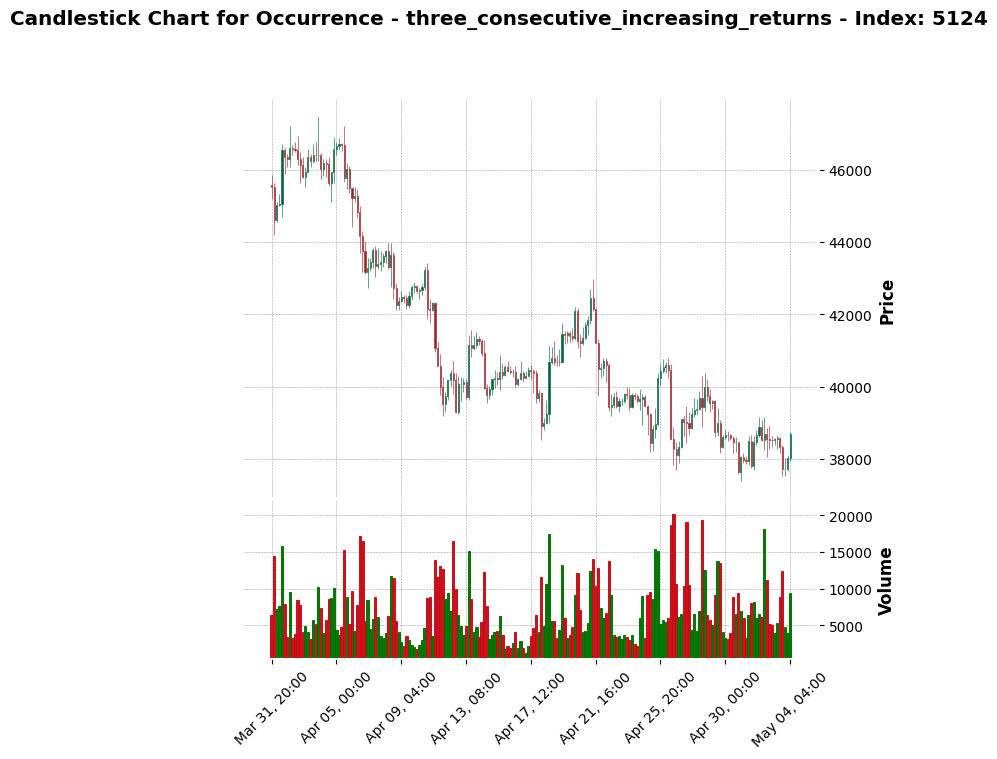

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

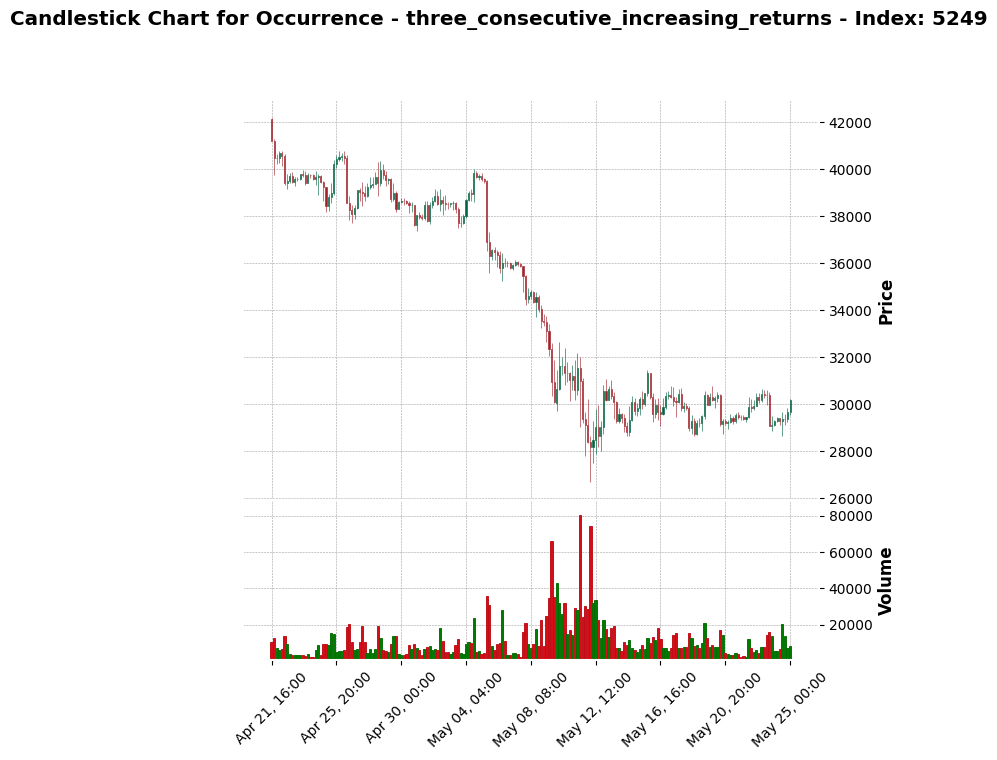

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

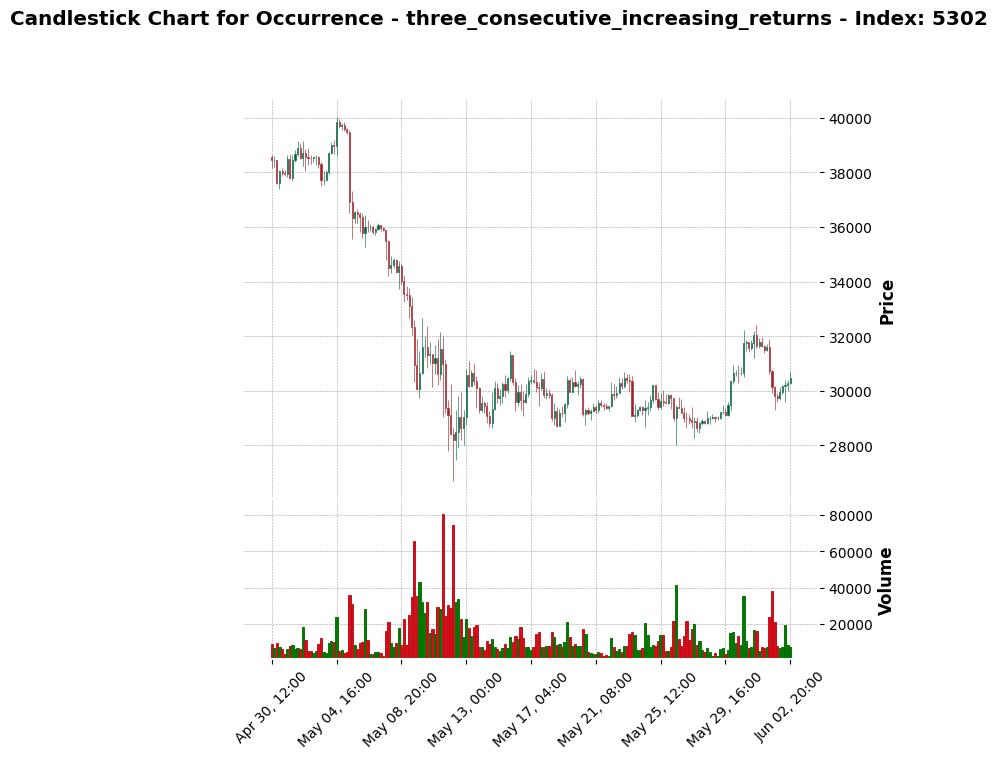

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

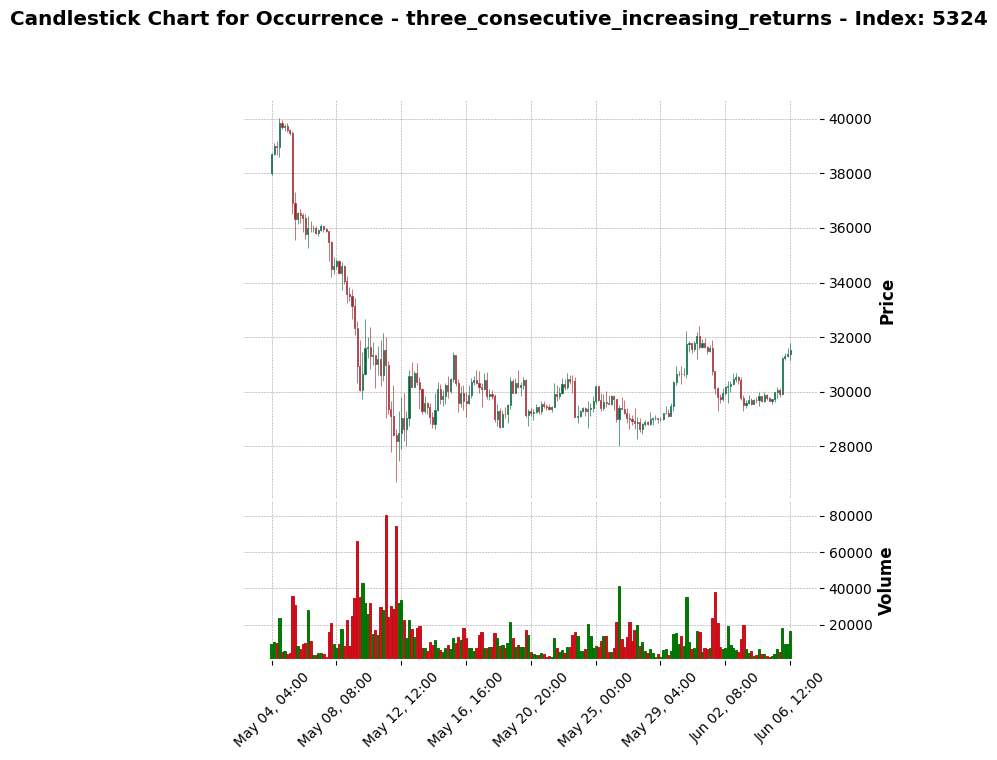

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

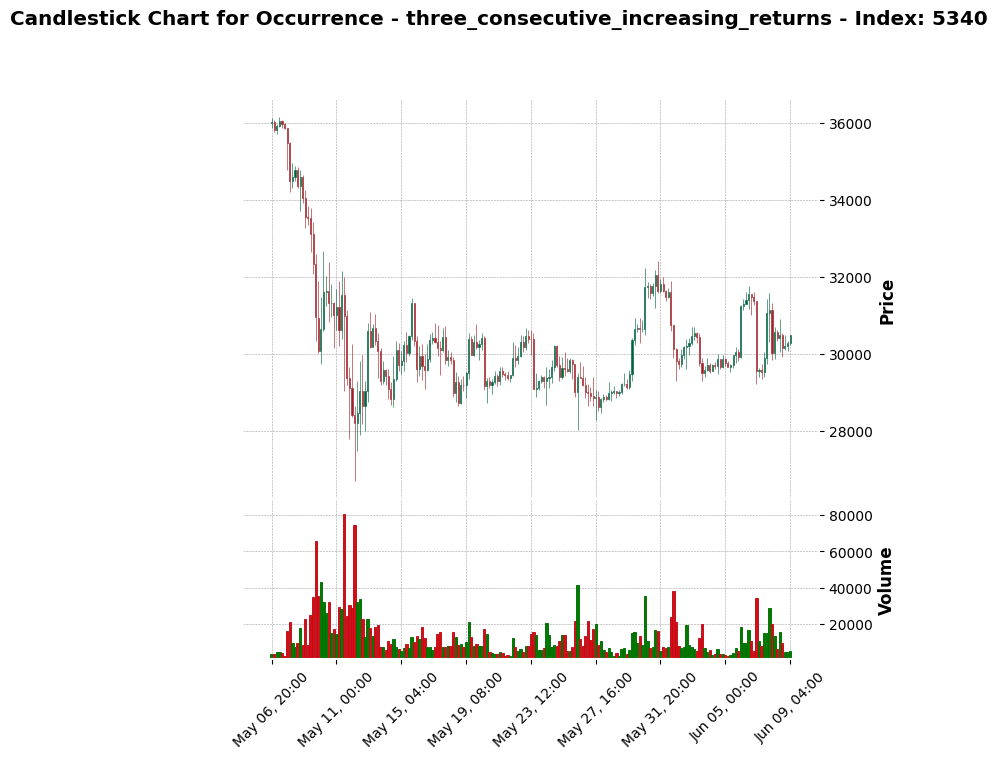

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

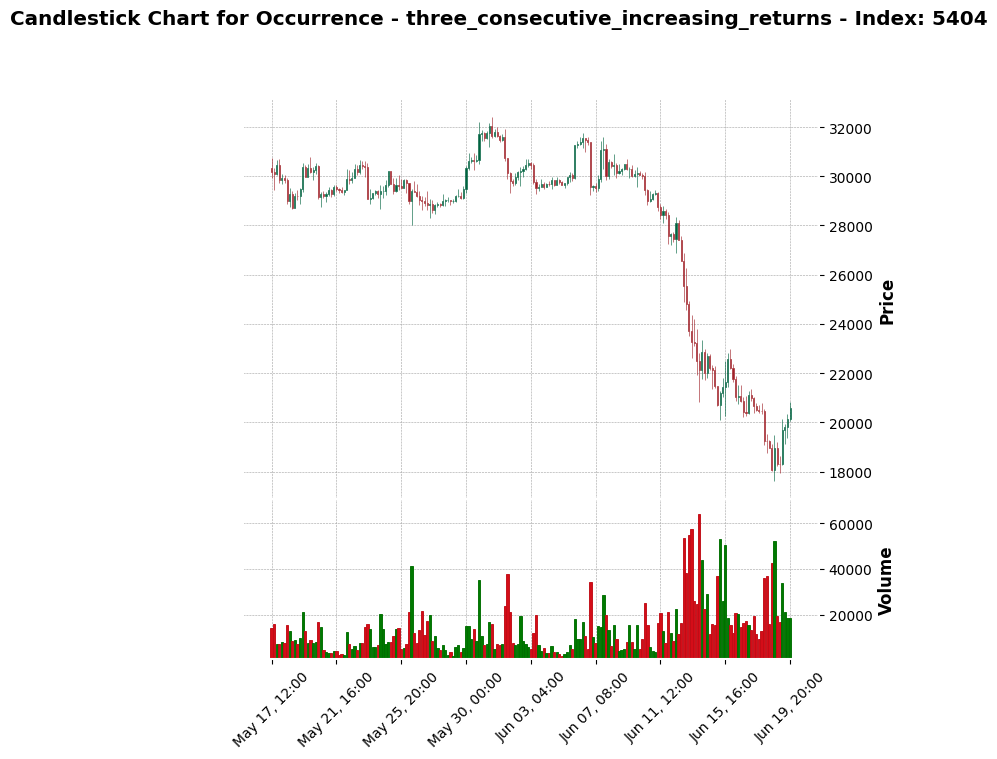

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

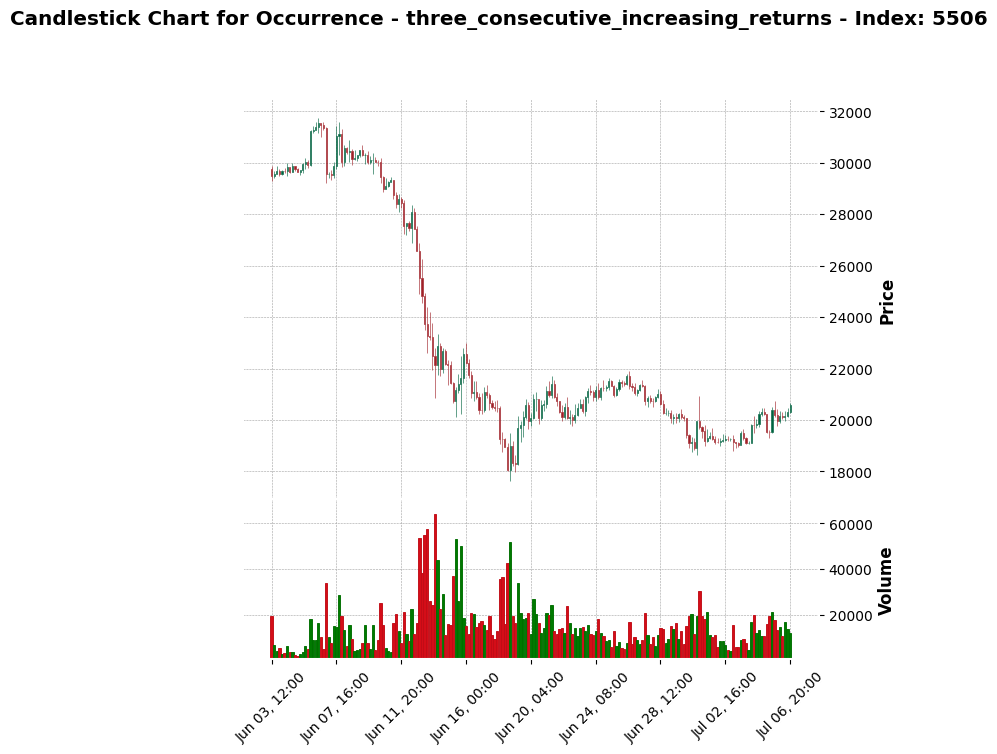

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

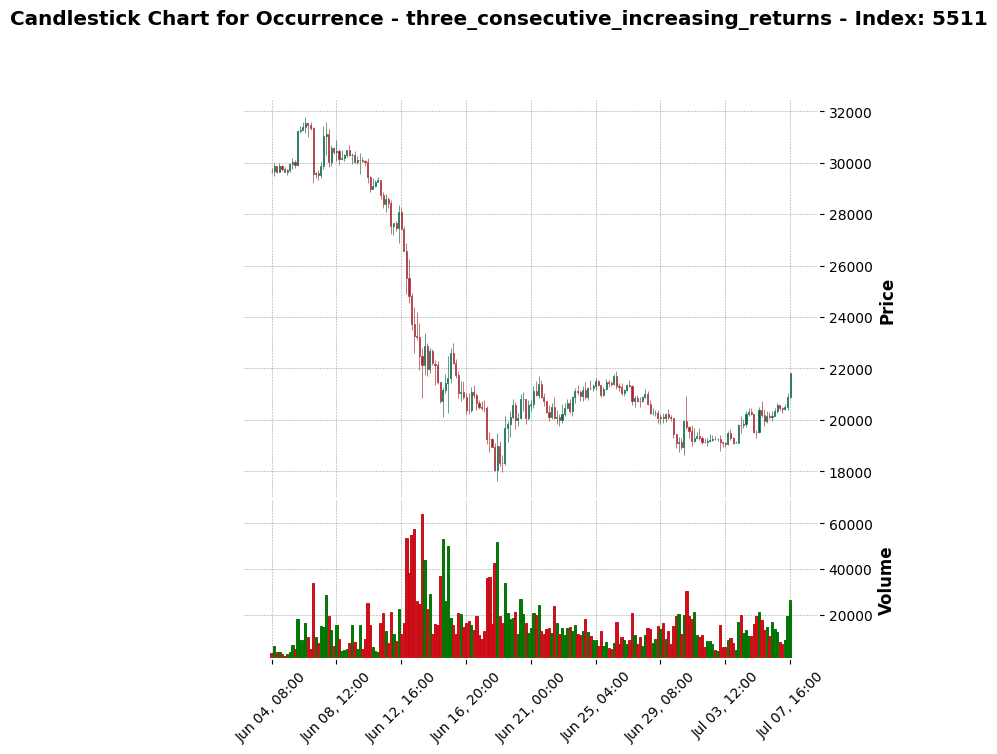

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

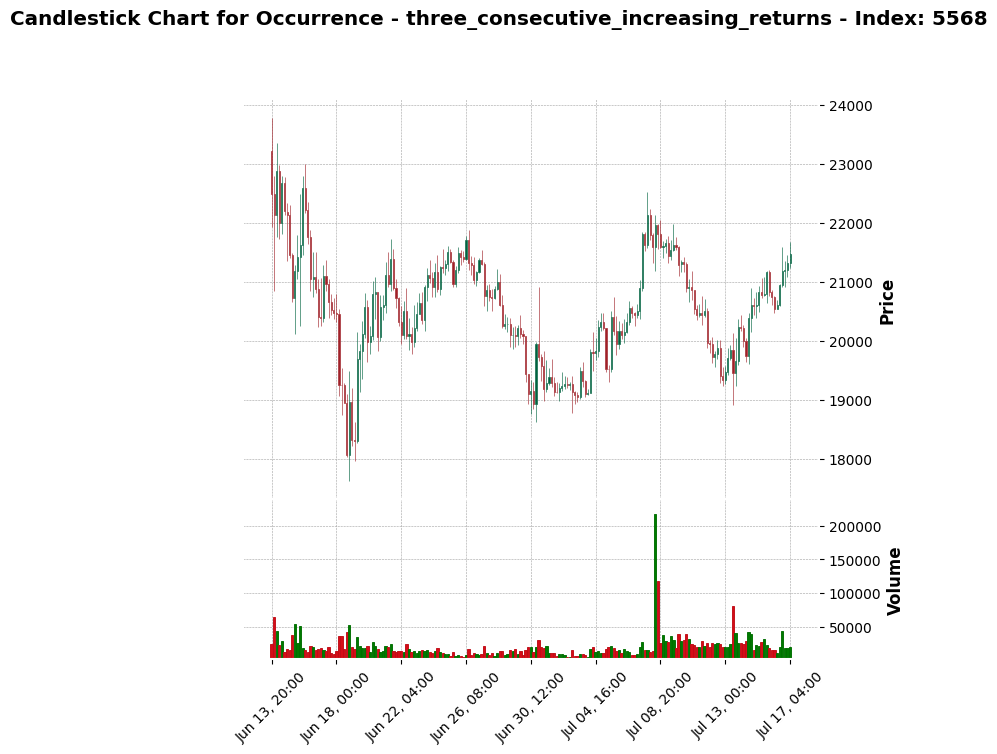

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

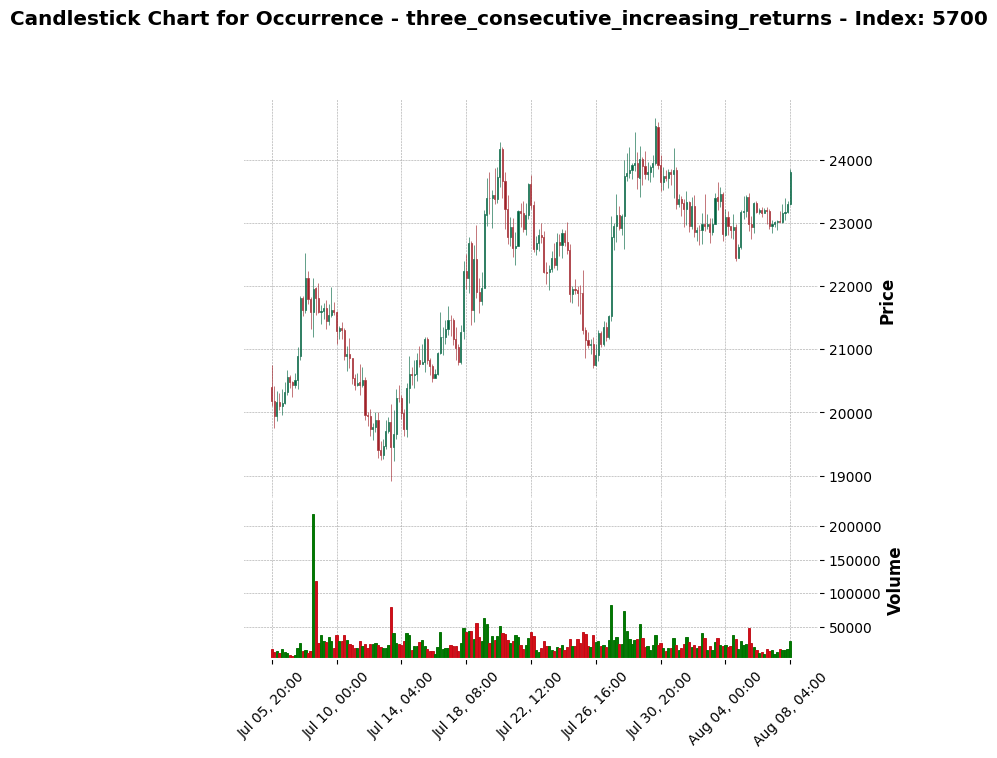

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

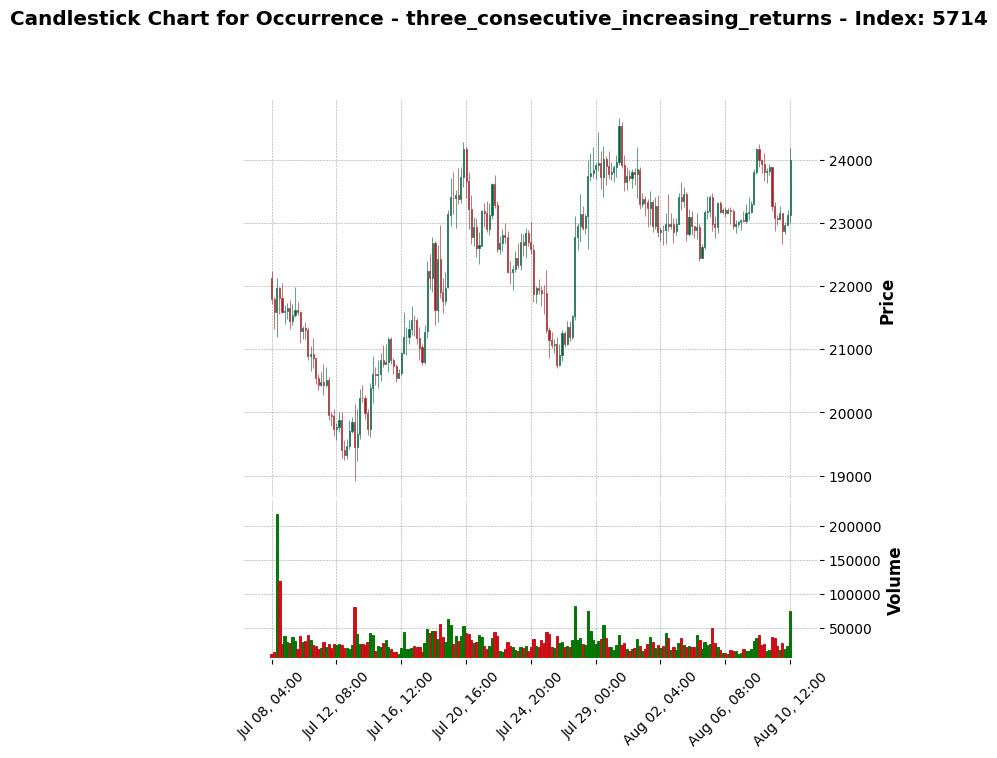

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

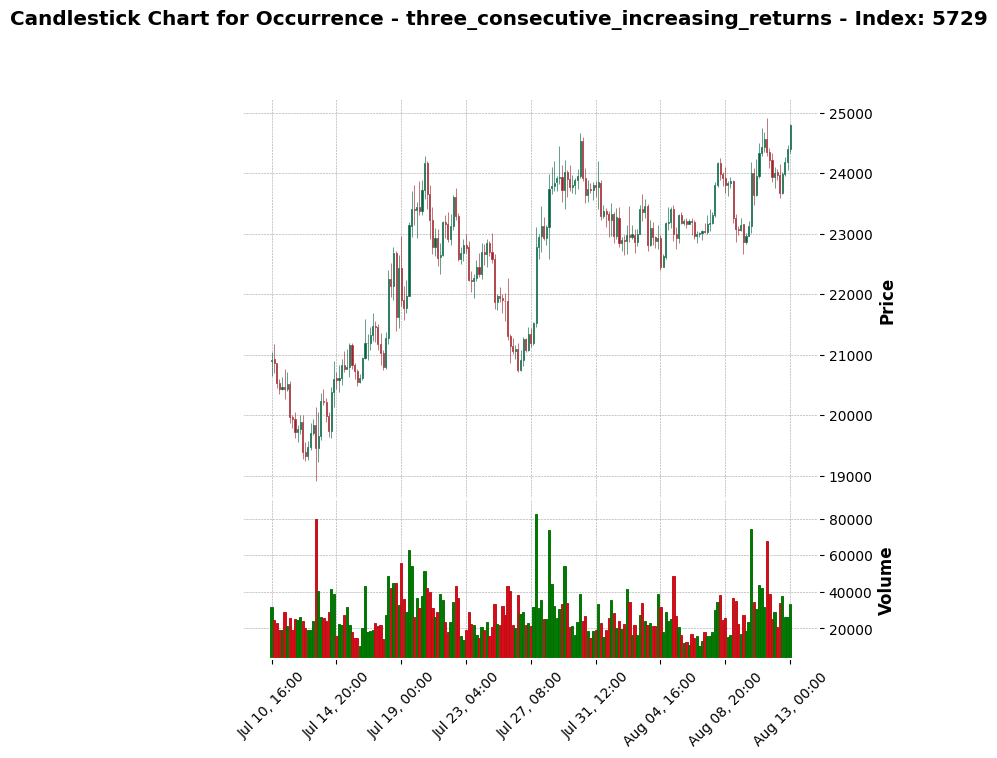

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

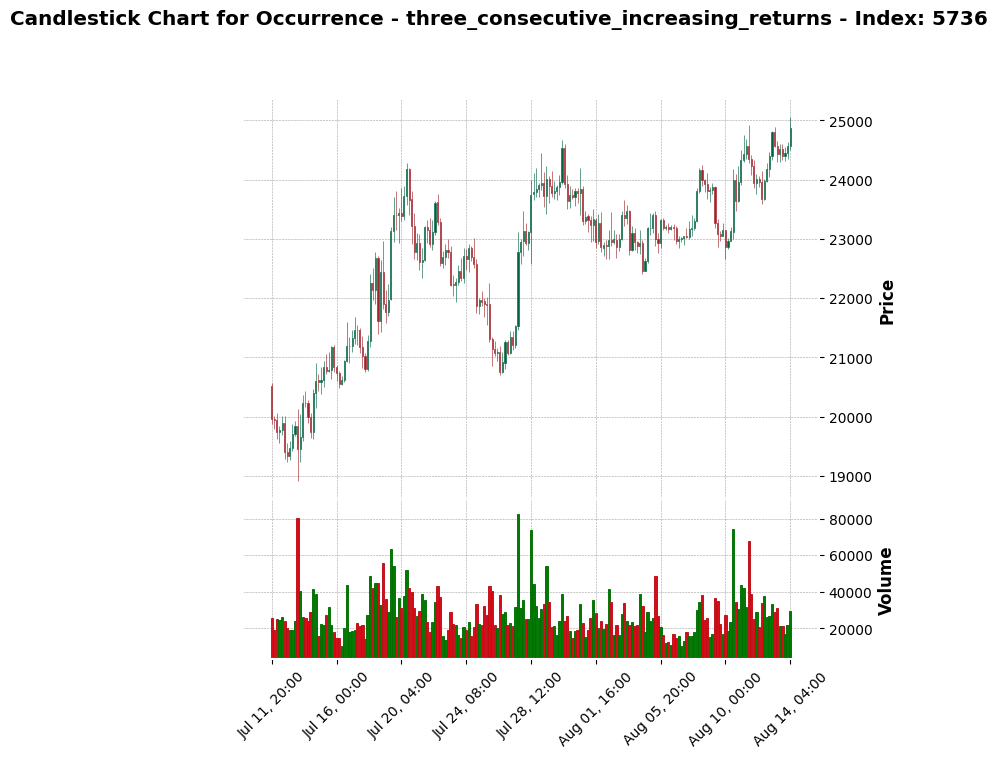

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

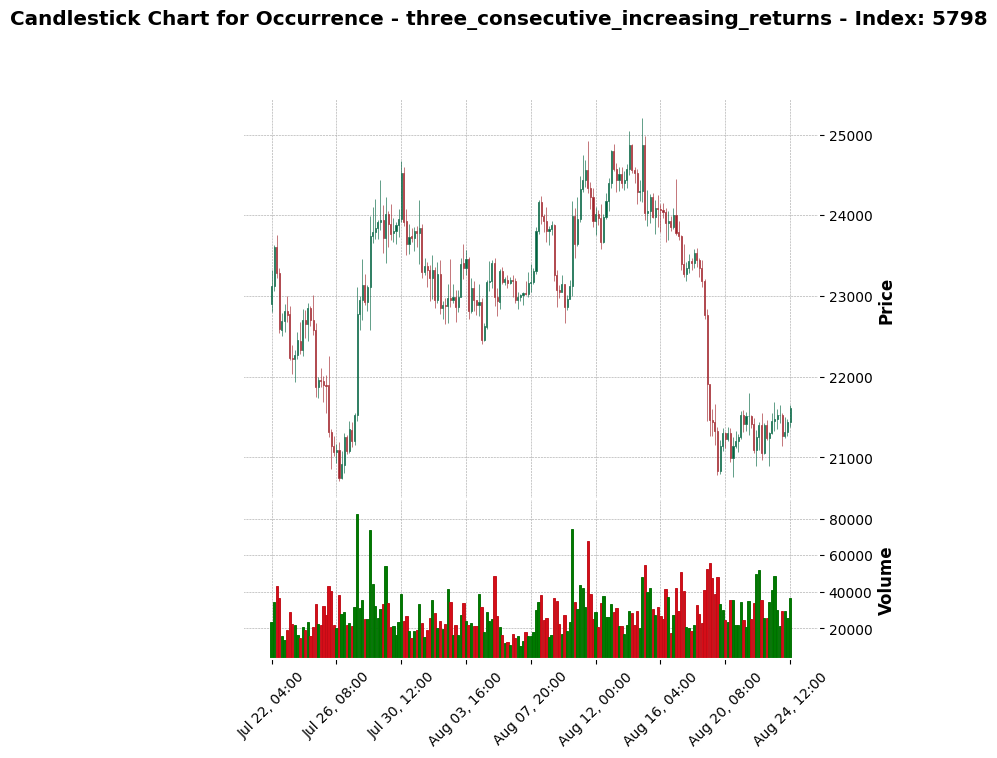

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

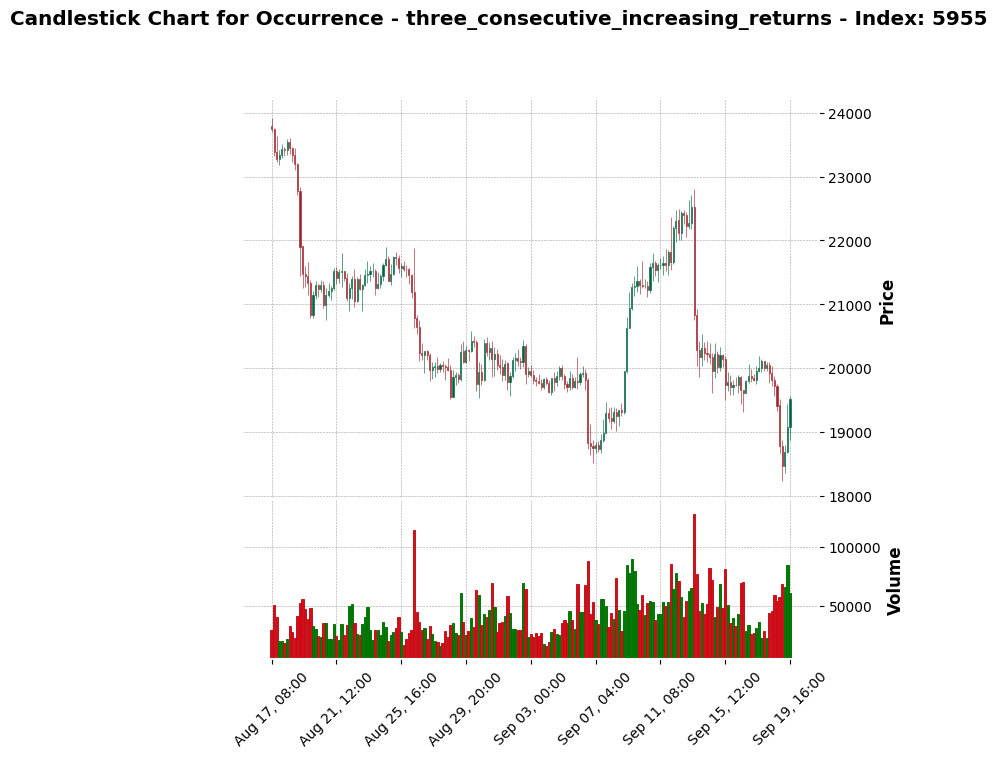

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

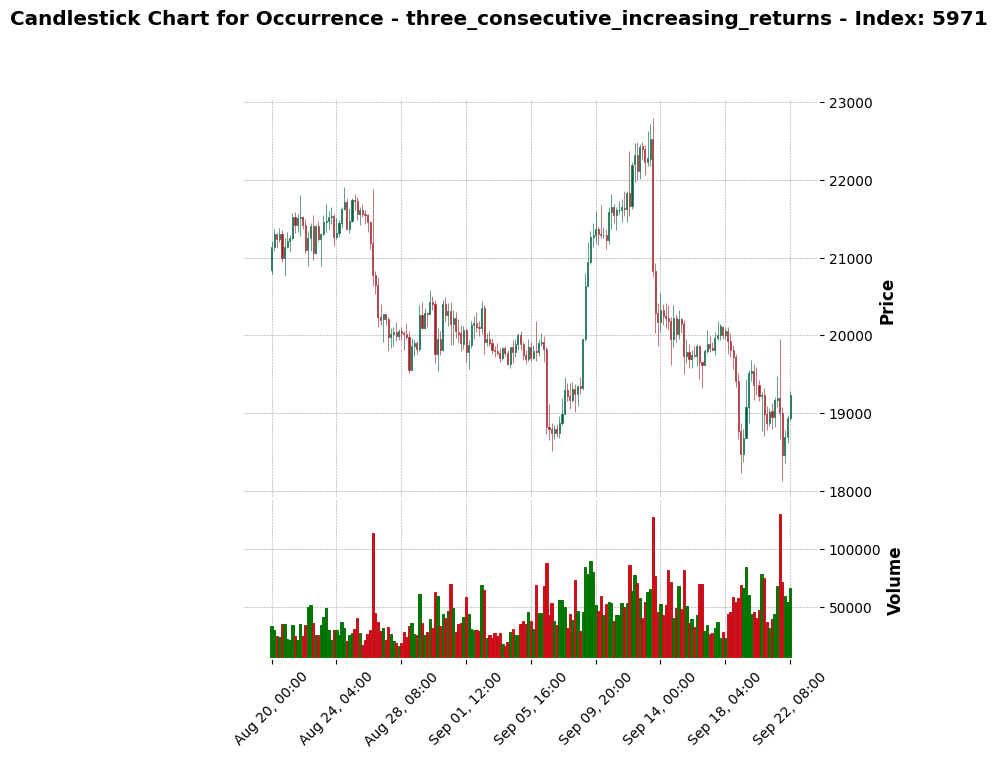

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

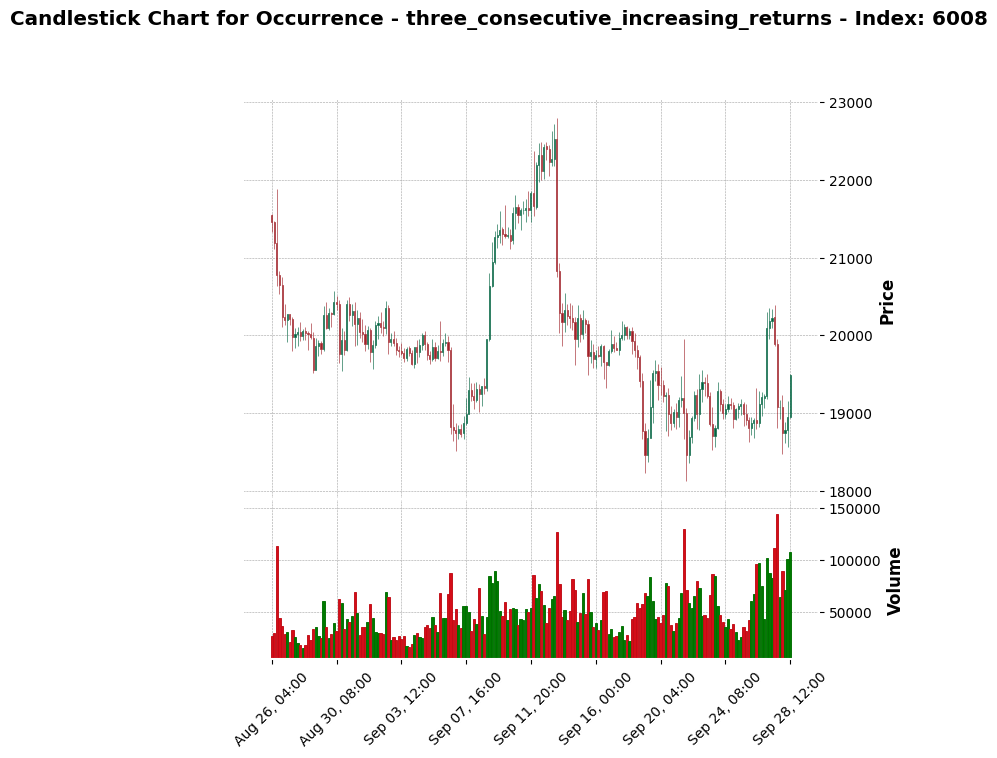

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

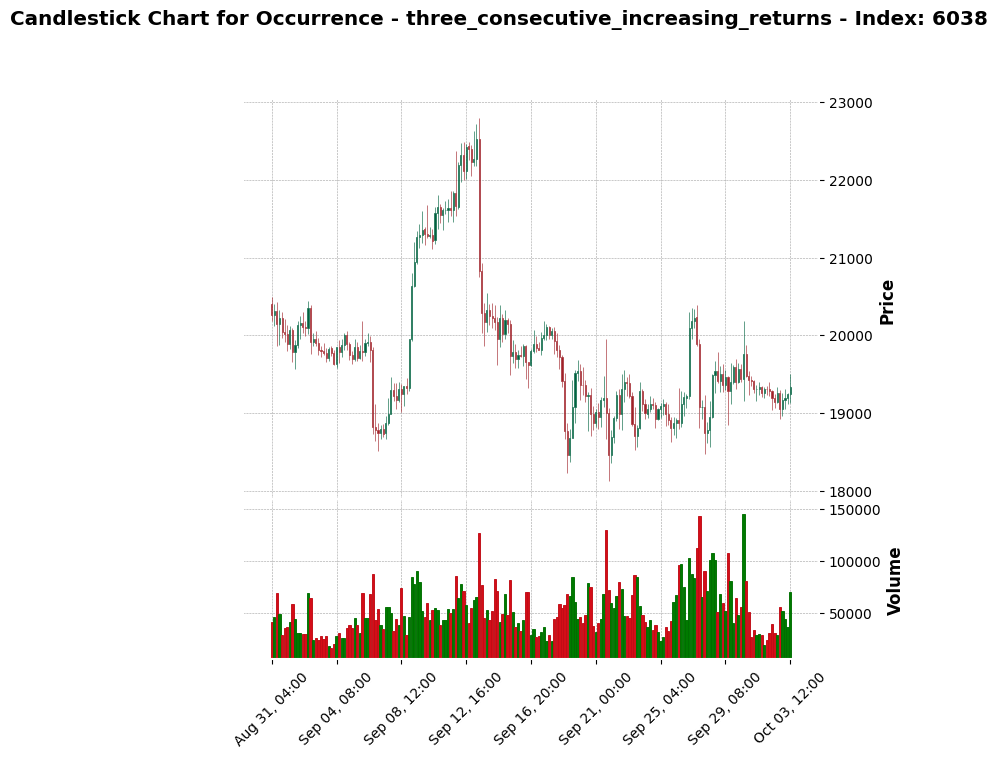

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

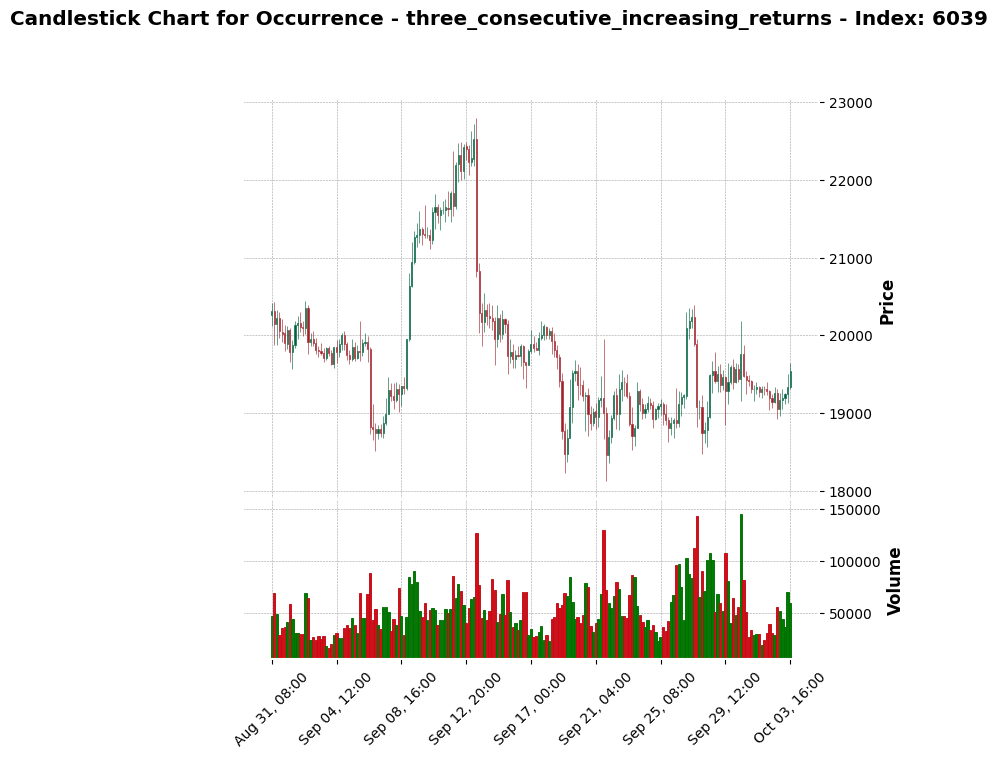

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

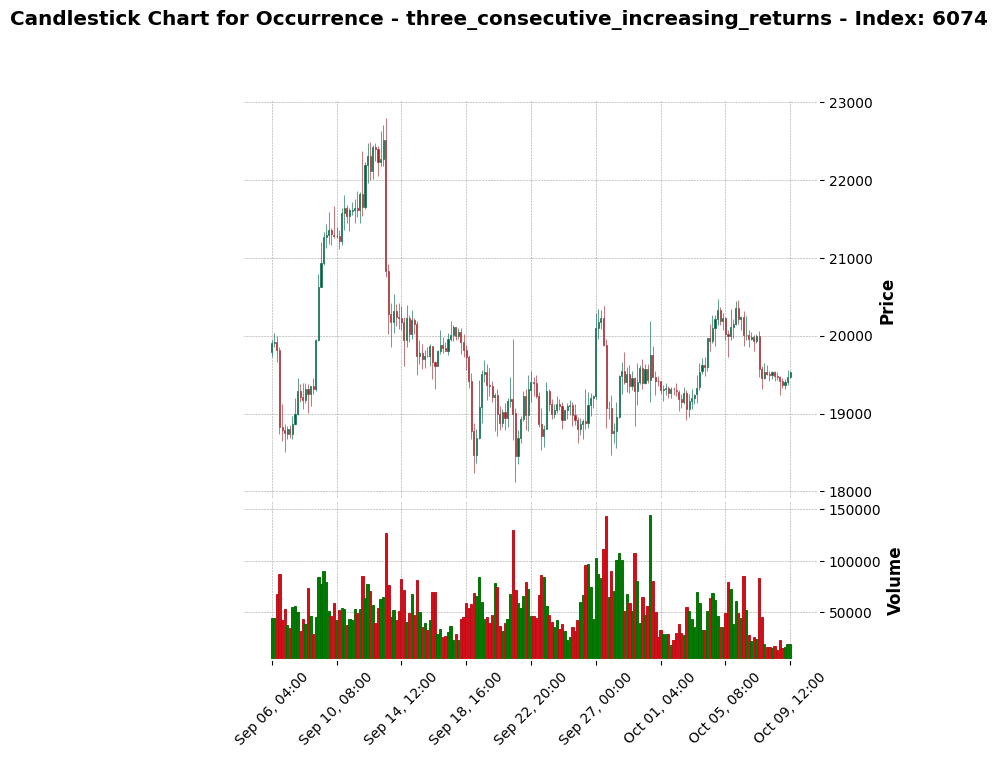

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

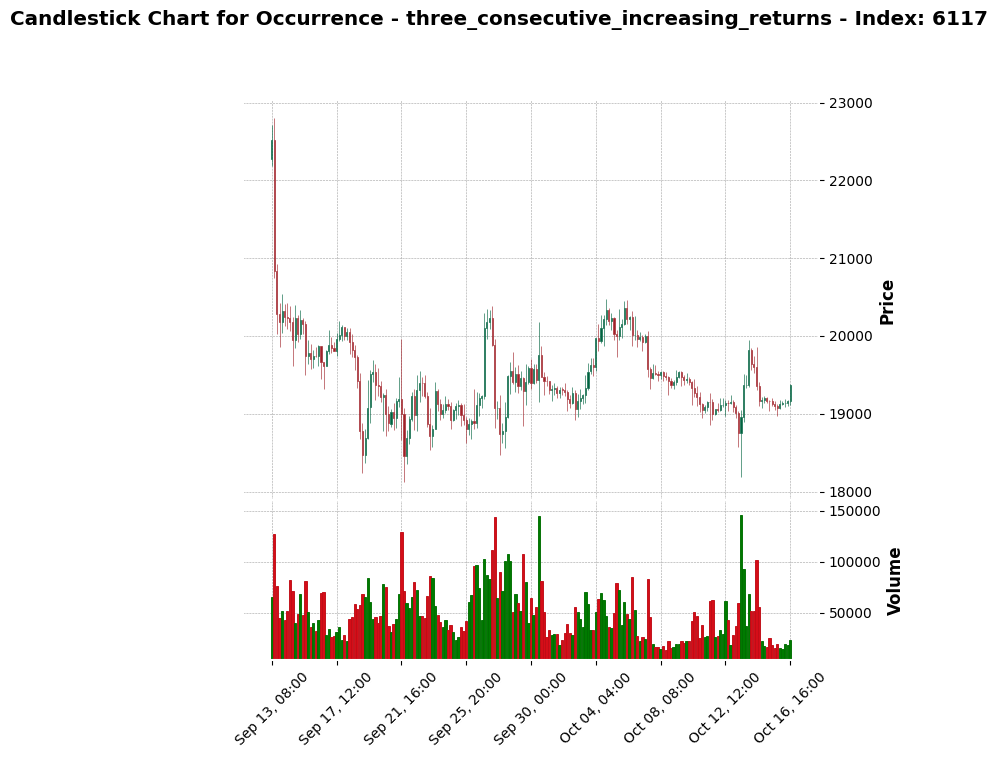

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

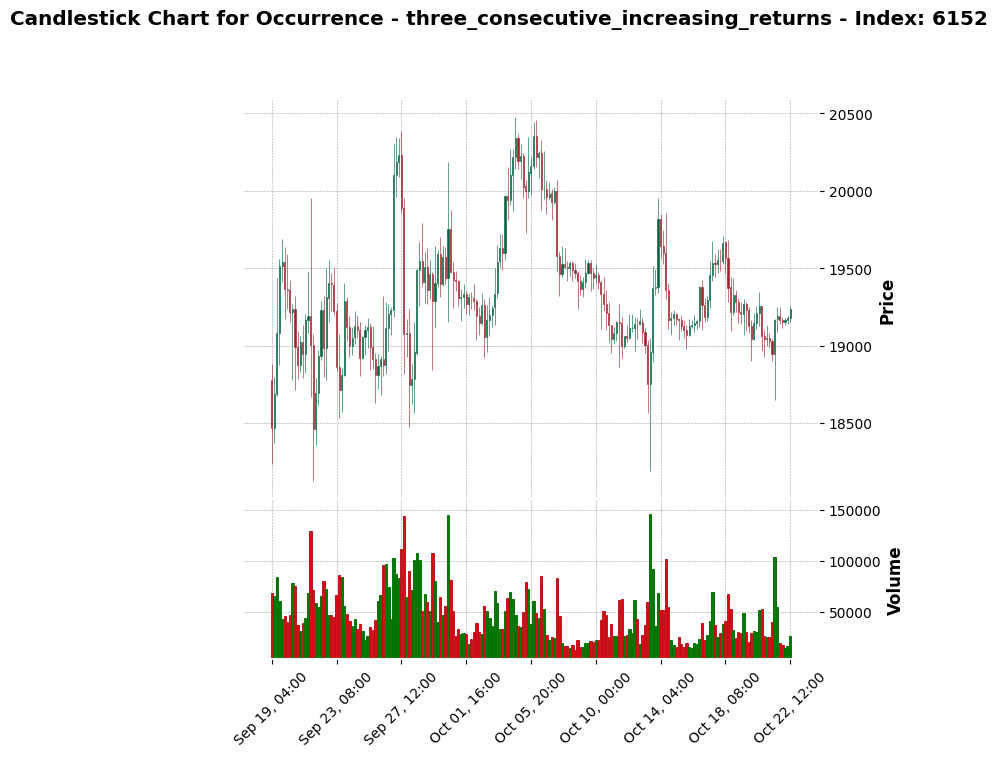

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

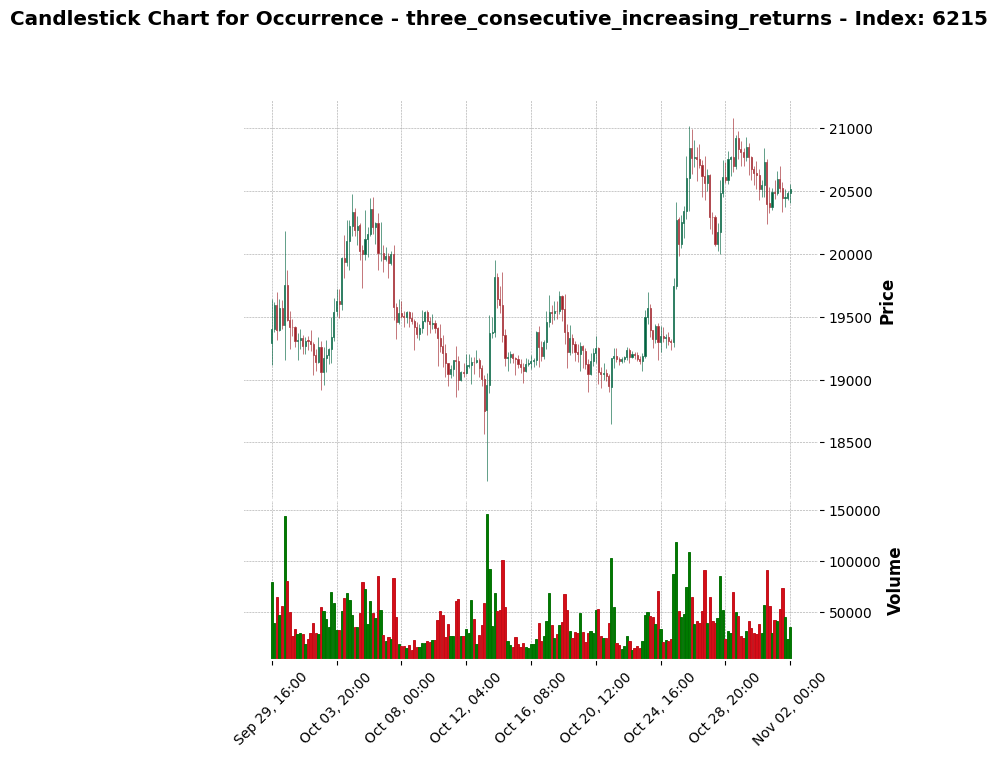

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

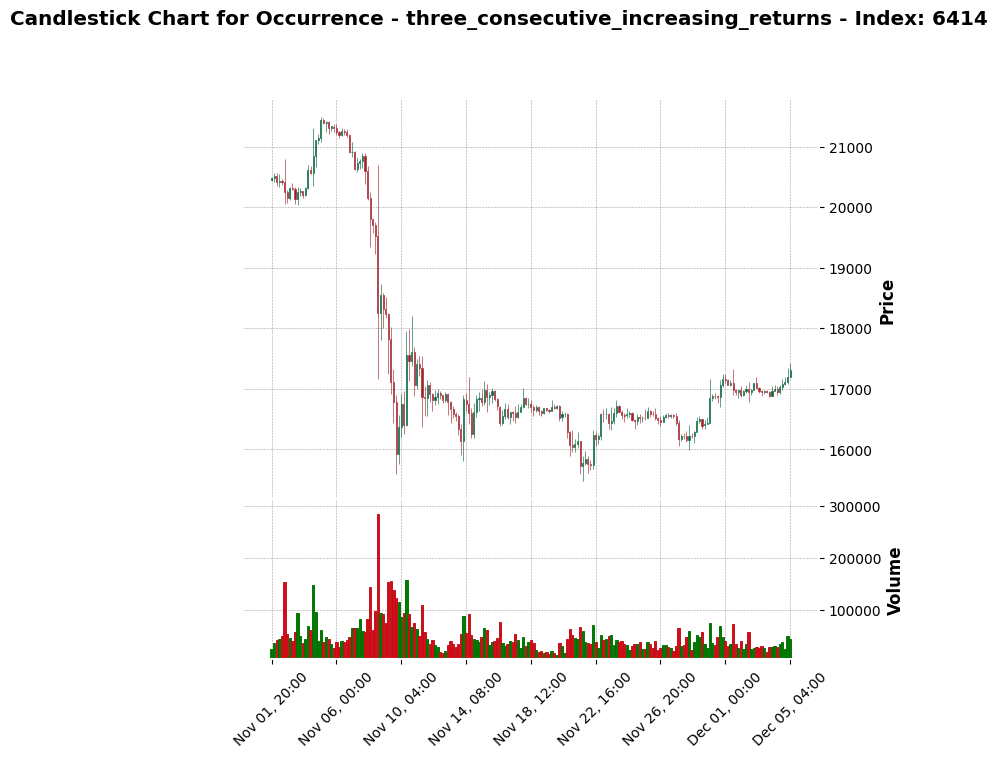

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

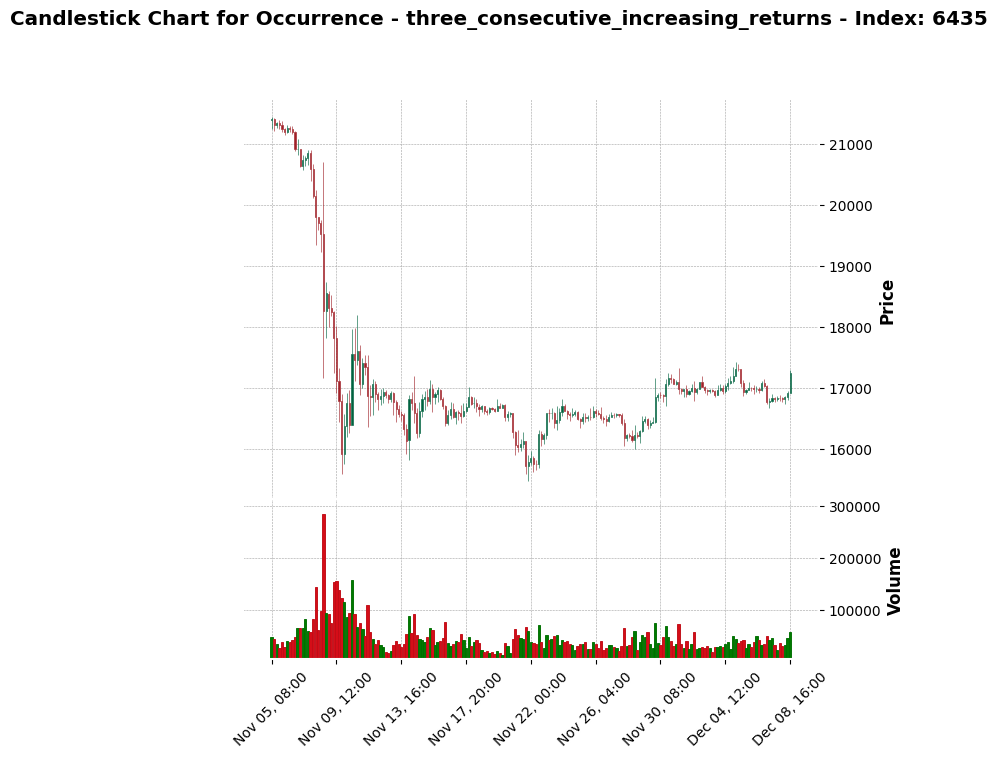

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

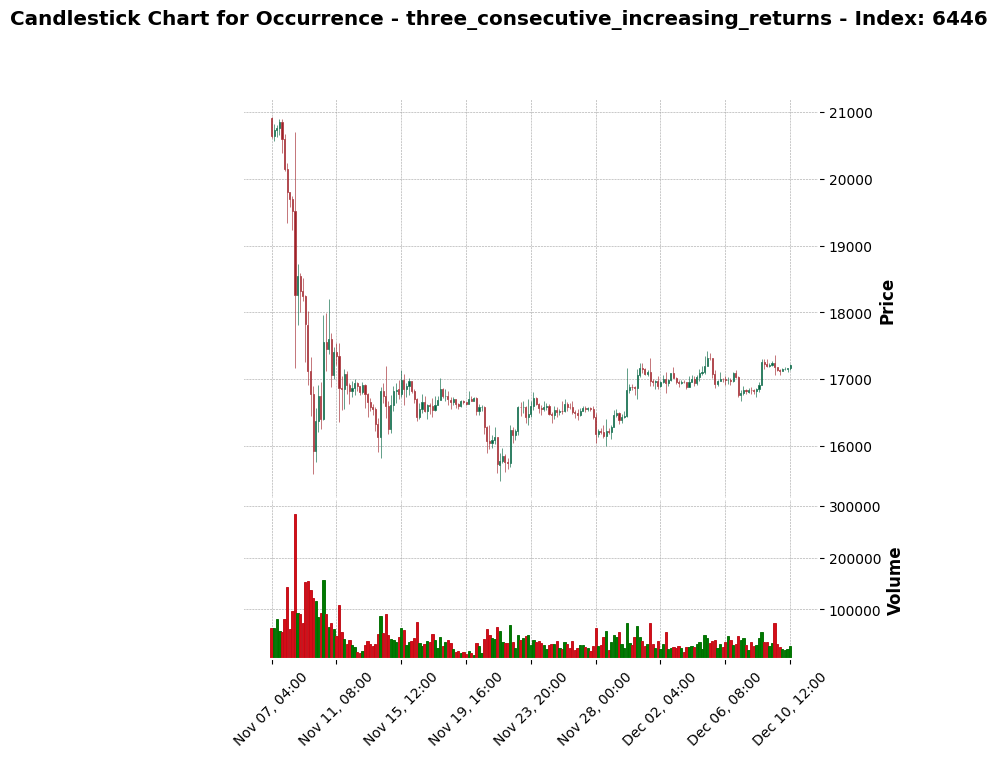

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

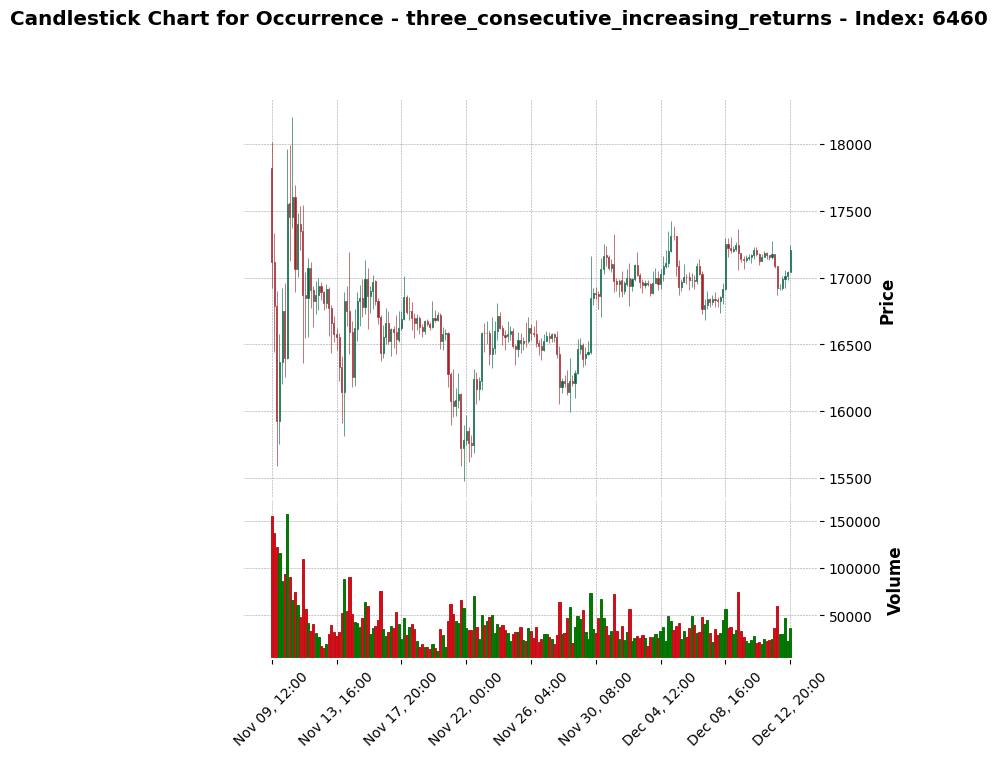

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

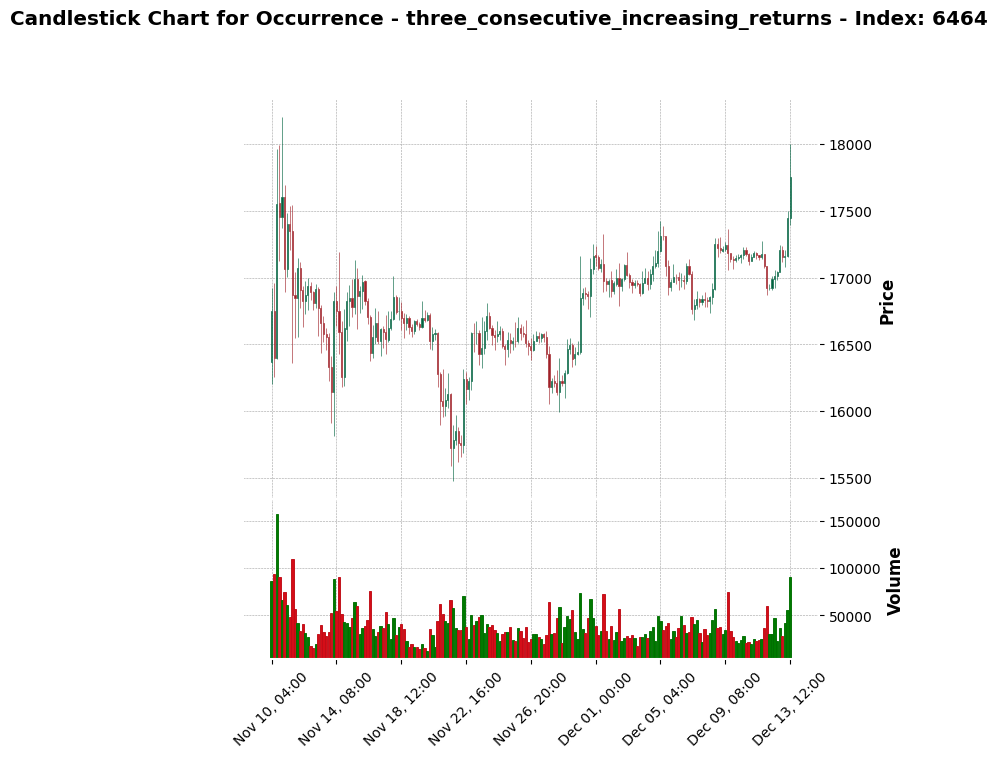

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

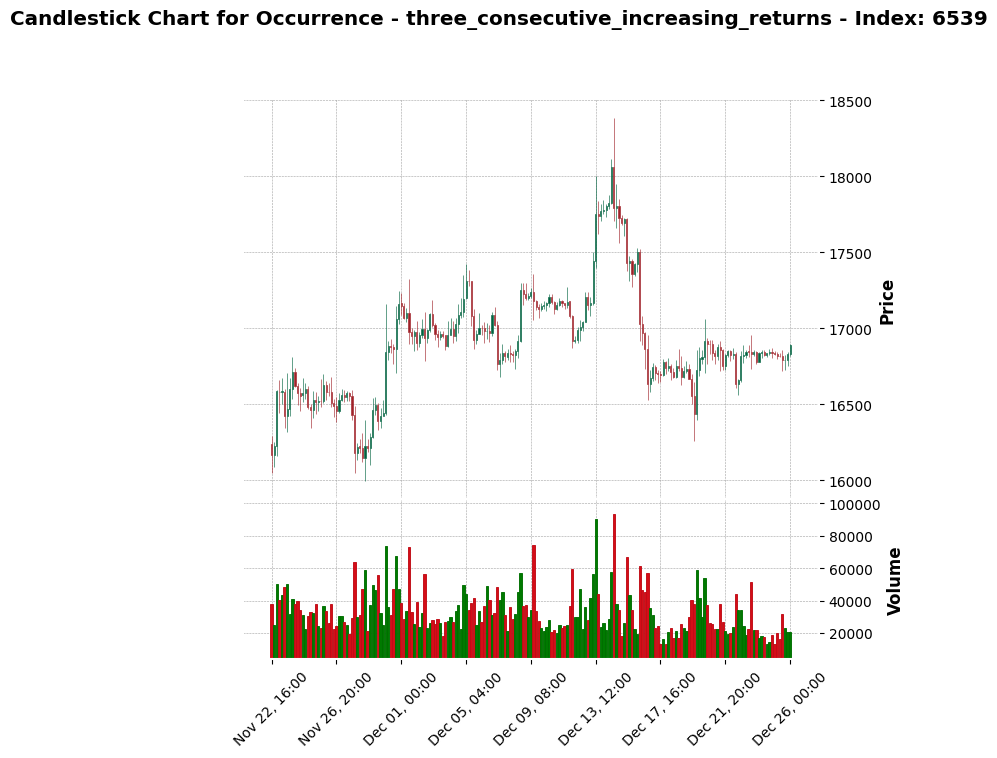

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

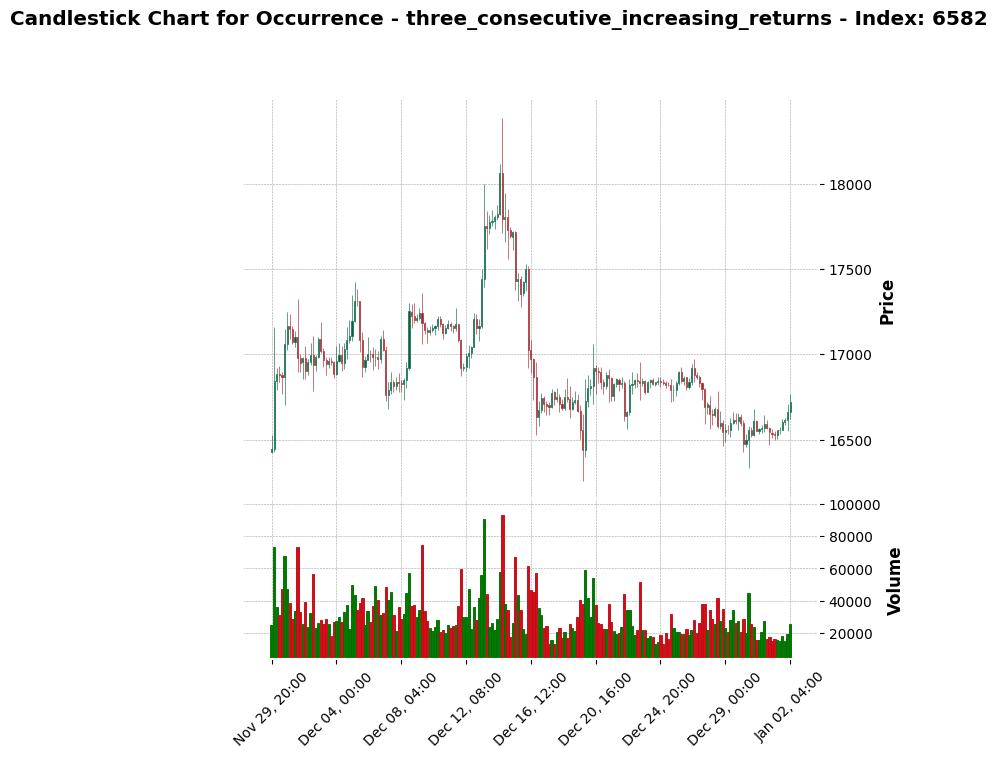

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

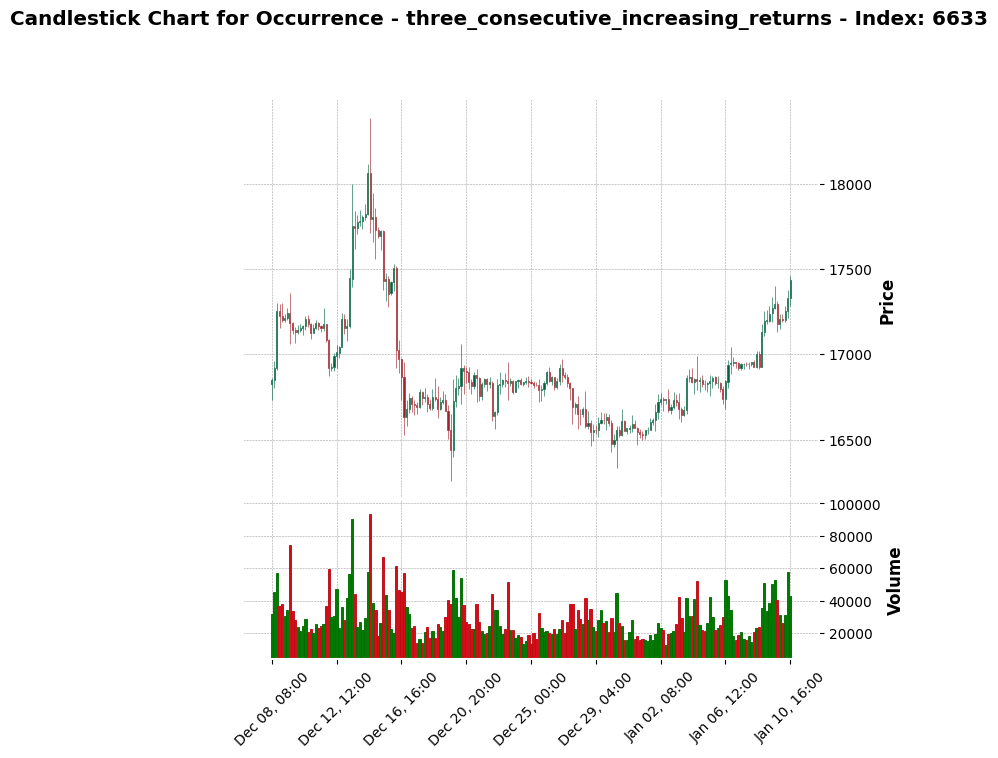

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

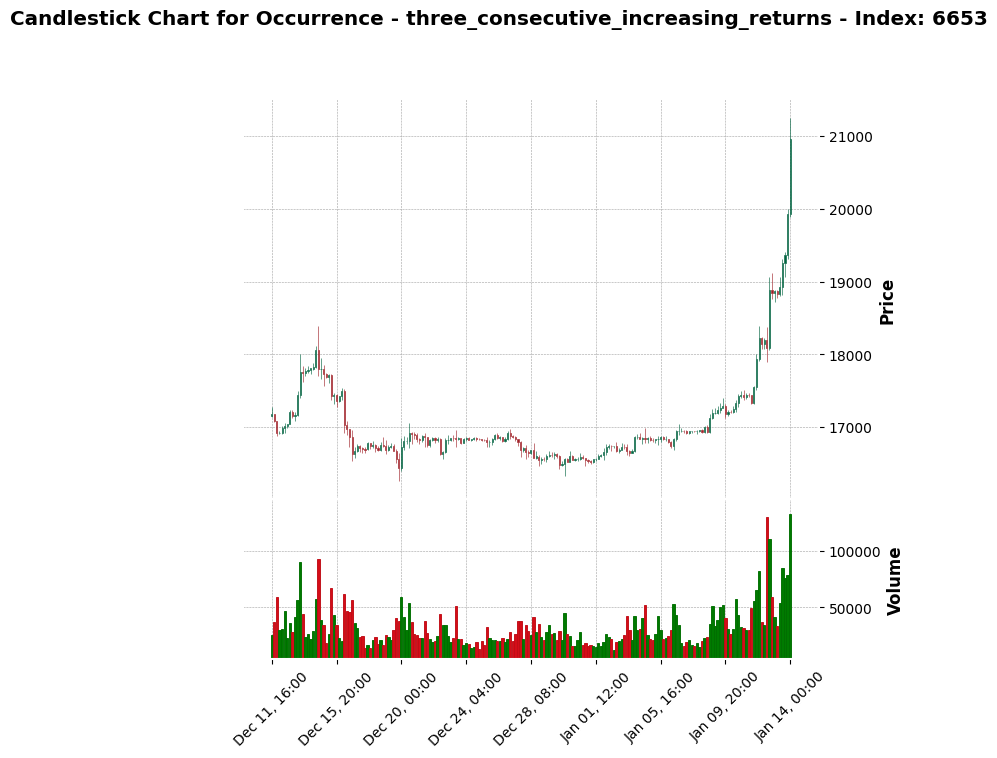

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

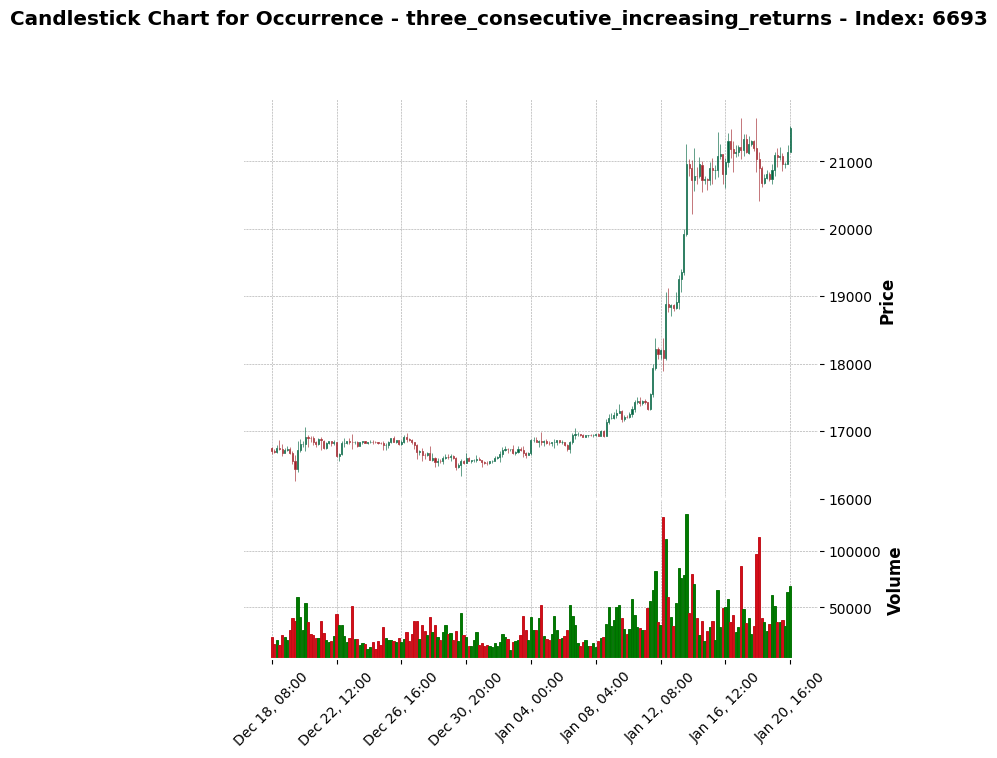

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

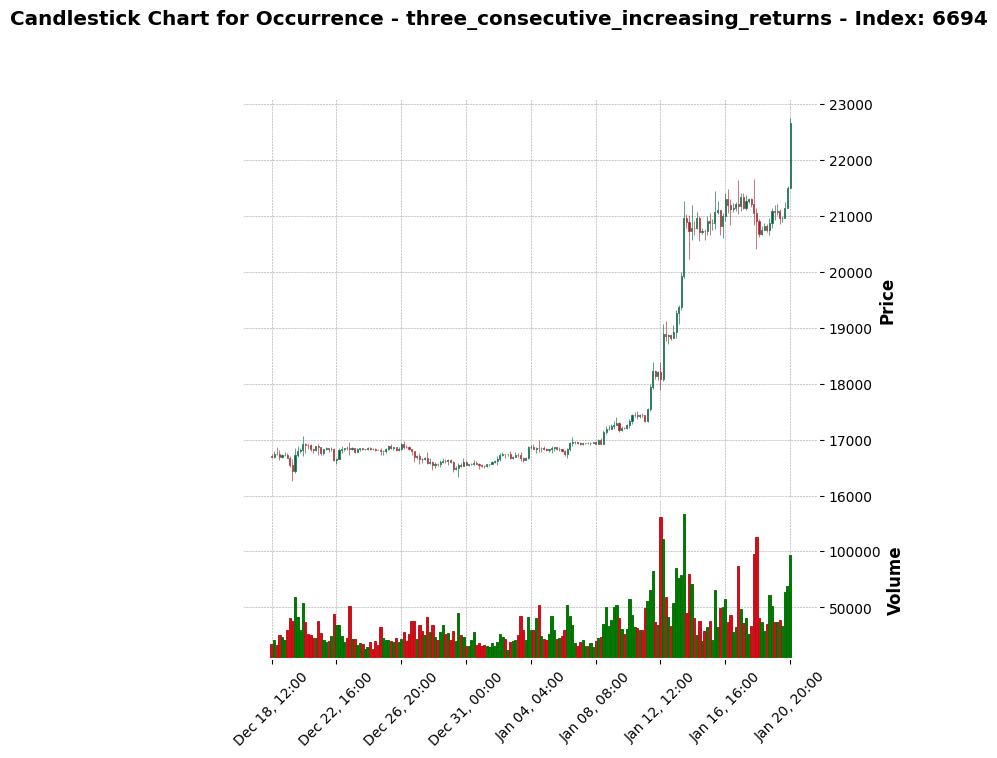

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

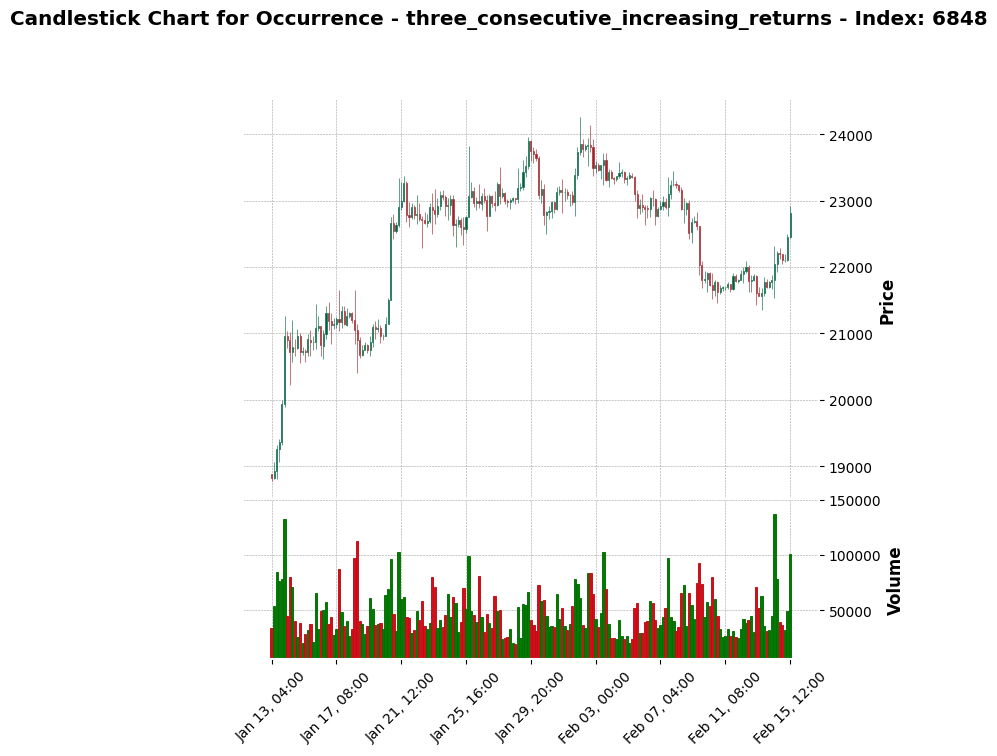

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

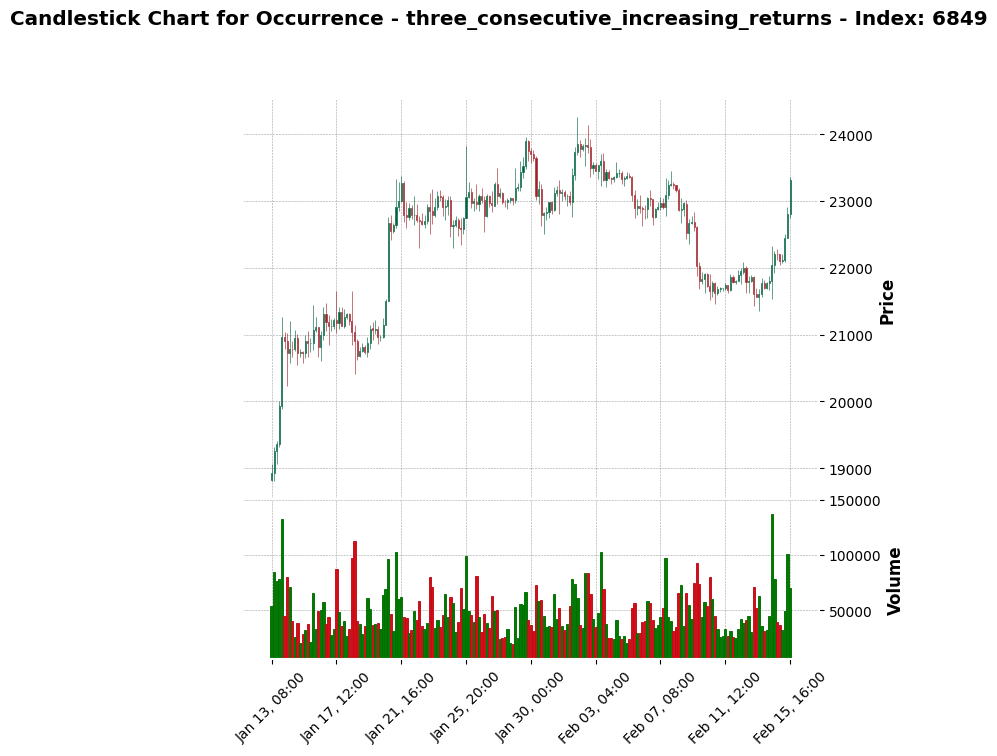

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

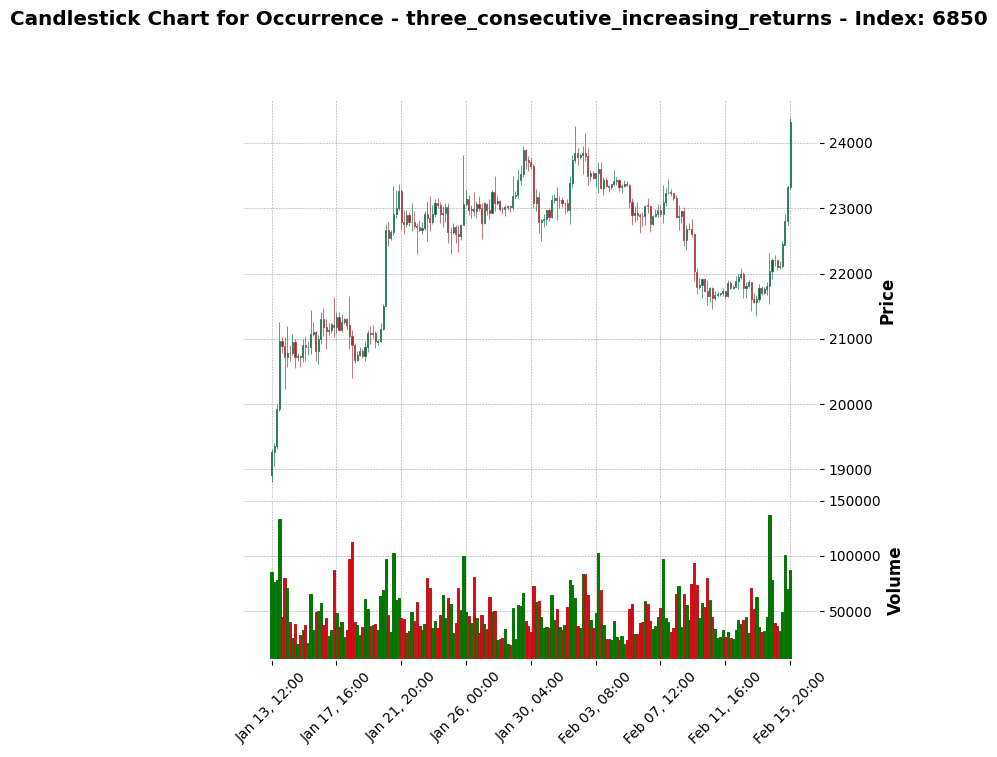

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

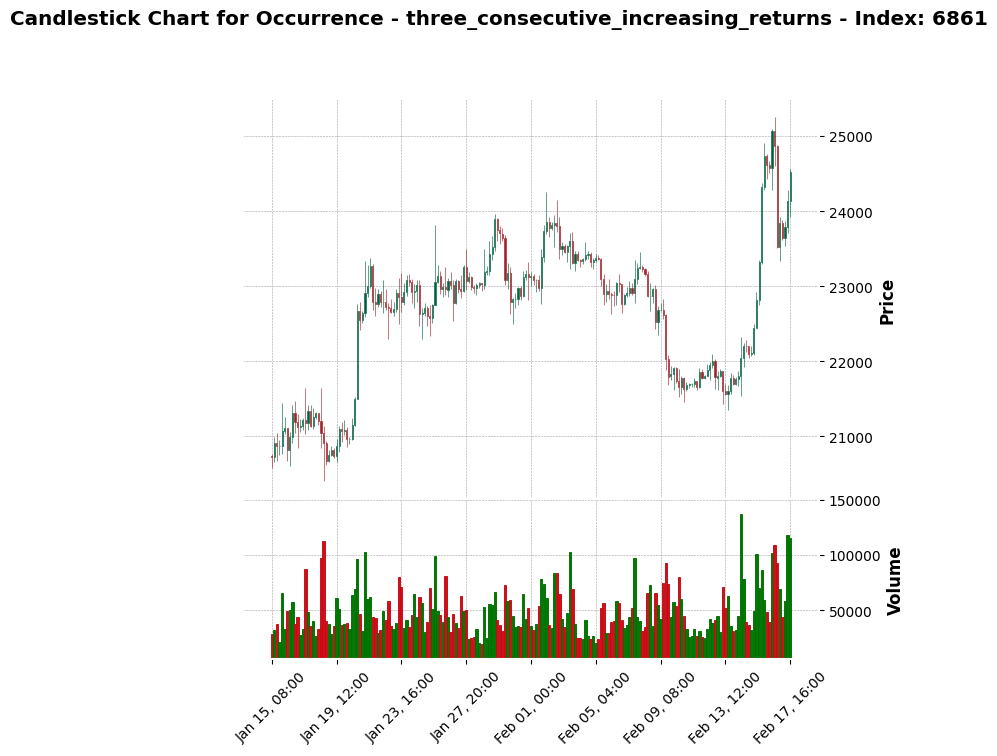

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

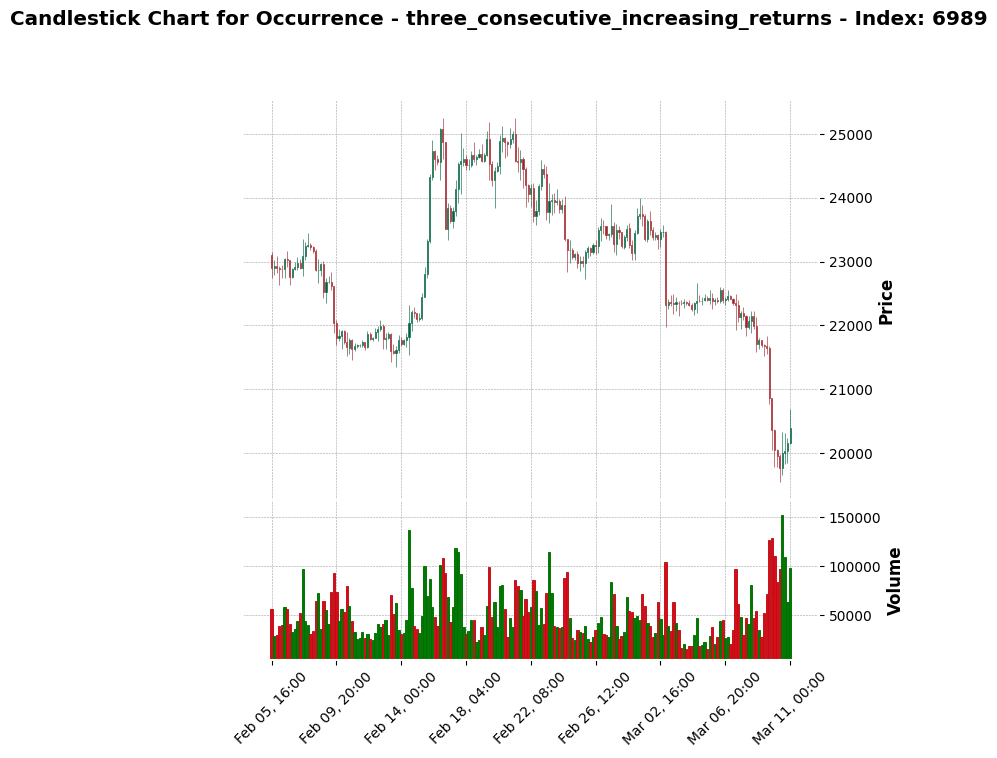

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

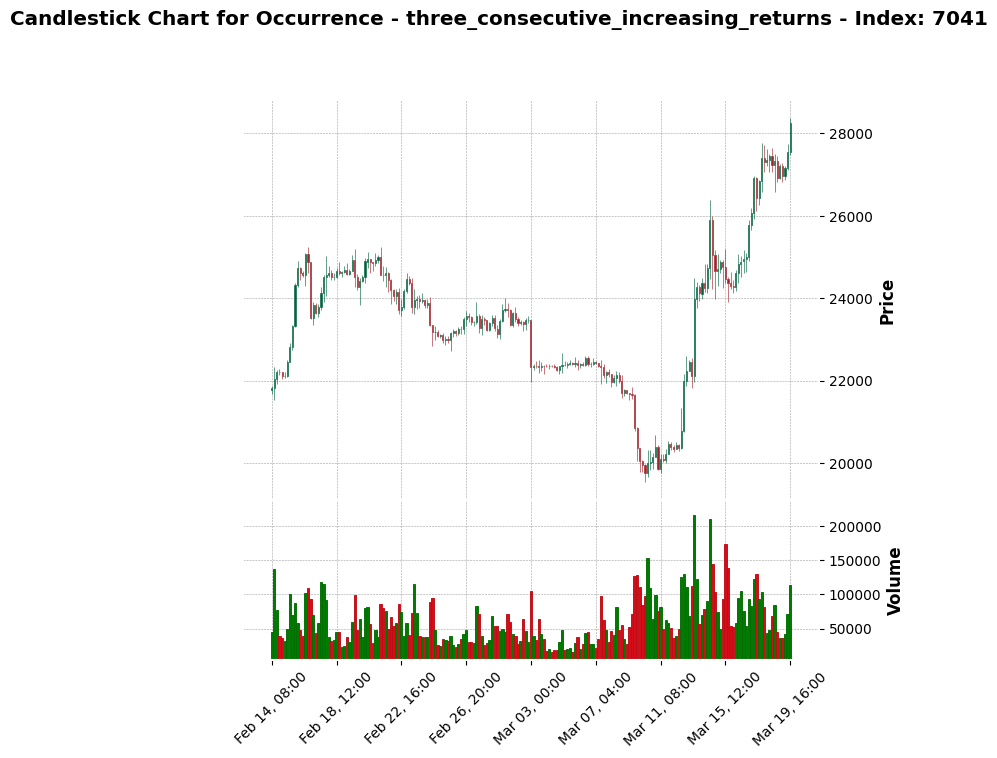

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

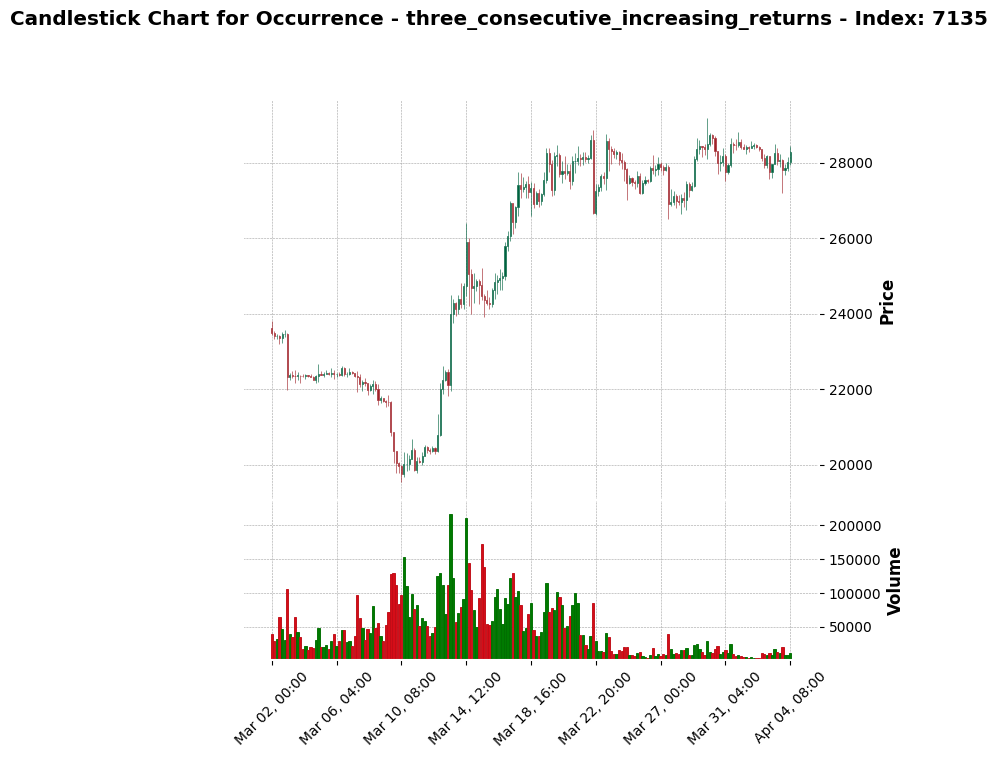

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

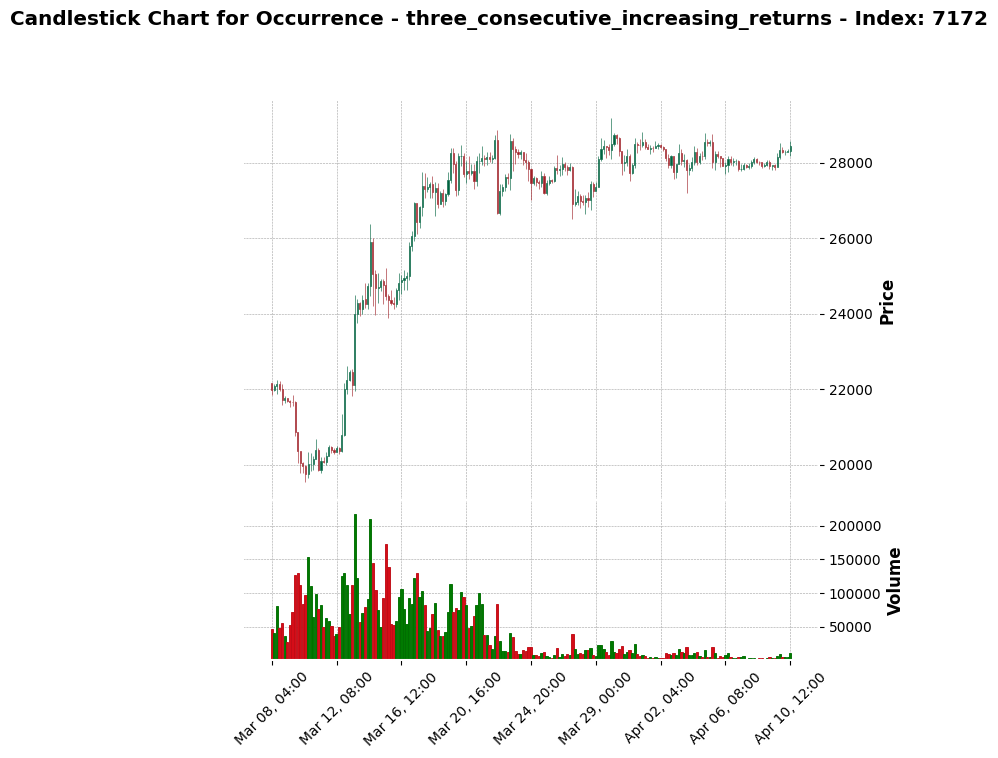

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

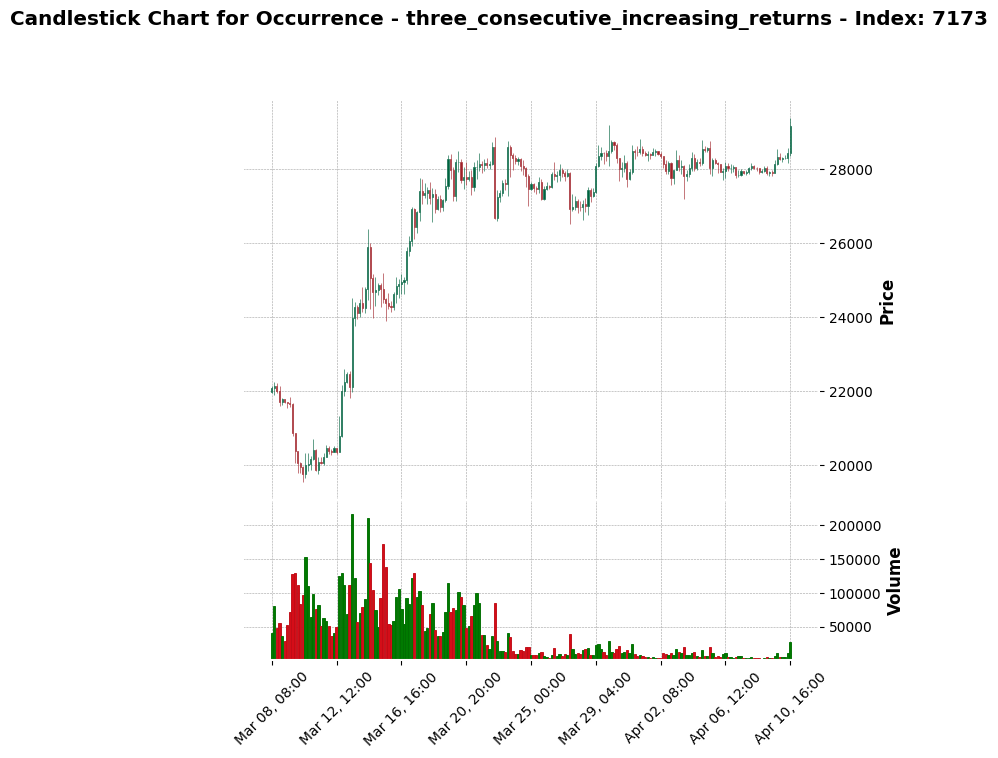

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

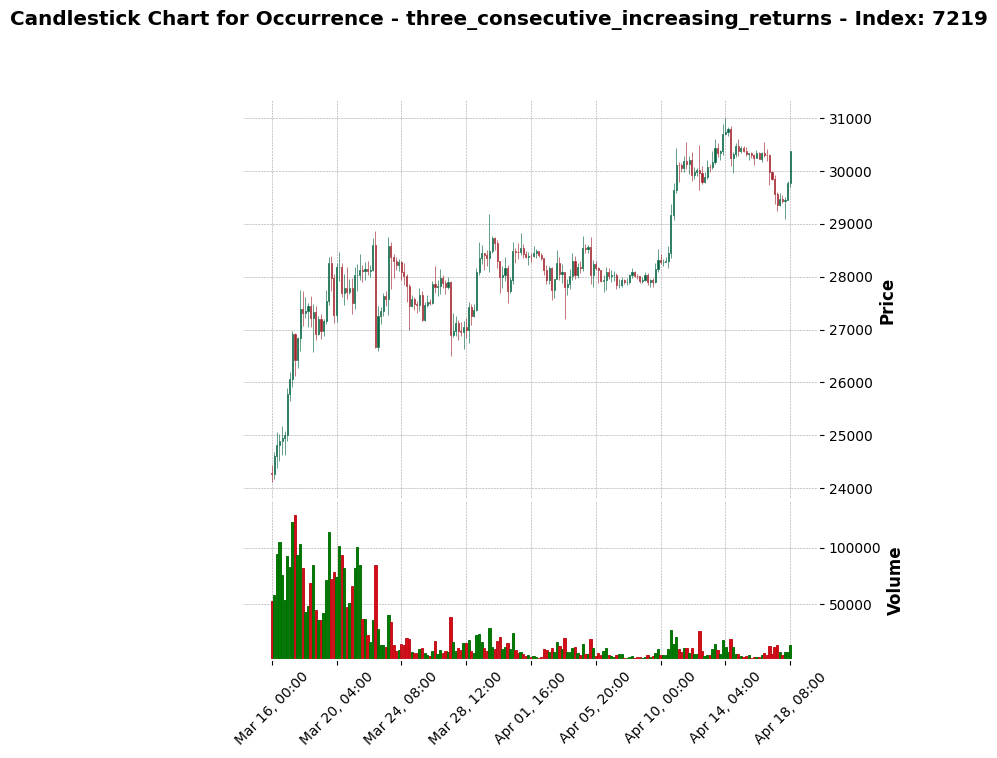

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

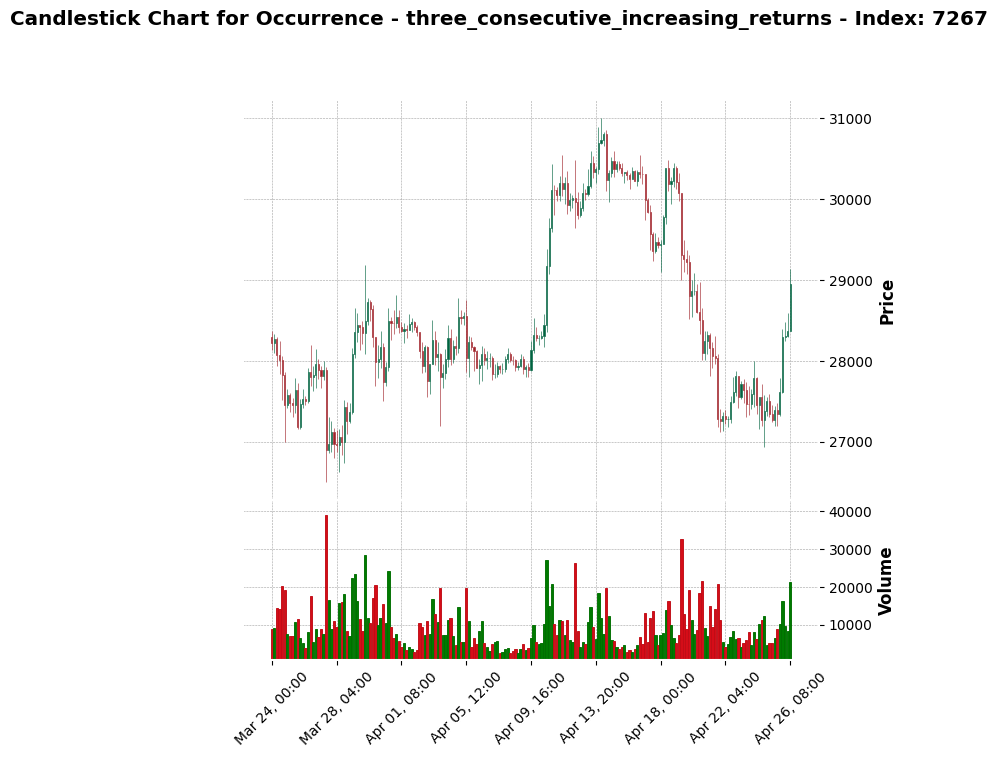

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

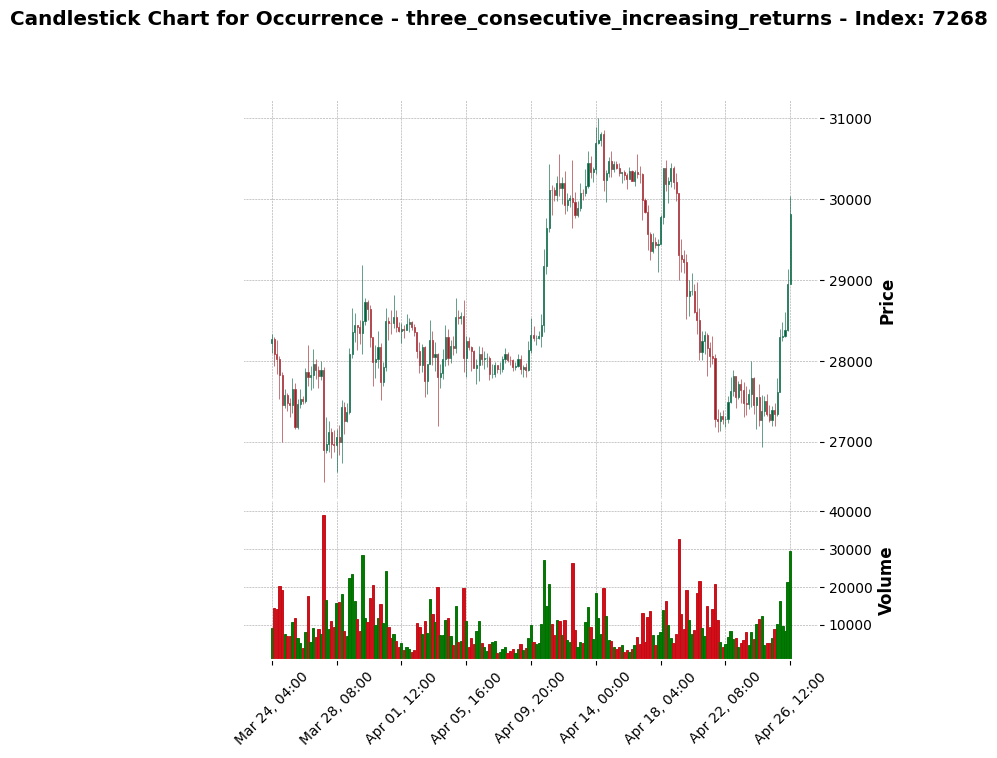

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

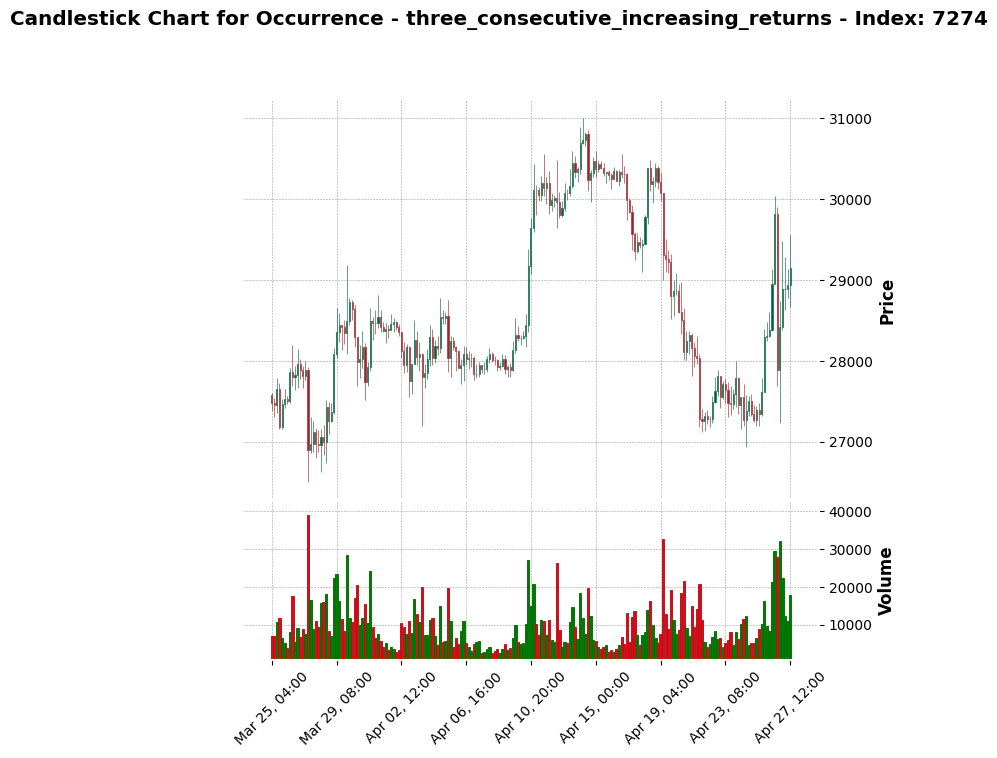

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

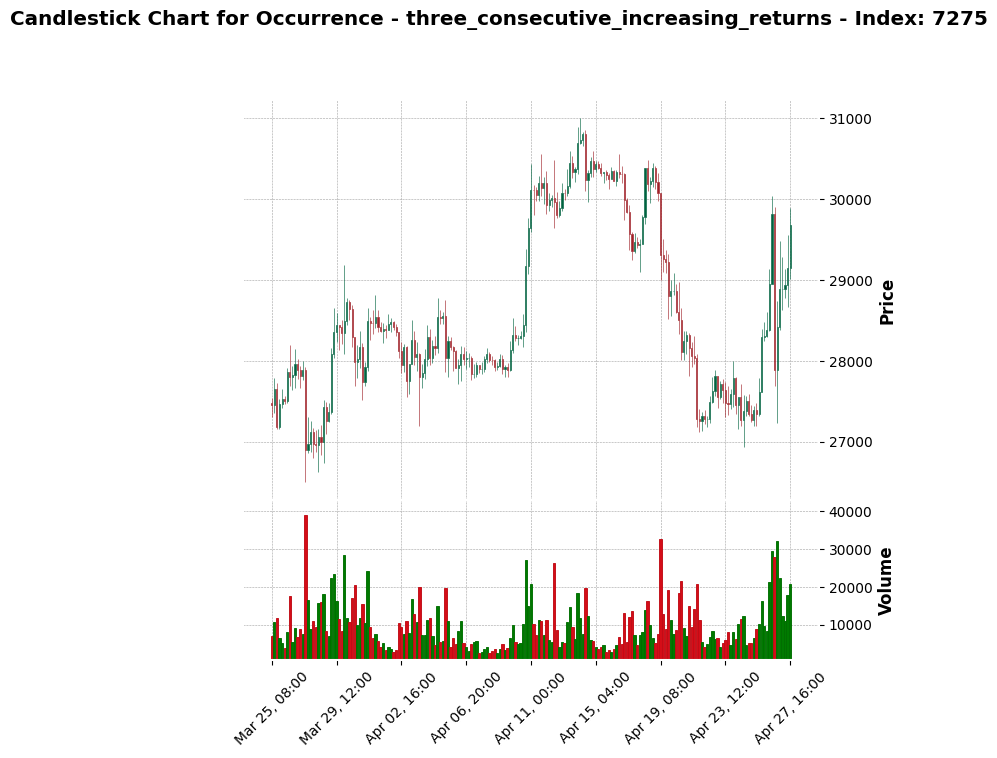

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

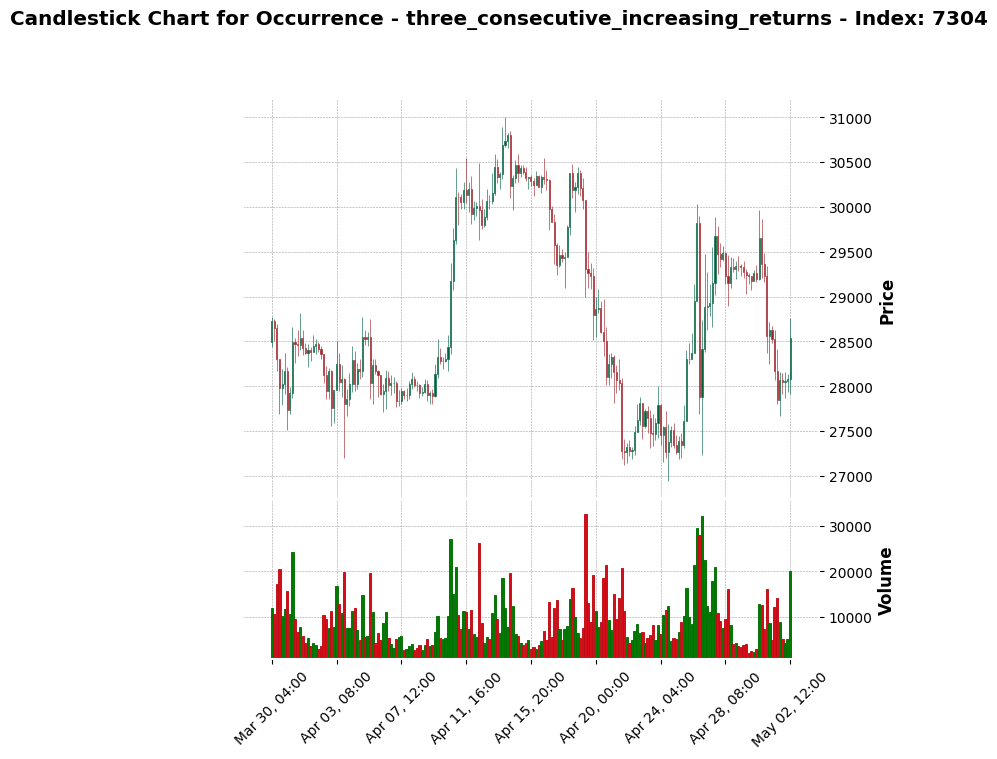

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

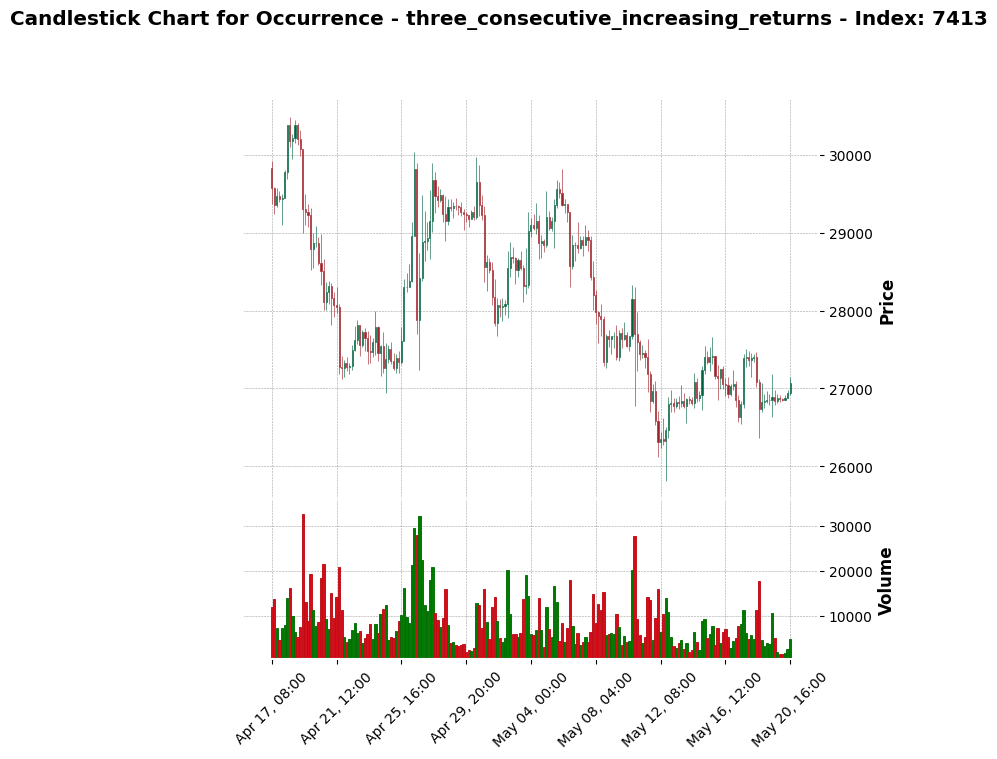

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

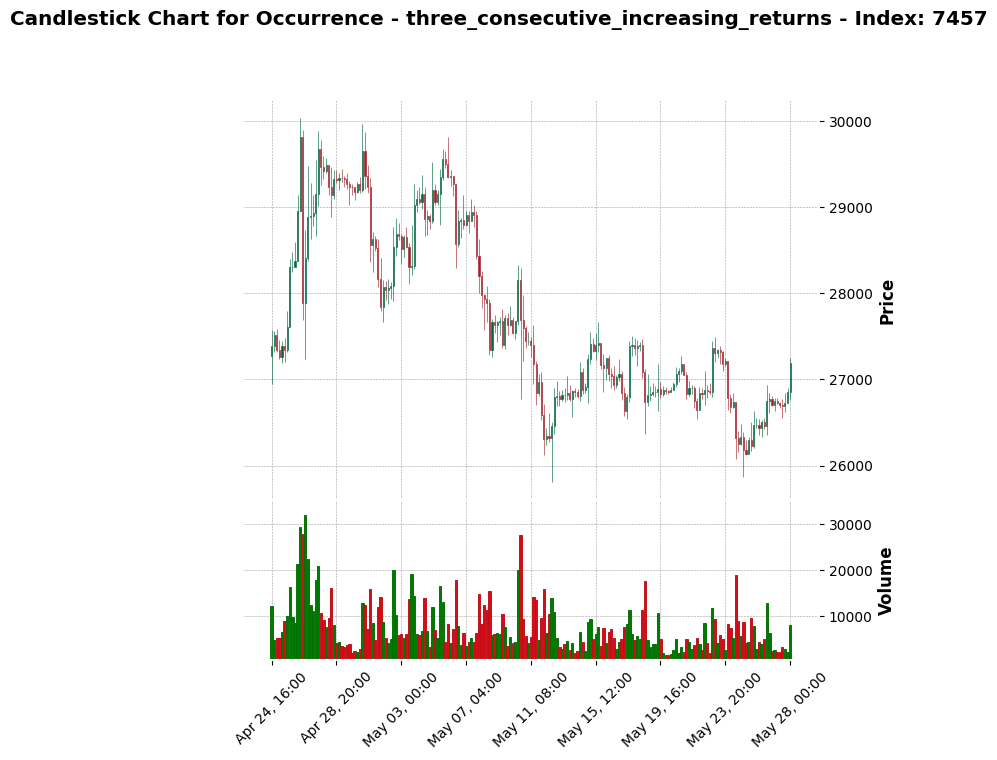

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

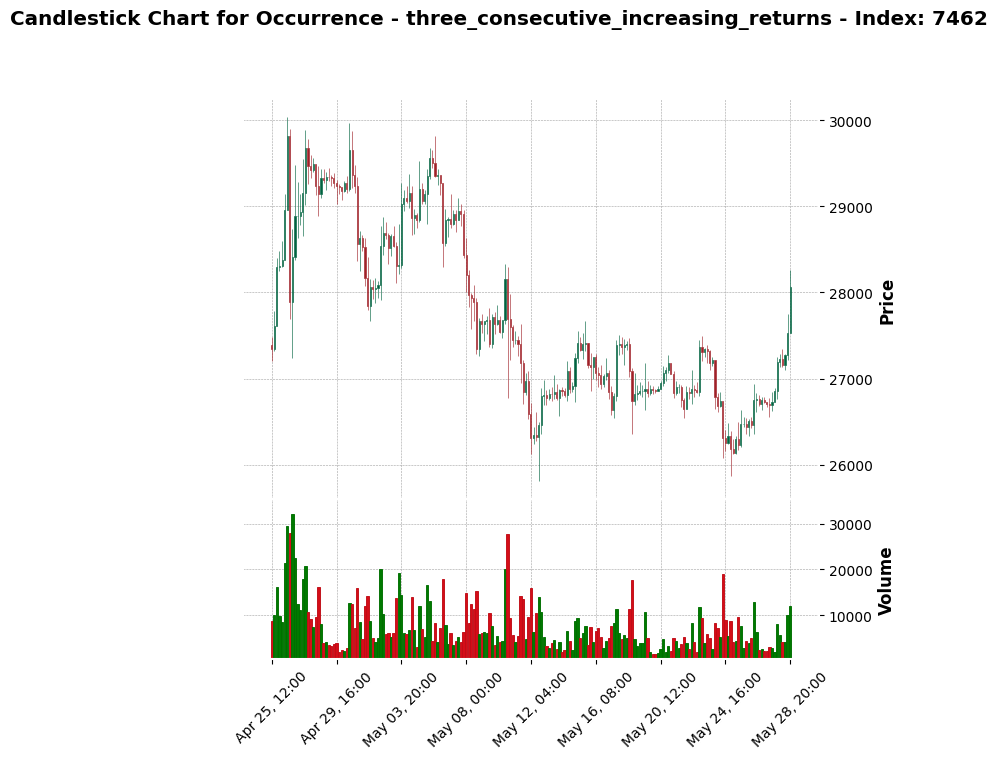

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

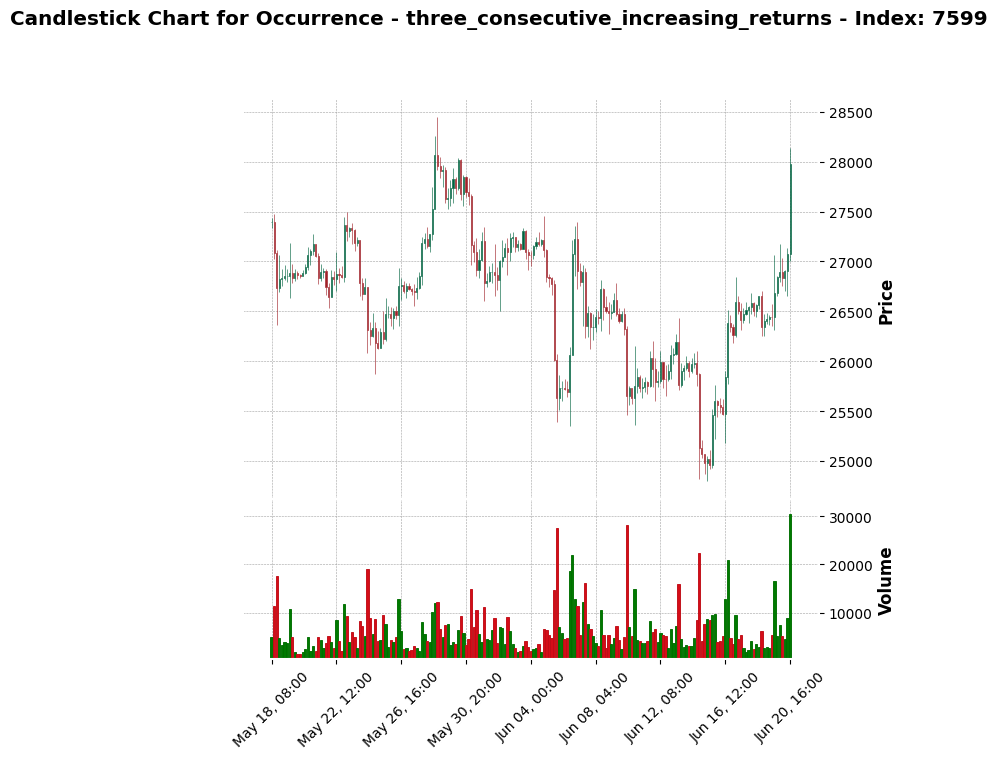

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

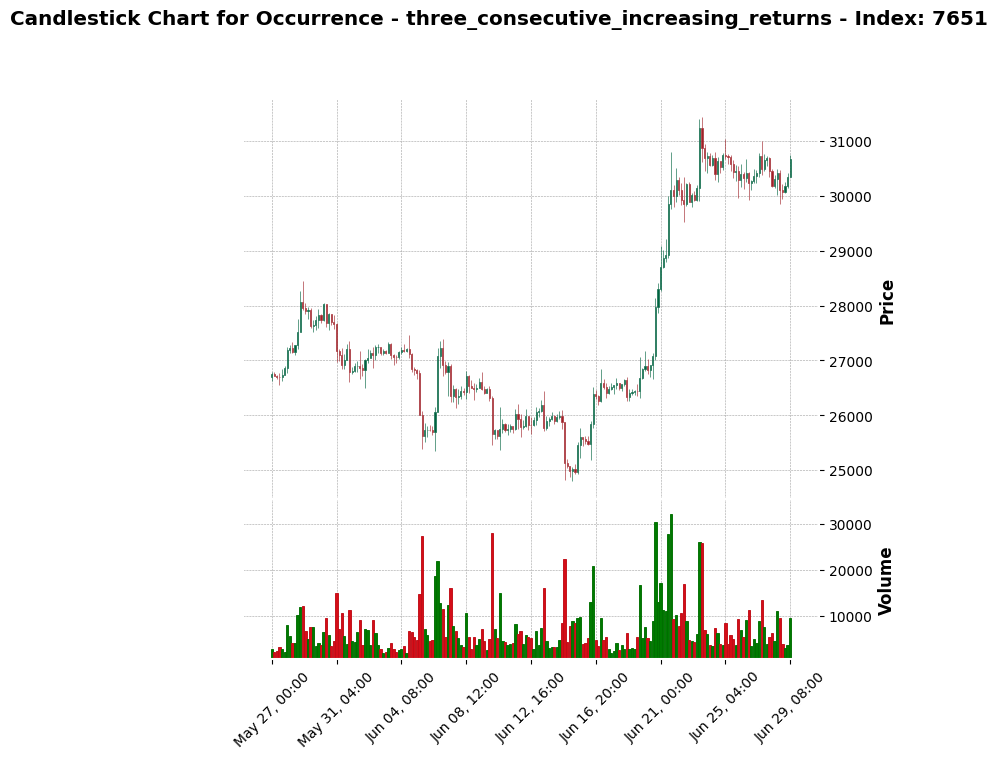

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

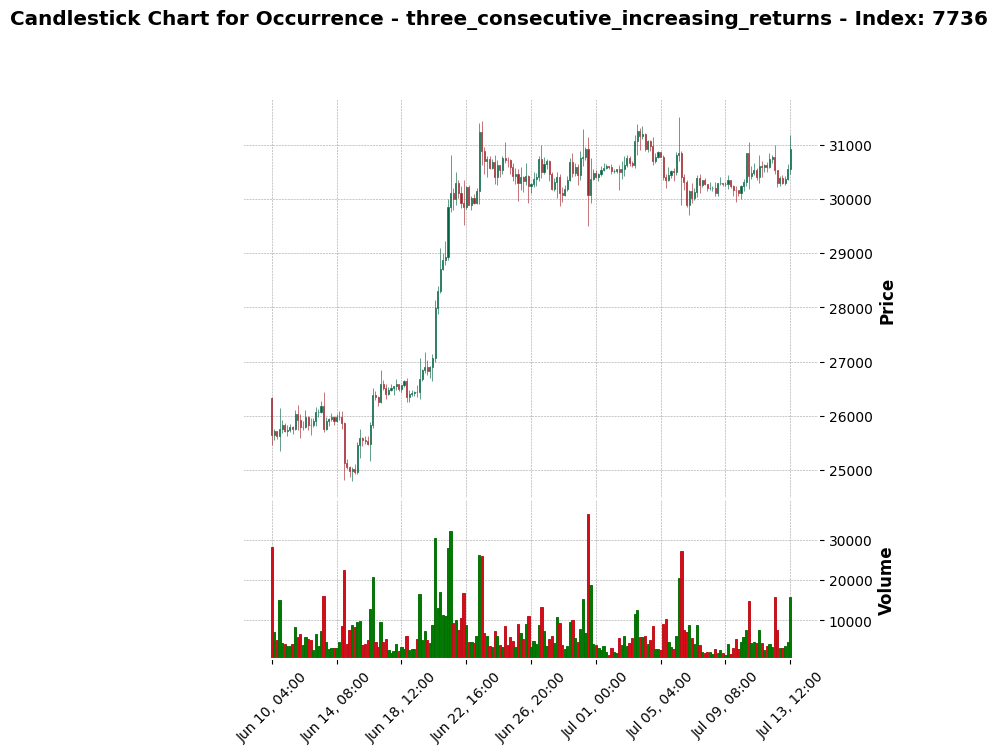

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

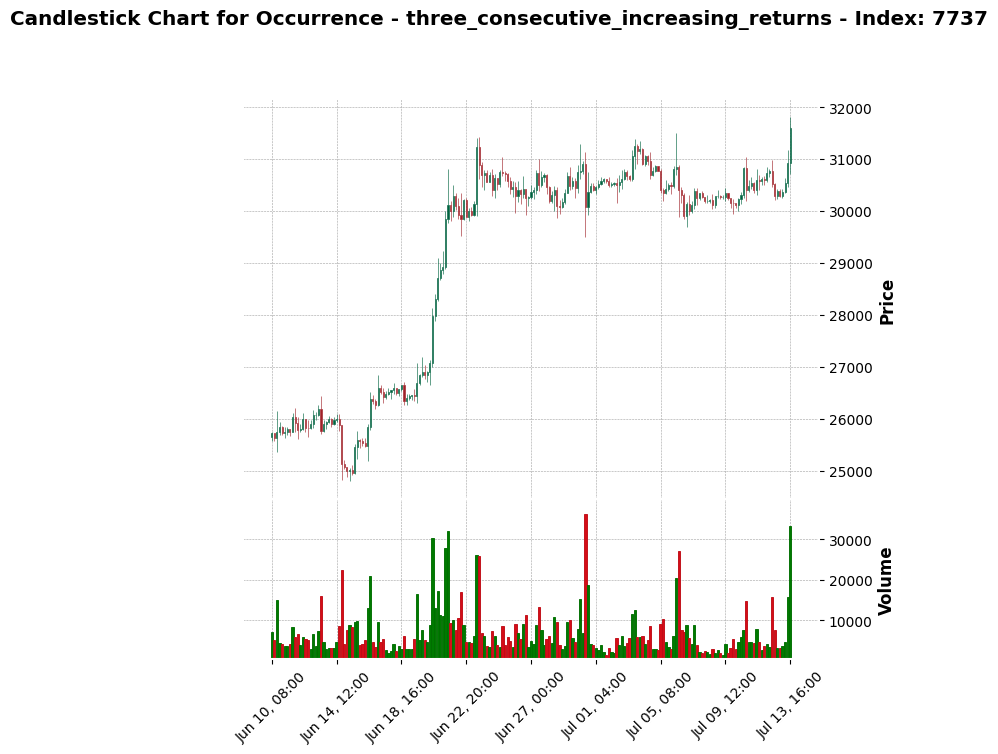

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

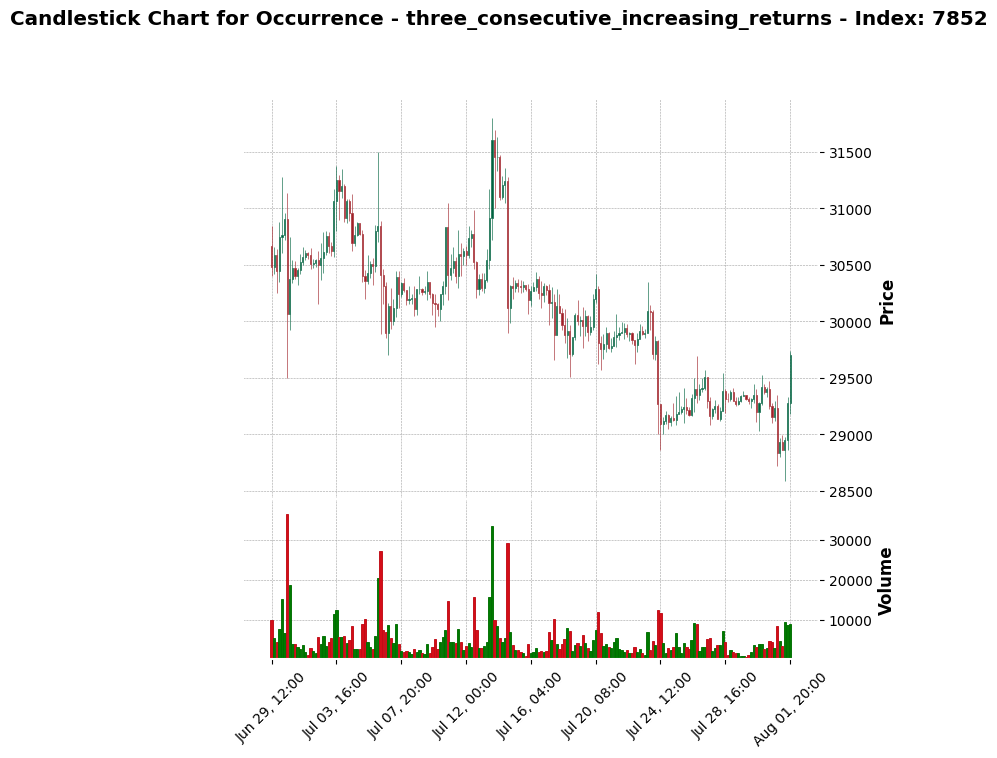

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

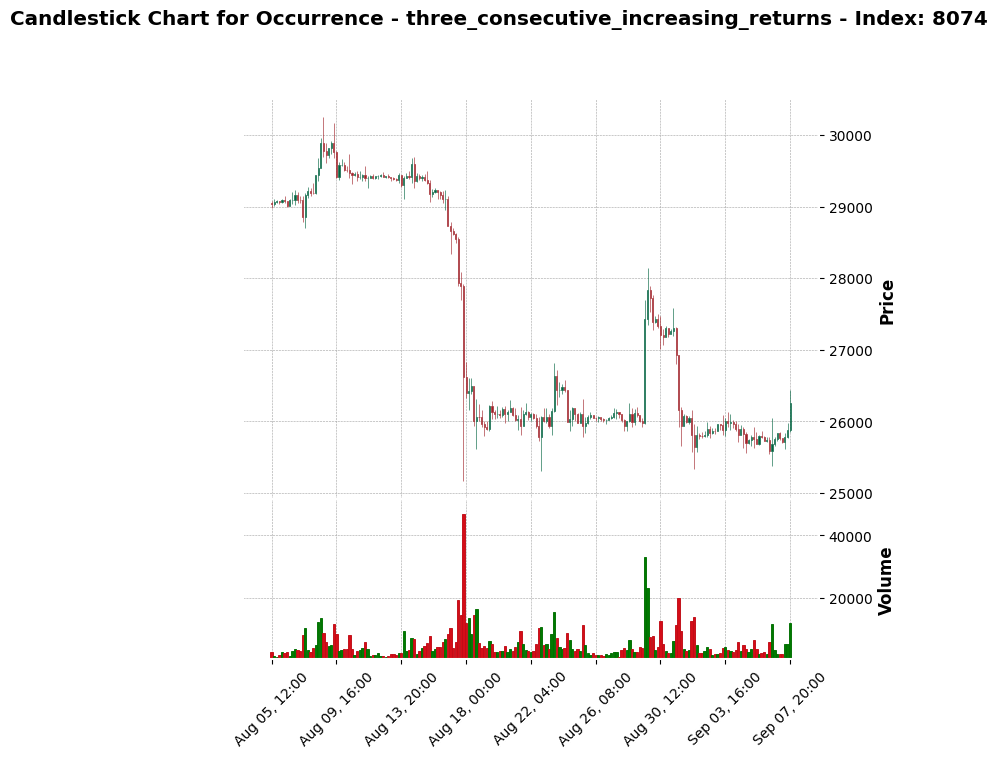

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

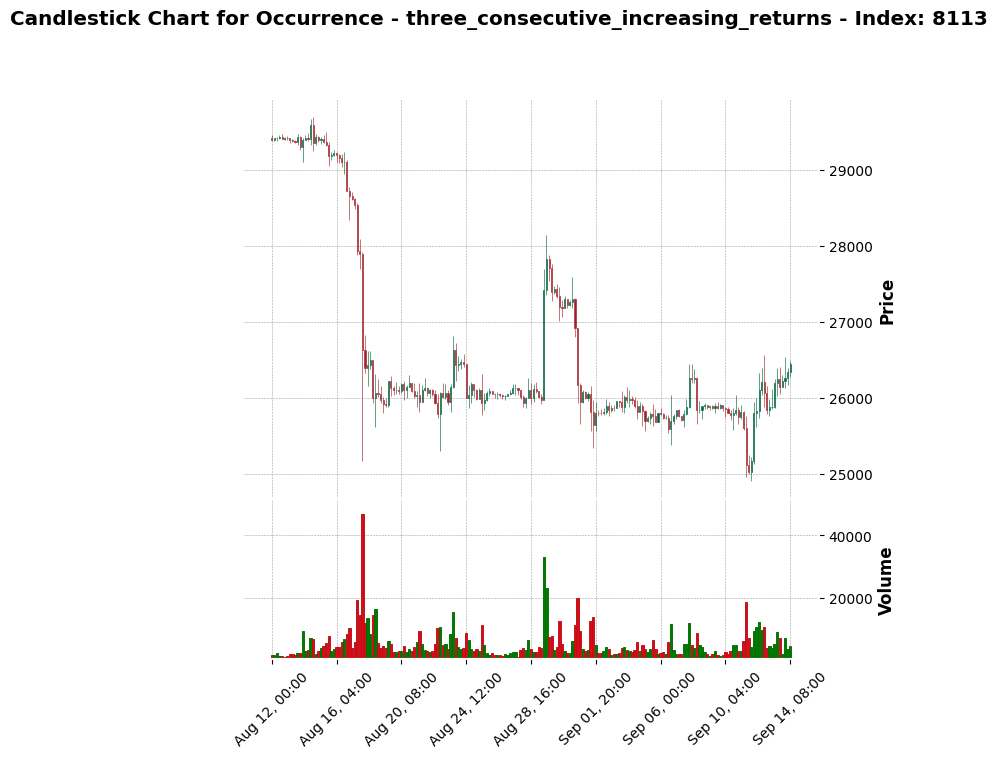

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

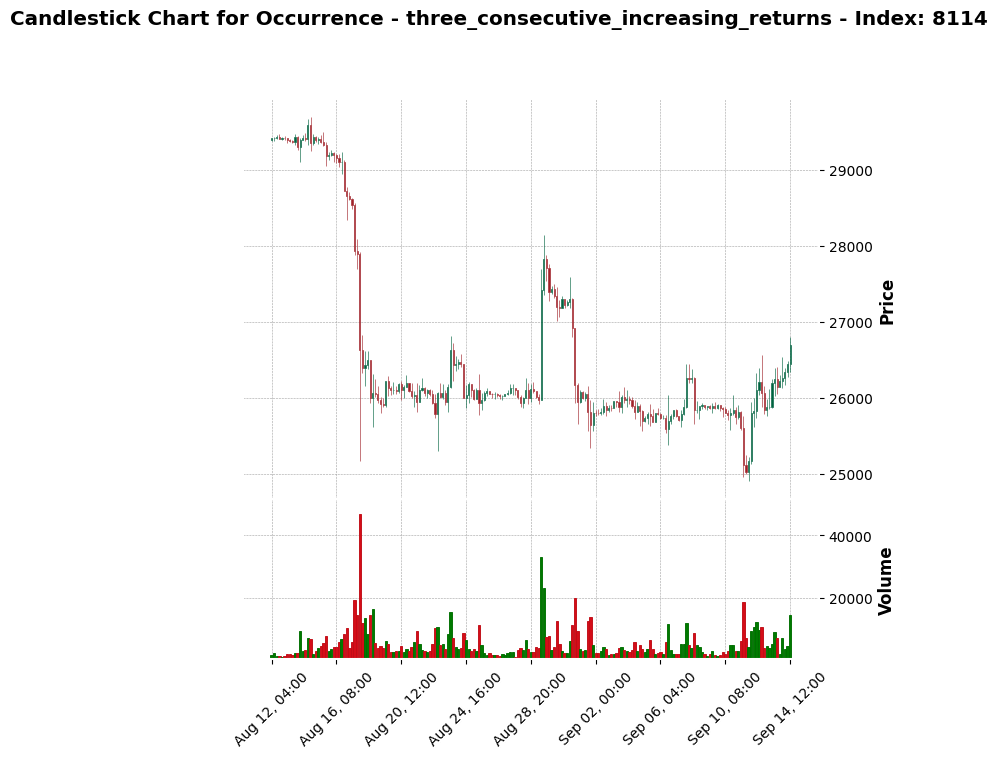

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

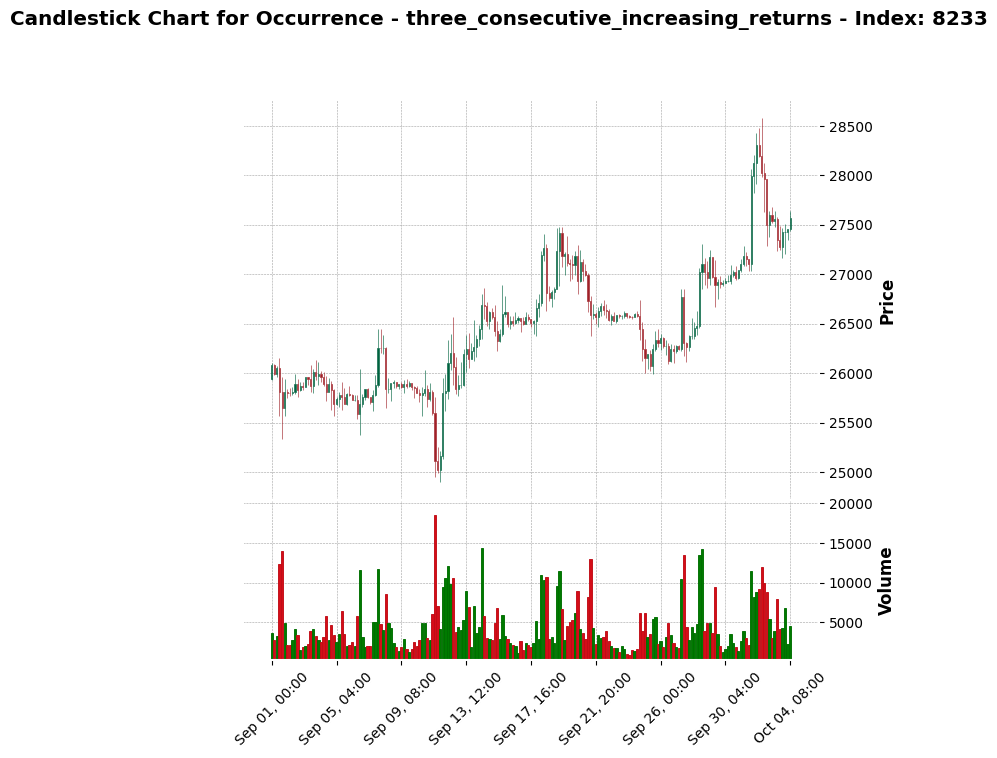

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

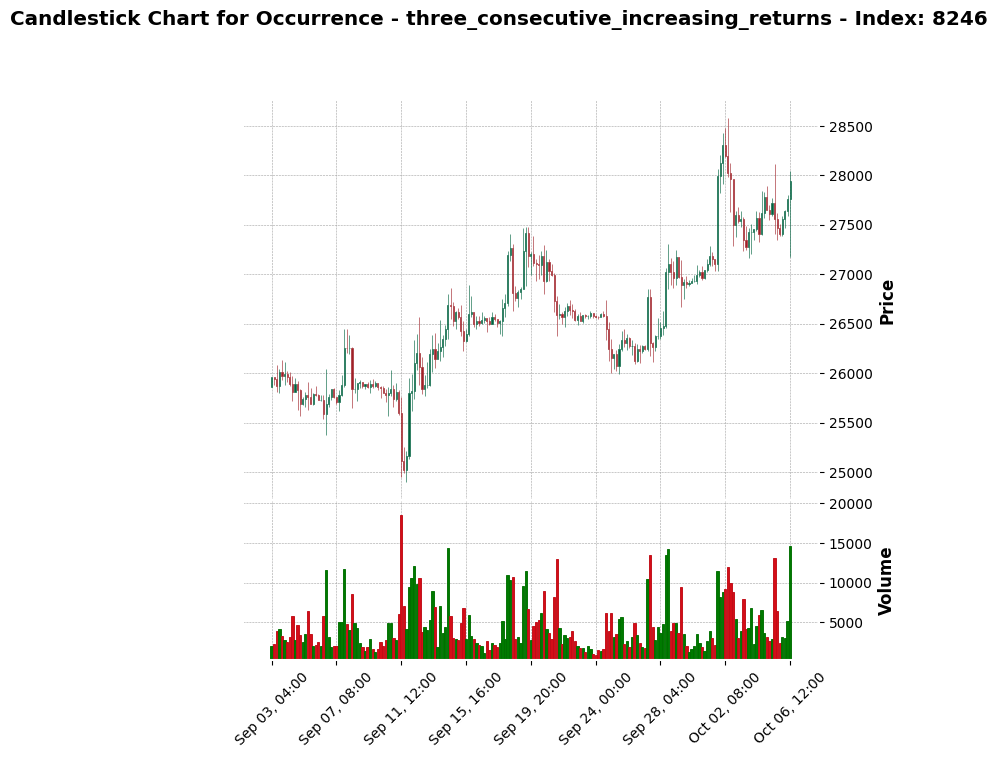

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

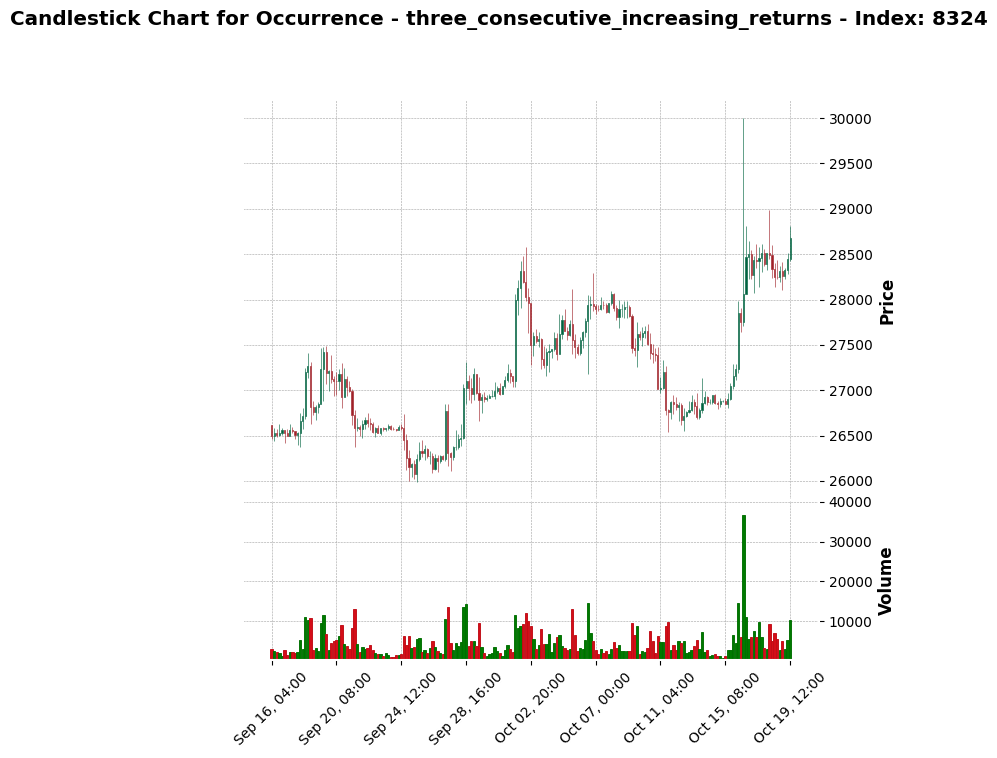

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

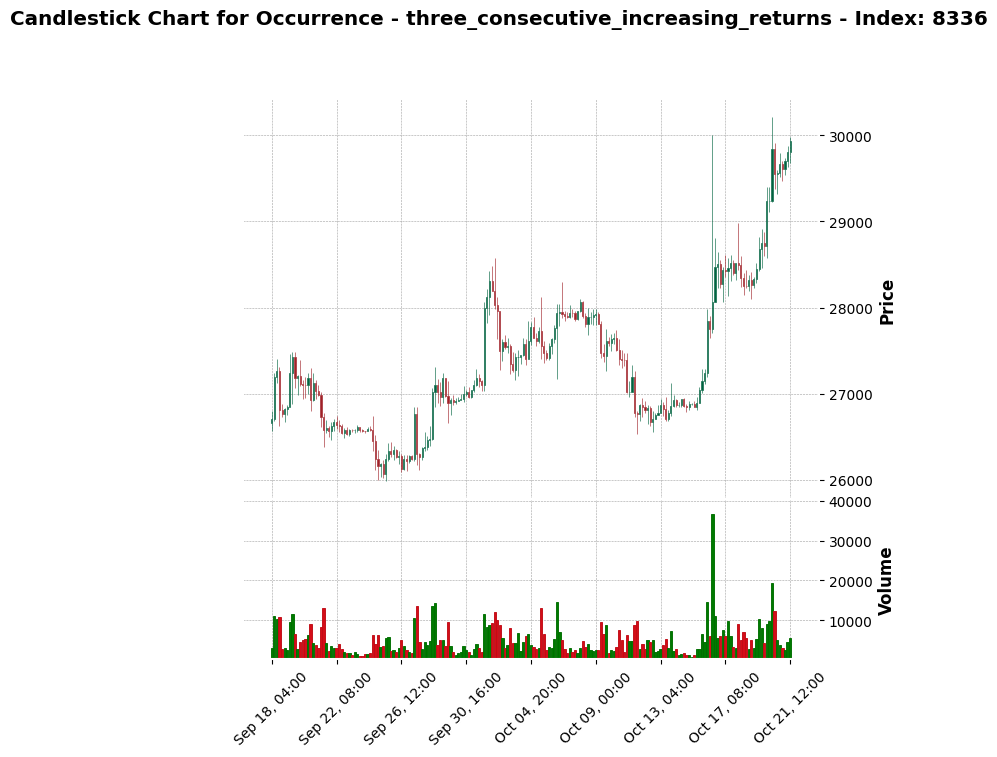

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

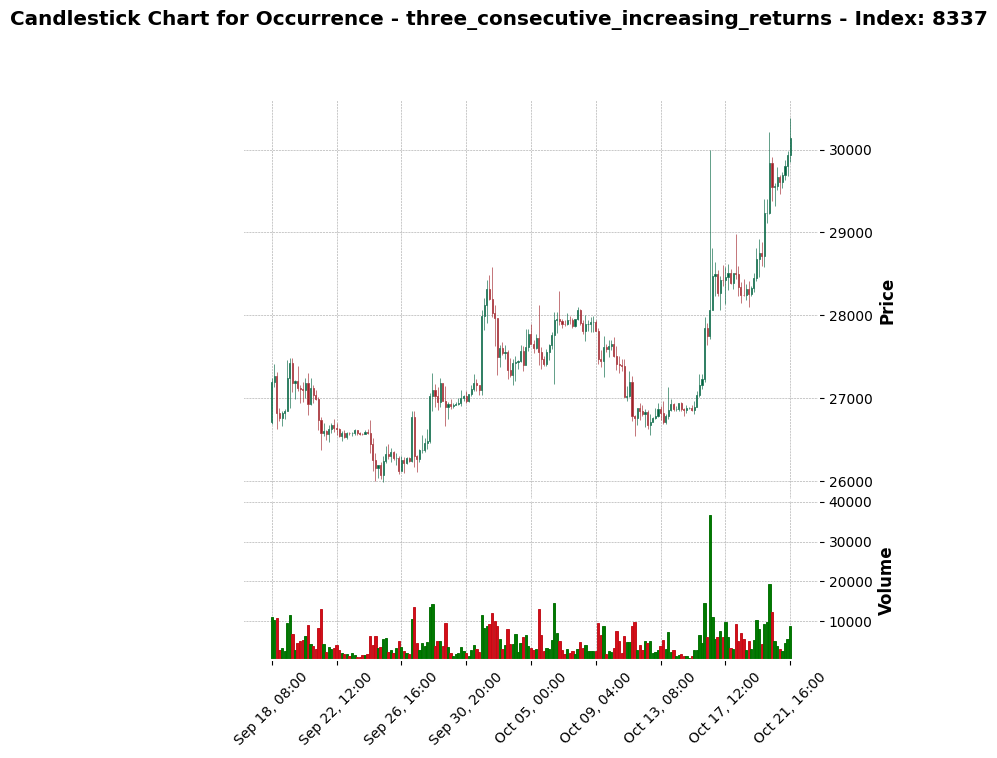

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

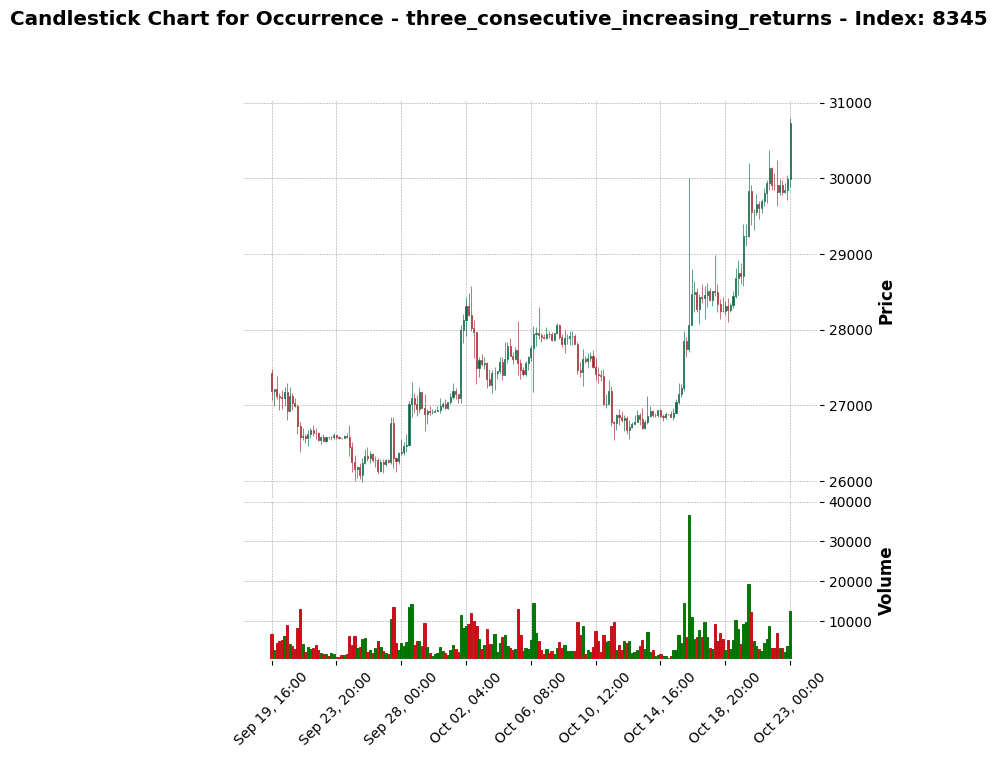

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

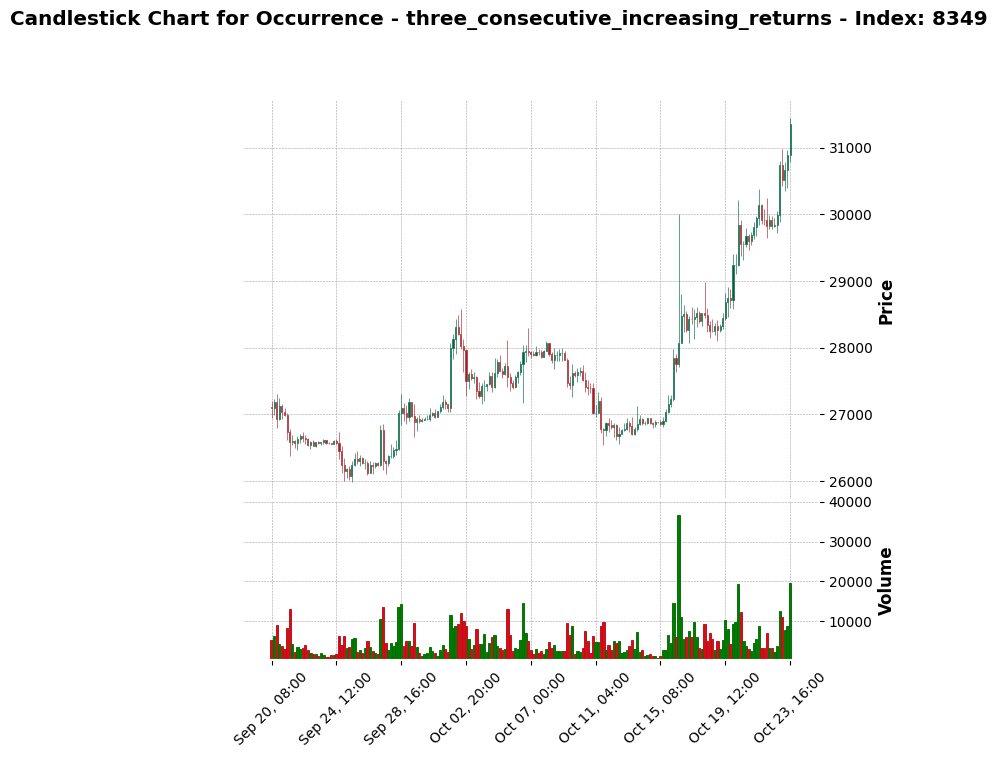

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

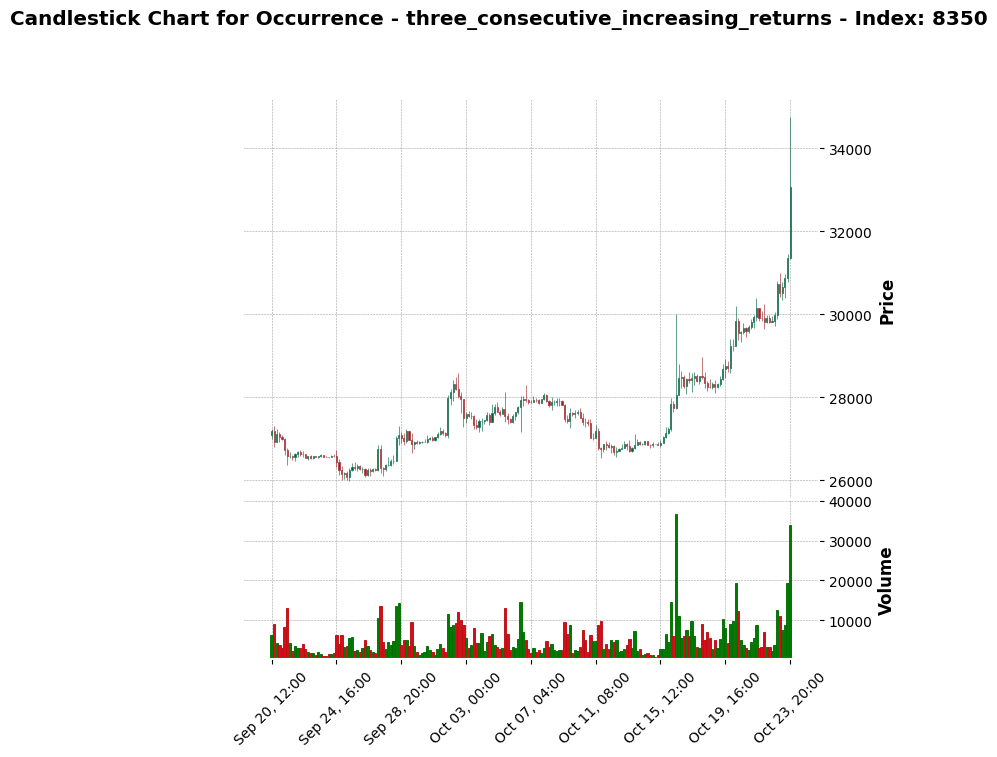

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

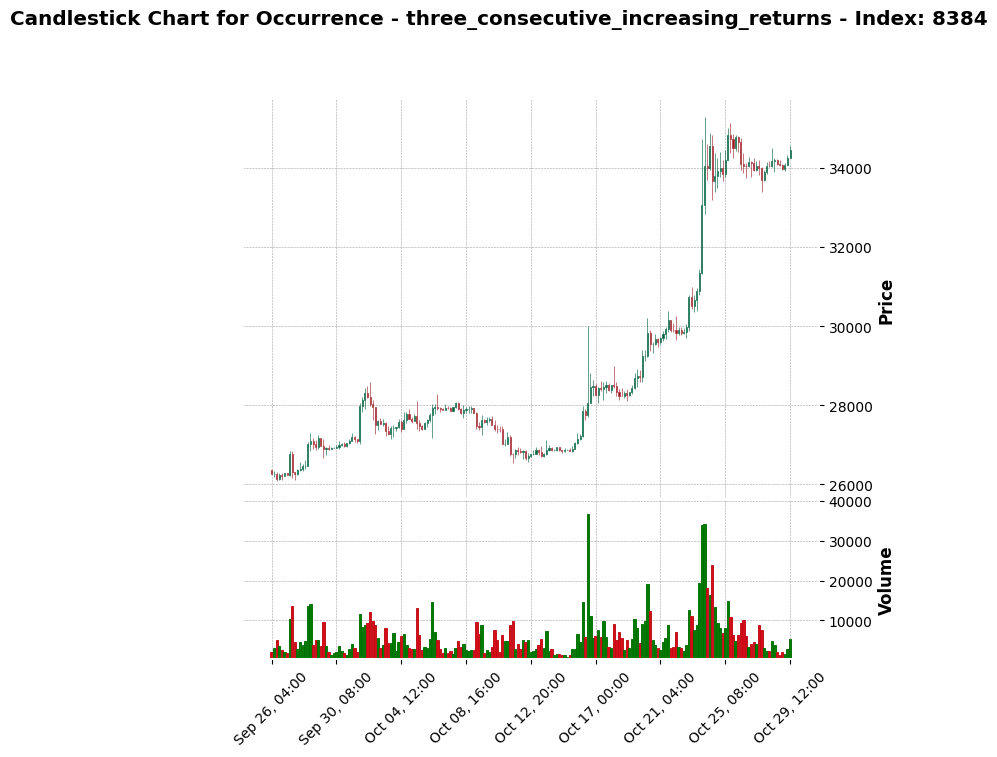

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

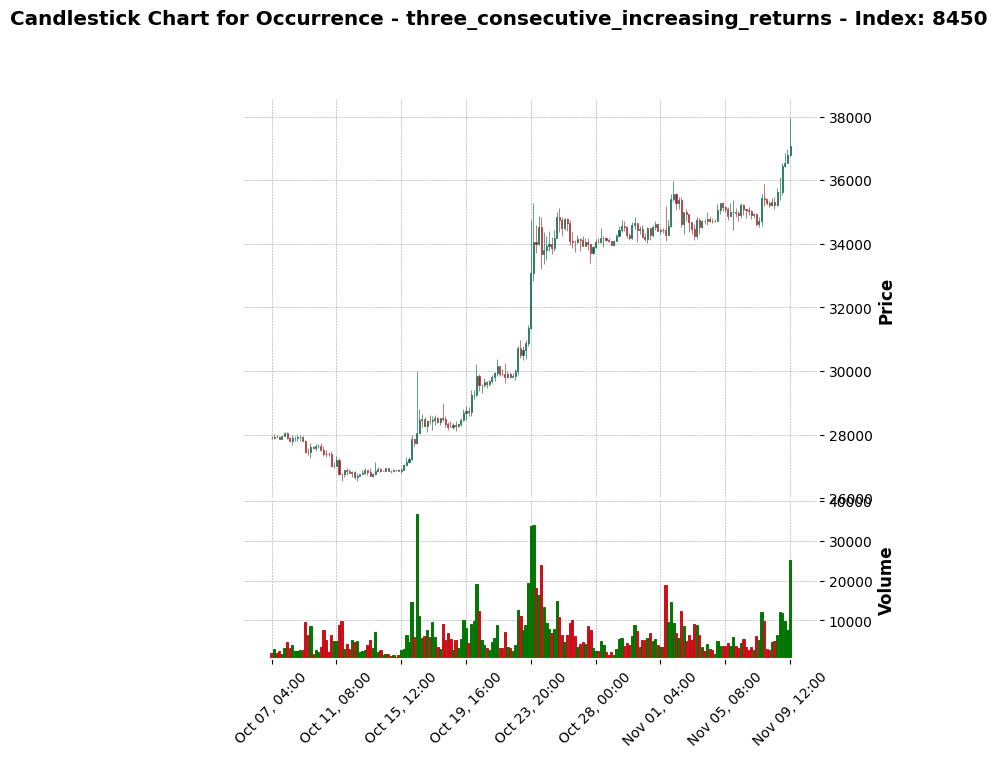

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

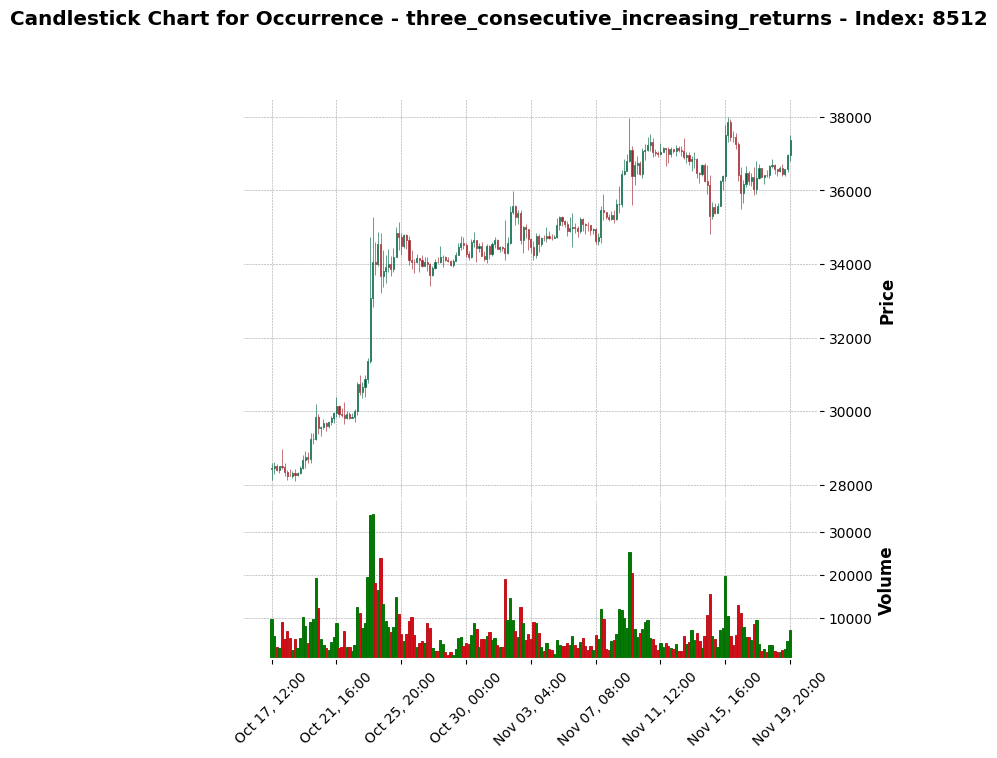

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

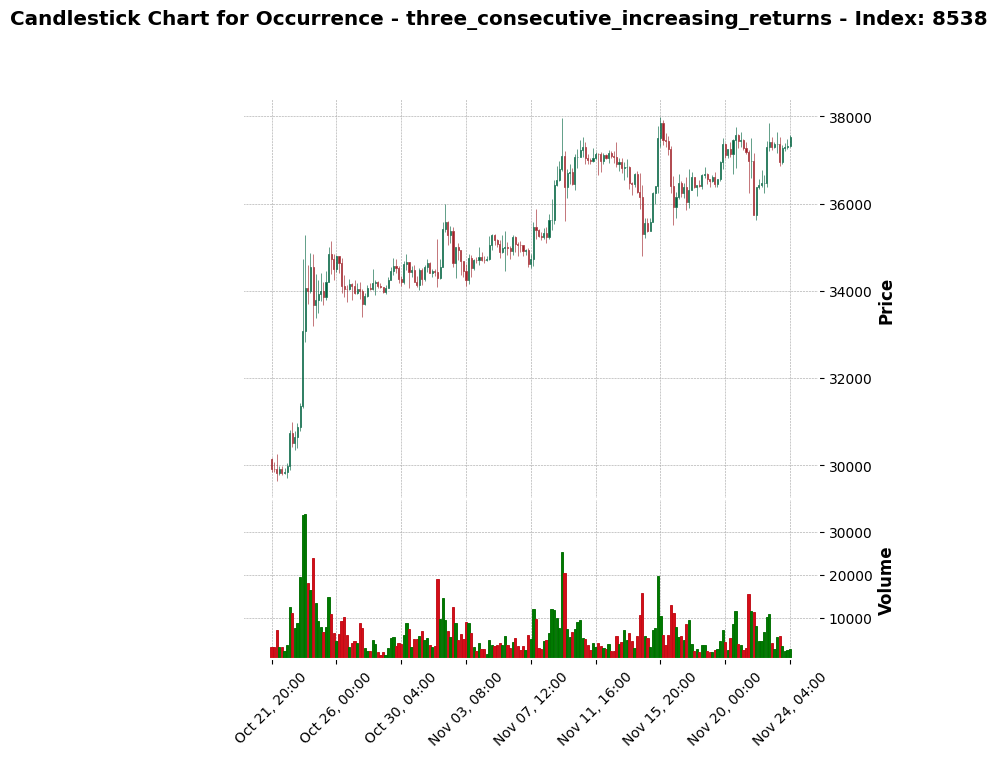

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

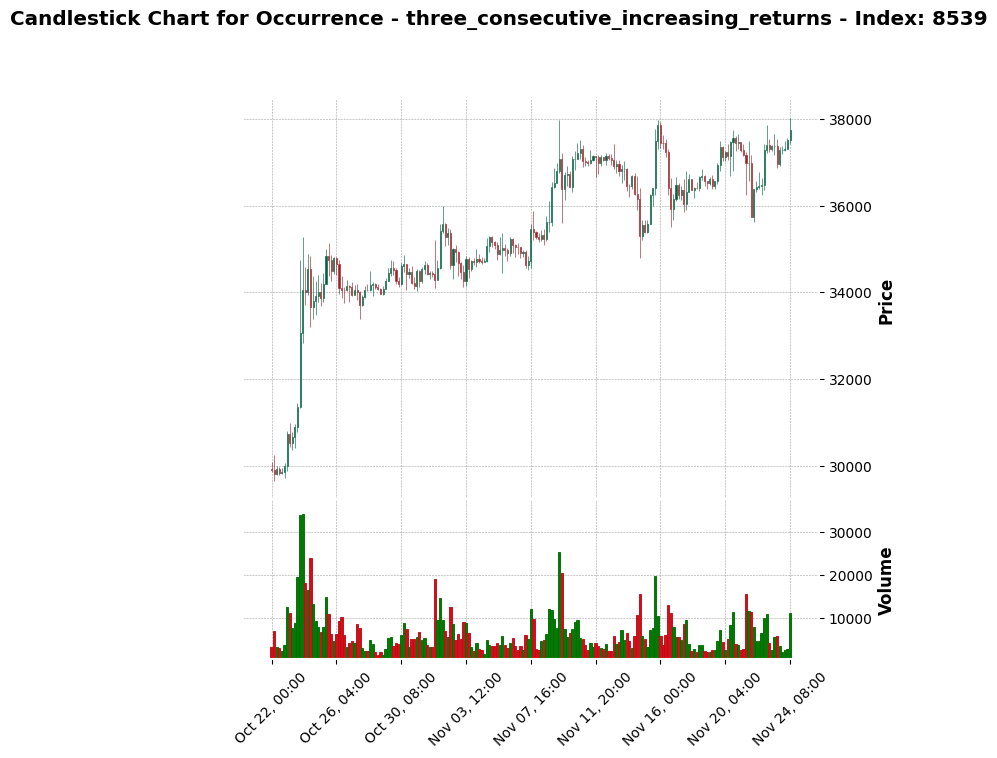

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

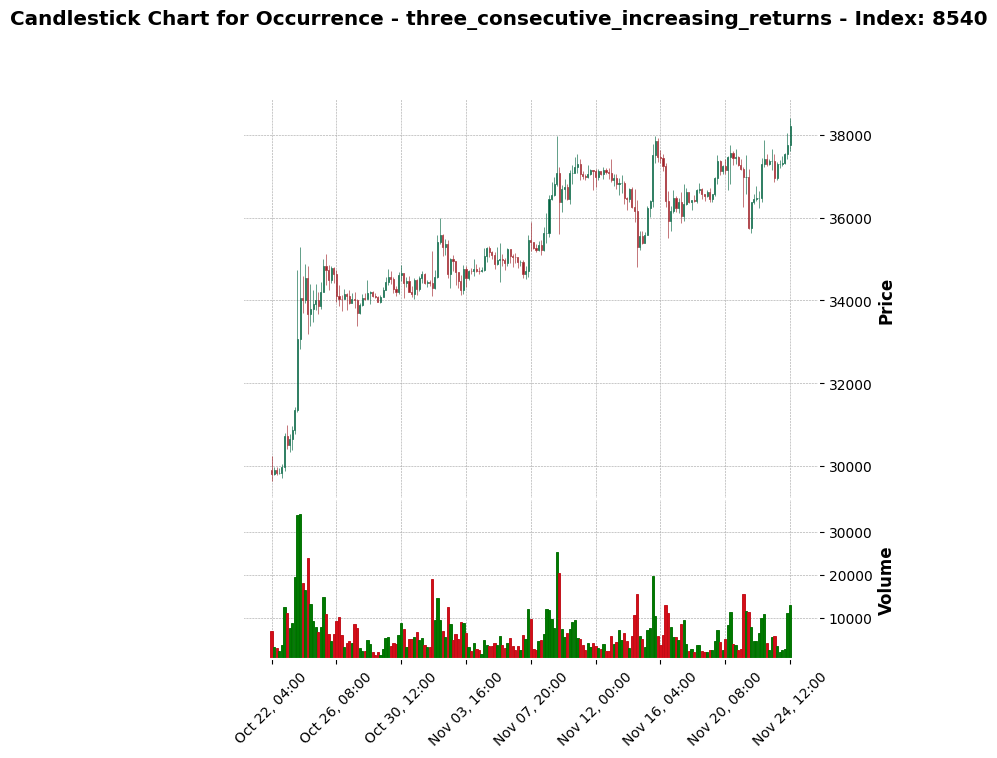

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

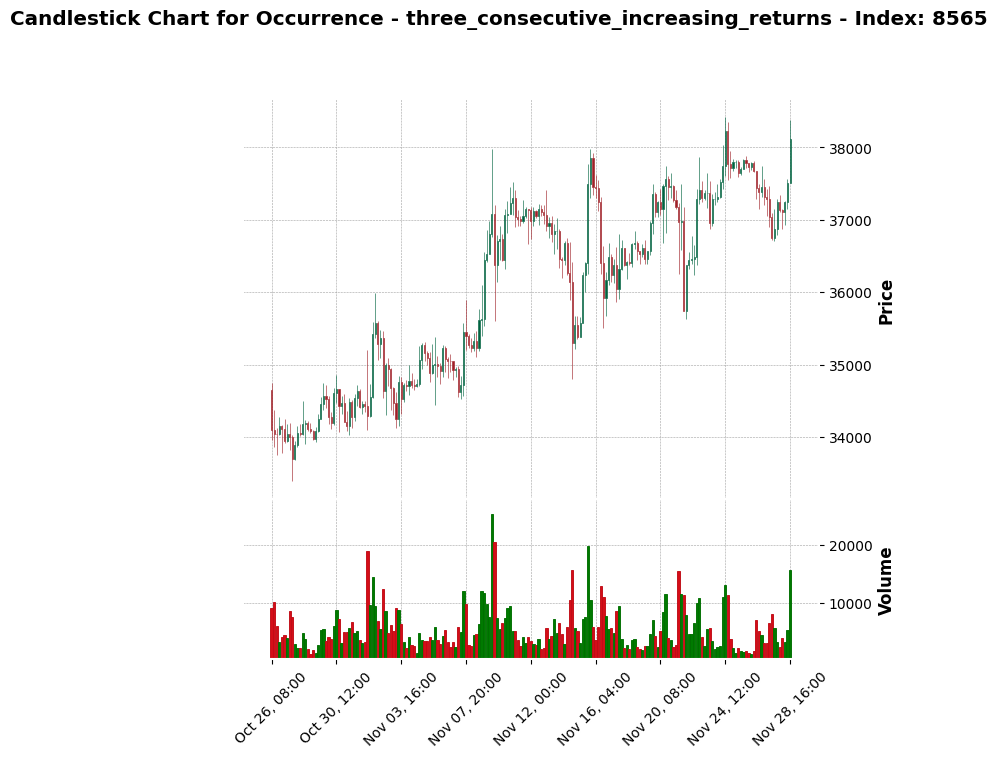

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

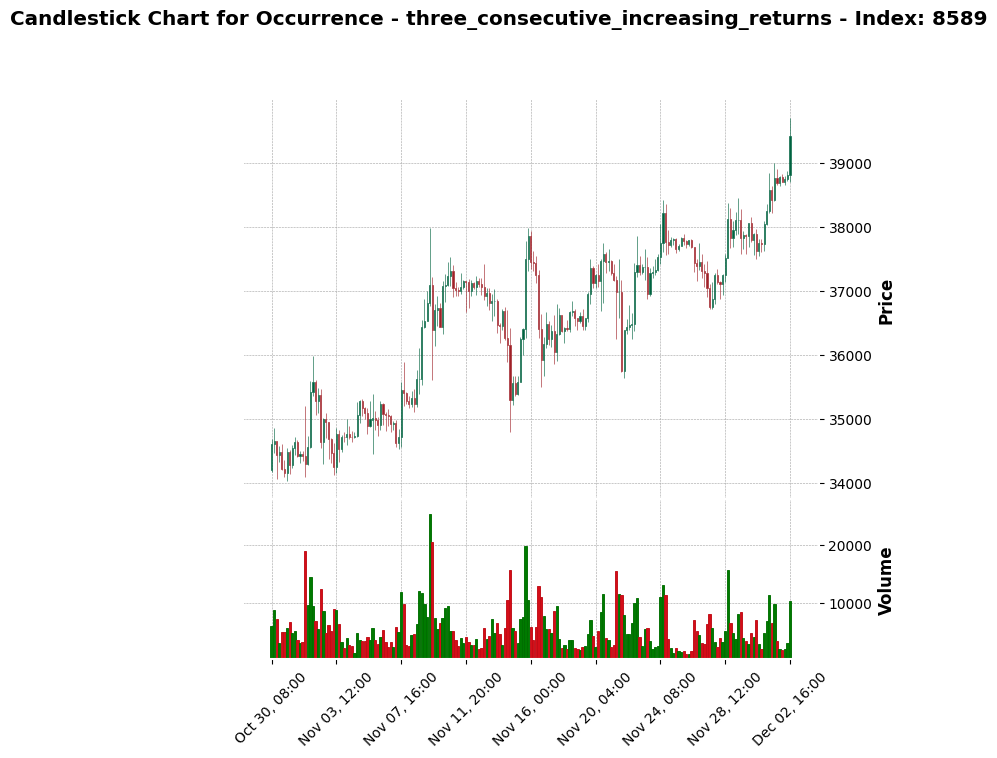

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

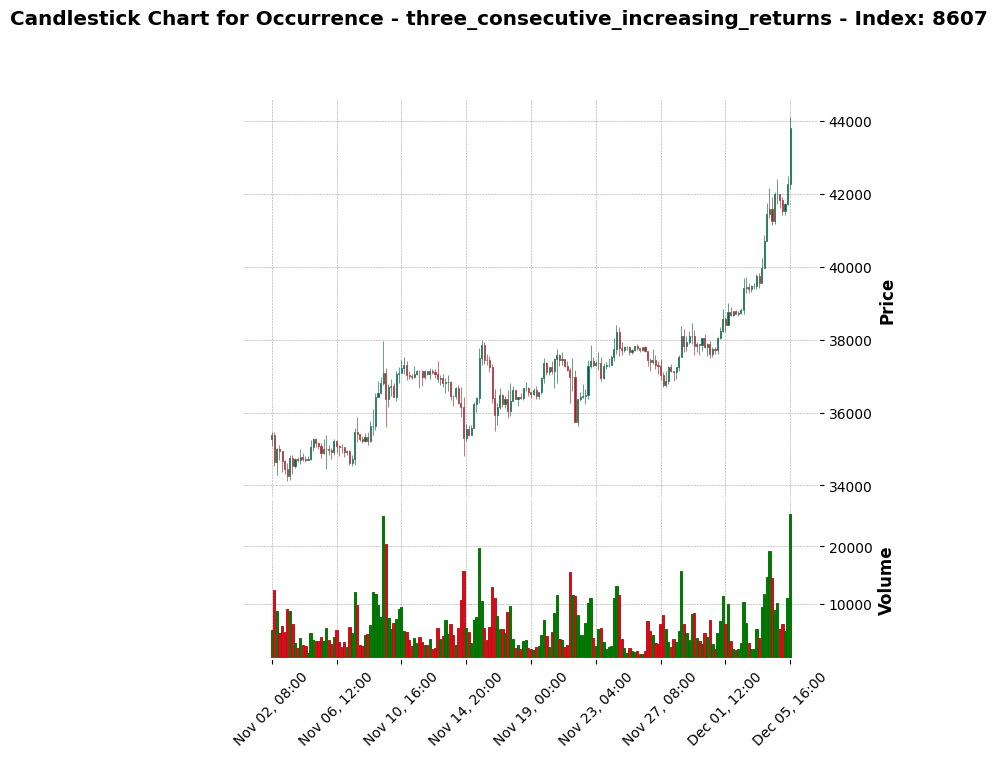

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

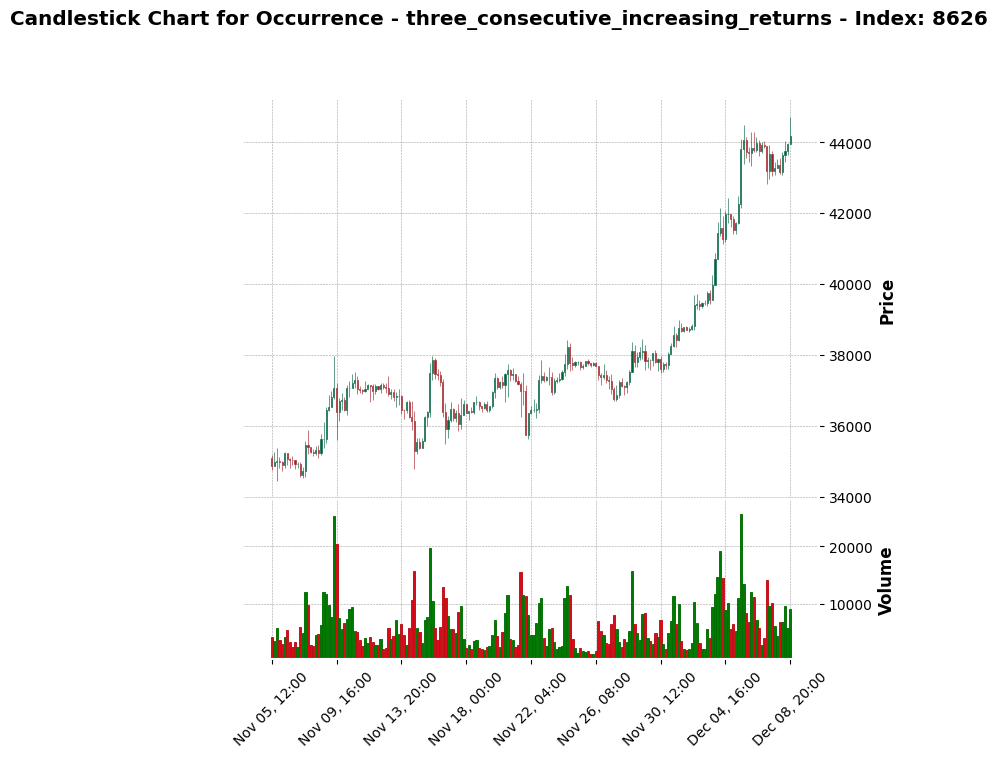

C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, column + '_norm'] = (df[column] - min_price) / (max_price - min_price)
C:\Users\nabil\AppData\Local\Temp\ipykernel_19876\155588992.py:86: SettingWithCopyWarning: 
A value is trying to be set on a

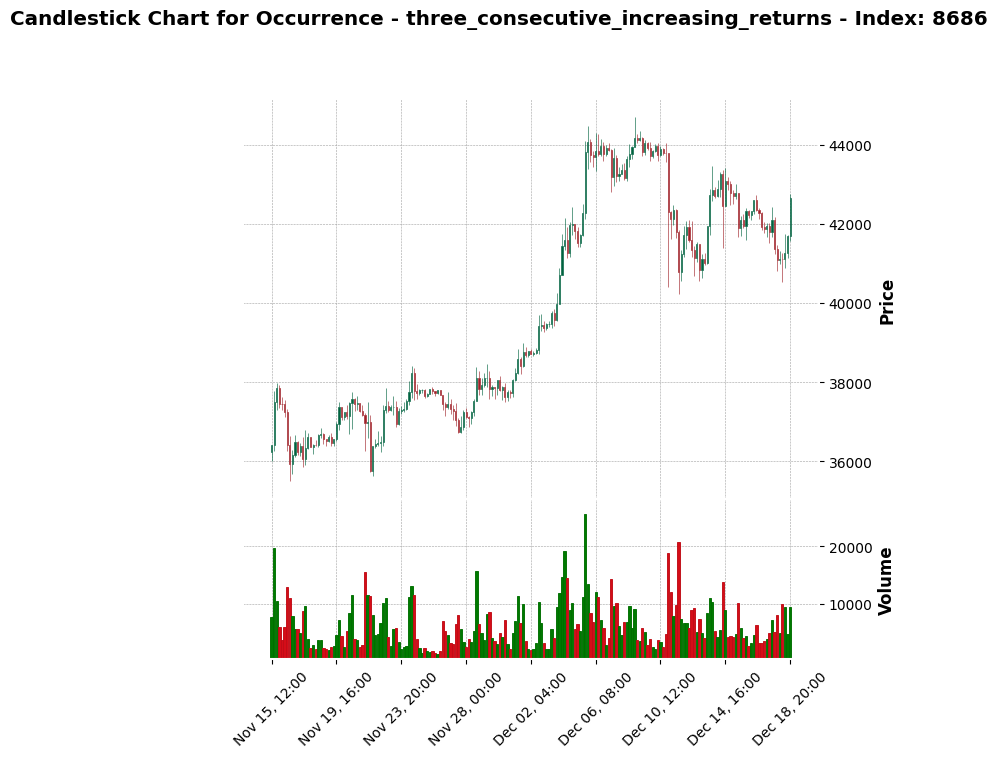

In [8]:
selected_symbol = 'BTCUSDT'
selected_interval = '4h'

selected_data = loaded_data.get(f'{selected_symbol}_{selected_interval}')

if selected_data is not None:
    # Create an OccurrenceFinder object
    occurrence_finder = OccurrenceFinder(selected_data)

    # Retrieve available move types
    available_moves = occurrence_finder.available_moves()
    print("Available Move Types:", available_moves)

    # Choose a move type
    selected_move_type = 'three_consecutive_increasing_returns'

    # Plot occurrences for the selected move type
    occurrence_finder.plot_occurrence_bars(selected_move_type, max_window=200)

else:
    print(f"No data found for {selected_symbol} - {selected_interval}")


Now these charts need to be converted into tagged images that we will use to train our model. Our aim is to teach our model 

In [40]:
occurrence_finder.samples[0]

,open,high,low,close,volume,close_time,open_norm,high_norm,low_norm,close_norm,volume_norm
open_time,,,,,,,,,,,
2020-12-19 01:00:00,0.028276,0.028291,0.027930,0.028167,13321.525,2020-12-19 01:59:59.999,0.939435,0.941987,0.880572,0.920891,0.106314
2020-12-19 02:00:00,0.028164,0.028369,0.028130,0.028312,10449.484,2020-12-19 02:59:59.999,0.920381,0.955257,0.914597,0.945560,0.076534
2020-12-19 03:00:00,0.028315,0.028442,0.028295,0.028356,8573.839,2020-12-19 03:59:59.999,0.946070,0.967676,0.942668,0.953045,0.057085
2020-12-19 04:00:00,0.028356,0.028482,0.028326,0.028408,8384.335,2020-12-19 04:59:59.999,0.953045,0.974481,0.947941,0.961892,0.055120
2020-12-19 05:00:00,0.028406,0.028507,0.028356,0.028421,10186.615,2020-12-19 05:59:59.999,0.961552,0.978734,0.953045,0.964103,0.073808
...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27 10:00:00,0.023277,0.023288,0.023195,0.023239,14798.772,2020-12-27 10:59:59.999,0.088976,0.090847,0.075026,0.082511,0.121632
2020-12-27 11:00:00,0.023240,0.023299,0.022754,0.023108,50043.014,2020-12-27 11:59:59.999,0.082681,0.092719,0.000000,0.060225,0.487084
2020-12-27 12:00:00,0.023108,0.023761,0.023097,0.023327,43469.067,2020-12-27 12:59:59.999,0.060225,0.171317,0.058353,0.097482,0.418918


In [43]:
import numpy as np
def prepare_images(samples, window):
    images = []
    ids = []
    i=0
    for df_sample in samples:
        # Extract the normalized values as a 5x50 numpy array
        norm_values = df_sample[['open_norm', 'high_norm', 'low_norm', 'close_norm', 'volume_norm']].iloc[:window].to_numpy().transpose()
        # Reshape to 50x5x1 to match the input shape that the CNN model expects
        norm_values = norm_values.reshape(window, 5, 1)
        images.append(norm_values)
        ids.append(i)  # Use the sample index as a unique ID
        i=i+1
    return np.array(images), np.array(ids)

window_size=len(occurrence_finder.samples[0])
# Prepare the images and image IDs
train_images, image_ids = prepare_images(occurrence_finder.samples, window_size)

In [ ]:
from sklearn.cluster import KMeans

# Flatten the images into 1D array since KMeans does not accept 3D input
train_images_flattened = train_images.reshape(train_images.shape[0], -1)

# n_clusters is (arbitrarily) set to 10, but should be chosen based on your expected number of classes
kmeans = KMeans(n_clusters=5, random_state=0)

# Fit the model
kmeans.fit(train_images_flattened)

In [44]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Define the CNN model
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(window_size, 5, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Prepare labels (assuming binary classification, you may need to modify accordingly)
labels = np.zeros(len(image_ids))  # Replace this with your actual labels

# Train the model
model.fit(train_images, labels, epochs=10, batch_size=32, validation_split=0.2)








Epoch 1/10


1/1 [==============================] - 1s 677ms/step - loss: 0.7031 - accuracy: 0.2500 - val_loss: 0.4556 - val_accuracy: 1.0000
Epoch 2/10
1/1 [==============================] - 0s 28ms/step - loss: 0.4807 - accuracy: 1.0000 - val_loss: 0.3123 - val_accuracy: 1.0000
Epoch 3/10
1/1 [==============================] - 0s 28ms/step - loss: 0.3454 - accuracy: 1.0000 - val_loss: 0.2057 - val_accuracy: 1.0000
Epoch 4/10
1/1 [==============================] - 0s 26ms/step - loss: 0.2389 - accuracy: 1.0000 - val_loss: 0.1309 - val_accuracy: 1.0000
Epoch 5/10
1/1 [==============================] - 0s 26ms/step - loss: 0.1598 - accuracy: 1.0000 - val_loss: 0.0803 - val_accuracy: 1.0000
Epoch 6/10
1/1 [==============================] - 0s 25ms/step - loss: 0.1031 - accuracy: 1.0000 - val_loss: 0.0479 - val_accuracy: 1.0000
Epoch 7/10
1/1 [==============================] - 0s 26ms/step - loss: 0.0648 - accuracy: 1.0000 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 8/10
1/1 [====

In [58]:
import requests
import pandas as pd
from datetime import datetime
import pandas as pd
import requests
import json
import datetime
import mplfinance as mpf
import matplotlib.pyplot as plt

def prepare_images(df, window_size):
    images = []
    ids = []

    for i in range(len(df) - window_size + 1):
        # Extract the normalized values as a 5x50 numpy array
        norm_values = df[['open_norm', 'high_norm', 'low_norm', 'close_norm', 'volume_norm']].iloc[i:i+window_size].to_numpy().transpose()
        # Reshape to 50x5x1 to match the input shape that the CNN model expects
        norm_values = norm_values.reshape(window_size, 5, 1)
        images.append(norm_values)
        ids.append(i)  # Use the index as a unique ID

    return np.array(images), np.array(ids)

def fetch_last_ohlcv(symbol, interval, limit, window_size):
    url = f"https://api.binance.com/api/v3/klines?symbol={symbol}&interval={interval}&limit={limit}"

    raw_data = requests.get(url).text
    data = json.loads(raw_data)
    df = pd.DataFrame(data, columns=['open_time', 'open', 'high', 'low', 'close', 'volume', 'close_time', 'quote_asset_volume', 'trades', 'taker_buy_base', 'taker_buy_quote', 'ignored'])

    # Convert times to more readable format
    df['open_time'] = pd.to_datetime(df['open_time'], unit='ms')
    df['close_time'] = pd.to_datetime(df['close_time'], unit='ms')

    # Convert prices and volume to float
    df[['open', 'high', 'low', 'close', 'volume']] = df[['open', 'high', 'low', 'close', 'volume']].astype(float)

    df = df[['open_time', 'open', 'high', 'low', 'close', 'volume', 'close_time']]  # Keep only OHLCV data

    max_price = df[['open', 'high', 'low', 'close']].max().max()
    min_price = df[['open', 'high', 'low', 'close']].min().min()

    for column in ['open', 'high', 'low', 'close']:
        df[column + '_norm'] = (df[column] - min_price) / (max_price - min_price)

    # Normalize Volume
    df['volume_norm'] = (df['volume'] - df['volume'].min()) / (df['volume'].max() - df['volume'].min())

    new_image, _ = prepare_images(df, window_size)

    norm_values = df[['open_time', 'open_norm', 'high_norm', 'low_norm', 'close_norm', 'volume_norm']]
    print(norm_values.head(10))
    ohlc = df[['open_time', 'open', 'high', 'low', 'close', 'volume']]
    
    ohlc.set_index('open_time', inplace=True)
    # OHLC chart for original data
    mpf.plot(ohlc, type='candle', style='charles', title=f"Original Data for {symbol}", volume=True)

    norm_values.set_index('open_time', inplace=True)
    # OHLC chart for normalized data
    mpf.plot(norm_values, type='candle', style='charles', title=f"Sample Normalized Data for {symbol}", volume=True)
    
    # 5x50 pixel based image for normalized data
    #plt.imshow(norm_values.transpose(), cmap='gray', aspect='auto')
    return new_image



            open_time  open_norm  high_norm  low_norm  close_norm  volume_norm
0 2024-01-19 15:50:00   0.372922   0.396357  0.359359    0.372776     0.144175
1 2024-01-19 15:55:00   0.372776   0.389178  0.318803    0.320686     0.165113
2 2024-01-19 16:00:00   0.320686   0.344063  0.319371    0.341694     0.176303
3 2024-01-19 16:05:00   0.341694   0.351403  0.293866    0.300079     0.192380
4 2024-01-19 16:10:00   0.300079   0.332768  0.273270    0.273275     0.232173
5 2024-01-19 16:15:00   0.273275   0.289051  0.234759    0.243169     0.226984
6 2024-01-19 16:20:00   0.243169   0.291623  0.166940    0.251922     0.643253
7 2024-01-19 16:25:00   0.251922   0.261417  0.131465    0.172282     0.586593
8 2024-01-19 16:30:00   0.172287   0.179982  0.104337    0.179982     0.627123
9 2024-01-19 16:35:00   0.179982   0.198815  0.085557    0.090294     0.447052


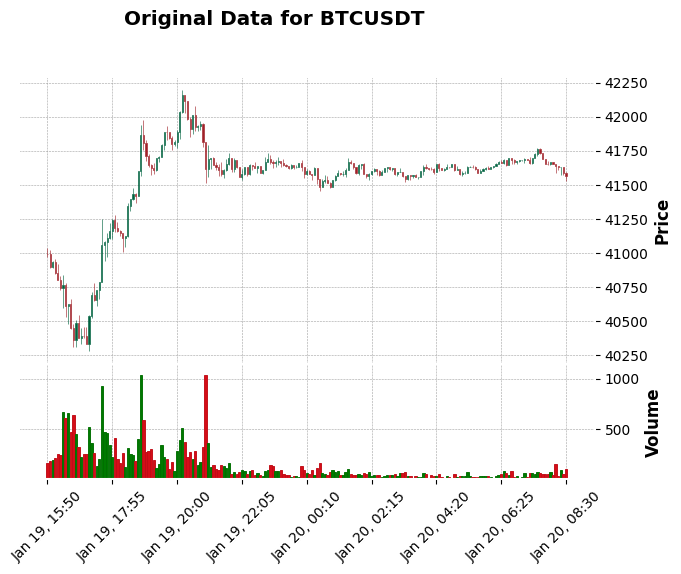

ValueError: Column "Open" NOT FOUND in Input DataFrame!
            CHECK that your column names are correct AND/OR
            CHECK for leading or trailing blanks in your column names.

In [59]:
symbols = ['BTCUSDT', 'ALPINEUSDT', 'XRPUSDT','ADAUSDT','LINKUSDT']
interval = '5m'
limit = 201
window_size = 201  # Adjust this value based on your requirements
for symbol in symbols:
    new_image = fetch_last_ohlcv(symbol, interval, limit, window_size)
    new_image = np.expand_dims(new_image, axis=0)  # Add batch dimension
    # Predict probability for the new image
    probability = model.predict(new_image)
    print(f"Probability that the new image belongs to the same class: {probability[0][0]}")



In [48]:
new_image = np.expand_dims(new_image, axis=0)  # Add batch dimension

# Predict probability for the new image
probability = model.predict(new_image)

print(f"Probability that the new image belongs to the same class: {probability[0][0]}")

# Now you can use the trained model to predict probabilities for new images
# Replace 'new_image' with your actual new image data
#new_image = np.random.random((window_size, 5, 1))  # Example random data


1/1 [==============================] - 0s 48ms/step
Probability that the new image belongs to the same class: 0.009285279549658298
